In [389]:
from commons import *
from libruntimepredictionanalysis import *

In [515]:
# read in data
df = pd.read_csv("data/runtimes/runtimes_atomic_nooutliers.csv")
df["fittime"] /= 1000 # talk about seconds here
df["applicationtime"] /= 1000 # talk about seconds here
df["applicationtimeperunit"] = df["applicationtime"] / df["applicationsize"]
df["applicationtimeperkinstances"] = np.minimum(df["applicationtimeperunit"] * 1000, 10**8)
df["fitattributes"] = df["numattributes"]

In [516]:
dfDefault = df[df["algorithmoptions"].isnull()]
dfConfigured = df[df["algorithmoptions"].notnull()]

In [517]:
datasets = sorted(pd.unique(df["openmlid"]))
algorithms = pd.unique(df["algorithm"])
preprocessors = [a for a in algorithms if a not in classifiers]
algorithms = sorted(preprocessors) # reset algorithms
for a in sorted(classifiers):
    algorithms.append(a)
fitsizes = sorted(pd.unique(df["fitsize"]))

In [518]:
learners = ["linear", "ann", "forest"]

In [519]:
algorithmshortcuts = {
    'bestfirst_cfssubseteval': 'se-bf',
    'greedystepwise_cfssubseteval': "se-gs",
    'ranker_correlationattributeeval': "cr",
    'ranker_gainratioattributeeval': "gr",
    'ranker_infogainattributeeval': "ig",
    'ranker_onerattributeeval': "or",
    'ranker_principalcomponents': "pca",
    'ranker_relieffattributeeval': 're',
    'ranker_symmetricaluncertattributeeval': 'su',
    'bayesnet': 'bn',
    'decisionstump': "ds",
    'decisiontable': "dt",
    'ibk': "ibk",
    'j48': "j48",
    'jrip': "jrip",
    'kstar': "k*",
    'lmt': "lmt",
    'logistic': "lr",
    'multilayerperceptron': "ann",
    'naivebayes': "nb",
    'naivebayesmultinomial': "nbm",
    'oner': "1-r",
    'part': "part",
    'randomforest': "rf",
    'randomtree': "rt",
    'reptree': "rep",
    'simplelogistic': "sl",
    'sl': "sl2",
    'smo': "smo",
    'votedperceptron': "vp",
    'zeror': "0-r"
}

featureAliases = {
    'fitsize': "ni",
    'numattributes': "na",
    'numlabels': "nl",
    'numnumericattributes': "nn",
    'numsymbolicattributes': "ns",
    'numberofcategories': "nc",
    'numericattributesafterbinarization': "nab",
    'totalvariance': "tv",
    'attributestocover50pctvariance': "v50",
    'attributestocover90pctvariance': "v90",
    'attributestocover95pctvariance': "v95",
    'attributestocover99pctvariance': "v99"
}
learnerAliases = {
    'ann': 'ANN',
    'forest': 'RF',
    'linear': 'LR'
}

# 1. Preliminaries: Classifier Runtime Visualizations

## 1.1. Train- and Prediction/Application times against Trainpoints
Idea: Most algorithms are probably *either* fast in training *or* in predicting. That means that test times of slow-training algorithms are negligibly why prediction-times of slow-predictors can be precisely estimated by training the model an predicting k (k small) instances and interpolating exploiting linearity of total test time.

To this end, we want to know:
* what is, for each classifier, the test time per instance for different train sizes?

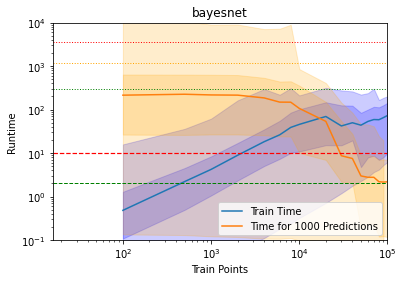

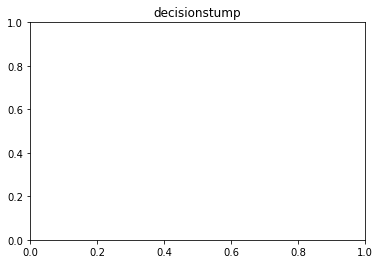

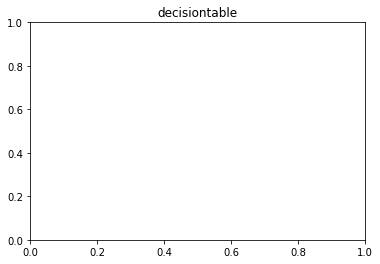

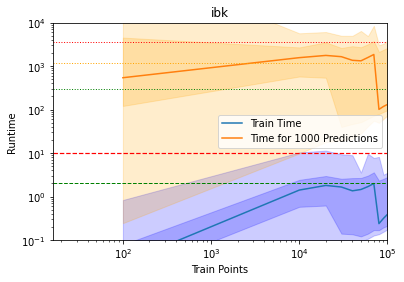

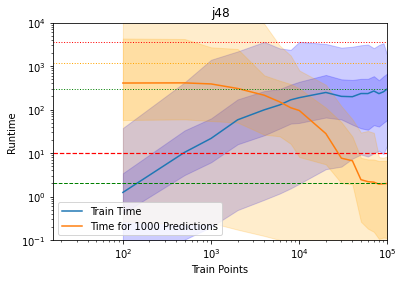

...

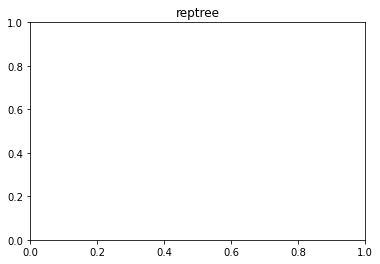

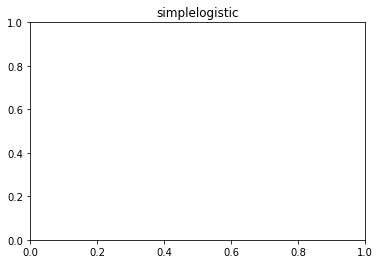

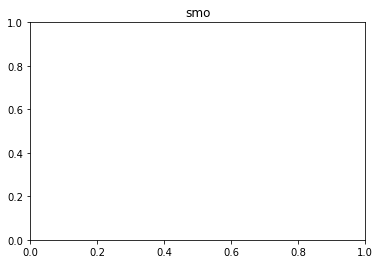

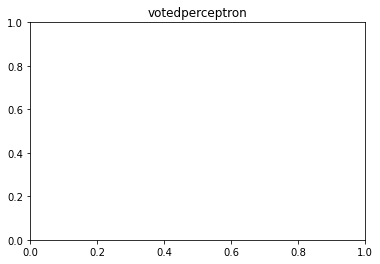

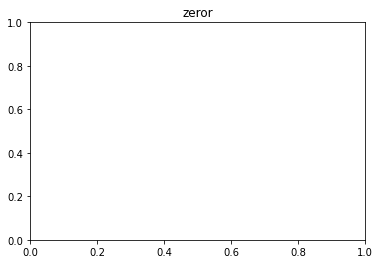

In [520]:
numPredictions = 1000
legend=["Train Time", "Time for " + str(numPredictions) +" Predictions"]
for i, c in enumerate(algorithms):
    cData = df.query("algorithm == '" + c + "'")
    trainpoints = np.unique(cData["fitsize"].values)
    trainpoints = trainpoints[trainpoints >= 10]
    q1aPointsY = []
    q3aPointsY = []
    q1bPointsY = []
    q3bPointsY = []
    medianPointsY = []
    q1aPointsZ = []
    q3aPointsZ = []
    q1bPointsZ = []
    q3bPointsZ = []
    medianPointsZ = []
    validTrainPoints = []
    #pointsY = []
    for tp in trainpoints:
        rData = cData.query("fitsize == " + str(tp))
        y = numPredictions * rData["applicationtimeperunit"]
        y = y[~np.isnan(y)]
        z = rData["fittime"]
        #for i, v in enumerate(y):
        #    print(v)
        if len(y) > 4:
            validTrainPoints.append(tp)
            q1aPointsY.append(np.quantile(y, 0.05))
            q1bPointsY.append(np.quantile(y, 0.25))
            medianPointsY.append(np.median(y))
            q3aPointsY.append(np.quantile(y, 1))
            q3bPointsY.append(np.quantile(y, 0.75))
            
            q1aPointsZ.append(np.quantile(z, 0.05))
            q1bPointsZ.append(np.quantile(z, 0.25))
            medianPointsZ.append(np.median(z))
            q3aPointsZ.append(np.quantile(z, 1))
            q3bPointsZ.append(np.quantile(z, 0.75))
            #print(str(tp) + ": " + str(v))
        #meanPoints.append(np.mean(y))
        #pointsY.append(v)

    plt.figure()
    plt.title(c)# + " (train prediction RMSE quantile for 30s/1m/2m/5m/20m error: " + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 30), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 60), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 120), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 300), 2)) + "/" + str(np.round(sp.stats.percentileofscore(metricRMSETrain[:,i], 1200), 2)) + ")")
    #plt.boxplot(points, 0, '')
    if len(q1aPointsY) > 0:
        #plt.plot(validTainPoints, q1Points)
        plt.plot(validTrainPoints, medianPointsZ)
        plt.fill_between(validTrainPoints, q1aPointsZ, q3aPointsZ, color="blue",alpha=0.2)
        plt.fill_between(validTrainPoints, q1bPointsZ, q3bPointsZ, color="blue", alpha=0.2)
        plt.plot(validTrainPoints, medianPointsY)
        plt.fill_between(validTrainPoints, q1aPointsY, q3aPointsY, color="orange", alpha=0.2)
        plt.fill_between(validTrainPoints, q1bPointsY, q3bPointsY, color="orange", alpha=0.2)
        plt.axhline(10, color="red", linestyle="--", linewidth="1.2")
        plt.axhline(2, color="green", linestyle="--", linewidth="1")
        plt.axhline(300, color="green", linestyle=":", linewidth="1")
        plt.axhline(1200, color="orange", linestyle=":", linewidth="1")
        plt.axhline(3600, color="red", linestyle=":", linewidth="1")
        #plt.plot(validTainPoints, q3Points)
        #plt.xticks(trainpoints)
        #plt.scatter(trainpoints, meanPoints, color="green")
        #if len(points) > 0:
        plt.xlabel("Train Points")
        plt.ylabel("Runtime")
        plt.xscale("log")
        plt.xlim([16,100000])
        plt.ylim([0.1,10000])
        plt.yscale("log")
        plt.legend(legend)
    plt.show()
    plt.close()
        

**Conclusion**: The above figures suggest that the following classifiers have, even for large data, negligible train time (never more than 10s) and ...
* ... prediction time increasing with more train datapoints:
 * ibk
 * kstar
* ... constant prediction time:
 * nb
 * nbm
 * rt
 
The following algorithms have high train time (*all* of them have a prediction time that is independent of the used train data):
* ann (great train time predictability)
* bn (poor train time predictability)
* ds (poor train time predictability)
* dt (great train time predictability)
* j48 (great train time predictability)
* jrip (medium train time predictability)
* lmt (medium train time predictability)
* logistic (poor train time predictability)
* oner (medium train time predictability)
* part (medium train time predictability)
* rf (poor train time predictability)

## 1.2. Runtimes against (a) train size AND (b) number of numeric features

In [334]:
overviews = {}

In [335]:
def getRuntimePlotData(algorithm):
    attributeForAttributes = "fitattributes"
    classifierData = df.query("algorithm =='" + algorithm + "'")
    trainpoints = np.unique(classifierData["fitsize"])
    attributes = np.unique(classifierData[attributeForAttributes])
    
    #plt.figure()
    traintimes = np.empty((len(trainpoints), len(attributes)), dtype=object)
    testtimes = np.empty((len(trainpoints), len(attributes)), dtype=object)
    for i, tp in enumerate(trainpoints):
        for j, at in enumerate(attributes):
            vals = classifierData.query("fitsize == " + str(tp) + " and " + attributeForAttributes + " == " + str(at))
            if len(vals) > 0:
                traintimes[i][j] = vals["fittime"].values
                testtimes[i][j] = vals["applicationtimeperkinstances"].values
            else:
                traintimes[i][j] = float('nan')
                testtimes[i][j] = float('nan')
    return traintimes, testtimes

def tableMean(table):
    m = table.shape[0]
    n = table.shape[1]
    out = np.zeros((m, n))
    for i in range(m):
        for j in range(n):
            out[i,j] = np.median(table[i,j])
    return out

In [336]:
for alg in tqdm(algorithms):
    overviews[alg] = getRuntimePlotData(alg)

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


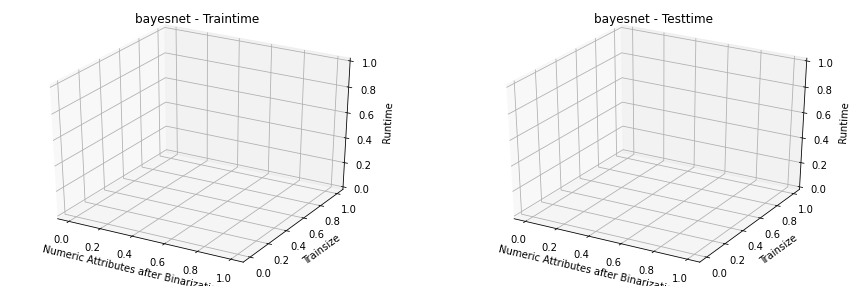

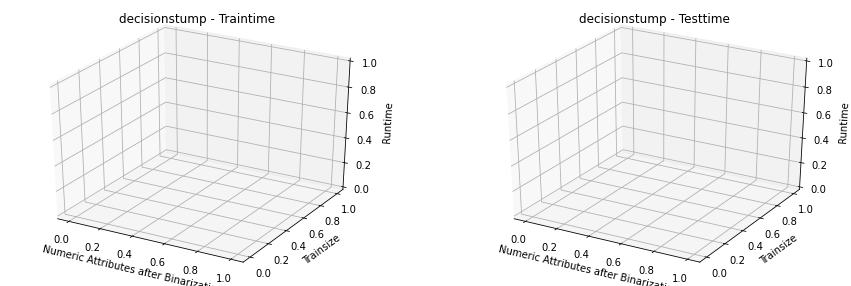

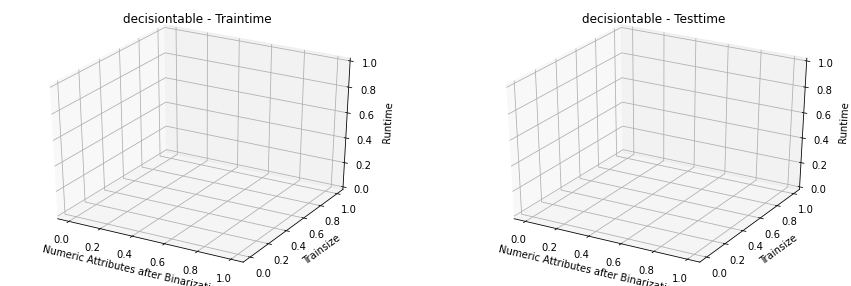

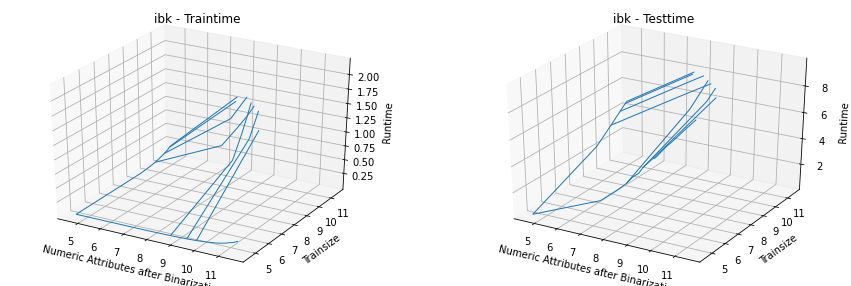

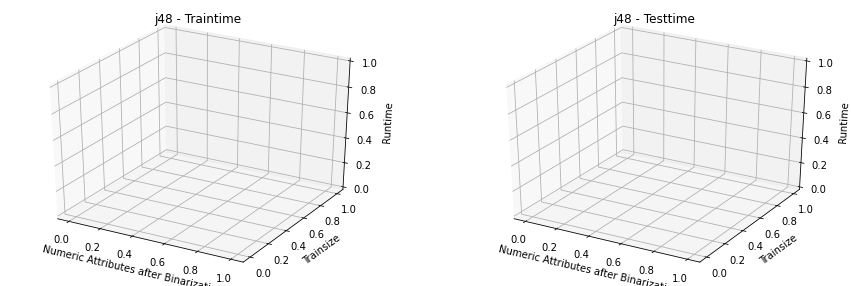

...

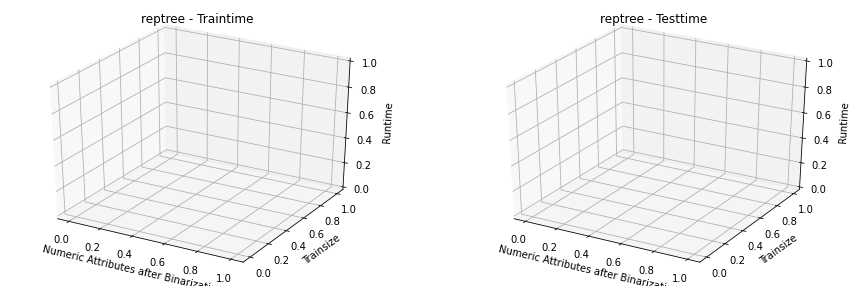

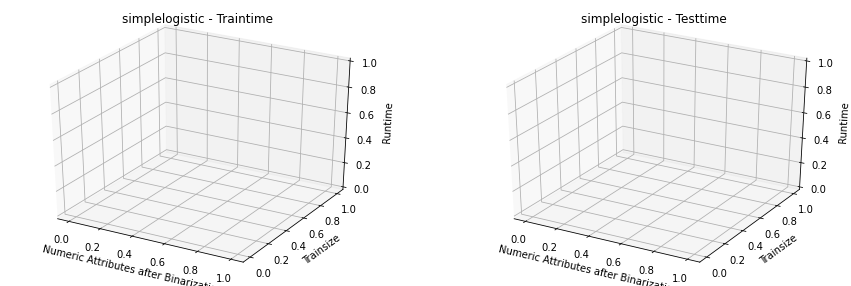

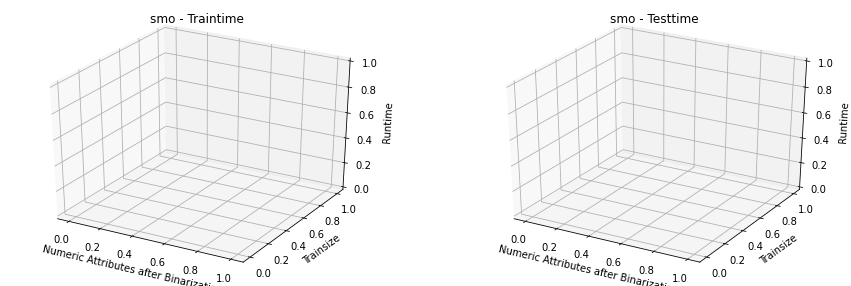

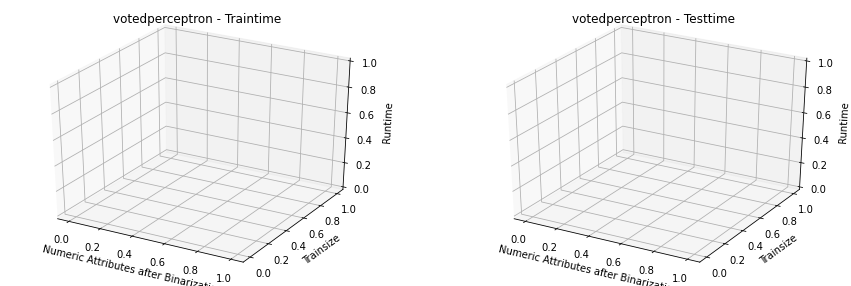

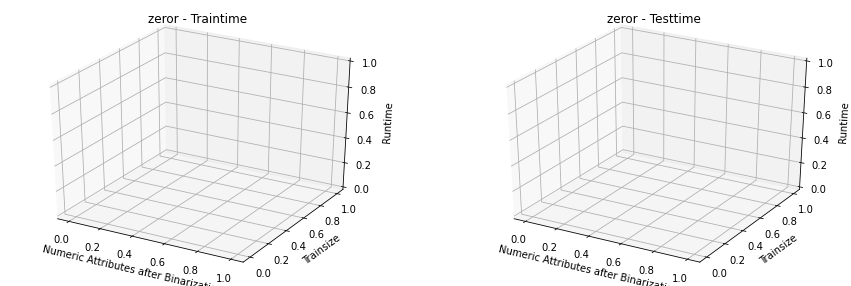

In [337]:
for k in overviews:
    classifierData = df.query("algorithm =='" + k + "'")
    trainpoints = np.log(np.unique(classifierData["fitsize"]))
    attributes = np.log(np.unique(classifierData["fitattributes"]))
    
    traintimes = tableMean(overviews[k][0])
    testtimes = tableMean(overviews[k][1])
    
    X, Y = np.meshgrid(attributes, trainpoints)
    #adjustLimits(projection, ax)
    fig = plt.figure()
    for i, table in enumerate([traintimes, testtimes]):
        ax = fig.add_subplot(1, 2, (i + 1), projection='3d')
        fig.set_figheight(5)
        fig.set_figwidth(15)
        logtable = (table + 1).astype('float32')
        logtable = np.log(logtable)
        ax.plot_wireframe(X, Y, logtable, rstride=3, cstride=3, linewidth=1, antialiased=True)
        ax.set_xlabel('Numeric Attributes after Binarization')
        ax.set_ylabel('Trainsize')
        ax.set_zlabel('Runtime')
        ax.set_title(k + " - " + ("Traintime" if i == 0 else "Testtime"))
    plt.show()
    plt.close()

# 2. Dispersion (Difficulty of the Learning Problem)

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/home/felix/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:76: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


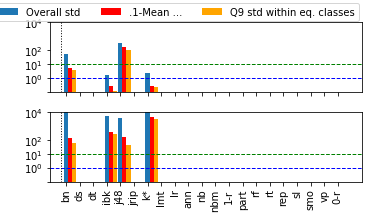

In [522]:
#plotDispersion(df.dropna(), "algorithm", ["openmlid", "fitsize", "fitattributes"], ["fittime", "applicationtime"])
#df["applicationtimeperkunits"] = df["applicationtimeperunit"] * 1000

def plotDispersion(df, indexAttribute, indexValues, batchAttributes, targets,  ax=None, useLegend=True):
    
    if type(targets) != list:
        targets = [targets]
    
    # First compute dispersions
    indexValues = indexValues#pd.unique(df[indexAttribute])
    stds = []
    bstdsMean = []
    bstdsQuantile = []
    for index in tqdm(indexValues):
        group = df[df[indexAttribute] == index]
        stdMap = {}
        for target in targets:
            stdMap[target] = np.nanstd(group[target])
        stds.append(stdMap)
        subGroups = group.groupby(batchAttributes)
        subStds = {}
        for target in targets:
            subStds[target] = []
        for j, subGroup in subGroups:
            for target in targets:
                subStds[target].append(np.nanstd(subGroup[target]))
        bstdMapMean = {}
        bstdMapQuantile = {}
        for target in targets:
            bstdMapMean[target] = sp.stats.trim_mean(subStds[target], 0.1)
            bstdMapQuantile[target] = np.quantile(subStds[target], 0.5) if subStds[target] else 0
        bstdsMean.append(bstdMapMean)
        bstdsQuantile.append(bstdMapQuantile)
    
    # now plot dispersions
    if ax is None:
        fig, ax = plt.subplots(1, len(targets), figsize=(10, 5 * len(targets)))
    
    for i, target in enumerate(targets):
        ind = np.arange(len(stds))
        width=0.3
        a = np.ravel(ax)[i]
        a.bar(ind, [x[target] for x in stds], width, label="Overall std")
        a.bar(ind + width, [x[target] for x in bstdsMean], width, color="red", label=".1-Mean ...")
        a.bar(ind + 2 * width, [x[target] for x in bstdsQuantile], width, color="orange", label="Q9 std within eq. classes")
        a.set_xticks(range(len(indexValues)))
        a.set_xticklabels(indexValues)
        a.set_yscale("log")
        #a.invert_yaxis()
        a.axhline(1, color="blue", linestyle="--", linewidth="1")
        a.axhline(10, color="green", linestyle="--", linewidth="1")
        if useLegend:
            a.legend()
    return ax


fig, ax = plt.subplots(2, 1, sharex=True, figsize=(5, 3))
ax = plotDispersion(dfDefault, "algorithm", algorithms, ["fitsize", "numattributes"], ["fittime", "applicationtimeperkinstances"], ax, useLegend = False)
#ax[0].set_title("Train Time")
#ax[1].set_title("Prediction Time")
for i in range(2):
    ax[i].set_ylim([0.1, 10000])
    ax[i].set_yticks([0.1, 1, 10, 100, 10000])
    ax[i].set_yticklabels(["", "$10^0$", "$10^1$", "$10^2$", "$10^4$"])
    ax[i].set_xticks(np.arange(len(algorithms)))
xticklabels = [algorithmshortcuts[a] for a in algorithms]
#yticklabels.reverse()
ax[1].set_xticklabels(xticklabels, rotation=90)
ax[0].axvline(len(preprocessors) - 0.4, color="black", linestyle="dotted", linewidth=1)
ax[1].axvline(len(preprocessors) - 0.4, color="black", linestyle="dotted", linewidth=1)
fig.subplots_adjust(wspace=0, hspace=0)
handles, labels = ax[1].get_legend_handles_labels()
lgd = fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.49, 1.02),ncol=3)
fig.tight_layout()
fig.savefig("plots/basealg-stds.pdf", bbox_extra_artists=(lgd,), bbox_inches='tight')
fig.show()

### Individual Sensitivity Analysis
Here, we can create a boxplot of the standard deviations per algorithm.

In [397]:
def plotPlane(a1, a2, intersept=0, x_from = -1, x_to = 1, y_from = -1, y_to = 1, ax=None):
    if ax is None:
        fig = plt.figure()
        ax = fig.gca(projection='3d')
    
    # create meshgrid
    x = np.linspace(x_from,x_to,10)
    y = np.linspace(y_from,y_to,10)
    X,Y = np.meshgrid(x,y)
    Z=a1*X + a2*Y + intersept

    surf = ax.plot_surface(X, Y, Z, alpha=0.2)

def scatterplane(X, Y, Z, a1, a2, intersept=0, ax=None):
    if ax is None:
        fig = plt.figure()
        ax = fig.gca(projection='3d')
    
    from_x = min(X) - np.abs(min(X)) * 0.1
    to_x = max(X) + np.abs(max(X)) * 0.1
    from_y = min(Y) - np.abs(min(Y)) * 0.1
    to_y = max(Y) + np.abs(max(Y)) * 0.1
    
    # plot plane
    plotPlane(a1, a2, intersept, from_x, to_x, from_y, to_y, ax=ax)
    
    # scatter points
    ax.scatter(X, Y, Z)
    
    # connect points with plane
    for i, x in enumerate(X):
        y = Y[i]
        z = Z[i]
        plane = a1*x + a2*y + intersept
        minZ = min(plane, z)
        maxZ = max(plane, z)
        ax.plot([x,x], [y,y], [minZ,maxZ], color="C" + str(0 if z <= minZ else 1), linewidth=1)
        ax.plot([x,x], [y,y], [min(0,minZ),max(0,minZ)], color="C2", linewidth=1, linestyle="--")

In [104]:
dfIBK = dfDefault.query("algorithm == 'ibk' and fitsize == 1000")

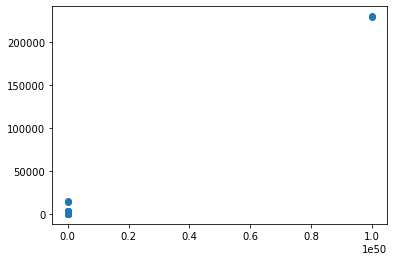

In [109]:

#plt.scatter(dfIBK["fitsize"], dfIBK["applicationtimeperkinstances"])
#plt.scatter(dfIBK["numattributes"], dfIBK["applicationtimeperkinstances"])
fig, ax = plt.subplots()
ax.scatter(dfIBK["numattributes"] ** e, dfIBK["applicationtimeperkinstances"])
plt.show()

[ 2646  2655  2674  2692  2699  2705  2717  2720  2734  3268  3397  3470
  3538  3551  3621  9658  9659  9668  9701  9707  9734  9737  9752  9785
  9806  9831  9839  9857  9862  9865  9897  9910  9928  9957  9963  9970
  9995 10004 10046 10092]
[ 1.1780414  11.84551329]
14513


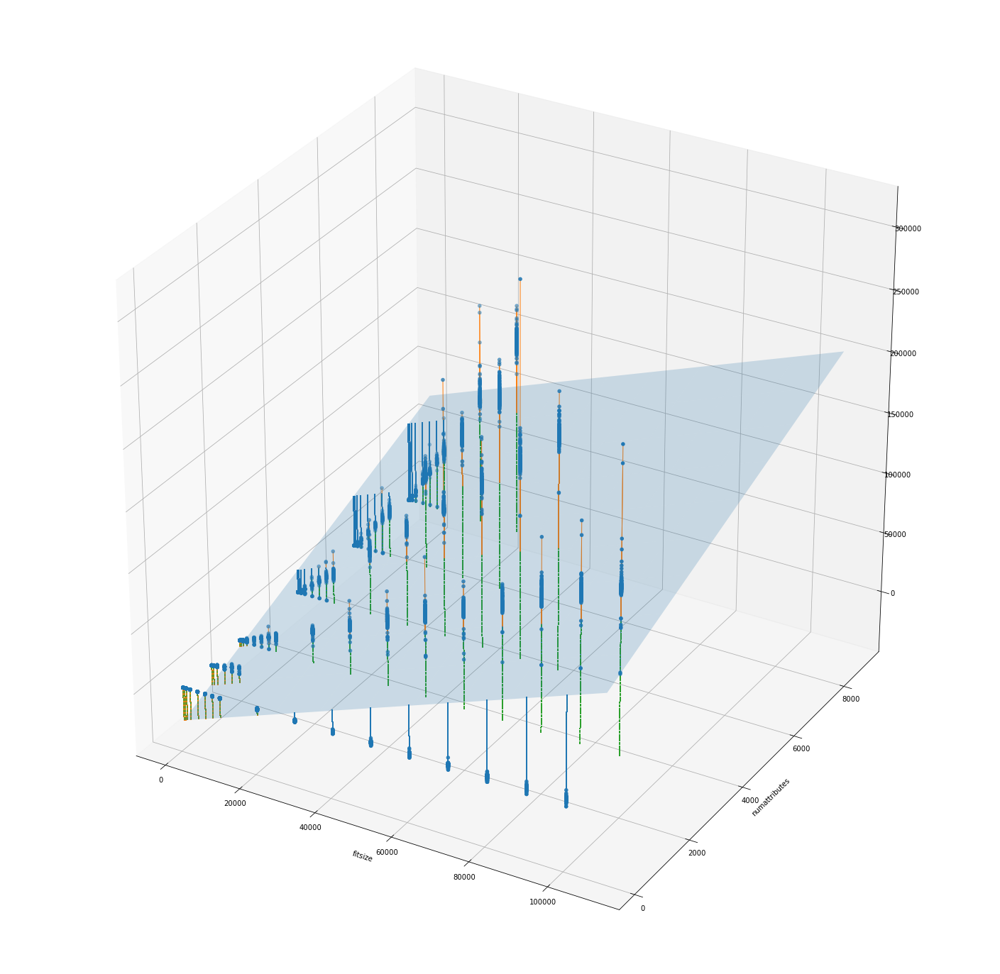

16155.706815357997 524.5331069609508 (3080.02%)
4891.731668444013 104.42333333333333 (4684.52%)
27297.64824387703 3.8646666666666665 (706339.01%)
27295.739892999834 1.956315789473684 (1395262.46%)
4884.797668444013 97.48933333333335 (5010.6%)
16167.632838831829 536.4591304347827 (3013.77%)
27295.676208789308 1.8926315789473684 (1442207.59%)
4880.065668444013 92.75733333333334 (5261.11%)
16214.202063784569 583.0283553875237 (2781.03%)
27298.244243877027 4.460666666666667 (611976.78%)
18695.80310889496 207.9151266255989 (8992.04%)
4885.521668444013 98.21333333333334 (4974.4%)
27295.496208789307 1.7126315789473683 (1593775.13%)
16199.907164279399 568.733455882353 (2848.42%)
4884.267001777346 96.95866666666666 (5037.47%)
16227.450099951748 596.2763915547026 (2721.46%)
18698.223990429156 205.4942450914015 (9099.15%)
5024.365132964036 11899.666666666666 (42.22%)
4889.51433511068 102.206 (4783.98%)
4891.866565872344 25674.461538461535 (19.05%)
4362.880161540914 512.1204620462047 (851.92%)
272

27297.86757721036 4.084 (668410.08%)
20292.63639507866 121411.25 (16.71%)
10395.870448492693 40832.0 (25.46%)
42257.900850107835 336.84395604395604 (12545.25%)
18665.03848669795 238.67974882260594 (7820.12%)
4887.311001777346 100.00266666666666 (4887.18%)
4982.71558184765 1131.9558823529412 (440.19%)
14246.628421785674 80024.0 (17.8%)
78718.40329832787 168317.0 (46.77%)
28187.608643001775 3302.8736842105263 (853.43%)
10113.875764021344 64110.83333333333 (15.78%)
18694.09668855923 209.62154696132595 (8918.02%)
38481.567307230216 116299.75 (33.09%)
4850.854162035425 1000.0944625407167 (485.04%)
45886.67986895911 111794.25 (41.05%)
9430.88501101893 51647.42857142857 (18.26%)
7609.899842010411 26265.615384615383 (28.97%)
4894.645668444013 107.33733333333333 (4560.06%)
9967.115029620938 52313.857142857145 (19.05%)
15939.716768174148 308.5430597771023 (5166.12%)
15271.132452742895 38986.22222222222 (39.17%)
17256.868318309967 2453.2 (703.44%)
50206.510345016985 4844.799999999999 (1036.3%)
48

5359.712719718496 25206.615384615383 (21.26%)
8893.314892937131 39329.44444444444 (22.61%)
41219.9687045357 2050.927631578947 (2009.82%)
18682.415757386447 221.3024781341108 (8442.03%)
13807.814412883352 91365.6 (15.11%)
17392.599296733213 59609.142857142855 (29.18%)
16822.454674965113 37434.9 (44.94%)
18179.8792635836 1530.189054726368 (1188.08%)
4885.833001777346 98.52466666666668 (4958.99%)
12758.59929673322 54975.14285714286 (23.21%)
61365.91733637547 5465.80701754386 (1122.72%)
69750.26851782112 159218.6666666667 (43.81%)
28186.243877861445 82313.4 (34.24%)
13223.814412883337 90781.59999999999 (14.57%)
4889.603001777346 102.29466666666667 (4779.92%)
5142.9930328280425 1292.2333333333333 (397.99%)
45775.317307230216 123593.5 (37.04%)
16236.519411522046 605.345703125 (2682.19%)
14661.82842178567 80439.2 (18.23%)
40147.42986895911 106055.0 (37.86%)
17196.51094126079 2513.5573770491806 (684.15%)
7155.207534318102 25810.923076923074 (27.72%)
23386.722386176334 136285.75 (17.16%)
6377.1

16748.654674965117 37508.7 (44.65%)
64972.59690869794 1313.1744680851064 (4947.75%)
41903.455273857806 691.2895322939867 (6061.64%)
4861.657903544712 74.34956843403207 (6538.92%)
20517.80040398099 109856.0 (18.68%)
41817.14737025436 777.5974358974358 (5377.74%)
20796.63639507866 121915.25 (17.06%)
18867.18623552056 36.532000000000004 (51645.64%)
72285.60185115444 161754.0 (44.69%)
13659.55040398099 102997.75 (13.26%)
16664.88639507866 117783.5 (14.15%)
61678.658780148835 5153.065573770491 (1196.93%)
50477.280494270715 4574.0298507462685 (1103.56%)
17377.22842178568 83154.6 (20.9%)
27294.076102983556 0.2925257731958763 (9330485.93%)
16216.014412883349 93773.8 (17.29%)
86275.1878422521 187524.0 (46.01%)
68393.60185115444 157862.0 (43.32%)
39410.42986895911 105318.0 (37.42%)
18582.12603320233 321.59220231822974 (5778.16%)
21121.809817024936 56826.57142857143 (37.17%)
90348.34105096928 44.21132075471698 (204355.67%)
24876.442430688025 78873.40000000001 (31.54%)
39206.567388746225 4064.3289

29599.881245596363 48348.5 (61.22%)
16317.32602627784 686.1523178807947 (2378.09%)
5836.791295708996 2092.8630136986303 (278.89%)
15006.80040398099 104345.0 (14.38%)
5352.46905910062 1501.7093596059112 (356.43%)
42257.47990548954 337.26490066225165 (12529.46%)
73294.93518448778 162763.33333333334 (45.03%)
9173.870448492693 39610.0 (23.16%)
42418.17986895911 108325.75 (39.16%)
17162.90438388374 2547.1639344262294 (673.8%)
6295.69846629737 13171.0 (47.8%)
15100.354674965114 39157.0 (38.56%)
13632.870448492693 44069.0 (30.94%)
6006.772321829986 1922.8819875776396 (312.38%)
12872.739002849572 31528.454545454544 (40.83%)
23597.443877861442 77724.59999999999 (30.36%)
61133.215263010236 5698.509090909091 (1072.79%)
11095.631316132538 77133.4 (14.38%)
22432.82842178567 88210.2 (25.43%)
72871.15654463985 5740.981818181819 (1269.32%)
59700.79073659897 161210.0 (37.03%)
61676.658780148835 5155.065573770492 (1196.43%)
17781.644267677057 1928.4240506329113 (922.08%)
6177.141600252173 24832.85714285

7118.745995856567 25774.46153846154 (27.62%)
9903.426004048248 40339.555555555555 (24.55%)
18654.372647285265 249.34558823529412 (7481.33%)
17004.386902380764 2705.681415929204 (628.47%)
27882.16048813184 3608.3218390804595 (772.72%)
10869.042430688016 64866.0 (16.76%)
15963.386395078662 117082.0 (13.63%)
75329.34919339012 153017.33333333334 (49.23%)
19893.722386176334 132792.75 (14.98%)
8817.203781826021 39253.33333333333 (22.46%)
10999.88501101893 53216.42857142857 (20.67%)
6790.670448492689 37226.799999999996 (18.24%)
28192.53495879125 3297.9473684210525 (854.85%)
28116.2845250145 3374.1978021978025 (833.27%)
4886.117001777347 98.80866666666665 (4945.03%)
5926.0119253016655 2003.6423841059604 (295.76%)
5200.417477272487 1349.657777777778 (385.31%)
23837.66695988208 54110.71428571428 (44.05%)
5116.238866161375 1265.4791666666665 (404.29%)
6102.470448492699 36538.600000000006 (16.7%)
71394.60185115444 160863.0 (44.38%)
16269.270217637291 638.0965092402464 (2549.66%)
21687.13639507866 

23124.043877861448 77251.2 (29.93%)
2445.3281043338793 28121.0 (8.7%)
66385.06996499453 155983.66666666666 (42.56%)
17093.454674965113 37163.9 (45.99%)
6777.87237934085 13653.17391304348 (49.64%)
16509.02134163178 37748.333333333336 (43.73%)
17089.525945428613 2620.5423728813557 (652.14%)
72428.60895105696 6183.529411764706 (1171.32%)
17819.454745501294 107548.25 (16.57%)
70567.60185115444 160036.0 (44.09%)
61511.02943866509 5320.6949152542375 (1156.07%)
63865.12406993231 165374.33333333334 (38.62%)
23024.38639507866 124143.0 (18.55%)
39140.62002032517 4130.276315789474 (947.65%)
8852.885011018923 51069.428571428565 (17.33%)
9907.742153876068 52124.28571428571 (19.01%)
72149.9955056788 6462.142857142857 (1116.5%)
72474.5305196844 6137.607843137254 (1180.83%)
65811.58001875835 474.19135802469134 (13878.7%)
14024.209097354687 68021.16666666667 (20.62%)
61481.96164205492 5349.762711864408 (1149.25%)
27137.043877861448 81264.2 (33.39%)
28082.156240255783 3408.326086956521 (823.93%)
27298.1

65643.73663166122 155242.33333333334 (42.28%)
8119.314892937138 38555.444444444445 (21.06%)
6978.61150977563 13853.91304347826 (50.37%)
5679.970961476734 24886.357142857145 (22.82%)
26250.95267416779 51697.42857142857 (50.78%)
6372.82346629737 13248.125 (48.1%)
7705.669072779645 26361.384615384617 (29.23%)
10676.031316132547 76713.8 (13.92%)
72050.94687345995 6561.191489361701 (1098.14%)
61306.54891532284 5525.175438596491 (1109.59%)
26763.23838845351 51185.142857142855 (52.29%)
16269.526285716633 638.3525773195876 (2548.67%)
12203.354674965114 42054.0 (29.02%)
83389.26348283511 7003.288888888889 (1190.72%)
6632.470961476738 23933.85714285714 (27.71%)
28163.756245596363 49784.625 (56.57%)
27299.33157721036 5.547999999999999 (492057.17%)
65743.58795526628 542.183421516755 (12125.71%)
18687.02515914654 216.69307637401855 (8623.73%)
37232.67986895911 103140.25 (36.1%)
53117.26586005678 130805.25 (40.61%)
50216.82597001699 4834.484375 (1038.72%)
16960.059468752446 2750.008849557522 (616.73

39409.39000700072 3861.5063291139245 (1020.57%)
10427.631316132552 76465.40000000001 (13.64%)
51523.067307230216 129341.25 (39.83%)
5345.86656587234 25220.46153846154 (21.2%)
42251.2431188627 343.50168728908886 (12300.16%)
84505.60897549758 5886.943396226415 (1435.48%)
20467.88639507866 121586.5 (16.83%)
4410.101471646608 559.3417721518987 (788.44%)
28275.977172573126 3214.5051546391755 (879.64%)
16999.475397955986 2710.5929203539827 (627.15%)
17764.709097354687 71761.66666666667 (24.76%)
10368.82931533522 52715.57142857143 (19.67%)
16201.214412883346 93759.0 (17.28%)
16223.206151145137 592.0324427480916 (2740.26%)
28348.612327212304 3141.87 (902.28%)
39296.60519687414 3974.2911392405063 (988.77%)
85867.73663166119 175466.3333333333 (48.94%)
39405.567307230216 117223.75 (33.62%)
82310.52673069836 8082.025641025642 (1018.44%)
54577.45740326565 156086.6666666667 (34.97%)
5928.766151512889 2000.8881578947367 (296.31%)
11998.45643959035 54214.99999999999 (22.13%)
18644.95568232907 258.7625

13080.428421785677 78857.8 (16.59%)
29712.796612926588 1777.6857142857145 (1671.43%)
18692.129385346343 211.58885017421602 (8834.18%)
4986.551670297628 1135.7919708029196 (439.04%)
55129.26586005678 132817.25 (41.51%)
16232.84880567331 601.6750972762646 (2697.94%)
52513.69367835032 2537.616666666667 (2069.41%)
27294.906640313886 1.123063103525713 (2430398.31%)
73195.05064352341 5417.087719298245 (1351.19%)
25739.043877861463 79866.20000000001 (32.23%)
18664.58537388534 239.13286163522014 (7805.11%)
11255.028421785668 77032.4 (14.61%)
4878.833668444013 91.52533333333335 (5330.58%)
18691.71405433589 212.004181184669 (8816.67%)
3564.481950487727 27001.846153846152 (13.2%)
40050.146336114645 3220.75 (1243.5%)
12197.042430688016 66194.0 (18.43%)
27295.163682066872 1.3801048565121412 (1977760.14%)
18694.477711743853 209.24052377670571 (8934.44%)
4117.672857389446 266.91315789473686 (1542.7%)
16205.204745501294 105934.0 (15.3%)
18302.145591037242 1407.9227272727273 (1299.94%)
23933.8438778614

71377.40329832787 160976.0 (44.34%)
84597.1878422521 185846.0 (45.52%)
51113.63945894104 3937.6708860759495 (1298.07%)
70870.51586005678 148558.5 (47.71%)
14087.428421785677 79864.8 (17.64%)
27295.754808737456 1.971231527093596 (1384705.67%)
57971.45740326565 159480.6666666667 (36.35%)
94387.85450891875 195636.66666666666 (48.25%)
5237.4819504877305 25328.84615384615 (20.68%)
11372.981559603802 41809.11111111111 (27.2%)
15806.204745501294 105535.0 (14.98%)
5378.275389374294 12253.576923076924 (43.89%)
8703.972172478076 51050.71428571428 (17.05%)
62413.307687252665 4418.416666666666 (1412.57%)
65792.75377678304 493.0176000000001 (13344.91%)
4886.324335110679 99.016 (4934.88%)
22307.722386176334 135206.75 (16.5%)
16267.919088273842 636.7453798767968 (2554.85%)
16167.482200598086 536.3084922010398 (3014.59%)
5618.181664812628 1767.421965317919 (317.87%)
42248.82597864334 345.9188275084554 (12213.51%)
18684.083119913623 219.63511560693644 (8506.87%)
72252.36285261757 6359.775510204082 (113

65725.2832164916 560.488160291439 (11726.44%)
5037.55031814922 11912.85185185185 (42.29%)
65733.74820387752 552.0231729055258 (11907.79%)
40911.95787457618 2358.9384615384615 (1734.34%)
23667.63639507866 124786.25 (18.97%)
5199.536992071128 1348.7772925764193 (385.5%)
21895.722386176334 134794.75 (16.24%)
9974.203781826029 40410.333333333336 (24.68%)
72572.05993144911 6040.078431372549 (1201.51%)
18074.30040398099 107412.5 (16.83%)
20601.88639507866 121720.5 (16.93%)
7380.130611241184 26035.846153846156 (28.35%)
5455.390773989679 12330.692307692309 (44.24%)
37267.42986895911 103175.0 (36.12%)
12773.204745501294 102502.0 (12.46%)
71385.2685178211 160853.66666666666 (44.38%)
53351.01586005677 131038.99999999999 (40.71%)
42248.4784404633 346.26636568848755 (12201.15%)
4942.351097344172 1091.5913978494623 (452.77%)
41323.317307230216 119141.5 (34.68%)
50349.98198680803 4701.328358208955 (1070.97%)
70721.73663166122 160320.33333333334 (44.11%)
18128.254674965116 36129.1 (50.18%)
39417.17986

KeyboardInterrupt: 

In [398]:
X = []
Y = []
for gIndex, group in dfDefault.query("algorithm == 'ibk'").groupby(["fitsize", "numattributes"]):
    X.append(gIndex)
    Y.append(np.mean(group["applicationtimeperkinstances"]))

X = np.array(X)
#reg = RandomForestRegressor(n_estimators=1000)
reg = LinearRegression()
algo = "kstar"
for d in datasets:
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and numattributes < 10000 and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and fitsize > 50000 and fitattributes > 100 and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = dfTrain["applicationtimeperkinstances"].values
    dropIndices = np.where((np.isnan(XTrain[:,0])) | (np.isnan(XTrain[:,1])) | (np.isnan(YTrain)))
    print(dropIndices[0])
    
    XTrain = XTrain[[i for i in range(len(XTrain)) if not i in dropIndices[0]]]#np.log(dfTest[["fitsize", "numattributes"]].values)
    YTrain = YTrain[[i for i in range(len(YTrain)) if not i in dropIndices[0]]]# dfTest["applicationtimeperkinstances"].values
    XTest = XTrain
    YTest = YTrain
    reg.fit(XTrain, YTrain)
    print(reg.coef_)
    print(len(XTrain))
    
    fig = plt.figure(figsize=(25,25))
    ax = fig.gca(projection='3d')
    scatterplane(dfTrain["fitsize"].values, dfTrain["numattributes"].values, dfTrain["applicationtimeperkinstances"].values, reg.coef_[0], reg.coef_[1], reg.intercept_, ax=ax)
    ax.set_xlabel("fitsize")
    ax.set_ylabel("numattributes")
    #Y2 = reg.predict(XTrain)
    #ax.scatter(XTrain[:,0], XTrain[:,1], Y2)
    plt.show()
    
    F = reg.predict(XTest)
    A = YTest
    err = []
    for i, a in enumerate(A):
        localError = np.abs(a - F[i])
        print(localError, a, "(" + str(np.round(100 * localError/a, 2)) + "%)")
        err.append(localError)
    
    rmse = RMSE(F, A)
    if rmse > 30:
        fig,ax  = plt.subplots(figsize=(15, 15))
        #ax = fig.add_subplot(111, projection='3d')
        
        ax.scatter(dfTrain["fitsize"], dfTrain["numattributes"])#, dfTrain["applicationtimeperkinstances"])
        ax.scatter(dfTest["fitsize"], dfTest["numattributes"])#, dfTest["applicationtimeperkinstances"])

        fig, ax = plt.subplots()
        ax.boxplot([A, F, err])
        #ax.set_yscale("log")
        ax.set_ylim([0.1, 1000])
        plt.show()
    print(d, np.mean(A), np.mean(F), np.quantile(err, 0.8), rmse)
    #sk.model_selection.cross_validate(ref, X, Y)


In [399]:
dfIBK = dfDefault.query("algorithm == 'kstar' and numattributes > 1000 and numattributes < 20000")
attDomain = pd.unique(dfIBK["numattributes"])
attDomain.sort()
sizeDomain = pd.unique(dfIBK["fitsize"])
sizeDomain.sort()
m = len(attDomain)
n = len(sizeDomain)

A = np.zeros((m, n))
B = np.zeros((m, n))
for i, numAttributes in enumerate(attDomain):
    for j, fitsize in enumerate(sizeDomain):
        vals = dfIBK[(dfIBK["numattributes"] == numAttributes) & (dfIBK["fitsize"] == fitsize)]["applicationtimeperkinstances"]
        #vals = dfIBK[(dfIBK["numattributes"] == numAttributes) & (dfIBK["fitsize"] == fitsize)]["fittime"]
        A[i,j] = np.nanstd(vals)
        B[i,j] = np.nanmean(vals)

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()


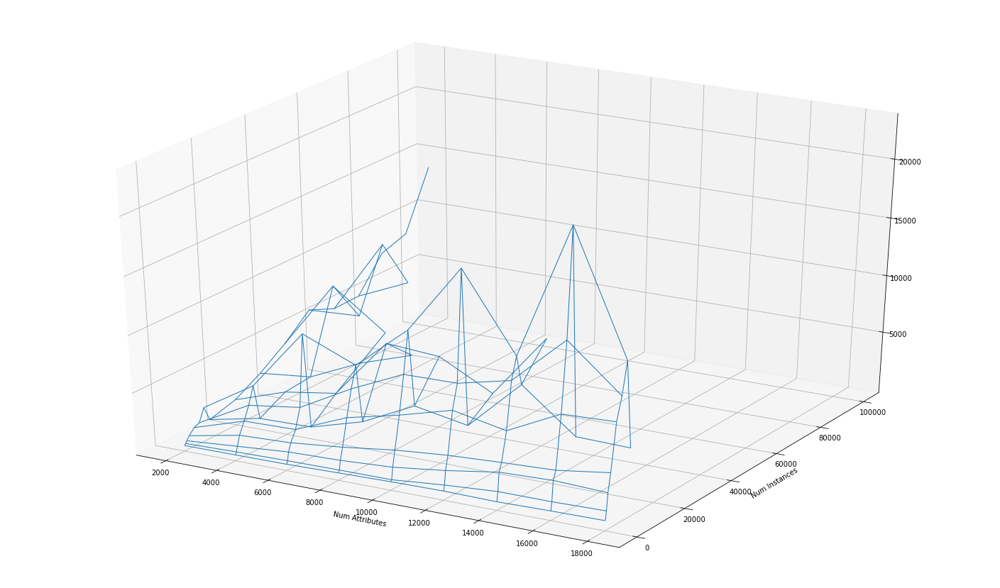

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  


Text(0.5, 0, 'Num Instances')

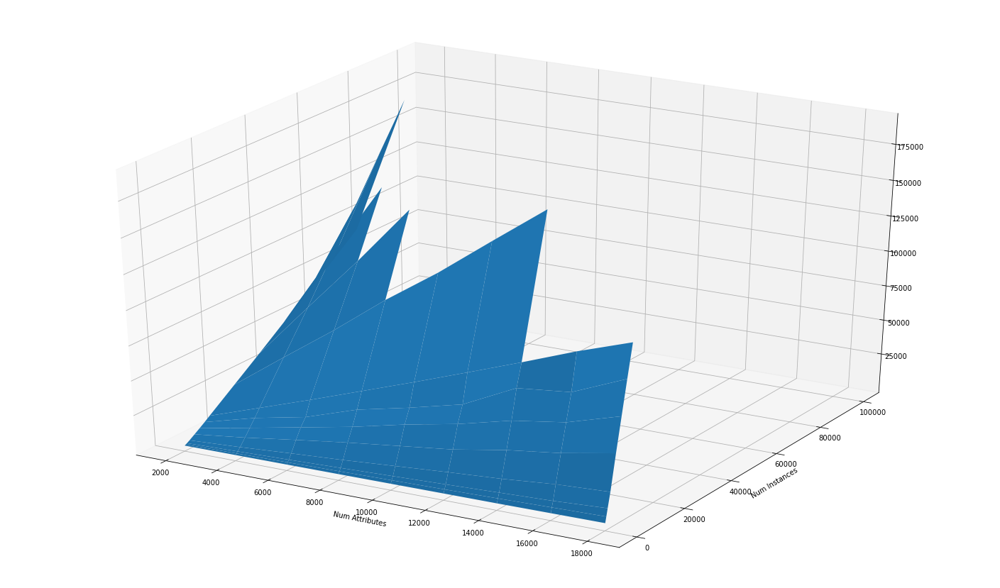

In [400]:
fig = plt.figure(figsize=(25,15))
ax1 = fig.gca(projection='3d')

X, Y = np.meshgrid(attDomain, sizeDomain)
#print(X.shape, Y.shape, M.shape)
ax1.plot_wireframe(X, Y, A.T, rstride=1, cstride=1, linewidth=1, antialiased=True)
ax1.set_xlabel("Num Attributes")
ax1.set_ylabel("Num Instances")
plt.show()

fig = plt.figure(figsize=(25,15))
ax2 = fig.gca(projection='3d')

ax2.plot_surface(X, Y, B.T, rstride=1, cstride=1, linewidth=1, antialiased=True)
ax2.set_xlabel("Num Attributes")
ax2.set_ylabel("Num Instances")

In [ ]:
X = []
Y = []
for gIndex, group in dfDefault.query("algorithm == 'ibk'").groupby(["fitsize", "numattributes"]):
    X.append(gIndex)
    Y.append(np.mean(group["applicationtimeperkinstances"]))

X = np.array(X)
#reg = RandomForestRegressor(n_estimators=1000)
reg = LinearRegression()
algo = "kstar"
for d in pd.unique(df["openmlid"]):
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and fitsize < 20000 and numattributes < 10000 and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and fitsize > 50000 and fitattributes > 100 and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = dfTrain["applicationtimeperkinstances"].values
    XTest = XTrain#np.log(dfTest[["fitsize", "numattributes"]].values)
    YTest = YTrain# dfTest["applicationtimeperkinstances"].values
    reg.fit(XTrain, YTrain)
    print(reg.coef_)
    print(len(XTrain))
    
    fig = plt.figure(figsize=(25,25))
    ax = fig.gca(projection='3d')
    scatterplane(dfTrain["fitsize"].values, dfTrain["numattributes"].values, dfTrain["applicationtimeperkinstances"].values, reg.coef_[0], reg.coef_[1], reg.intercept_, ax=ax)
    ax.set_xlabel("fitsize")
    ax.set_ylabel("numattributes")
    #Y2 = reg.predict(XTrain)
    #ax.scatter(XTrain[:,0], XTrain[:,1], Y2)
    plt.show()
    
    F = np.exp(reg.predict(XTest))
    A = YTest
    err = []
    for i, a in enumerate(A):
        localError = np.abs(a - F[i])
        print(localError, a, "(" + str(np.round(100 * localError/a, 2)) + "%)")
        err.append(localError)
    
    rmse = RMSE(F, A)
    if rmse > 30:
        fig,ax  = plt.subplots(figsize=(15, 15))
        #ax = fig.add_subplot(111, projection='3d')
        
        ax.scatter(dfTrain["fitsize"], dfTrain["numattributes"])#, dfTrain["applicationtimeperkinstances"])
        ax.scatter(dfTest["fitsize"], dfTest["numattributes"])#, dfTest["applicationtimeperkinstances"])

        fig, ax = plt.subplots()
        ax.boxplot([A, F, err])
        #ax.set_yscale("log")
        ax.set_ylim([0.1, 1000])
        plt.show()
    print(d, np.mean(A), np.mean(F), np.quantile(err, 0.8), rmse)
    #sk.model_selection.cross_validate(ref, X, Y)


In [53]:
reg = RandomForestRegressor(n_estimators=100)
#reg = LinearRegression()
algo = "ibk"
relevantErrors = []
for d in pd.unique(df["openmlid"]):
    dfTrain = dfDefault.query("algorithm == '" + algo + "' and openmlid !=" + str(d))
    dfTest = dfDefault.query("algorithm == '" + algo + "' and openmlid ==" + str(d))
    if len(dfTest) == 0:
        continue
    
    e = 2
    #XTrain = np.column_stack([dfTrain[["fitsize", "numattributes"]].values, dfTrain["numattributes"].values ** e, dfTrain["fitsize"].values * dfTrain["numattributes"].values, (dfTrain["fitsize"].values * dfTrain["numattributes"].values ** e)])
    #XTrain = np.array([dfTrain["fitsize"].values * (dfTrain["numattributes"].values ** e)]).T
    XTrain = dfTrain[["fitsize", "numattributes"]].values
    print(XTrain.shape)
    YTrain = dfTrain["applicationtimeperkinstances"].values
    reg.fit(XTrain, YTrain)
    
    print(d)
    print("------------\n--------------")
    
    relevantErrorsOnThisDataset = []
    for i, scenario in dfTest.iterrows():
        XTest = scenario[["fitsize", "numattributes"]].values.T
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["fitsize"].values * dfTest["numattributes"].values])
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["numattributes"].values ** e, dfTest["fitsize"].values * dfTest["numattributes"].values, dfTest["fitsize"].values * dfTest["numattributes"].values**e])
        #XTest = np.array([dfTest["fitsize"].values * (dfTest["numattributes"].values ** e)]).T
        YTest = scenario["applicationtimeperkinstances"]
        
        F = reg.predict([XTest])[0]
        isRelevant = max(YTest, F) > 60 and min(YTest, F) < 1200
        if isRelevant:
            relError = (F - YTest) / YTest
            relevantErrorsOnThisDataset.append(relError)
            print(XTest, YTest, F, F - YTest, str(np.round(100 * relError, 2)) + "%")
        #err.append(localError)

        #if np.mean(A) > 100 and np.mean(A) < 300:
#            #print(dfTest)
#            print(d, np.mean(A), np.mean(F), np.mean(err), rmse, str(np.round(rmse * 100 / np.mean(A), 2)) + "%")
        #sk.model_selection.cross_validate(ref, X, Y)
    relevantErrors.append(relevantErrorsOnThisDataset)

(18452, 2)
3
------------
--------------
[10000 4000] 563.3970856102004 611.1692414529094 47.772155842709026 8.48%
[100 6000] 68.30733333333333 116.70497170515885 48.39763837182552 70.85%
[10000 2000] 273.76216216216216 277.7192167876996 3.9570546255374666 1.45%
[30000 2000] 775.1227621483375 824.2995211943379 49.17675904600037 6.34%
[20000 4000] 1111.68345323741 1172.44183653645 60.758383299039906 5.47%
[10000 2000] 269.7231588287489 277.7192167876996 7.996057958950701 2.96%
[20000 2000] 522.8573853989814 552.4930902264874 29.63570482750606 5.67%
[100 6000] 68.136 116.70497170515885 48.56897170515886 71.28%
[100 8000] 123.51933333333332 190.49376366691126 66.97443033357794 54.22%
[20000 4000] 1119.697841726619 1172.44183653645 52.743994809831065 4.71%
[40000 2000] 1048.6872852233678 1114.8144782580212 66.12719303465337 6.31%
[100 8000] 124.572 190.49376366691126 65.92176366691126 52.92%
[100 10000] 171.98533333333336 245.48930213798565 73.50396880465229 42.74%
[40000 2000] 1016.614617

[100 18000] 637.6324435318274 848.2470395644731 210.61459603264564 33.03%
[100 16000] 498.7491909385113 643.1391804003865 144.38998946187525 28.95%
[100 14000] 382.3085501858736 467.5737036010054 85.26515341513175 22.3%
[100 20000] 684.9667405764967 913.1425286355715 228.17578805907476 33.31%
[100 20000] 750.9733656174333 913.1425286355715 162.1691630181382 21.59%
(18461, 2)
14
------------
--------------
[10000 2000] 268.13592233009706 277.5812369213478 9.445314591250735 3.52%
[100 6000] 62.693333333333335 116.62562365991622 53.93229032658288 86.03%
[10000 2000] 274.1821460775473 277.5812369213478 3.3990908438004794 1.24%
[20000 2000] 525.9421768707483 552.4520408784945 26.50986400774616 5.04%
[100 8000] 118.45866666666666 192.78376990126563 74.32510323459897 62.74%
[20000 4000] 1088.215053763441 1172.5973569500968 84.38230318665592 7.75%
[100 6000] 65.88133333333333 116.62562365991622 50.744290326582885 77.02%
[20000 4000] 1143.1970260223047 1172.5973569500968 29.400330927792083 2.57

[40000 2000] 1062.852233676976 1117.47606426224 54.62383058526393 5.14%
[100 10000] 165.072 243.94288511520426 78.87088511520426 47.78%
[100 12000] 275.58190045248864 400.63747547618317 125.05557502369453 45.38%
[100 6000] 62.226 116.77581318867827 54.54981318867827 87.66%
[10000 6000] 890.3507246376812 934.8575617323821 44.50683709470093 5.0%
[20000 4000] 1116.389891696751 1172.9123995482928 56.52250785154183 5.06%
[100 6000] 63.736666666666665 116.77581318867827 53.039146522011606 83.22%
[20000 4000] 1146.9479553903345 1172.9123995482928 25.96444415795827 2.26%
[100 10000] 167.35933333333332 243.94288511520426 76.58355178187094 45.76%
[100 14000] 358.34736842105264 469.58982774064555 111.24245931959291 31.04%
[70000 100] 70.83133333333333 65.38387891346653 -5.447454419866801 -7.69%
[100 12000] 287.3764150943396 400.63747547618317 113.26106038184355 39.41%
[100 8000] 127.34399999999998 191.89037991545086 64.54637991545088 50.69%
[20000 4000] 1111.0107913669065 1172.9123995482928 61.90

[100 20000] 724.7183098591549 913.0686726719131 188.35036281275814 25.99%
[90000 100] 87.62 85.42772791592989 -2.1922720840701118 -2.5%
[100 18000] 703.0069124423964 853.3659418546794 150.359029412283 21.39%
[100 20000] 677.3656387665197 913.0686726719131 235.70303390539334 34.8%
(18516, 2)
23
------------
--------------
[10000 2000] 270.5102222222222 277.96382962438776 7.453607402165574 2.76%
[20000 2000] 514.8831385642738 551.6765149813305 36.793376417056606 7.15%
[30000 2000] 807.7910052910054 824.5973180062375 16.80631271523214 2.08%
[10000 6000] 855.8249999999999 934.9856867182878 79.16068671828782 9.25%
[20000 4000] 1127.749077490775 1172.8841080581942 45.13503056741911 4.0%
[10000 4000] 577.2103250478011 611.5503026642342 34.33997761643309 5.95%
[30000 2000] 796.0899470899471 824.5973180062375 28.50737091629037 3.58%
[10000 2000] 280.8753462603878 277.96382962438776 -2.9115166360000444 -1.04%
[20000 4000] 1144.3874538745388 1172.8841080581942 28.496654183655437 2.49%
[70000 100]

(18456, 2)
28
------------
--------------
[100 6000] 72.10533333333333 117.00473622289806 44.899402889564726 62.27%
[10000 4000] 577.4165067178503 612.1073023181737 34.69079560032333 6.01%
[100 6000] 66.50666666666667 117.00473622289806 50.498069556231385 75.93%
[30000 2000] 772.7851662404091 825.352547651344 52.5673814109349 6.8%
[100 8000] 127.33466666666668 192.2991941481005 64.96452748143382 51.02%
[10000 2000] 264.19791666666663 278.38864831993743 14.190731653270802 5.37%
[30000 2000] 775.1486146095717 825.352547651344 50.2039330417723 6.48%
[100 8000] 121.86533333333334 192.2991941481005 70.43386081476716 57.8%
[20000 2000] 518.5620805369127 552.8525283086127 34.290447771699974 6.61%
[100 10000] 165.28533333333334 247.92102723355103 82.63569390021769 50.0%
[100 6000] 70.55666666666666 117.00473622289806 46.4480695562314 65.83%
[30000 2000] 795.8073878627968 825.352547651344 29.545159788547267 3.71%
[100 8000] 132.184 192.2991941481005 60.1151941481005 45.48%
[10000 2000] 267.8091

[20000 2000] 532.3158813263525 552.7549166118793 20.439035285526757 3.84%
[70000 100] 51.721999999999994 65.60882308118636 13.886823081186364 26.85%
[20000 4000] 1093.8669064748203 1172.5863458675922 78.71943939277185 7.2%
[30000 2000] 795.3580562659847 825.512294617024 30.15423835103934 3.79%
[10000 6000] 869.0687679083095 935.0451367445218 65.97636883621226 7.59%
[80000 100] 60.00333333333333 76.60846672043536 16.60513338710203 27.67%
[70000 100] 49.73933333333333 65.60882308118636 15.86948974785303 31.91%
[40000 2000] 1054.5635738831613 1117.023168035203 62.459594152041745 5.92%
[20000 4000] 1111.1557971014493 1172.5863458675922 61.43054876614292 5.53%
[80000 100] 61.02733333333333 76.60846672043536 15.581133387102028 25.53%
[90000 100] 65.134 85.9404968027432 20.806496802743197 31.94%
[90000 100] 60.31933333333333 85.9404968027432 25.621163469409865 42.48%
[80000 100] 56.60666666666667 76.60846672043536 20.00180005376869 35.33%
[100000 100] 72.55933333333334 93.7792357028012 21.219

38
------------
--------------
[10000 4000] 560.5046040515654 610.6654414648679 50.16083741330249 8.95%
[10000 2000] 273.2201257861635 277.851372966773 4.631247180609478 1.7%
[10000 6000] 884.1469740634005 937.1514786595519 53.00450459615138 5.99%
[10000 4000] 586.9863547758285 610.6654414648679 23.67908668903931 4.03%
[100 8000] 122.51799999999999 191.5498533324873 69.0318533324873 56.34%
[30000 2000] 789.3350383631713 825.6805077322508 36.345469369079524 4.6%
[100 8000] 120.78666666666666 191.5498533324873 70.76318666582063 58.59%
[100 10000] 165.382 248.53641494943534 83.15441494943533 50.28%
[10000 6000] 1044.7079037800686 937.1514786595519 -107.55642512051668 -10.3%
[20000 2000] 527.196213425129 551.7365127641431 24.54029933901404 4.65%
[10000 6000] 872.0687679083094 937.1514786595519 65.08271075124253 7.46%
[100 12000] 297.7162426614481 402.39481526315046 104.67857260170234 35.16%
[20000 2000] 534.0834782608696 551.7365127641431 17.65303450327349 3.31%
[100 6000] 63.6293333333333

[100000 100] 21.207333333333334 94.1906659529585 72.98333261962516 344.14%
[100 20000] 691.2637614678899 920.5450955050328 229.28133403714287 33.17%
[100 16000] 531.3022847100175 642.9884422278493 111.68615751783182 21.02%
[100 14000] 439.07780979827095 463.77772995592255 24.699920157651604 5.63%
[100 18000] 603.9862745098039 850.9559358980721 246.96966138826815 40.89%
[70000 100] 25.305333333333333 65.5901342706424 40.28480093730906 159.19%
[90000 100] 24.410666666666668 85.83014644055388 61.419479773887204 251.61%
[100 16000] 465.2837632776935 642.9884422278493 177.70467895015582 38.19%
[100 20000] 726.0282352941176 920.5450955050328 194.51686021091518 26.79%
[80000 100] 31.488666666666663 76.87292603134041 45.38425936467375 144.13%
[100 20000] 681.1960352422907 920.5450955050328 239.3490602627421 35.14%
[100 20000] 685.9386363636364 920.5450955050328 234.60645914139639 34.2%
(18471, 2)
57
------------
--------------
[10000 2000] 270.421568627451 277.7032071676869 7.281638540235917 2

[10000 6000] 1125.5036496350363 934.385547019032 -191.1181026160043 -16.98%
[100 6000] 61.536 116.68657515094921 55.15057515094921 89.62%
[100 8000] 122.75 191.99648384436136 69.24648384436136 56.41%
[100 10000] 176.10799999999998 250.28069093507875 74.17269093507878 42.12%
[100 16000] 492.09744408945687 646.6559826261775 154.55853853672068 31.41%
[70000 100] 53.85333333333334 65.53783300342741 11.68449967009407 21.7%
[80000 100] 60.97 76.6681938936398 15.698193893639797 25.75%
[100 18000] 724.6642685851319 854.7481151912425 130.08384660611057 17.95%
[90000 100] 66.524 85.57258477388184 19.048584773881842 28.63%
[80000 100] 63.11066666666666 76.6681938936398 13.557527226973136 21.48%
[100 20000] 697.1958525345623 911.058348776031 213.86249624146876 30.67%
[100 14000] 401.3057742782152 468.5183479603959 67.21257368218068 16.75%
[100 12000] 286.50188679245286 396.57461951190913 110.07273271945627 38.42%
[100000 100] 78.17533333333333 94.18810125959952 16.012767926266193 20.48%
[100 16000

(18498, 2)
181
------------
--------------
[10000 2000] 276.5289855072464 277.6497685172216 1.1207830099752414 0.41%
[10000 4000] 551.932384341637 611.1474302560347 59.215045914397706 10.73%
[20000 2000] 507.77371048252917 552.4028776120539 44.62916712952472 8.79%
[10000 6000] 873.1489971346705 936.188394569952 63.03939743528156 7.22%
[20000 2000] 506.48585690515813 552.4028776120539 45.917020706895755 9.07%
[40000 2000] 1290.9746835443038 1114.0393024692528 -176.93538107505105 -13.71%
[10000 4000] 569.9503676470589 611.1474302560347 41.197062608975784 7.23%
[10000 6000] 853.7267605633803 936.188394569952 82.46163400657178 9.66%
[10000 2000] 267.2364273204904 277.6497685172216 10.41334119673121 3.9%
[20000 2000] 527.8529914529914 552.4028776120539 24.549886159062453 4.65%
[30000 2000] 805.053050397878 824.3538694289492 19.300819031071228 2.4%
[60000 100] 61.196 56.46299442564427 -4.7330055743557296 -7.73%
[20000 2000] 538.1818181818181 552.4028776120539 14.221059430235755 2.64%
[40000 

[100 8000] 124.50866666666667 191.52833254541392 67.01966587874725 53.83%
[30000 2000] 826.9209809264305 825.300674935233 -1.6203059911974833 -0.2%
[100 16000] 498.5072933549433 644.0943824487736 145.5870890938303 29.2%
[100 12000] 306.5401606425703 398.7972938967796 92.2571332542093 30.1%
[90000 100] 83.41133333333333 85.31119920949692 1.899865876163588 2.28%
[80000 100] 74.686 76.16408654256371 1.4780865425637018 1.98%
[100 14000] 378.72558714462303 466.9929151987137 88.26732805409068 23.31%
[100 18000] 629.5591836734693 848.5247469112654 218.96556323779612 34.78%
[100000 100] 90.28866666666666 94.02555459005939 3.736887923392729 4.14%
[100 12000] 288.0094696969697 398.7972938967796 110.7878241998099 38.47%
[90000 100] 143.05733333333333 85.31119920949692 -57.74613412383641 -40.37%
[80000 100] 115.27466666666666 76.16408654256371 -39.11058012410295 -33.93%
[100 20000] 781.5 920.1838347708313 138.68383477083125 17.75%
[100 20000] 734.5658536585366 920.1838347708313 185.61798111229461 

[100000 100] 98.65466666666667 93.8001714906266 -4.854495176040075 -4.92%
[80000 100] 78.73266666666667 76.34588066685392 -2.3867859998127585 -3.03%
[100 20000] 720.1142857142858 933.0969251859559 212.98263947167015 29.58%
[100 20000] 720.0372093023256 933.0969251859559 213.05971588363036 29.59%
[100 20000] 757.4698492462312 933.0969251859559 175.6270759397247 23.19%
(18445, 2)
354
------------
--------------
[10000 2000] 312.0306435137896 277.4330909964616 -34.59755251732798 -11.09%
[20000 2000] 539.2333333333333 551.8555362809096 12.622202947576284 2.34%
[100 6000] 73.62733333333334 116.89618052459451 43.26884719126117 58.77%
[10000 4000] 644.5509355509356 610.3219939806789 -34.228941570256666 -5.31%
[30000 2000] 1011.4786885245901 823.5811989195503 -187.89748960503982 -18.58%
[100 6000] 67.43199999999999 116.89618052459451 49.464180524594525 73.35%
[10000 2000] 329.8114224137931 277.4330909964616 -52.37833141733148 -15.88%
[20000 4000] 1242.4204081632652 1171.9057218252321 -70.51468

[100 20000] 700.261574074074 924.5567702898396 224.2951962157656 32.03%
(18550, 2)
390
------------
--------------
[100 2000] 77.14468629961588 15.538013369910916 -61.60667292970497 -79.86%
[100 4000] 268.0555066079295 45.22161486201323 -222.83389174591625 -83.13%
[100 4000] 315.5 45.22161486201323 -270.2783851379868 -85.67%
[100 6000] 703.5777262180975 109.18394946358852 -594.393776754509 -84.48%
[100 2000] 74.99688667496886 15.538013369910916 -59.45887330505795 -79.28%
[100 6000] 596.0994152046784 109.18394946358852 -486.91546574108986 -81.68%
[100 8000] 1246.8688524590164 178.85639259444434 -1068.012459864572 -85.66%
[100 10000] 1647.620320855615 242.1965367337977 -1405.4237841218173 -85.3%
[100 8000] 1505.8431372549019 178.85639259444434 -1326.9867446604576 -88.12%
[100 6000] 730.8568019093078 109.18394946358852 -621.6728524457193 -85.06%
[100 6000] 683.0653153153154 109.18394946358852 -573.8813658517269 -84.02%
[100 14000] 3684.3176470588232 446.2584698529154 -3238.059177205908 -8

[100 18000] 615.6235059760957 856.4684484030132 240.84494242691756 39.12%
[100 16000] 484.574568288854 646.8363048589214 162.2617365700674 33.49%
[100 18000] 664.7466960352423 856.4684484030132 191.72175236777093 28.84%
(18541, 2)
399
------------
--------------
[100 2000] 82.73130544993664 14.83567233344924 -67.8956331164874 -82.07%
[100 2000] 102.33121019108279 14.83567233344924 -87.49553785763355 -85.5%
[100 2000] 97.05602060528011 14.83567233344924 -82.22034827183087 -84.71%
[100 6000] 720.9648711943794 109.31748242386057 -611.6473887705188 -84.84%
[100 6000] 649.8038793103449 109.31748242386057 -540.4863968864843 -83.18%
[100 2000] 86.92743009320905 14.83567233344924 -72.09175775975982 -82.93%
[100 8000] 1319.2222222222222 175.35036869302422 -1143.871853529198 -86.71%
[100 4000] 313.3671794871795 45.88189261317936 -267.48528687400017 -85.36%
[100 2000] 101.9467680608365 14.83567233344924 -87.11109572738727 -85.45%
[100 8000] 1183.9386973180076 175.35036869302422 -1008.588328624983

[60000 100] 71.29933333333332 56.252636404204374 -15.046696929128949 -21.1%
[40000 2000] 1063.0859106529208 1113.6729068920404 50.58699623911957 4.76%
[70000 100] 68.31733333333332 65.39984308781997 -2.917490245513349 -4.27%
[60000 100] 60.14933333333333 56.252636404204374 -3.8966969291289573 -6.48%
[50000 100] 63.57 46.038572389258114 -17.531427610741886 -27.58%
[100000 100] 97.79733333333333 93.79402183208437 -4.003311501248959 -4.09%
[80000 100] 78.91199999999999 76.35019913399599 -2.561800866004006 -3.25%
[90000 100] 87.75800000000001 85.47303248733334 -2.284967512666668 -2.6%
[60000 100] 61.44666666666667 56.252636404204374 -5.194030262462299 -8.45%
[100000 100] 99.31333333333333 93.79402183208437 -5.519311501248964 -5.56%
[80000 100] 80.224 76.35019913399599 -3.873800866004018 -4.83%
[90000 100] 88.00999999999999 85.47303248733334 -2.5369675126666493 -2.88%
[70000 100] 69.96333333333334 65.39984308781997 -4.563490245513364 -6.52%
(18528, 2)
715
------------
--------------
[10000 

[100 10000] 172.896 243.8323658592259 70.9363658592259 41.03%
[100 6000] 67.25066666666666 117.74032124479155 50.489654578124885 75.08%
[20000 4000] 1111.1854545454546 1172.422507367588 61.237052822133364 5.51%
[30000 2000] 794.5959079283888 826.1519763942276 31.556068465838848 3.97%
[10000 6000] 888.0518731988473 936.3532576595245 48.30138446067724 5.44%
[100 14000] 365.12320574162675 463.4844447002262 98.36123895859947 26.94%
[100 10000] 171.70666666666668 243.8323658592259 72.12569919255921 42.01%
[100 8000] 120.67133333333334 189.25043533912594 68.5791020057926 56.83%
[70000 100] 73.40666666666667 65.4326170150925 -7.974049651574163 -10.86%
[80000 100] 72.07266666666666 76.6804509945819 4.60778432791524 6.39%
[100 14000] 380.7462686567164 463.4844447002262 82.73817604350984 21.73%
[20000 4000] 1116.423913043478 1172.422507367588 55.998594324109945 5.02%
[100 10000] 164.51866666666666 243.8323658592259 79.31369919255923 48.21%
[100 12000] 285.3611632270169 409.6743722404293 124.3132

728
------------
--------------
[10000 2000] 263.14075993091535 277.99195802102264 14.851198090107289 5.64%
[100 6000] 65.60733333333334 115.97007233485209 50.36273900151875 76.76%
[30000 2000] 780.3734015345268 824.6976464491411 44.32424491461427 5.68%
[20000 4000] 1446.0046948356808 1171.1255303226005 -274.87916451308024 -19.01%
[20000 2000] 664.7142857142857 551.5706227476255 -113.14366296666014 -17.02%
[10000 2000] 277.7155879671832 277.99195802102264 0.27637005383945734 0.1%
[100 6000] 65.72266666666667 115.97007233485209 50.24740566818542 76.45%
[100 10000] 166.97466666666665 244.44707913640147 77.47241246973482 46.4%
[10000 4000] 559.047619047619 611.3526486433949 52.30502959577586 9.36%
[100 8000] 132.30066666666664 188.16195166876295 55.86128500209631 42.22%
[100 12000] 281.2101851851852 401.0892087437549 119.87902355856971 42.63%
[100 10000] 166.13533333333334 244.44707913640147 78.31174580306813 47.14%
[10000 4000] 570.6044362292052 611.3526486433949 40.74821241418965 7.14%


[40000 2000] 1394.7812499999998 1110.2581236358449 -284.5231263641549 -20.4%
[100 16000] 514.5344537815126 652.0380238645924 137.5035700830798 26.72%
[100000 100] 104.08733333333333 93.91536044408997 -10.171972889243364 -9.77%
[90000 100] 92.64800000000001 85.28982874734089 -7.358171252659119 -7.94%
[100 12000] 276.7484162895928 399.11981530073155 122.37139901113875 44.22%
[100 20000] 699.8643678160919 922.5213334031773 222.65696558708544 31.81%
[100 18000] 637.0378947368422 852.2052993888933 215.16740465205112 33.78%
[80000 100] 82.65133333333334 76.40657078380363 -6.24476254952971 -7.56%
[60000 100] 60.58533333333333 56.365924880693775 -4.219408452639556 -6.96%
[70000 100] 71.73400000000001 65.25912416708151 -6.474875832918499 -9.03%
[100 20000] 693.433789954338 922.5213334031773 229.08754344883937 33.04%
[90000 100] 119.89733333333334 85.28982874734089 -34.607504585992444 -28.86%
[100 14000] 360.8384433962264 467.3909070843051 106.55246368807872 29.53%
[100 18000] 626.5947046843178 

[30000 2000] 984.6123778501628 824.3351307135562 -160.27724713660666 -16.28%
[10000 4000] 647.7247311827957 610.445978142704 -37.278753040091715 -5.76%
[10000 6000] 894.4219653179192 936.8806680906808 42.458702772761626 4.75%
[70000 100] 70.458 65.61719932194825 -4.84080067805175 -6.87%
[80000 100] 95.92333333333333 76.40730802547847 -19.51602530785486 -20.35%
[30000 2000] 812.426273458445 824.3351307135562 11.908857255111116 1.47%
[80000 100] 103.75800000000001 76.40730802547847 -27.35069197452154 -26.36%
[70000 100] 70.40866666666666 65.61719932194825 -4.791467344718413 -6.81%
[90000 100] 89.00800000000001 85.40831599809934 -3.5996840019006697 -4.04%
[100000 100] 99.05133333333333 93.67600751846015 -5.375325814873179 -5.43%
[100000 100] 99.27666666666667 93.67600751846015 -5.600659148206518 -5.64%
(18517, 2)
743
------------
--------------
[10000 4000] 566.2329020332717 612.0369394028576 45.8040373695859 8.09%
[10000 4000] 582.5938104448743 612.0369394028576 29.443128957983276 5.05%


[90000 100] 115.12266666666666 85.11641452611342 -30.006252140553244 -26.06%
[40000 2000] 1279.086776859504 1113.5870549714284 -165.49972188807556 -12.94%
[90000 100] 88.49000000000001 85.11641452611342 -3.3735854738865925 -3.81%
[60000 100] 61.936 56.4699237106216 -5.4660762893784 -8.83%
[80000 100] 79.724 76.50914962794302 -3.2148503720569863 -4.03%
[90000 100] 113.392 85.11641452611342 -28.27558547388658 -24.94%
[100000 100] 100.54199999999999 94.04569770598636 -6.496302294013631 -6.46%
[90000 100] 87.352 85.11641452611342 -2.2355854738865872 -2.56%
[90000 100] 107.16066666666669 85.11641452611342 -22.04425214055327 -20.57%
(18445, 2)
761
------------
--------------
[10000 2000] 269.8362989323843 277.97971157333984 8.143412640955546 3.02%
[20000 2000] 616.7096114519428 551.2619701510911 -65.44764130085173 -10.61%
[100 6000] 67.01866666666668 116.40147563914607 49.382808972479395 73.69%
[100 6000] 65.44999999999999 116.40147563914607 50.95147563914608 77.85%
[20000 4000] 1374.2599118

[100000 100] 94.462 94.01274950214369 -0.4492504978563119 -0.48%
(18507, 2)
797
------------
--------------
[10000 2000] 266.5087873462214 277.87397148626826 11.365184140046836 4.26%
[20000 2000] 535.2373472949389 552.2292538421865 16.991906547247595 3.17%
[10000 6000] 867.4555873925502 936.573121669486 69.11753427693577 7.97%
[10000 6000] 871.8395415472779 936.573121669486 64.73358012220808 7.42%
[20000 4000] 1121.3394160583944 1171.3173839383248 49.977967879930475 4.46%
[20000 2000] 534.7207678883071 552.2292538421865 17.508485953879358 3.27%
[40000 2000] 1303.8798283261801 1114.3244190671692 -189.55540925901096 -14.54%
[10000 4000] 666.5282608695652 611.0540299091194 -55.474230960445766 -8.32%
[10000 6000] 890.6916426512969 936.573121669486 45.88147901818911 5.15%
[10000 2000] 272.54815481548155 277.87397148626826 5.325816670786708 1.95%
[20000 4000] 1087.8951048951049 1171.3173839383248 83.42227904321999 7.67%
[30000 2000] 798.3068783068783 825.3505948901063 27.043716583228047 3.39

[100 10000] 179.3853333333333 247.92313771883227 68.53780438549896 38.21%
[100 8000] 125.45333333333333 192.71450988702344 67.2611765536901 53.61%
[20000 2000] 698.6720554272516 551.5482558874703 -147.12379953978132 -21.06%
[20000 2000] 535.2979094076655 551.5482558874703 16.25034647980476 3.04%
[100 14000] 414.38731443994595 466.62050150372795 52.233187063782 12.6%
[100 10000] 169.22533333333334 247.92313771883227 78.69780438549893 46.5%
[40000 2000] 1248.8106995884773 1113.9322088674605 -134.87849072101676 -10.8%
[20000 4000] 1134.6066176470588 1172.003555511689 37.39693786463022 3.3%
[30000 2000] 807.2142857142858 824.6709893301647 17.45670361587895 2.16%
[80000 100] 77.88733333333333 76.21098473816784 -1.6763485951654928 -2.15%
[100 16000] 525.0358974358975 648.379201602818 123.34330416692046 23.49%
[100 12000] 284.2143522833178 399.1607101168687 114.9463578335509 40.44%
[100 14000] 385.38345864661653 466.62050150372795 81.23704285711142 21.08%
[100 10000] 177.26066666666668 247.92

[100000 100] 95.17200000000001 93.5557473067942 -1.6162526932058086 -1.7%
[90000 100] 90.106 85.2772544158197 -4.828745584180297 -5.36%
[100 20000] 716.3702830188679 925.5442645065698 209.1739814877019 29.2%
[100 18000] 629.4643584521385 847.6879017643511 218.22354331221254 34.67%
[100000 100] 99.71333333333334 93.5557473067942 -6.157586026539136 -6.18%
[100 20000] 695.4977168949772 925.5442645065698 230.0465476115926 33.08%
[100000 100] 98.83133333333335 93.5557473067942 -5.275586026539145 -5.34%
(18474, 2)
819
------------
--------------
[10000 2000] 275.81628959276014 277.97833508871884 2.1620454959586937 0.78%
[10000 2000] 265.85551663747816 277.97833508871884 12.122818451240676 4.56%
[10000 4000] 572.2259259259259 611.237481727766 39.01155580184002 6.82%
[10000 2000] 290.3174904942966 277.97833508871884 -12.339155405577742 -4.25%
[20000 4000] 1128.6300366300366 1173.4781643619062 44.84812773186968 3.97%
[100 8000] 123.68866666666665 190.47535495496183 66.78668828829518 54.0%
[1000

[90000 100] 93.90133333333334 85.37610237504596 -8.52523095828738 -9.08%
[100 20000] 669.0133037694014 933.1767109783091 264.16340720890764 39.49%
[100 20000] 674.3311111111111 933.1767109783091 258.84559986719796 38.39%
[100000 100] 99.56866666666667 93.86480686894338 -5.703859797723297 -5.73%
[100 18000] 654.2060737527114 853.7390269879659 199.53295323525447 30.5%
[100 20000] 689.3886363636365 933.1767109783091 243.7880746146726 35.36%
(18477, 2)
823
------------
--------------
[100 6000] 63.89933333333334 116.24399216652336 52.34465883319002 81.92%
[10000 6000] 879.7077363896847 935.8140983490385 56.106361959353876 6.38%
[10000 2000] 273.9847122302158 278.08551404541214 4.100801815196348 1.5%
[100 8000] 117.92 192.73541914880764 74.81541914880763 63.45%
[30000 2000] 804.8196286472148 825.2610037361977 20.44137508898291 2.54%
[40000 2000] 1060.4931034482759 1115.3602441933185 54.86714074504266 5.17%
[10000 4000] 602.1789883268482 611.5717729239294 9.392784597081231 1.56%
[100 10000] 

843
------------
--------------
[10000 4000] 577.2593283582089 610.8866927794696 33.62736442126072 5.83%
[10000 2000] 275.24209575429086 278.40975070040525 3.1676549461143964 1.15%
[30000 2000] 1023.6013289036545 824.8593201755534 -198.74200872810104 -19.42%
[100 8000] 123.2 192.30937514394824 69.10937514394824 56.1%
[10000 2000] 273.64054054054054 278.40975070040525 4.769210159864713 1.74%
[60000 100] 72.54599999999999 56.51002172631193 -16.03597827368806 -22.1%
[100 12000] 279.9752293577982 401.59908452933416 121.62385517153598 43.44%
[100 6000] 68.01066666666667 116.56396353928118 48.55329687261451 71.39%
[100 8000] 123.34066666666666 192.30937514394824 68.96870847728158 55.92%
[10000 4000] 610.2347140039448 610.8866927794696 0.6519787755248672 0.11%
[100 10000] 175.60666666666668 247.16652810285515 71.55986143618847 40.75%
[70000 100] 74.97866666666667 65.41990745262663 -9.558759214040037 -12.75%
[100 6000] 66.61066666666666 116.56396353928118 49.953296872614516 74.99%
[10000 6000]

[100 10000] 171.77733333333333 247.8885872150147 76.11125388168136 44.31%
[100 12000] 302.0963257199603 397.0211947255239 94.92486900556361 31.42%
[100 8000] 123.91400000000002 192.32300988928495 68.40900988928493 55.21%
[10000 2000] 345.99322799097064 277.4401790761611 -68.55304891480955 -19.81%
[10000 4000] 568.0018450184502 610.75690726034 42.75506224188973 7.53%
[100 6000] 65.43666666666667 117.67648436464036 52.23981769797369 79.83%
[100 14000] 396.26322580645154 466.9953280425029 70.73210223605133 17.85%
[100 10000] 165.462 247.8885872150147 82.4265872150147 49.82%
[70000 100] 87.102 65.15017982456408 -21.951820175435927 -25.2%
[100 6000] 68.44866666666667 117.67648436464036 49.22781769797369 71.92%
[100 14000] 391.4878361075545 466.9953280425029 75.5074919349484 19.29%
[100 16000] 488.1905511811023 633.2803671461672 145.08981596506493 29.72%
[30000 2000] 794.7176781002638 825.3351944204895 30.617516320225718 3.85%
[10000 6000] 857.4736842105262 935.8019586068243 78.3282743962980

(18466, 2)
881
------------
--------------
[10000 2000] 272.2199281867145 277.9883937622129 5.7684655754983964 2.12%
[100 8000] 126.97066666666665 191.13450085639414 64.1638341897275 50.53%
[100 6000] 64.594 115.83359376776907 51.23959376776908 79.33%
[20000 2000] 703.2712643678161 551.9037541268666 -151.3675102409495 -21.52%
[100 8000] 119.24533333333333 191.13450085639414 71.8891675230608 60.29%
[100 6000] 65.646 115.83359376776907 50.18759376776907 76.45%
[10000 4000] 581.7137330754351 611.7092972848949 29.995564209459758 5.16%
[20000 2000] 537.6 551.9037541268666 14.303754126866579 2.66%
[100 10000] 183.65866666666668 245.9316552676291 62.272988600962435 33.91%
[100 10000] 163.67333333333335 245.9316552676291 82.25832193429576 50.26%
[10000 4000] 554.2587155963304 611.7092972848949 57.45058168856451 10.37%
[100 12000] 280.313707451702 402.89549435441563 122.58178690271365 43.73%
[100 8000] 124.95266666666667 191.13450085639414 66.18183418972747 52.97%
[10000 6000] 1010.046052631578

[20000 4000] 1092.9607142857142 1172.4882907267497 79.52757644103554 7.28%
[70000 100] 66.68 65.30889718001409 -1.3711028199859214 -2.06%
[50000 100] 61.548 46.09144347223927 -15.456556527760732 -25.11%
[40000 2000] 1076.6401384083044 1113.8603988713671 37.22026046306269 3.46%
[90000 100] 88.66733333333333 85.34987214624354 -3.3174611870897905 -3.74%
[40000 2000] 1378.224215246637 1113.8603988713671 -264.36381637526983 -19.18%
[80000 100] 79.23933333333333 76.27742346711909 -2.961909866214242 -3.74%
[90000 100] 91.37266666666667 85.34987214624354 -6.022794520423133 -6.59%
[70000 100] 66.82133333333333 65.30889718001409 -1.5124361533192427 -2.26%
[100000 100] 98.55066666666666 93.43328247729836 -5.117384189368295 -5.19%
[80000 100] 78.58133333333333 76.27742346711909 -2.3039098662142408 -2.93%
[100000 100] 121.08999999999999 93.43328247729836 -27.656717522701626 -22.84%
[100000 100] 125.07466666666667 93.43328247729836 -31.64138418936831 -25.3%
[100000 100] 102.824 93.43328247729836 -9.

914
------------
--------------
[10000 2000] 273.5207207207207 277.8372107966002 4.3164900758794715 1.58%
[10000 4000] 704.0733944954128 611.6503050505777 -92.42308944483511 -13.13%
[100 6000] 62.13199999999999 117.40366551907495 55.27166551907496 88.96%
[20000 2000] 654.853448275862 551.3252896806604 -103.5281585952016 -15.81%
[20000 2000] 537.7521815008726 551.3252896806604 13.573108179787823 2.52%
[10000 4000] 572.09426987061 611.6503050505777 39.556035179967694 6.91%
[10000 2000] 272.8367713004485 277.8372107966002 5.000439496151671 1.83%
[100 6000] 61.998 117.40366551907495 55.40566551907495 89.37%
[20000 4000] 1113.4392857142857 1171.936842000649 58.497556286363306 5.25%
[10000 4000] 565.2690909090909 611.6503050505777 46.381214141486794 8.21%
[20000 2000] 619.6993865030676 551.3252896806604 -68.37409682240718 -11.03%
[100 10000] 169.90466666666669 245.9143619911345 76.00969532446783 44.74%
[100 8000] 124.17 189.39303098776526 65.22303098776526 52.53%
[10000 6000] 1179.9961538461

[100 20000] 753.7256857855363 929.2762957835048 175.55060999796854 23.29%
[100 16000] 491.70859872611464 641.5026080461528 149.79400932003813 30.46%
[100 14000] 386.0817610062893 461.50684623369335 75.42508522740405 19.54%
[100 18000] 662.1655913978494 863.122414941246 200.95682354339658 30.35%
[70000 100] 65.51266666666666 65.43779927458321 -0.07486739208344773 -0.11%
[100 20000] 699.5439814814814 929.2762957835048 229.73231430202338 32.84%
[100 16000] 503.8311475409836 641.5026080461528 137.6714605051692 27.32%
[100 18000] 591.8849902534114 863.122414941246 271.2374246878346 45.83%
[90000 100] 84.592 85.58484234095208 0.9928423409520803 1.17%
[100 18000] 614.9583333333334 863.122414941246 248.16408160791264 40.35%
[100 20000] 684.1060948081265 929.2762957835048 245.1702009753783 35.84%
[100 20000] 739.0170731707317 929.2762957835048 190.2592226127731 25.74%
[100000 100] 92.71 93.78362374653572 1.0736237465357306 1.16%
(18510, 2)
930
------------
--------------
[10000 4000] 575.575925

[80000 100] 76.70066666666666 76.447459424599 -0.2532072420676599 -0.33%
[100 16000] 495.80707395498393 643.1124718721651 147.30539791718115 29.71%
[100 18000] 664.6469298245614 847.5236925869451 182.8767627623837 27.51%
[100000 100] 114.78799999999998 93.78848711862359 -20.99951288137639 -18.29%
[100 18000] 628.022633744856 847.5236925869451 219.50105884208915 34.95%
[100 20000] 704.5691609977324 922.8381455335372 218.26898453580475 30.98%
[100000 100] 96.42533333333334 93.78848711862359 -2.636846214709749 -2.73%
[80000 100] 92.42399999999999 76.447459424599 -15.976540575400989 -17.29%
[100 20000] 680.5968468468468 922.8381455335372 242.24129868669036 35.59%
[100 18000] 595.2078431372548 847.5236925869451 252.3158494496903 42.39%
[90000 100] 88.34466666666667 85.5042441511098 -2.8404225155568668 -3.22%
[100000 100] 99.70866666666666 93.78848711862359 -5.920179548043066 -5.94%
[100 20000] 822.379781420765 922.8381455335372 100.45836411277219 12.22%
[100000 100] 116.834 93.7884871186235

[80000 100] 104.726 76.20068867635172 -28.525311323648282 -27.24%
[70000 100] 68.934 65.42196136414215 -3.5120386358578486 -5.09%
[90000 100] 89.43533333333332 85.2988548245831 -4.136478508750216 -4.63%
[90000 100] 83.50733333333334 85.2988548245831 1.7915214912497675 2.15%
[100 18000] 642.3458333333334 852.7248303906174 210.37899705728398 32.75%
[100 16000] 476.5725308641975 639.9137587790157 163.34122791481815 34.27%
[100 14000] 374.21175030599755 465.6761753883017 91.46442508230416 24.44%
[100 12000] 277.573126142596 396.8438693071246 119.2707431645286 42.97%
[100000 100] 95.23133333333334 93.37171558913401 -1.8596177441993262 -1.95%
[100 20000] 714.5949074074074 928.1292213160466 213.5343139086392 29.88%
[100 20000] 736.1733966745843 928.1292213160466 191.9558246414623 26.07%
[100 18000] 650.4612159329141 852.7248303906174 202.26361445770328 31.1%
[100 14000] 372.8974358974359 465.6761753883017 92.7787394908658 24.88%
[100 16000] 551.6140035906644 639.9137587790157 88.2997551883512

[10000 2000] 273.4111812443643 277.83755958774447 4.426378343380179 1.62%
[20000 4000] 1122.2518248175184 1172.8551779060979 50.603353088579524 4.51%
[100 8000] 125.87400000000001 190.17235655615863 64.29835655615862 51.08%
[100 10000] 180.962 244.3384164361496 63.37641643614961 35.02%
[30000 2000] 802.9497354497355 823.823511826201 20.873776376465457 2.6%
[100 6000] 74.86066666666666 117.50420127523667 42.64353460857001 56.96%
[60000 100] 73.13466666666666 56.458841709888794 -16.675824956777866 -22.8%
[20000 4000] 1115.1449275362318 1172.8551779060979 57.71025036986612 5.18%
[100 8000] 128.768 190.17235655615863 61.40435655615863 47.69%
[20000 2000] 534.5759162303665 552.5001714199411 17.924255189574637 3.35%
[10000 6000] 899.4824561403508 936.1439830397793 36.66152689942851 4.08%
[100 6000] 64.724 117.50420127523667 52.780201275236664 81.55%
[100 14000] 390.53621346886905 469.51739297800674 78.98117950913769 20.22%
[40000 2000] 1061.556701030928 1114.0609532429658 52.50425221203773 4

[100 20000] 730.115294117647 922.0452627525415 191.92996863489452 26.29%
[100 18000] 630.6221765913757 850.8907647352556 220.26858814387992 34.93%
[100 20000] 728.9413145539905 922.0452627525415 193.10394819855094 26.49%
(18453, 2)
979
------------
--------------
[10000 2000] 336.12843029637764 277.2862459609786 -58.842184335399054 -17.51%
[10000 2000] 309.1454545454545 277.2862459609786 -31.859208584475937 -10.31%
[100 6000] 64.33533333333332 116.12827575594301 51.792942422609684 80.5%
[100 8000] 119.33666666666666 190.15569295715667 70.81902629049002 59.34%
[100 6000] 69.084 116.12827575594301 47.044275755943005 68.1%
[10000 2000] 291.74856046065264 277.2862459609786 -14.46231449967405 -4.96%
[20000 4000] 1103.618181818182 1172.2641655939947 68.64598377581274 6.22%
[20000 2000] 526.1428571428571 551.7016741289168 25.558816986059696 4.86%
[100 8000] 119.64666666666666 190.15569295715667 70.50902629049001 58.93%
[10000 6000] 890.6206896551723 936.6546182977978 46.03392864262548 5.17%
[

[10000 6000] 1043.4089347079039 935.9196013268794 -107.4893333810245 -10.3%
[10000 2000] 271.3582887700535 277.68471630897864 6.326427538925145 2.33%
[10000 4000] 560.6508226691042 611.6179080913973 50.96708542229317 9.09%
[40000 2000] 1063.4636678200693 1114.9919994687982 51.52833164872891 4.85%
[100 12000] 277.2230347349177 396.5812236286443 119.3581888937266 43.05%
[100 10000] 170.25199999999998 243.45195250068707 73.19995250068709 43.0%
[100 8000] 139.144 191.3952698738372 52.2512698738372 37.55%
[100 14000] 360.6303317535545 467.4135392013998 106.78320744784526 29.61%
[30000 2000] 814.3342245989304 824.6586067607973 10.324382161866879 1.27%
[10000 6000] 887.3815028901734 935.9196013268794 48.538098436706036 5.47%
[70000 100] 78.64666666666668 65.3679895856271 -13.278677081039575 -16.88%
[100 14000] 375.4773561811505 467.4135392013998 91.93618302024925 24.49%
[60000 100] 68.12599999999999 56.51990601661213 -11.606093983387858 -17.04%
[10000 8000] 1177.9808429118773 1300.31569637748

[100 12000] 267.81530343007915 403.24793559673185 135.4326321666527 50.57%
[70000 100] 43.68666666666667 65.39546968365521 21.70880301698854 49.69%
[90000 100] 52.742666666666665 85.65214613770678 32.909479471040115 62.4%
[100 18000] 665.3168103448276 856.0210039836552 190.70419363882763 28.66%
[100 18000] 649.4082073434125 856.0210039836552 206.61279664024266 31.82%
[100 14000] 410.2287234042554 462.9119176514582 52.683194247202835 12.84%
[100000 100] 52.784000000000006 94.15622848056111 41.372228480561105 78.38%
[100 16000] 490.06369426751587 644.155078308661 154.09138404114515 31.44%
[100 18000] 662.3458149779735 856.0210039836552 193.67518900568166 29.24%
[100 14000] 375.1656516443362 462.9119176514582 87.74626600712202 23.39%
[80000 100] 53.63333333333334 76.57816570033803 22.944832367004693 42.78%
[90000 100] 51.42466666666667 85.65214613770678 34.22747947104011 66.56%
[100000 100] 81.556 94.15622848056111 12.600228480561114 15.45%
[100 18000] 589.6425855513307 856.0210039836552 

[100 8000] 126.81400000000001 190.2775590508876 63.46355905088758 50.04%
[20000 2000] 691.8657718120805 551.8433420486492 -140.02242976343132 -20.24%
[10000 4000] 566.4944649446495 611.3239058844897 44.8294409398402 7.91%
[10000 2000] 262.4913793103448 278.2396573702218 15.748278059876952 6.0%
[20000 4000] 1127.07326007326 1171.6035810902858 44.530321017025926 3.95%
[100 12000] 275.32880434782606 402.50720295876505 127.17839861093898 46.19%
[100 10000] 186.41466666666668 246.55855426755602 60.14388760088934 32.26%
[30000 2000] 778.0629722921915 825.4033718567845 47.340399564592985 6.08%
[20000 4000] 1073.2704626334519 1171.6035810902858 98.33311845683397 9.16%
[100 6000] 62.714666666666666 116.74893573915328 54.034269072486616 86.16%
[100 8000] 123.03266666666667 190.2775590508876 67.24489238422092 54.66%
[30000 2000] 763.6733668341709 825.4033718567845 61.73000502261357 8.08%
[100 10000] 181.52266666666665 246.55855426755602 65.03588760088937 35.83%
[100 14000] 403.5488126649076 468.8

[100 18000] 632.7852760736197 863.3216374621229 230.53636138850322 36.43%
[100 20000] 762.856783919598 923.0359936989889 160.17920977939093 21.0%
[100000 100] 115.55600000000001 93.81619627609791 -21.7398037239021 -18.81%
[90000 100] 129.136 85.18536588703863 -43.95063411296137 -34.03%
(18441, 2)
1021
------------
--------------
[100 6000] 65.37599999999999 117.4645167094364 52.088516709436405 79.68%
[10000 4000] 561.2116788321167 610.8977100572968 49.686031225180045 8.85%
[10000 4000] 575.1907407407407 610.8977100572968 35.70696931655607 6.21%
[20000 2000] 670.4061135371179 550.8433804258744 -119.56273311124346 -17.83%
[100 6000] 65.208 117.4645167094364 52.2565167094364 80.14%
[100 8000] 125.26599999999999 193.16692847916477 67.90092847916478 54.21%
[10000 6000] 860.686111111111 936.4263933204143 75.74028220930325 8.8%
[10000 4000] 744.0123456790124 610.8977100572968 -133.1146356217156 -17.89%
[30000 2000] 780.1461538461538 824.776711135381 44.63055728922723 5.72%
[20000 2000] 533.46

[100 10000] 172.4973333333333 248.61921508131888 76.12188174798558 44.13%
[10000 8000] 1178.4597701149423 1300.62881513738 122.16904502243756 10.37%
[80000 100] 91.33666666666666 76.33162280807596 -15.005043858590696 -16.43%
[90000 100] 95.52733333333333 85.42472647348734 -10.102606859845991 -10.58%
[100 16000] 542.4666666666667 642.7388431434838 100.2721764768171 18.48%
[80000 100] 70.896 76.33162280807596 5.435622808075962 7.67%
[90000 100] 96.84533333333334 85.42472647348734 -11.420606859846004 -11.79%
[100 18000] 644.5103734439834 855.1440032010862 210.63362975710277 32.68%
[100 16000] 525.9059829059829 642.7388431434838 116.83286023750088 22.22%
[100 14000] 399.8668407310705 464.1357931650145 64.26895243394398 16.07%
[70000 100] 61.03933333333333 65.59527912030818 4.555945786974846 7.46%
[100 20000] 794.4120734908137 920.3203547492849 125.90828125847122 15.85%
[80000 100] 90.43066666666665 76.33162280807596 -14.09904385859069 -15.59%
[100 16000] 578.0168224299065 642.7388431434838

[100 20000] 705.8046511627907 923.6853871512003 217.88073598840958 30.87%
[100 18000] 623.7076612903226 858.684562707464 234.97690141714145 37.67%
[100 16000] 529.8655172413793 644.0934221551386 114.22790491375929 21.56%
[90000 100] 15.417650076962545 86.64014853503627 71.22249845807373 461.95%
[80000 100] 11.370244179443498 77.11390577604196 65.74366159659846 578.21%
[90000 100] 16.095340117836102 86.64014853503627 70.54480841720017 438.29%
[100 20000] 697.687356321839 923.6853871512003 225.99803082936126 32.39%
(18530, 2)
1042
------------
--------------
[10000 2000] 253.5889724310777 277.78718471867387 24.198212287596164 9.54%
[10000 6000] 1025.8400000000001 936.6565583812921 -89.183441618708 -8.69%
[10000 4000] 499.8831168831169 612.0819713551667 112.19885447204985 22.45%
[100 8000] 120.432 192.750921549745 72.31892154974499 60.05%
[100 6000] 62.13133333333334 115.98285020102868 53.851516867695345 86.67%
[10000 6000] 844.3722222222221 936.6565583812921 92.28433615907 10.93%
[100 60

[100000 100] 104.504 93.42690953916426 -11.077090460835748 -10.6%
[100000 100] 105.21 93.42690953916426 -11.783090460835737 -11.2%
(18500, 2)
1049
------------
--------------
[10000 2000] 280.5790441176471 277.71880179492297 -2.8602423227241047 -1.02%
[10000 4000] 737.1674641148326 609.7473044012369 -127.4201597135957 -17.29%
[10000 6000] 965.3079365079366 934.9489876019487 -30.35894890598786 -3.15%
[20000 4000] 1123.8649635036497 1172.7519967554065 48.88703325175675 4.35%
[10000 6000] 1259.1115702479337 934.9489876019487 -324.162582645985 -25.75%
[10000 4000] 730.5200000000001 609.7473044012369 -120.77269559876322 -16.53%
[60000 100] 80.43133333333334 56.473745178506114 -23.957588154827228 -29.79%
[20000 2000] 537.2122807017544 552.389307114558 15.177026412803684 2.83%
[20000 4000] 1123.1131386861316 1172.7519967554065 49.638858069274875 4.42%
[40000 2000] 1063.9243986254294 1115.7731560115053 51.84875738607593 4.87%
[60000 100] 80.49933333333333 56.473745178506114 -24.02558815482721 

1069
------------
--------------
[10000 2000] 273.23629829290206 277.6894795065141 4.453181213612027 1.63%
[10000 2000] 359.45680473372784 277.6894795065141 -81.76732522721375 -22.75%
[10000 4000] 560.2272727272726 610.7580064940782 50.53073376680561 9.02%
[10000 4000] 573.2987012987013 610.7580064940782 37.45930519537694 6.53%
[10000 6000] 1155.4694656488548 934.5180322407027 -220.95143340815207 -19.12%
[20000 4000] 1087.321299638989 1170.3267346560756 83.00543501708648 7.63%
[30000 2000] 804.6533333333333 825.7891429908008 21.135809657467462 2.63%
[10000 4000] 620.542 610.7580064940782 -9.783993505921785 -1.58%
[10000 2000] 272.9308797127469 277.6894795065141 4.758599793767189 1.74%
[20000 4000] 1068.7508650519032 1170.3267346560756 101.57586960417234 9.5%
[40000 2000] 1141.9522058823527 1116.1689977031933 -25.783208179159374 -2.26%
[10000 4000] 553.9033989266547 610.7580064940782 56.8546075674235 10.26%
[10000 2000] 272.72351885098743 277.6894795065141 4.965960655526658 1.82%
[20000

[100 12000] 292.3902205177373 402.2112945840514 109.82107406631411 37.56%
[100 14000] 386.33207547169815 471.0681108143719 84.73603534267374 21.93%
[100 16000] 510.81395348837214 647.2637626257527 136.4498091373806 26.71%
[100 20000] 706.5664335664336 915.4514109080811 208.88497734164753 29.56%
[100 18000] 639.0579710144928 852.2990454214357 213.24107440694297 33.37%
[100 14000] 388.63117870722436 471.0681108143719 82.43693210714753 21.21%
[100 18000] 643.8053830227743 852.2990454214357 208.4936623986614 32.38%
[100 18000] 669.801724137931 852.2990454214357 182.49732128350468 27.25%
[100 18000] 725.5861244019139 852.2990454214357 126.71292101952179 17.46%
[100 20000] 708.0632318501171 915.4514109080811 207.38817905796407 29.29%
(18497, 2)
1116
------------
--------------
[10000 2000] 262.95434969853574 278.0003752538356 15.046025555299877 5.72%
[20000 2000] 501.17426710097726 552.9500187838696 51.77575168289235 10.33%
[100 6000] 65.26533333333333 116.75578807290589 51.490454739572556 7

[60000 100] 61.388 56.586089363293915 -4.801910636706083 -7.82%
[30000 2000] 1136.029520295203 823.5990077864407 -312.43051250876226 -27.5%
[80000 100] 100.82866666666666 76.21946481970016 -24.6092018469665 -24.41%
[100 14000] 381.04005006257825 466.8687752934859 85.82872523090765 22.52%
[100 16000] 507.3881578947369 639.8246064922313 132.4364485974944 26.1%
[100 10000] 162.91133333333332 245.82415496547142 82.9128216321381 50.89%
[100 12000] 278.5146788990826 400.7189792210119 122.20430032192934 43.88%
[90000 100] 90.62133333333333 85.60754221300624 -5.013791120327085 -5.53%
[100 12000] 261.4300429184549 400.7189792210119 139.28893630255703 53.28%
[70000 100] 70.70400000000001 65.36721543574043 -5.336784564259574 -7.55%
[90000 100] 88.68 85.60754221300624 -3.072457786993766 -3.46%
[100 16000] 639.3478260869565 639.8246064922313 0.4767804052747806 0.07%
[100 18000] 639.2231404958678 848.0448135801103 208.82167308424243 32.67%
[70000 100] 72.27533333333334 65.36721543574043 -6.908117897

[100 18000] 619.422 864.0674227144938 244.64542271449375 39.5%
[100 16000] 498.9659643435981 642.4485071473176 143.48254280371953 28.76%
[100 20000] 693.8317972350229 922.5813592632188 228.7495620281959 32.97%
(18547, 2)
1142
------------
--------------
[100 6000] 60.1598615916955 118.29508585201148 58.13522426031598 96.63%
[100 8000] 125.56401384083044 189.83566258603787 64.27164874520743 51.19%
[100 6000] 63.897577854671276 118.29508585201148 54.397507997340206 85.13%
[100 12000] 306.8636363636364 394.34617002044934 87.48253365681296 28.51%
[100 10000] 159.86851211072664 242.29973500436188 82.43122289363524 51.56%
[100 6000] 62.89896193771626 118.29508585201148 55.396123914295224 88.07%
[100 12000] 298.22972972972974 394.34617002044934 96.1164402907196 32.23%
[100 6000] 59.15086505190311 118.29508585201148 59.14422080010837 99.99%
[100 14000] 381.4539800995025 466.89550189073765 85.44152179123517 22.4%
[100 8000] 126.33633217993082 189.83566258603787 63.49933040610705 50.26%
[100 100

[100 14000] 379.80222496909767 468.0699893532445 88.26776438414686 23.24%
[100 18000] 670.011135857461 857.2784856627775 187.26734980531648 27.95%
[90000 100] 85.83133333333335 85.20912170615544 -0.6222116271779043 -0.72%
[80000 100] 75.81533333333333 76.60314882680183 0.7878154934685 1.04%
[100 16000] 538.8108581436078 642.9623722858028 104.15151414219497 19.33%
[100 18000] 665.3584070796461 857.2784856627775 191.92007858313139 28.84%
[80000 100] 75.31733333333334 76.60314882680183 1.2858154934684904 1.71%
[100 16000] 495.2109500805153 642.9623722858028 147.75142220528744 29.84%
[100 18000] 597.3859649122807 857.2784856627775 259.89252075049683 43.5%
[70000 100] 68.408 65.64130320861452 -2.7666967913854847 -4.04%
[100000 100] 97.108 93.85777241440044 -3.2502275855995606 -3.35%
[100 20000] 689.649885583524 927.5191052018771 237.8692196183531 34.49%
[100 18000] 632.5132382892057 857.2784856627775 224.7652473735718 35.54%
[90000 100] 108.22066666666666 85.20912170615544 -23.0115449605112

[100 6000] 62.12133333333333 115.24119116029908 53.11985782696575 85.51%
[100 12000] 277.85414767547854 399.8668912359377 122.01274356045917 43.91%
[10000 6000] 854.0929577464788 936.0102680384018 81.91731029192306 9.59%
[100 12000] 259.94011976047904 399.8668912359377 139.92677147545868 53.83%
[100 10000] 164.67399999999998 248.06638998332267 83.39238998332269 50.64%
[100 6000] 64.56066666666666 115.24119116029908 50.68052449363242 78.5%
[20000 2000] 530.9480968858131 551.8454029030497 20.897306017236588 3.94%
[20000 4000] 1053.3620689655174 1173.7936710769145 120.43160211139707 11.43%
[100 8000] 124.67266666666666 189.85121145437213 65.17854478770548 52.28%
[10000 6000] 879.057636887608 936.0102680384018 56.95263115079376 6.48%
[70000 100] 10.949124726477024 65.95065444367846 55.001529717201436 502.34%
[100 14000] 386.1761723700887 465.3892808416409 79.21310847155223 20.51%
[100 12000] 276.5685740236149 399.8668912359377 123.29831721232284 44.58%
[100 14000] 393.94961240310073 465.38

[100 18000] 7405.069767441861 775.1991094281078 -6629.870658013753 -89.53%
[100 20000] 8480.08108108108 875.5378504749289 -7604.543230606151 -89.68%
(18537, 2)
4136
------------
--------------
[100 4000] 283.834 43.97545013687934 -239.85854986312066 -84.51%
[100 2000] 85.89 15.504452868152436 -70.38554713184756 -81.95%
[100 6000] 719.4255813953489 106.56837518893165 -612.8572062064172 -85.19%
[100 4000] 298.79 43.97545013687934 -254.81454986312067 -85.28%
[100 6000] 739.0663390663391 106.56837518893165 -632.4979638774074 -85.58%
[100 2000] 85.826 15.504452868152436 -70.32154713184755 -81.94%
[100 6000] 747.1231527093596 106.56837518893165 -640.5547775204279 -85.74%
[100 4000] 279.226 43.97545013687934 -235.25054986312065 -84.25%
[100 12000] 2846.238532110092 365.03972840482777 -2481.1988037052643 -87.17%
[100 10000] 1968.6387096774195 238.38476211659912 -1730.2539475608203 -87.89%
[100 4000] 305.17 43.97545013687934 -261.1945498631207 -85.59%
[100 6000] 723.9929411764706 106.5683751889

[100 8000] 136.27999999999997 192.91750531253314 56.637505312533165 41.56%
[20000 4000] 1539.3743842364531 1169.7807736449622 -369.5936105914909 -24.01%
[100 16000] 480.5712050078247 641.0506163199948 160.4794113121701 33.39%
[100 16000] 516.9899497487437 641.0506163199948 124.06066657125109 24.0%
[100 10000] 167.50733333333335 245.22125807535028 77.71392474201693 46.39%
[100 18000] 636.9096509240246 849.3951059025695 212.4854549785449 33.36%
[90000 100] 72.52866666666667 85.500948307433 12.97228164076634 17.89%
[40000 2000] 1048.2268041237112 1111.998605436078 63.77180131236673 6.08%
[100 16000] 504.7263843648209 641.0506163199948 136.3242319551739 27.01%
[100 12000] 283.8035381750466 400.48659060570833 116.68305243066175 41.11%
[100 20000] 659.2902542372882 920.1082996495021 260.8180454122139 39.56%
[100 14000] 391.41634738186457 463.3282723123116 71.91192493044701 18.37%
[90000 100] 74.96466666666666 85.500948307433 10.536281640766347 14.05%
[70000 100] 46.105333333333334 65.4789054

[100 18000] 622.1713709677418 870.6681098973945 248.49673892965268 39.94%
[80000 100] 75.852 76.56632713353848 0.7143271335384753 0.94%
[100 20000] 671.5055187637969 924.8839592780612 253.3784405142643 37.73%
[100 14000] 390.13350449293966 468.1711625905393 78.03765809759966 20.0%
[70000 100] 64.996 65.41854344429 0.42254344428999957 0.65%
[90000 100] 83.84666666666666 85.62927664227448 1.7826099756078122 2.13%
[100 16000] 505.04605263157885 639.707553896803 134.66150126522416 26.66%
[100000 100] 93.668 93.79773881857226 0.12973881857224967 0.14%
[100 18000] 605.4784313725489 870.6681098973945 265.1896785248456 43.8%
[90000 100] 84.19133333333335 85.62927664227448 1.4379433089411293 1.71%
[100000 100] 94.51399999999998 93.79773881857226 -0.7162611814277255 -0.76%
(18473, 2)
40685
------------
--------------
[10000 2000] 272.7679211469534 277.9874818515777 5.219560704624257 1.91%
[10000 4000] 575.7235621521336 611.2652259293844 35.54166377725085 6.17%
[100 6000] 67.44466666666666 117.34

[100 12000] 274.8474729241877 399.84517000874024 124.99769708455256 45.48%
[100 14000] 410.870320855615 467.6851516024832 56.81483074686821 13.83%
[100 16000] 493.94703049759227 647.4622832625911 153.51525276499882 31.08%
[100 12000] 273.4397482014389 399.84517000874024 126.40542180730137 46.23%
[100 18000] 637.7263374485597 869.1593222055499 231.4329847569902 36.29%
[100 14000] 380.54207920792084 467.6851516024832 87.14307239456235 22.9%
[100 12000] 279.5976168652613 399.84517000874024 120.24755314347897 43.01%
[100 18000] 628.9918699186992 869.1593222055499 240.16745228685068 38.18%
[100 20000] 683.5495495495495 908.4947972434073 224.94524769385782 32.91%
[100 18000] 583.4528301886793 869.1593222055499 285.7064920168706 48.97%
[100 18000] 616.2668024439918 869.1593222055499 252.8925197615581 41.04%
[100 20000] 688.4058956916099 908.4947972434073 220.08890155179745 31.97%
[100 18000] 671.0289532293986 869.1593222055499 198.13036897615132 29.53%
(18505, 2)
40691
------------
----------

40975
------------
--------------
[10000 2000] 270.9767649687221 277.3003464744252 6.323581505703146 2.33%
[100 6000] 64.61533333333333 117.38843189216244 52.77309855882912 81.67%
[20000 4000] 1119.1904761904761 1171.5496799113148 52.35920372083865 4.68%
[20000 2000] 521.2525423728813 552.5945022155505 31.341959842669212 6.01%
[10000 4000] 577.7671755725191 611.6012601419625 33.83408456944335 5.86%
[100 8000] 128.384 189.7044758388667 61.32047583886671 47.76%
[30000 2000] 1052.7560137457044 825.3592192493302 -227.39679449637424 -21.6%
[100 6000] 64.76133333333334 117.38843189216244 52.627098558829104 81.26%
[100 12000] 272.18627450980387 398.78694462804776 126.6006701182439 46.51%
[100 10000] 163.09866666666667 250.5418603301179 87.44319366345124 53.61%
[10000 4000] 562.1219963031423 611.6012601419625 49.4792638388202 8.8%
[10000 2000] 267.2218309859155 277.3003464744252 10.078515488509709 3.77%
[20000 2000] 541.0759717314488 552.5945022155505 11.518530484101689 2.13%
[20000 4000] 1104

[100 8000] 126.14133333333332 190.5497973535267 64.40846402019339 51.06%
[40000 2000] 1327.9785407725321 1113.115006015294 -214.86353475723809 -16.18%
[20000 4000] 1362.919642857143 1171.6392963498777 -191.28034650726522 -14.03%
[100 6000] 63.204666666666675 115.2656281486815 52.060961482014825 82.37%
[10000 2000] 272.5193519351935 277.9454602120215 5.426108276827961 1.99%
[100 12000] 288.3781990521327 399.6871978759277 111.30899882379504 38.6%
[40000 2000] 1088.3741258741256 1113.115006015294 24.740880141168418 2.27%
[30000 2000] 1045.319587628866 824.9293154026496 -220.39027222621633 -21.08%
[100 6000] 62.773999999999994 115.2656281486815 52.49162814868151 83.62%
[70000 100] 80.64933333333333 64.91019723454103 -15.7391360987923 -19.52%
[100 8000] 126.99933333333333 190.5497973535267 63.55046402019339 50.04%
[100 10000] 169.92 249.1342818438699 79.21428184386991 46.62%
[40000 2000] 1081.638888888889 1113.115006015294 31.476117126405143 2.91%
[30000 2000] 771.6878172588832 824.92931540

(18457, 2)
41991
------------
--------------
[20000 2000] 491.83173076923083 555.6790855004932 63.847354731262385 12.98%
[100 6000] 72.83200000000001 116.91754780585507 44.08554780585506 60.53%
[10000 2000] 173.12333333333333 279.0136773859273 105.89034405259395 61.16%
[100 6000] 64.53533333333333 116.91754780585507 52.38221447252174 81.17%
[100 8000] 123.51933333333332 191.121081013823 67.60174768048967 54.73%
[20000 2000] 337.3922651933701 555.6790855004932 218.2868203071231 64.7%
[10000 2000] 175.11200000000002 279.0136773859273 103.90167738592726 59.33%
[100 6000] 68.93133333333333 116.91754780585507 47.98621447252174 69.61%
[40000 2000] 1005.4295081967213 1116.2486013257521 110.81909312903088 11.02%
[100 10000] 173.12399999999997 249.0820112670914 75.95801126709142 43.87%
[10000 6000] 763.7725 937.3204479951478 173.54794799514775 22.72%
[20000 2000] 320.1039915966386 555.6790855004932 235.57509390385462 73.59%
[10000 4000] 483.1981132075472 611.719867654469 128.52175444692182 26.6

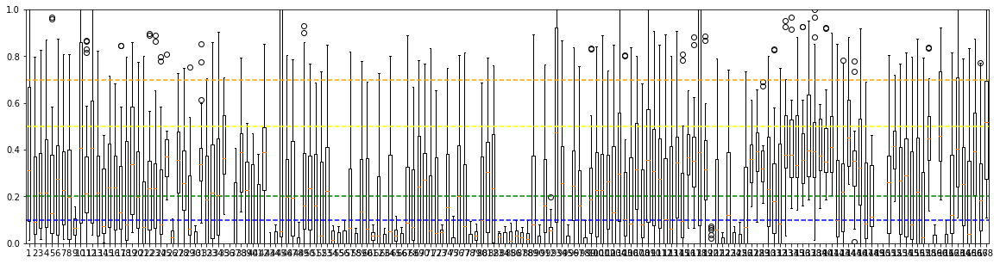

In [54]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrors)
ax.set_ylim([0,1])
ax.axhline(0.1, color="blue", linestyle="dashed")
ax.axhline(0.2, color="green", linestyle="dashed")
ax.axhline(0.5, color="yellow", linestyle="dashed")
ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

In [528]:
reg = RandomForestRegressor(n_estimators=100)
#reg = LinearRegression()
#reg = MLPRegressor(max_iter=1000)
algo = "j48"
relevantErrorsRel = []
relevantErrorsAbs = []
for d in tqdm(pd.unique(datasets)):
    dfTrainOrig = dfDefault.query("algorithm == '" + algo + "' and openmlid !=" + str(d))
    dfTestOrig = dfDefault.query("algorithm == '" + algo + "' and openmlid ==" + str(d))
    if len(dfTestOrig) == 0:
        continue
        
    # now compute average observations
    q = None
    print("Preparing learning data")
    dfTrain = pd.DataFrame([], columns=["fitsize", "numattributes", "applicationtimeperkinstances"])
    dfTest = pd.DataFrame([], columns=["fitsize", "numattributes", "applicationtimeperkinstances"])
    for gIndex, group in dfTrainOrig.groupby(["fitsize", "numattributes"]):
        #row = [gIndex[0], gIndex[1], np.quantile(group["applicationtimeperkinstances"], q)]
        row = [gIndex[0], gIndex[1], sp.stats.trim_mean(group["applicationtimeperkinstances"], 0.1)]
        dfTrain.loc[len(dfTrain)] = row
    for gIndex, group in dfTestOrig.groupby(["fitsize", "numattributes"]):
        #row = [gIndex[0], gIndex[1], np.quantile(group["applicationtimeperkinstances"], q)]
        row = [gIndex[0], gIndex[1], sp.stats.trim_mean(group["applicationtimeperkinstances"], 0.1)]
        dfTest.loc[len(dfTest)] = row
    
    # derive some important features
    for df in [dfTrain, dfTest]:
        df["f2"] = df["fitsize"] * df["numattributes"]
        df["f3"] = df["fitsize"] * df["numattributes"]**2
        df["f4"] = df["numattributes"]**2
        df.dropna(inplace=True)
    
    e = 2
    #XTrain = np.column_stack([dfTrain[["fitsize", "numattributes"]].values, dfTrain["numattributes"].values ** e, dfTrain["fitsize"].values * dfTrain["numattributes"].values, (dfTrain["fitsize"].values * dfTrain["numattributes"].values ** e)])
    XTrain = dfTrain[["fitsize", "numattributes", "f3"]].values
    #XTrain = np.array([dfTrain["fitsize"].values * (dfTrain["numattributes"].values ** e)]).T
    #XTrain = dfTrain[["fitsize", "numattributes"]].values
    YTrain = np.log(dfTrain["applicationtimeperkinstances"].values)
    print("Fitting the Model")
    reg.fit(XTrain, YTrain)
    print("Ready, now validating on " + str(len(dfTest)) + " many instances.")
    
    relevantErrorsOnThisDatasetRel = []
    relevantErrorsOnThisDatasetAbs = []
    for i, scenario in dfTest.iterrows():
        XTest = scenario[["fitsize", "numattributes", "f3"]].values.T
        #XTest = np.column_stack([dfTest[["fitsize", "numattributes"]].values, dfTest["fitsize"].values * dfTest["numattributes"].values])
        #XTest = list(scenario[["fitsize", "numattributes"]].values) + [scenario["numattributes"] ** e, scenario["fitsize"] * scenario["numattributes"], scenario["fitsize"] * scenario["numattributes"]**e]
        #XTest = np.array([dfTest["fitsize"].values * (dfTest["numattributes"].values ** e)]).T
        YTest = scenario["applicationtimeperkinstances"]
        
        F = np.exp(reg.predict([XTest])[0])
        isRelevant = max(YTest, F) > 60 and min(YTest, F) < 3600
        absError = F - YTest
        if isRelevant:
            relError = absError / YTest
            relevantErrorsOnThisDatasetRel.append(relError)
            relevantErrorsOnThisDatasetAbs.append(absError)
            print(XTest, YTest, F, F - YTest, str(np.round(100 * relError, 2)) + "%")
        #err.append(localError)

        #if np.mean(A) > 100 and np.mean(A) < 300:
#            #print(dfTest)
#            print(d, np.mean(A), np.mean(F), np.mean(err), rmse, str(np.round(rmse * 100 / np.mean(A), 2)) + "%")
        #sk.model_selection.cross_validate(ref, X, Y)
    relevantErrorsRel.append(relevantErrorsOnThisDatasetRel)
    relevantErrorsAbs.append(relevantErrorsOnThisDatasetAbs)

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


Preparing learning data
Fitting the Model
Ready, now validating on 152 many instances.
[1.0e+02 6.0e+03 3.6e+09] 51.316 74.08455976551832 22.76855976551832 44.37%
[1.0e+02 8.0e+03 6.4e+09] 91.988 106.04644475960386 14.058444759603859 15.28%
[1.e+02 1.e+04 1.e+10] 150.082 156.32154048386678 6.23954048386679 4.16%
[1.00e+02 1.20e+04 1.44e+10] 223.8551367331855 223.27129697132298 -0.5838397618625208 -0.26%
[1.00e+02 1.40e+04 1.96e+10] 319.4973767051417 310.25253430381485 -9.244842401326821 -2.89%
[1.00e+02 1.60e+04 2.56e+10] 488.28343949044586 414.42793114445317 -73.85550834599269 -15.13%
[1.00e+02 1.80e+04 3.24e+10] 499.1192052980133 527.2489065286408 28.12970123062746 5.64%
[1.e+02 2.e+04 4.e+10] 627.2166666666668 645.0035228886569 17.786856221990092 2.84%
[1.e+02 3.e+04 9.e+10] 1552.9948979591836 1617.9855268791969 64.99062892001325 4.18%
[1.0e+02 4.0e+04 1.6e+11] 2552.1818181818185 2623.414620052986 71.23280187116734 2.79%
[5.0e+02 6.0e+03 1.8e+10] 64.55866666666667 77.10527845773154 

[2.0e+03 6.0e+03 7.2e+10] 49.802 62.8591098049918 13.057109804991804 26.22%
[2.00e+03 8.00e+03 1.28e+11] 88.66666666666667 103.8374159797986 15.170749313131935 17.11%
[2.e+03 1.e+04 2.e+11] 142.86599999999999 169.00517752186983 26.13917752186984 18.3%
[2.00e+03 1.20e+04 2.88e+11] 202.01999999999998 221.0370065781429 19.01700657814291 9.41%
[2.00e+03 1.40e+04 3.92e+11] 290.63463368220744 309.0557035737053 18.421069891497837 6.34%
[2.00e+03 1.60e+04 5.12e+11] 399.09530026109655 413.72898956932715 14.6336893082306 3.67%
[2.00e+03 1.80e+04 6.48e+11] 530.3247422680413 524.8658125484277 -5.458929719613593 -1.03%
[2.e+03 2.e+04 8.e+11] 626.8791666666666 636.8945590446405 10.015392377973853 1.6%
[2.0e+03 3.0e+04 1.8e+12] 1727.3407821229052 1638.2569064508223 -89.08387567208297 -5.16%
[2.0e+03 4.0e+04 3.2e+12] 2663.8034188034194 2594.914334244177 -68.88908455924229 -2.59%
[4.00e+03 8.00e+03 2.56e+11] 104.42333333333333 97.10516512389326 -7.318168209440074 -7.01%
[4.e+03 1.e+04 4.e+11] 151.94733

[2.0e+04 6.0e+03 7.2e+11] 64.65266666666666 54.4456500954597 -10.207016571206964 -15.79%
[2.00e+04 8.00e+03 1.28e+12] 91.83733333333333 96.23755983576139 4.400226502428055 4.79%
[2.e+04 1.e+04 2.e+12] 161.64999999999998 148.82598257273418 -12.824017427265801 -7.93%
[2.00e+04 1.20e+04 2.88e+12] 265.79877515310585 214.56781126040713 -51.230963892698725 -19.27%
[2.00e+04 1.40e+04 3.92e+12] 302.7770069375619 304.3818528039679 1.6048458664059808 0.53%
[3.00e+04 8.00e+03 1.92e+12] 89.30533333333334 98.18027373315235 8.87494039981901 9.94%
[4.00e+04 6.00e+03 1.44e+12] 60.11266666666666 53.71914958967216 -6.393517076994499 -10.64%
Preparing learning data
Fitting the Model
Ready, now validating on 136 many instances.
[1.0e+02 6.0e+03 3.6e+09] 64.29 73.57886447862728 9.288864478627275 14.45%
[1.0e+02 8.0e+03 6.4e+09] 94.23733333333332 109.02708126839102 14.78974793505769 15.69%
[1.e+02 1.e+04 1.e+10] 145.046 155.47014358872988 10.42414358872989 7.19%
[1.00e+02 1.20e+04 1.44e+10] 207.778997940974

[6.00e+03 8.00e+03 3.84e+11] 132.15466666666666 95.21099465506161 -36.943672011605045 -27.95%
[6.e+03 1.e+04 6.e+11] 131.748 149.98293659920742 18.23493659920743 13.84%
[6.00e+03 1.20e+04 8.64e+11] 260.0034188034188 220.0892743830611 -39.9141444203577 -15.35%
[6.000e+03 1.400e+04 1.176e+12] 295.7086156824782 306.5033782829993 10.794762600521096 3.65%
[6.000e+03 1.600e+04 1.536e+12] 391.0765306122449 415.0119988537378 23.935468241492913 6.12%
[6.000e+03 1.800e+04 1.944e+12] 491.78821656050957 523.6386467723794 31.85043021186982 6.48%
[6.0e+03 2.0e+04 2.4e+12] 601.5087719298245 638.1730564803404 36.664284550515845 6.1%
[6.0e+03 3.0e+04 5.4e+12] 1687.4806629834256 1646.9040742293291 -40.57658875409652 -2.4%
[8.00e+03 6.00e+03 2.88e+11] 62.074000000000005 54.38492601320189 -7.689073986798114 -12.39%
[8.00e+03 8.00e+03 5.12e+11] 93.92266666666666 94.98191578955752 1.0592491228908614 1.13%
[8.e+03 1.e+04 8.e+11] 139.166 148.61799415864257 9.451994158642577 6.79%
[8.000e+03 1.200e+04 1.152e+1

[2.0e+03 6.0e+03 7.2e+10] 53.43266666666667 62.87247265029432 9.43980598362765 17.67%
[2.00e+03 8.00e+03 1.28e+11] 93.15200000000002 106.02442932786899 12.872429327868971 13.82%
[2.e+03 1.e+04 2.e+11] 143.56199999999998 167.3338895854845 23.77188958548453 16.56%
[2.00e+03 1.20e+04 2.88e+11] 204.7925925925926 219.91083703225146 15.118244439658866 7.38%
[2.00e+03 1.40e+04 3.92e+11] 278.7335164835165 309.69252298041937 30.959006496902873 11.11%
[2.00e+03 1.60e+04 5.12e+11] 456.1274074074074 413.4074443512345 -42.7199630561729 -9.37%
[2.00e+03 1.80e+04 6.48e+11] 517.0569514237856 524.3154450339657 7.258493610180153 1.4%
[2.e+03 2.e+04 8.e+11] 663.9100642398287 635.9861663599881 -27.923897879840524 -4.21%
[2.0e+03 3.0e+04 1.8e+12] 1802.757225433526 1646.5311950418259 -156.22603039170008 -8.67%
[2.0e+03 4.0e+04 3.2e+12] 2886.814814814815 2597.469287441323 -289.3455273734917 -10.02%
[4.00e+03 6.00e+03 1.44e+11] 67.78266666666667 55.64358220576969 -12.139084460896981 -17.91%
[4.00e+03 8.00e+03

[2.00e+04 8.00e+03 1.28e+12] 110.43266666666666 95.79384058616094 -14.638826080505723 -13.26%
[2.e+04 1.e+04 2.e+12] 140.15533333333332 149.5601428557069 9.404809522373597 6.71%
[2.00e+04 1.20e+04 2.88e+12] 224.43510324483776 216.06810553848553 -8.366997706352237 -3.73%
[2.00e+04 1.40e+04 3.92e+12] 301.9723320158103 304.2605218260713 2.288189810260974 0.76%
[3.00e+04 8.00e+03 1.92e+12] 88.19266666666665 97.93348375456156 9.74081708789491 11.04%
Preparing learning data
Fitting the Model
Ready, now validating on 114 many instances.
[2.0e+03 6.0e+03 7.2e+10] 59.91733333333334 61.31703417793243 1.3997008445990886 2.34%
[2.00e+03 8.00e+03 1.28e+11] 91.91866666666667 108.32366541042572 16.40499874375905 17.85%
[2.e+03 1.e+04 2.e+11] 141.548 168.07053245954367 26.52253245954367 18.74%
[2.00e+03 1.20e+04 2.88e+11] 217.10129310344826 220.21399414540343 3.1127010419551766 1.43%
[2.00e+03 1.40e+04 3.92e+11] 311.27291242362526 309.1451375799763 -2.1277748436489787 -0.68%
[2.00e+03 1.60e+04 5.12e+1

[6.00e+03 8.00e+03 3.84e+11] 86.58066666666667 95.29715121319954 8.716484546532868 10.07%
[6.e+03 1.e+04 6.e+11] 145.60533333333333 148.39040996730571 2.7850766339723805 1.91%
[6.00e+03 1.20e+04 8.64e+11] 233.04915514592932 220.41616384122761 -12.632991304701704 -5.42%
[6.000e+03 1.400e+04 1.176e+12] 287.4319248826291 306.45515857875824 19.023233696129125 6.62%
[6.000e+03 1.600e+04 1.536e+12] 393.0217669654289 414.9365318139435 21.91476484851455 5.58%
[6.000e+03 1.800e+04 1.944e+12] 502.0801335559265 523.7533712357466 21.67323767982009 4.32%
[6.0e+03 2.0e+04 2.4e+12] 634.6755646817248 637.0524645191857 2.3768998374608827 0.37%
[6.0e+03 3.0e+04 5.4e+12] 1606.8253968253966 1651.7650090627774 44.93961223738074 2.8%
[6.0e+03 4.0e+04 9.6e+12] 2561.875 2573.568791270115 11.69379127011507 0.46%
[1.0e+04 8.0e+03 6.4e+11] 94.44666666666666 96.05190216813233 1.6052355014656712 1.7%
[1.00e+04 1.20e+04 1.44e+12] 226.00891530460626 218.8482784515069 -7.160636853099362 -3.17%
[1.00e+04 1.40e+04 1.96

Preparing learning data
Fitting the Model
Ready, now validating on 170 many instances.
[1.0e+02 6.0e+03 3.6e+09] 57.11266666666666 73.00686347862283 15.89419681195617 27.83%
[1.0e+02 8.0e+03 6.4e+09] 90.344 107.04458527245114 16.70058527245115 18.49%
[1.e+02 1.e+04 1.e+10] 138.46266666666665 155.99873958139796 17.536072914731307 12.66%
[1.00e+02 1.20e+04 1.44e+10] 205.47867298578203 225.0194734807526 19.54080049497057 9.51%
[1.00e+02 1.40e+04 1.96e+10] 349.76261467889907 309.71342129646365 -40.04919338243542 -11.45%
[1.00e+02 1.60e+04 2.56e+10] 440.4088952654232 414.4317320745897 -25.977163190833494 -5.9%
[1.00e+02 1.80e+04 3.24e+10] 537.9982638888889 524.7987928921827 -13.199470996706168 -2.45%
[1.e+02 2.e+04 4.e+10] 724.9132530120482 642.4070860724315 -82.50616693961672 -11.38%
[1.e+02 3.e+04 9.e+10] 1602.5897435897436 1616.8956167679569 14.305873178213233 0.89%
[1.0e+02 4.0e+04 1.6e+11] 2643.965811965812 2614.5433714348515 -29.422440530960557 -1.11%
[5.0e+02 6.0e+03 1.8e+10] 54.1513

[2.0e+03 6.0e+03 7.2e+10] 57.056000000000004 62.74852884316456 5.692528843164553 9.98%
[2.00e+03 8.00e+03 1.28e+11] 102.50533333333334 104.97187681702451 2.4665434836911686 2.41%
[2.e+03 1.e+04 2.e+11] 156.172 171.09875685296532 14.926756852965326 9.56%
[2.00e+03 1.20e+04 2.88e+11] 205.63464140730716 220.56529781409222 14.930656406785062 7.26%
[2.00e+03 1.40e+04 3.92e+11] 311.71632653061226 308.70404357313123 -3.012282957481034 -0.97%
[2.00e+03 1.60e+04 5.12e+11] 414.3780487804878 413.10255383973487 -1.2754949407529352 -0.31%
[2.00e+03 1.80e+04 6.48e+11] 563.8145454545455 523.1973620240497 -40.61718343049586 -7.2%
[2.e+03 2.e+04 8.e+11] 603.842 639.0868952000982 35.2448952000982 5.84%
[2.0e+03 3.0e+04 1.8e+12] 1553.6820512820514 1647.6802333693352 93.9981820872838 6.05%
[2.0e+03 4.0e+04 3.2e+12] 2665.91452991453 2599.125633372219 -66.7888965423108 -2.51%
[6.00e+03 8.00e+03 3.84e+11] 91.04133333333334 94.87679390170956 3.83546056837622 4.21%
[6.e+03 1.e+04 6.e+11] 140.918 149.6575296080

[5.0e+02 6.0e+03 1.8e+10] 72.37599999999999 76.0070475257288 3.6310475257288033 5.02%
[5.0e+02 8.0e+03 3.2e+10] 92.28533333333333 119.31962390636895 27.03429057303562 29.29%
[5.e+02 1.e+04 5.e+10] 144.75466666666668 155.1631185177721 10.408451851105411 7.19%
[5.0e+02 1.2e+04 7.2e+10] 219.13367052023122 224.5396307844487 5.40596026421747 2.47%
[5.0e+02 1.4e+04 9.8e+10] 298.0436893203884 309.06017717938926 11.016487859000847 3.7%
[5.00e+02 1.60e+04 1.28e+11] 407.5858854860186 417.9390103967715 10.35312491075291 2.54%
[5.00e+02 1.80e+04 1.62e+11] 493.59450726979003 527.4632681677257 33.86876089793566 6.86%
[5.e+02 2.e+04 2.e+11] 630.6285714285714 642.1379651484742 11.509393719902846 1.83%
[5.0e+02 3.0e+04 4.5e+11] 1622.4893617021278 1633.9240424189234 11.434680716795583 0.7%
[5.e+02 4.e+04 8.e+11] 2346.6124031007753 2593.825322049032 247.21291894825663 10.53%
[1.0e+03 6.0e+03 3.6e+10] 55.058 77.03181986514093 21.973819865140932 39.91%
[1.0e+03 8.0e+03 6.4e+10] 90.57066666666665 129.208467

[1.00e+04 1.40e+04 1.96e+12] 284.6080449017773 306.2251369629984 21.617092061221115 7.6%
[1.00e+04 1.60e+04 2.56e+12] 427.5801952580195 415.96674886699213 -11.613446391027367 -2.72%
[1.00e+04 1.80e+04 3.24e+12] 512.2122719734659 519.3585749338306 7.146302960364665 1.4%
[1.e+04 2.e+04 4.e+12] 616.8519269776876 646.8592631845383 30.00733620685071 4.86%
[2.00e+04 8.00e+03 1.28e+12] 96.63466666666666 95.32246554592929 -1.3122011207373703 -1.36%
[2.e+04 1.e+04 2.e+12] 140.72733333333335 149.57662811004062 8.849294776707268 6.29%
[2.00e+04 1.20e+04 2.88e+12] 208.86313617606604 216.1918510180141 7.328714841948056 3.51%
[2.00e+04 1.40e+04 3.92e+12] 307.6004036326942 304.14263223639216 -3.457771396302064 -1.12%
[3.00e+04 8.00e+03 1.92e+12] 97.27066666666667 97.0521330235104 -0.21853364315627744 -0.22%
Preparing learning data
Fitting the Model
Ready, now validating on 174 many instances.
[1.0e+02 6.0e+03 3.6e+09] 50.97 72.45581113401302 21.48581113401302 42.15%
[1.0e+02 8.0e+03 6.4e+09] 89.74666

[5.0e+02 6.0e+03 1.8e+10] 53.09 76.95145831289753 23.861458312897526 44.95%
[5.0e+02 8.0e+03 3.2e+10] 94.402 118.39869481584043 23.996694815840428 25.42%
[5.e+02 1.e+04 5.e+10] 139.91666666666666 156.92080848107324 17.00414181440658 12.15%
[5.0e+02 1.2e+04 7.2e+10] 223.07917888563048 223.5319988390459 0.45281995341542824 0.2%
[5.0e+02 1.4e+04 9.8e+10] 294.97289448209096 309.40653650332274 14.433642021231776 4.89%
[5.00e+02 1.60e+04 1.28e+11] 408.1127320954907 416.77723691694325 8.664504821452567 2.12%
[5.00e+02 1.80e+04 1.62e+11] 481.01874999999995 527.4577837153104 46.439033715310416 9.65%
[5.e+02 2.e+04 2.e+11] 611.6585365853658 641.5012931548489 29.842756569483072 4.88%
[5.0e+02 3.0e+04 4.5e+11] 1647.3010752688174 1629.6692184369358 -17.631856831881578 -1.07%
[5.e+02 4.e+04 8.e+11] 2536.5206611570247 2600.9103327823013 64.3896716252766 2.54%
[1.0e+03 6.0e+03 3.6e+10] 59.71133333333333 78.03144151172356 18.320108178390228 30.68%
[1.0e+03 8.0e+03 6.4e+10] 89.31466666666667 130.2425046

[6.00e+03 6.00e+03 2.16e+11] 71.86933333333334 54.95561336060267 -16.913719972730675 -23.53%
[6.00e+03 8.00e+03 3.84e+11] 90.25333333333333 94.89888112299013 4.645547789656803 5.15%
[6.e+03 1.e+04 6.e+11] 183.88666666666666 148.35201961977705 -35.5346470468896 -19.32%
[6.00e+03 1.20e+04 8.64e+11] 223.77614138438878 219.82006142890756 -3.956079955481215 -1.77%
[6.000e+03 1.400e+04 1.176e+12] 297.56085686465434 306.3862781054311 8.825421240776734 2.97%
[6.000e+03 1.600e+04 1.536e+12] 381.7247820672478 415.01868047599186 33.29389840874404 8.72%
[6.000e+03 1.800e+04 1.944e+12] 563.8238532110091 522.5762935103119 -41.24755970069725 -7.32%
[6.0e+03 2.0e+04 2.4e+12] 640.1884057971015 636.6118156176085 -3.576590179492996 -0.56%
[6.0e+03 3.0e+04 5.4e+12] 1662.0378378378377 1640.9489222031027 -21.08891563473503 -1.27%
[6.0e+03 4.0e+04 9.6e+12] 2519.5806451612902 2595.9990551050937 76.41840994380345 3.03%
[8.00e+03 8.00e+03 5.12e+11] 96.97666666666667 94.4168225089167 -2.5598441577499784 -2.64%
[

[2.0e+04 6.0e+03 7.2e+11] 64.59333333333333 54.332243516146484 -10.26108981718685 -15.89%
[2.00e+04 8.00e+03 1.28e+12] 95.29933333333335 95.95554616068488 0.6562128273515242 0.69%
[2.e+04 1.e+04 2.e+12] 167.1773333333333 149.16687845344737 -18.01045487988594 -10.77%
[3.00e+04 8.00e+03 1.92e+12] 119.87333333333333 97.0238247436468 -22.849508589686536 -19.06%
Preparing learning data
Fitting the Model
Ready, now validating on 153 many instances.
[1.0e+02 6.0e+03 3.6e+09] 52.415333333333336 72.90897234531522 20.493639011981884 39.1%
[1.0e+02 8.0e+03 6.4e+09] 98.82266666666666 106.31770912871576 7.495042462049099 7.58%
[1.e+02 1.e+04 1.e+10] 151.79066666666668 155.78709758278293 3.9964309161162532 2.63%
[1.00e+02 1.20e+04 1.44e+10] 209.81008287292818 223.6609674966944 13.850884623766234 6.6%
[1.00e+02 1.40e+04 1.96e+10] 286.6302521008403 310.41332050461557 23.783068403775246 8.3%
[1.00e+02 1.60e+04 2.56e+10] 405.4695767195767 414.5880045758557 9.11842785627897 2.25%
[1.00e+02 1.80e+04 3.24e

[2.0e+03 6.0e+03 7.2e+10] 52.974000000000004 62.34265586970934 9.368655869709336 17.69%
[2.00e+03 8.00e+03 1.28e+11] 115.274 104.1899607268206 -11.0840392731794 -9.62%
[2.e+03 1.e+04 2.e+11] 155.10866666666666 163.63287587166857 8.52420920500191 5.5%
[2.00e+03 1.20e+04 2.88e+11] 216.40428571428572 220.29911101983765 3.894825305551933 1.8%
[2.00e+03 1.40e+04 3.92e+11] 300.4517716535433 309.32506488632293 8.873293232779645 2.95%
[2.00e+03 1.60e+04 5.12e+11] 397.7979274611399 413.9537600265768 16.155832565436867 4.06%
[2.00e+03 1.80e+04 6.48e+11] 517.3126050420168 522.9284245153768 5.615819473360034 1.09%
[2.e+03 2.e+04 8.e+11] 593.146771037182 639.2676506354367 46.120879598254646 7.78%
[2.0e+03 3.0e+04 1.8e+12] 1577.2908163265306 1647.9934408448676 70.70262451833696 4.48%
[2.0e+03 4.0e+04 3.2e+12] 2447.6171875 2625.3794136917727 177.7622261917727 7.26%
[4.00e+03 8.00e+03 2.56e+11] 88.14000000000001 96.47465667805231 8.334656678052298 9.46%
[4.e+03 1.e+04 4.e+11] 153.30666666666667 149.72

[6.e+03 1.e+04 6.e+11] 139.754 149.65449763987687 9.900497639876875 7.08%
[6.00e+03 1.20e+04 8.64e+11] 240.2823156225218 220.51354290206785 -19.76877272045394 -8.23%
[6.000e+03 1.400e+04 1.176e+12] 282.59683426443206 306.96386958087487 24.36703531644281 8.62%
[6.000e+03 1.600e+04 1.536e+12] 443.40315638450505 413.9313792883047 -29.471777096200356 -6.65%
[6.000e+03 1.800e+04 1.944e+12] 500.9627228525122 523.3466670925492 22.38394424003701 4.47%
[6.0e+03 2.0e+04 2.4e+12] 587.8806818181819 638.7058890012885 50.82520718310661 8.65%
[6.0e+03 3.0e+04 5.4e+12] 1638.684210526316 1650.0626201320158 11.378409605699744 0.69%
[8.00e+03 8.00e+03 5.12e+11] 109.406 94.61504755363416 -14.79095244636585 -13.52%
[8.e+03 1.e+04 8.e+11] 131.38933333333333 148.0271536461293 16.63782031279598 12.66%
[8.000e+03 1.200e+04 1.152e+12] 191.01466666666667 220.63412871703477 29.6194620503681 15.51%
[8.000e+03 1.400e+04 1.568e+12] 298.3500491642085 304.6868098813907 6.336760717182187 2.12%
[8.000e+03 1.600e+04 2.04

[2.0e+03 6.0e+03 7.2e+10] 51.826 62.4081385567445 10.582138556744496 20.42%
[2.00e+03 8.00e+03 1.28e+11] 90.87 106.26243827513203 15.392438275132022 16.94%
[2.e+03 1.e+04 2.e+11] 155.35666666666668 162.9216490712622 7.564982404595526 4.87%
[2.00e+03 1.20e+04 2.88e+11] 263.75347222222223 219.0430793313943 -44.71039289082793 -16.95%
[2.00e+03 1.40e+04 3.92e+11] 300.7443237907206 309.264137482525 8.519813691804359 2.83%
[2.00e+03 1.60e+04 5.12e+11] 391.06794871794875 414.388607898348 23.320659180399275 5.96%
[2.00e+03 1.80e+04 6.48e+11] 497.9719008264463 524.8413302240444 26.86942939759814 5.4%
[2.e+03 2.e+04 8.e+11] 651.3081896551724 636.9238167554918 -14.38437289968067 -2.21%
[2.0e+03 3.0e+04 1.8e+12] 1646.4919786096257 1650.293018921624 3.8010403119983494 0.23%
[2.0e+03 4.0e+04 3.2e+12] 2428.8359375 2625.1036734091217 196.2677359091217 8.08%
[4.00e+03 8.00e+03 2.56e+11] 101.58933333333333 97.62012236557982 -3.9692109677535115 -3.91%
[4.e+03 1.e+04 4.e+11] 142.436 149.48505570686083 7.0

[2.0e+03 6.0e+03 7.2e+10] 56.73466666666667 62.71722674146045 5.982560074793781 10.54%
[2.00e+03 8.00e+03 1.28e+11] 91.82133333333334 104.735808722856 12.914475389522664 14.06%
[2.e+03 1.e+04 2.e+11] 142.14333333333335 163.30677671416035 21.163443380827005 14.89%
[2.00e+03 1.20e+04 2.88e+11] 223.42857142857142 219.97088603540558 -3.457685393165832 -1.55%
[2.00e+03 1.40e+04 3.92e+11] 309.2315470171891 309.32124652607087 0.08969950888177891 0.03%
[2.00e+03 1.60e+04 5.12e+11] 421.40192043895746 413.4581605891353 -7.943759849822186 -1.89%
[2.00e+03 1.80e+04 6.48e+11] 562.1311475409835 523.3150543865988 -38.8160931543847 -6.91%
[2.e+03 2.e+04 8.e+11] 629.1501014198783 637.5453220920577 8.395220672179448 1.33%
[2.0e+03 3.0e+04 1.8e+12] 1588.4578947368423 1656.2638411267997 67.8059463899574 4.27%
[2.0e+03 4.0e+04 3.2e+12] 2472.464 2594.175788449686 121.71178844968608 4.92%
[4.00e+03 8.00e+03 2.56e+11] 101.06933333333335 95.50968842466204 -5.559644908671302 -5.5%
[4.e+03 1.e+04 4.e+11] 146.168

[5.0e+02 6.0e+03 1.8e+10] 53.602000000000004 75.72202654928313 22.120026549283125 41.27%
[5.0e+02 8.0e+03 3.2e+10] 102.55333333333334 119.63152877564418 17.078195442310843 16.65%
[5.e+02 1.e+04 5.e+10] 159.53 156.2656494342091 -3.264350565790892 -2.05%
[5.0e+02 1.2e+04 7.2e+10] 265.14223385689354 223.90784975228613 -41.234384104607415 -15.55%
[5.0e+02 1.4e+04 9.8e+10] 302.9930555555555 308.9145371020819 5.921481546526422 1.95%
[5.00e+02 1.60e+04 1.28e+11] 421.3660220994475 416.68310354698633 -4.68291855246116 -1.11%
[5.00e+02 1.80e+04 1.62e+11] 504.40327868852455 526.9508269981123 22.547548309587796 4.47%
[5.e+02 2.e+04 2.e+11] 607.835294117647 643.1233003049193 35.288006187272345 5.81%
[5.0e+02 3.0e+04 4.5e+11] 1816.7380952380952 1634.0816258744214 -182.65646936367375 -10.05%
[5.e+02 4.e+04 8.e+11] 2654.5213675213677 2597.841215657515 -56.68015186385264 -2.14%
[1.0e+03 6.0e+03 3.6e+10] 63.67133333333333 76.92511792569663 13.253784592363296 20.82%
[1.0e+03 8.0e+03 6.4e+10] 93.176 129.4

[6.00e+03 8.00e+03 3.84e+11] 90.73333333333333 94.81061170227461 4.077278368941279 4.49%
[6.e+03 1.e+04 6.e+11] 158.39133333333334 148.79477788597532 -9.596555447358014 -6.06%
[6.00e+03 1.20e+04 8.64e+11] 205.53165418652145 221.07359174783025 15.5419375613088 7.56%
[6.000e+03 1.400e+04 1.176e+12] 344.85327313769756 305.4801573416819 -39.37311579601567 -11.42%
[6.000e+03 1.600e+04 1.536e+12] 407.3129161118509 413.8648804536648 6.551964341813914 1.61%
[6.000e+03 1.800e+04 1.944e+12] 545.8611599297013 522.8602769462676 -23.000882983433712 -4.21%
[6.0e+03 2.0e+04 2.4e+12] 583.9020715630886 639.3141517582181 55.41208019512953 9.49%
[6.0e+03 3.0e+04 5.4e+12] 1529.3676470588236 1641.4720927063902 112.10444564756654 7.33%
[8.00e+03 8.00e+03 5.12e+11] 90.10533333333333 94.65565136089774 4.550318027564401 5.05%
[8.e+03 1.e+04 8.e+11] 158.88133333333334 147.5071000943093 -11.37423323902405 -7.16%
[8.000e+03 1.200e+04 1.152e+12] 228.47063253012047 220.24312244113221 -8.227510088988254 -3.6%
[8.000

[2.00e+03 8.00e+03 1.28e+11] 88.45666666666666 105.98309865891075 17.526431992244085 19.81%
[2.e+03 1.e+04 2.e+11] 158.69866666666667 161.3020869087983 2.6034202421316195 1.64%
[2.00e+03 1.20e+04 2.88e+11] 223.79206465833948 220.2574467298549 -3.534617928484579 -1.58%
[2.00e+03 1.40e+04 3.92e+11] 329.6309523809524 308.4440932870071 -21.186859093945316 -6.43%
[2.00e+03 1.60e+04 5.12e+11] 453.84638109305763 412.1682689893771 -41.67811210368052 -9.18%
[2.00e+03 1.80e+04 6.48e+11] 511.1973466003317 524.809157109788 13.61181050945629 2.66%
[2.e+03 2.e+04 8.e+11] 617.286282306163 640.0231674583606 22.7368851521976 3.68%
[2.0e+03 3.0e+04 1.8e+12] 1640.212765957447 1646.5925249071854 6.379758949738516 0.39%
[2.0e+03 4.0e+04 3.2e+12] 2682.646017699115 2606.8480159449923 -75.79800175412265 -2.83%
[4.00e+03 8.00e+03 2.56e+11] 94.88133333333333 95.83420154250344 0.9528682091701057 1.0%
[4.e+03 1.e+04 4.e+11] 133.74 151.0345432373014 17.294543237301383 12.93%
[4.00e+03 1.20e+04 5.76e+11] 205.475997

[5.0e+02 6.0e+03 1.8e+10] 54.29933333333333 77.34599272226625 23.046659388932916 42.44%
[5.0e+02 8.0e+03 3.2e+10] 104.764 123.88325079830832 19.11925079830833 18.25%
[5.e+02 1.e+04 5.e+10] 140.86599999999999 154.36811818980243 13.502118189802445 9.59%
[5.0e+02 1.2e+04 7.2e+10] 206.6281441196465 225.50912928148716 18.88098516184067 9.14%
[5.0e+02 1.4e+04 9.8e+10] 317.3690228690229 308.8043563011372 -8.564666567885695 -2.7%
[5.00e+02 1.60e+04 1.28e+11] 448.48034934497815 415.6729464921524 -32.80740285282576 -7.32%
[5.00e+02 1.80e+04 1.62e+11] 513.4515050167224 526.5020667272128 13.050561710490342 2.54%
[5.e+02 2.e+04 2.e+11] 648.0838574423481 640.8007796336656 -7.283077808682492 -1.12%
[5.0e+02 3.0e+04 4.5e+11] 1680.2989130434783 1615.4809191060301 -64.81799393744814 -3.86%
[5.e+02 4.e+04 8.e+11] 2572.4453781512602 2599.51595915712 27.07058100585982 1.05%
[1.0e+03 6.0e+03 3.6e+10] 53.77133333333333 77.87333736653136 24.10200403319803 44.82%
[1.0e+03 8.0e+03 6.4e+10] 87.82266666666668 132

[2.00e+03 1.40e+04 3.92e+11] 2948.7019230769233 307.73692529738526 -2640.964997779538 -89.56%
[2.00e+03 1.60e+04 5.12e+11] 5003.809523809524 410.44348836758 -4593.3660354419435 -91.8%
[4.0e+03 2.0e+03 1.6e+10] 71.25354838709677 8.270156505877338 -62.98339188121943 -88.39%
[4.0e+03 4.0e+03 6.4e+10] 274.95130748422 26.45927894444746 -248.49202853977258 -90.38%
[4.00e+03 6.00e+03 1.44e+11] 575.3796296296297 54.968124900209915 -520.4115047294198 -90.45%
[4.00e+03 8.00e+03 2.56e+11] 1029.6040268456377 94.74620766361707 -934.8578191820206 -90.8%
[4.e+03 1.e+04 4.e+11] 1761.72 148.24296595258852 -1613.4770340474115 -91.59%
[4.00e+03 1.20e+04 5.76e+11] 2854.3853211009173 220.1946127035271 -2634.19070839739 -92.29%
[6.0e+03 2.0e+03 2.4e+10] 69.63934426229508 7.5439160107931285 -62.09542825150196 -89.17%
[6.0e+03 4.0e+03 9.6e+10] 303.804 25.777681208050847 -278.0263187919491 -91.52%
[6.00e+03 6.00e+03 2.16e+11] 570.6452205882352 54.75684337209034 -515.8883772161449 -90.4%
[6.00e+03 8.00e+03 3.84

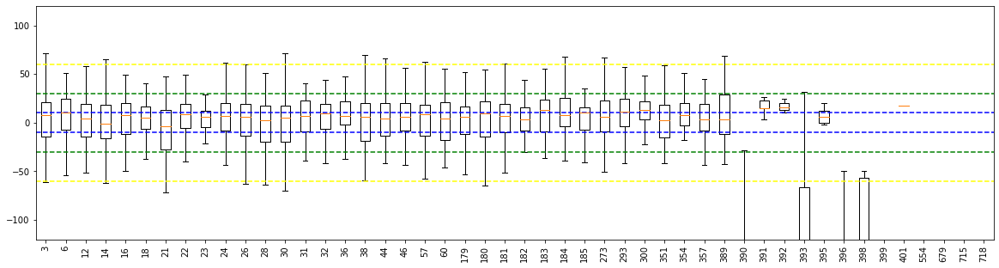

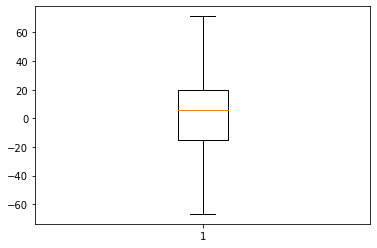

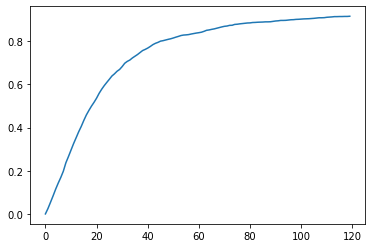

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


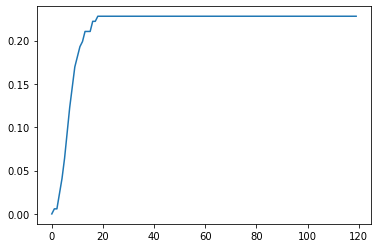

In [529]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

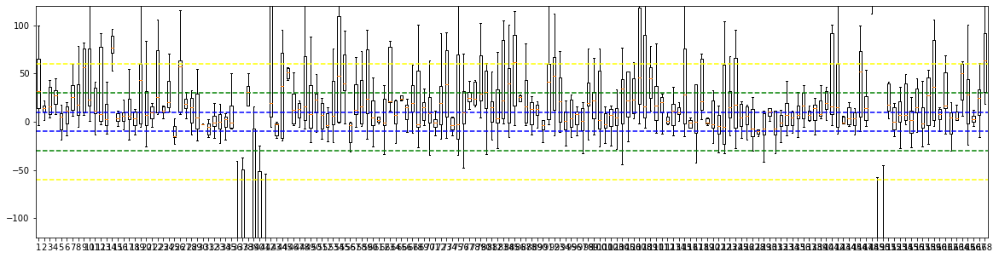

{'whiskers': [<matplotlib.lines.Line2D at 0x7f92de4ed890>,
 'caps': [<matplotlib.lines.Line2D at 0x7f92de4f3350>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f92de4ed2d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f92de4f3e10>],
 'fliers': [],
 'means': []}

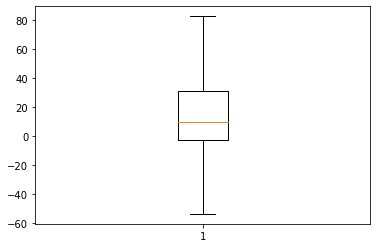

In [265]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

## Base features + F2

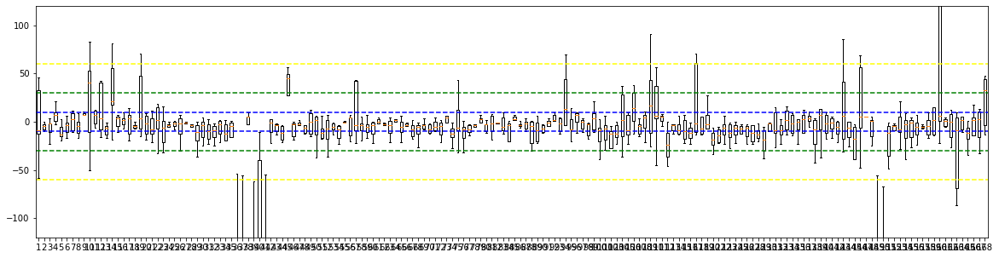

{'whiskers': [<matplotlib.lines.Line2D at 0x7f92e2f11750>,
 'caps': [<matplotlib.lines.Line2D at 0x7f92e59cd410>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f92e2f11950>],
 'medians': [<matplotlib.lines.Line2D at 0x7f92e6668290>],
 'fliers': [],
 'means': []}

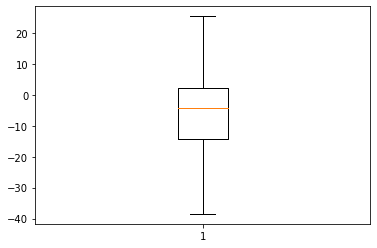

In [276]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F2 + F4

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F3

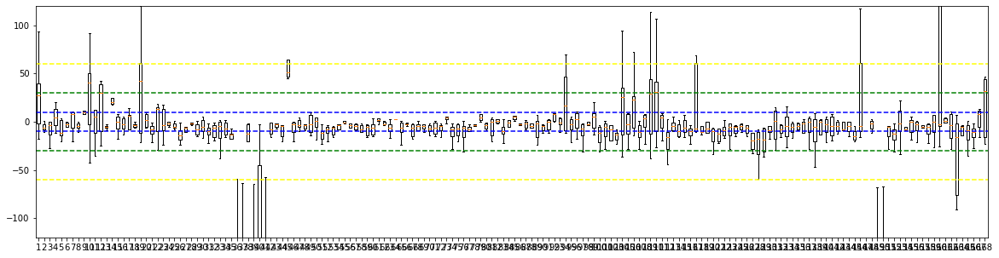

{'whiskers': [<matplotlib.lines.Line2D at 0x7f92e56bc090>,
 'caps': [<matplotlib.lines.Line2D at 0x7f92e56bcb10>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f92e56a3a90>],
 'medians': [<matplotlib.lines.Line2D at 0x7f92e56a5610>],
 'fliers': [],
 'means': []}

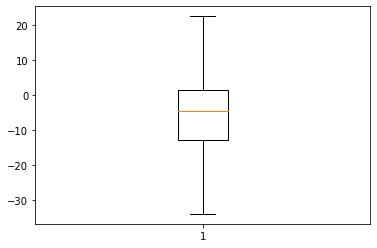

In [280]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### base features + F3 on q75 only on the big datasets

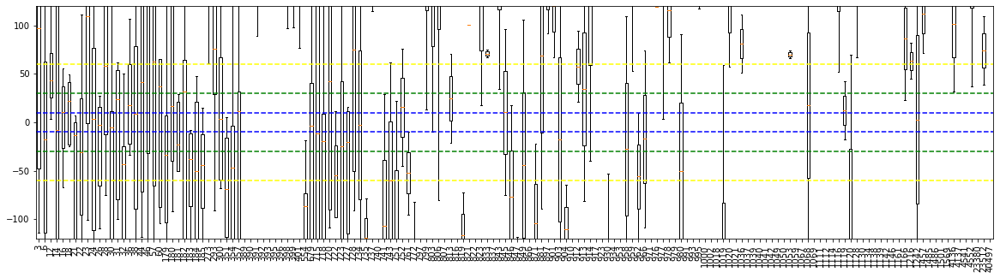

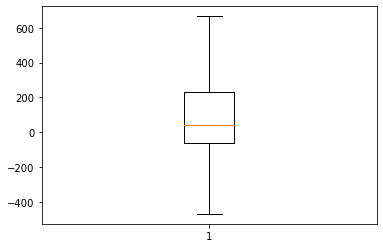

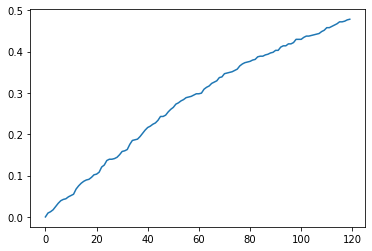

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


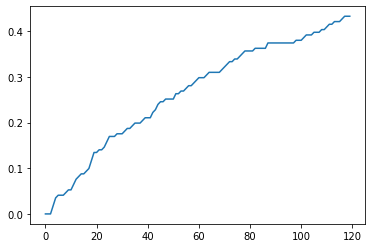

In [415]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

#### base features + F3 on q75 using the mean

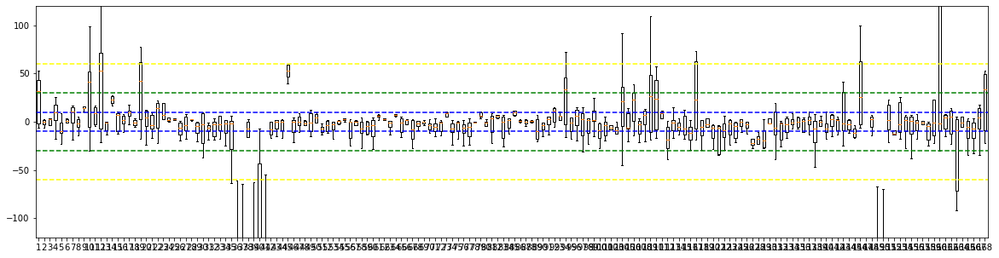

{'whiskers': [<matplotlib.lines.Line2D at 0x7f92e3d9c1d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f92e3d9cc50>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f92e3daebd0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f92e3d9b750>],
 'fliers': [],
 'means': []}

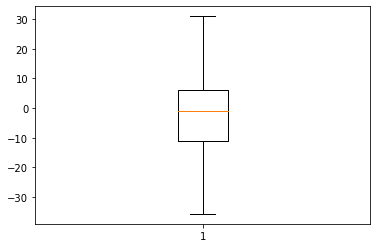

In [282]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')

#### q9

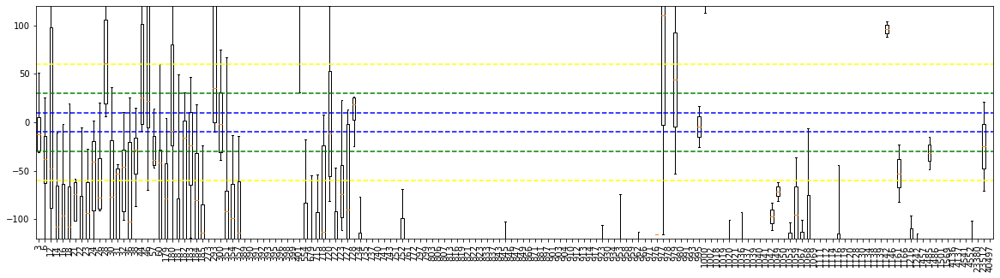

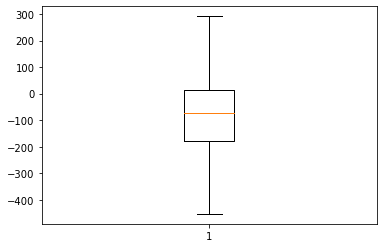

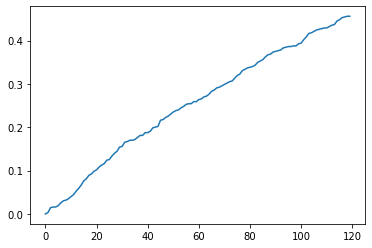

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


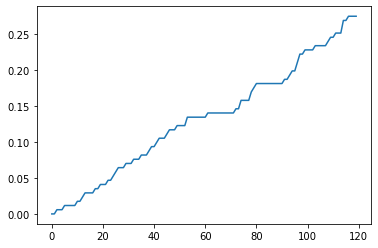

In [446]:
fig, ax = plt.subplots(figsize=(20,5))
ax.boxplot(relevantErrorsAbs, 0, '')
ax.set_ylim([-120,120])
ax.axhline(-10, color="blue", linestyle="dashed")
ax.axhline(10, color="blue", linestyle="dashed")
ax.axhline(-30, color="green", linestyle="dashed")
ax.axhline(30, color="green", linestyle="dashed")
ax.axhline(60, color="yellow", linestyle="dashed")
ax.axhline(-60, color="yellow", linestyle="dashed")
#ax.axhline(0.7, color="orange", linestyle="dashed")
ax.set_xticklabels(datasets, rotation=90)
plt.show()

L = [item for sublist in relevantErrorsAbs for item in sublist]
plt.boxplot(L, 0, '')
plt.show()

P = []
for t in range(120):
    P.append((t, len([s for s in L if np.abs(s) <= t]) / len(L)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])
plt.show()

P = []
for t in range(120):
    P.append((t, len([1 for s in relevantErrorsAbs if np.abs(np.median(s)) <= t]) / len(datasets)))
P = np.array(P)
plt.plot(P[:,0], P[:,1])

## 3. Identification of Suitable Features to predict runtimes

In [477]:
import numpy as np
import numpy.ma as ma
import scipy as sp
import pandas as pd
import sklearn as sk
import itertools
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import ARDRegression
from sklearn.isotonic import IsotonicRegression
import random
import os.path
from os import path
from itertools import chain, combinations
from commons import *
from tqdm import tqdm_notebook as tqdm

########################
## Feature Expansions ##
########################
def expandMult(arr):
    numAttributes = arr.shape[1]
    numPairs = int(sp.special.binom(numAttributes, 2))
    expansion = np.empty((arr.shape[0], numPairs))
    c = 0
    for i in range(numAttributes):
        for j in range(i):
            v = arr[:,i] * arr[:,j]
            expansion[:, c] = v
            c += 1
    return np.concatenate((arr, expansion), axis=1)

def expandPower(arr, exp):
    return np.concatenate((arr, np.power(arr, exp)), axis=1)

def expandLog(arr):
    return np.concatenate((arr,  ma.log(arr)), axis=1)

############################
## Classifier Experiments ##
############################
def getLearnFile(algorithm, openmlids=[]):
    regressionFile = "learnfile-" + algorithm + ".csv"
    if not path.exists(regressionFile):
        L = ["forest", "ann", "linear"]
        E = powerset(["log", "pow", "mul"])
        TrSize = np.unique([int(1 + ((i+1)**2.5)) for i in range(50)])
        S = range(10) # seeds
        algorithms = [algorithm]
        C = np.array([x for x in itertools.product(openmlids, algorithms, TrSize, S, E)])
        z = np.zeros(C.shape[0]) - 1
        C = np.column_stack([range(C.shape[0]), C])
        cols = ["reg_id", "openmlid", "classifier", "traindatasize", "seed", "expansions"]
        for learner in L:
            cols.append("mse_" + learner + "_trainruntime_half")
            cols.append("mse_" + learner + "_trainruntime_full")
            cols.append("mse_" + learner + "_testruntime_half")
            cols.append("mse_" + learner + "_testruntime_full")
            C = np.column_stack([C, z, z, z, z])
        exp = pd.DataFrame(C, columns=cols)
        exp.to_csv(regressionFile, index=False)
        return exp
    else:
        return pd.read_csv(regressionFile)

def updateLearnFile(algorithm, results):
    regressionFile = "learnfile-" + algorithm + ".csv"
    df = getLearnFile(algorithm).T ## assume that file exists.
    ## IN THE df OBJECT, line indices correspond to reg_ids
    for i, r in results.iterrows():
        df[r["reg_id"]] = r.values
    df = df.T
    df.to_csv(regressionFile, index=False)
    
def getRegressionInputRepresentation(dataspace, basefeatures, openmlid, algorithm, expansion, target):

    # reduce data only to those that have the desired classifier
    classifierSpace = dataspace.query("algorithm == '" + algorithm + "'")
    if len(classifierSpace.query("openmlid == " + str(openmlid))) == 0:
        raise Exception("No runtime results are available for algorithm " + algorithm + " and openmlid " + str(openmlid))
    classifierSpace = classifierSpace.dropna(subset=[target])
    
    # create features for regression problem
    print(basefeatures)
    X = np.nan_to_num(classifierSpace[basefeatures].values)
    if "log" in expansion:
        X = expandLog(X)
    if "pow" in expansion:
        X = expandPower(X, 2)
    if "mul" in expansion:
        X = expandMult(X)
    Y = classifierSpace[[target]].values
    print(X.shape)
    Y = np.log(Y + 0.0000001)
    
    indices, cIndices = getIndicesOfRowsForOpenMLId(classifierSpace, openmlid)
    if len(cIndices) == 0:
        raise Exception("No test data selected for openmlid " + str(openmlid))
    
    # create train/test split for regression problem based on a leave-one-out-split (using the openmlid)
    Xtrain = X[indices]
    Ytrain = Y[indices]
    #print("Reducing train data to those that do NOT have openmlid " + str(openmlid) + ". Length: " + str(len(Xtrain)) + "/" + str(len(X)))
    #print(classifierSpace.iloc[indices])
    #print(Xtrain)
    #print(Ytrain)
    
    # reduce test set to those corresponding to half/full dataset (according to targetdssize)
    Xtest = X[cIndices]
    Ytest = Y[cIndices]
    return Xtrain, Ytrain, Xtest, Ytest

### The function runExperiment performs the following three steps:
###
### 1) trains a learner for the train or prediction time (based on the variable $target)
###     - based on all given data for the classifier that does NOT belong to the given openmlid,
###     - deriving features based on the expansion keyword (log, multiplication, polynomial features)
###     - using traindatasize many random samples from that set
### 2) predicts the runtimes on the GIVEN openmlid for the requested train sizes and FULL
###    (refering to the maximum number of training samples for which a ground truth is known)
###
### 3) returns a dictionary with the different sample sizes for which predictions are requested
###    each one consisting of a pair of ground truth values and prediction values
###
### In both cases, the traindatasize variable refers to the number of instances used for FITTING the algorithm
### The concrete number of instances for which predictions are made is not relevant and not considered.
def runExperiment(dataspace, basefeatures, openmlid, algorithm, learner, traindatasize, expansion, target, samplesizes, sampleattributes):
    if type(samplesizes) != list:
        samplesizes = [samplesizes]
    Xtrain, Ytrain, Xtest, Ytest = getRegressionInputRepresentation(dataspace, basefeatures, openmlid, algorithm, expansion, target)
    if len(Xtrain) == 0:
        raise Exception("No training data available to evaluate " + algorithm + " against " + str(openmlid))
    
    numInstancesCol = basefeatures.index("fitsize")
    numInstances = Xtest[:,numInstancesCol]
    numAttributesCol = basefeatures.index("numattributes")
    numAttributes = Xtest[:,numAttributesCol]
    if numInstances.size == 0:
        return {}
    
    # now reduce the train set to the specified value
    tIndices = list(range(Xtrain.shape[0]))
    random.shuffle(tIndices)
    trainSizeBefore = len(Xtrain)
    Xtrain = Xtrain[tIndices[:traindatasize]]
    Ytrain = Ytrain[tIndices[:traindatasize]]
    #print("Reducing train data from " + str(trainSizeBefore) + " to " + str(traindatasize) + ". Effective train size: " + str(len(Xtrain)))
    
    # create learner
    if learner == 'forest':
        reg = RandomForestRegressor(n_estimators=100)
    else:
        if learner == "ann":
            reg = sk.neural_network.MLPRegressor(max_iter=1000)
        else:
                if learner == "linear":
                    reg = sk.linear_model.LinearRegression()
                else:
                    if learner == "isotonic":
                        reg = IsotonicRegression()
                    else:
                        raise Exception("Unknown learner " + learner)

    
    # train learner
    #print ("Training " + str(reg) + " with " + "\n\t" + str(Xtrain) + "\nand\n\t" + str(Ytrain))
    reg.fit(Xtrain, np.ravel(Ytrain))
  
    # gather predictions for learner
    out = {}
    maxInstances = int(np.max(numInstances))
    for sampleSize in samplesizes:
        if sampleSize == "full":
            sampleSize = maxInstances
        print("Creating predictions for sample size " + str(sampleSize))
        relevantIndices = np.where((numInstances == sampleSize) & (numAttributes == sampleattributes))[0]
        print("Relevant indices: ", relevantIndices)
        if len(relevantIndices) == 0:
            out[sampleSize] = ([], [])
        else:
            XtestSampleSize = Xtest[relevantIndices, :].reshape(relevantIndices.size,Xtest.shape[1])
            YtestSampleSize = Ytest[relevantIndices, :].reshape(relevantIndices.size,1)
            out[sampleSize] = (np.exp(np.ravel(YtestSampleSize)) - 0.0000001, np.exp(reg.predict(XtestSampleSize)) - 0.0000001)
            print(out[sampleSize])
            print("RMSE", RMSE(out[sampleSize][0], out[sampleSize][1]))
        if sampleSize == maxInstances:
            out["full"] = out[sampleSize]
    return out

# This is to recover runtime predictions and ground truths from the archive.
def getGTPredictionPairSeries(learner, basefeatures, expansions, trainpoints):
    serializedDF = pd.read_csv("data/workdata/runtime_predictions.csv").query("learner == '" + str(learner) + "' and basefeatures == '" + str(basefeatures).replace("'", "\\'").replace(",", ";") + "' and expansions == '" + str(expansions) + "' and trainpoints_algorithm == 'full' and trainpoints_learner == " + str(trainpoints))
    datasets = list(pd.unique(serializedDF["openmlid"]))
    classifiers = list(pd.unique(serializedDF["algorithm"]))
    seeds = list(pd.unique(serializedDF["seed"]))
    trainGTPredictionPairs = np.empty((len(datasets), len(classifiers)), dtype=object)
    testGTPredictionPairs = np.empty((len(datasets), len(classifiers)), dtype=object)
    pbar = tqdm(total=len(datasets) * len(classifiers) * len(seeds))
    for i, ds in enumerate(datasets):
        for j, c in enumerate(classifiers):
            if trainGTPredictionPairs[i][j] != None:
                raise Exception("ALREADY HAVE VALUES")
            trainVals = []
            testVals = []
            for seed in seeds:
                pbar.update(1)
                relevantData = serializedDF.query("openmlid == " + str(ds) + " and algorithm == '" + str(c) + "' and seed == " + str(seed))
                if len(relevantData) > 0:
                    if len(relevantData) >= 4:
                        trainGT = np.array(relevantData.query("recordtype == 'traintime_gt'")["entries"].values[0].split(";")).astype('float64')
                        trainPR = np.array(relevantData.query("recordtype == 'traintime_pr'")["entries"].values[0].split(";")).astype('float64')
                        testGT = np.array(relevantData.query("recordtype == 'predictiontime_gt'")["entries"].values[0].split(";")).astype('float64')
                        testPR = np.array(relevantData.query("recordtype == 'predictiontime_pr'")["entries"].values[0].split(";")).astype('float64')
                        if len(trainGT) != len(trainPR):
                            raise Exception("GT and PR of traintimes have different length!")
                        if len(testGT) != len(testPR):
                            raise Exception("GT and PR of prediction times have different length!")
                        trainVals.append((trainGT, trainPR))
                        testVals.append((testGT, testPR))
            trainGTPredictionPairs[i][j] = trainVals
            testGTPredictionPairs[i][j] = testVals
    pbar.close()
    return datasets, classifiers, trainGTPredictionPairs, testGTPredictionPairs

def updateGTPredictionPairSeries(df, datasets, algorithms, learners, seeds, trainpoints, basefeaturespace, expansions, sampleSizes, sampleattributes, predictionsFile, occurrencecheck = True):
    serializedDF = pd.read_csv(predictionsFile)
    interrupted = False
    t = len(algorithms) * len(datasets) * len(learners) * len(seeds) * len(trainpoints) * len(expansions) * len(basefeaturespace)
    k = 0
    
    ## ATTENTION: For training the application time (inference time) model, we previously dismiss all data that has no such entries
    mfdf = df.copy()
    mfdf["applicationtimeperkunits"] = mfdf["applicationtimeperunit"] * 1000
    dfTrain = mfdf[mfdf["fittime"].notnull()]
    dfTest = mfdf[(mfdf["applicationsize"] >= 100) & (mfdf["applicationtime"].notnull())]
    print(len(mfdf))
    print(len(dfTrain))
    print(len(dfTest))
    
    #print("Total number of steps: " + str(t))
    pbar = tqdm(total=t)
    itsSinceLastSave = 0
    for seed in seeds:
        for ds in datasets:
            for a in algorithms:
                if len(dfTrain[(dfTrain["openmlid"] != ds) & (dfTrain["algorithm"] == a)]) == 0:
                    pbar.update(1)
                    print("No data available to validate fittime of " + a + " against dataset " + str(ds))
                    continue
                
                for basefeatures in basefeaturespace:
                    basefeatures = sorted(basefeatures)
                    basefeaturesStr = str(basefeatures).replace(",", ";")
                    for exp in expansions:
                        for learner in learners:
                            for tp in trainpoints:
                                observedFail = False
                                try:
                                    k += 1
                                    pbar.update(1)
                                    if observedFail:
                                        continue
                                    #print("Learning model for " + str(ds) + "/" + c + " with seed " + str(seed) + " on " + str(tp) + " and expansions " + str(exp) + " (" + str(np.round(100 * k/t, 2)) + "%)")
                                    if occurrencecheck:
                                        excerpt = serializedDF.query("openmlid == " + str(ds) + " and algorithm == '" + a + "' and learner == '" + learner + "' and trainpoints_learner == " + str(tp) + " and basefeatures == \"" + basefeaturesStr + "\" and expansions == '" + str(exp) + "' and seed == " + str(seed))
                                        exists = len(excerpt) > 0
                                    else:
                                        exists = False

                                    if exists:
                                        pass#print("Skipping due to existence")
                                    else:
                                        
                                        ## conduct a leave-one out validation for the current dataset and algorithm
                                        print("START " + a)
                                        train_results = runExperiment(dfTrain, basefeatures, ds, a, learner, tp, exp, "fittime", sampleSizes, sampleattributes)
                                        prediction_results = runExperiment(dfTest, basefeatures, ds, a, learner, tp, exp, "applicationtimeperkunits", sampleSizes, sampleattributes)
                                        
                                        print("END " + a)

                                        # update the dataframe
                                        #if exists:
                                        #    serializedDF.loc[excerpt.query("recordtype == 'traintime_gt'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "traintime_gt", implode(train_results[0], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'traintime_pr'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "traintime_pr", implode(train_results[1], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'validationtime_gt'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "validationtime_gt", implode(prediction_results[0], ";")]
                                        #    serializedDF.loc[excerpt.query("recordtype == 'validationtime_pr'").index.values[0]] = [ds, c, seed, learner, tp, str(exp), "validationtime_pr", implode(prediction_results[1], ";")]
                                        #else:
                                        extDF = pd.DataFrame([], columns = serializedDF.columns)
                                        for sampleSize in train_results:
                                            if len(train_results[sampleSize][0]) > 0:
                                                if len(train_results[sampleSize][0]) != len(train_results[sampleSize][1]):
                                                    raise Exception("Length of GT and PR does not coincide!")
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "traintime_gt", implode(train_results[sampleSize][0], ";")]
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "traintime_pr", implode(train_results[sampleSize][1], ";")]
                                        for sampleSize in prediction_results:
                                            if len(prediction_results[sampleSize][0]) > 0:
                                                if len(prediction_results[sampleSize][0]) != len(prediction_results[sampleSize][1]):
                                                    raise Exception("Length of GT and PR does not coincide!")
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "predictiontime_gt", implode(prediction_results[sampleSize][0], ";")]
                                                extDF.loc[len(extDF)] = [ds, a, seed, learner, sampleSize, sampleattributes, tp, basefeaturesStr, str(exp), "predictiontime_pr", implode(prediction_results[sampleSize][1], ";")]
                                        serializedDF = pd.concat([serializedDF, extDF])

                                        # update csv file
                                        if itsSinceLastSave >= 500:
                                            print("Saving df with " + str(len(serializedDF)) + " entries to " + predictionsFile)
                                            serializedDF.to_csv(predictionsFile, index=False)
                                            itsSinceLastSave = 0
                                        else:
                                            itsSinceLastSave += 1 
                                except KeyboardInterrupt:
                                    print("Interrupted")
                                    interrupted = True
                                    observedFail = True
                                    break
                                except Exception as ex:
                                    if "No runtime results" in ex.args[0] or "No test data selected" in ex.args[0]:
                                        print(ex)
                                        observedFail = True
                                        pass
                                    else:
                                        raise
                        if interrupted:
                            break
                    if interrupted:
                        break
                if interrupted:
                    break
            if interrupted:
                break
        if interrupted:
            break
    pbar.close()
    if itsSinceLastSave > 0:
        serializedDF.to_csv(predictionsFile, index=False)

### Define the four feature set spaces

In [418]:
# Compute core feature set space
mandAttributes = ['fitsize']
coreAttributes = ['numattributes', 'numlabels', 'numnumericattributes', 'numsymbolicattributes', 'numberofcategories', 'numericattributesafterbinarization', 'totalvariance']
varCovAttributes = ['attributestocover50pctvariance', 'attributestocover90pctvariance', 'attributestocover95pctvariance', 'attributestocover99pctvariance']

# feature sets of size 2
featureSetSpaceCore = []
for x in varCovAttributes:
    c = mandAttributes.copy()
    c.append(x)
    c = sorted(c)
    featureSetSpaceCore.append(c)
for k in range(1, 2):
    for combo in itertools.combinations(coreAttributes, k):
        c = mandAttributes.copy()
        c.extend(combo)
        c = sorted(c)
        featureSetSpaceCore.append(c)
        if k < 1:
            for y in varCovAttributes:
                c2 = c.copy()
                c2.append(y)
                c2 = sorted(c2)
                featureSetSpaceCore.append(c2)

# feature sets of size 3
featureSetSpaceThree = []
featureSetSpaceThreeBases = [["fitsize", "numattributes"], ["fitsize", "attributestocover99pctvariance"]]
for basis in featureSetSpaceThreeBases:
    for feature in coreAttributes:
        if not feature in basis:
            c = basis.copy()
            c.append(feature)
            c = sorted(c)
            if not c in featureSetSpaceThree:
                featureSetSpaceThree.append(c)
    existentVarAttributes = len([x for x in basis if "variance" in x])
    if existentVarAttributes < 1:
        for y in varCovAttributes:
            c = basis.copy()
            c.append(y)
            c = sorted(c)
            if not c in featureSetSpaceThree:
                featureSetSpaceThree.append(c)


allFeatures = []
allFeatures.extend(mandAttributes)
allFeatures.extend(coreAttributes)
allFeatures.extend(varCovAttributes)

# full feature set
fsSpace = []
fsSpace.extend([["fitsize"]])
fsSpace.extend(featureSetSpaceCore)
fsSpace.extend(featureSetSpaceThree)
fsSpace.extend([allFeatures])

# check that only lists of strings are contained
print("These are the considered feature sets:")
for fs in fsSpace:
    if type(fs) != list:
        raise Exception(str(fs) + " is not a valid feature set.")
    for f in fs:
        if type(f) != str:
            raise Exception(str(f) + " in feature set " + str(fs) + " is not a valid feature.")
    print(fs)

These are the considered feature sets:
['fitsize']
['attributestocover50pctvariance', 'fitsize']
['attributestocover90pctvariance', 'fitsize']
['attributestocover95pctvariance', 'fitsize']
['attributestocover99pctvariance', 'fitsize']
['fitsize', 'numattributes']
['fitsize', 'numlabels']
['fitsize', 'numnumericattributes']
['fitsize', 'numsymbolicattributes']
['fitsize', 'numberofcategories']
['fitsize', 'numericattributesafterbinarization']
['fitsize', 'totalvariance']
['fitsize', 'numattributes', 'numlabels']
['fitsize', 'numattributes', 'numnumericattributes']
['fitsize', 'numattributes', 'numsymbolicattributes']
['fitsize', 'numattributes', 'numberofcategories']
['fitsize', 'numattributes', 'numericattributesafterbinarization']
['fitsize', 'numattributes', 'totalvariance']
['attributestocover50pctvariance', 'fitsize', 'numattributes']
['attributestocover90pctvariance', 'fitsize', 'numattributes']
['attributestocover95pctvariance', 'fitsize', 'numattributes']
['attributestocover99pc

In [419]:
dsSample = [datasets[int(x)] for x in np.linspace(0, len(datasets) - 1, 11)]
print(dsSample)

[3, 44, 389, 727, 813, 901, 976, 1040, 1130, 4541, 41991]


In [ ]:
dfDatasetsWithMetafeatures = pd.read_csv("data/metafeatures-derived.csv")[["openmlid", "name", "numinstances", "numattributes"]]
dfDatasetsWithMetafeaturesSample = dfDatasetsWithMetafeatures[dfDatasetsWithMetafeatures["openmlid"].isin(dsSample)]
fig, ax = plt.subplots(1, 1, figsize=(6, 5))
a = ax
a.scatter(dfDatasetsWithMetafeatures[["numinstances"]], dfDatasetsWithMetafeatures[["numattributes"]])
a.set_xscale("log")
a.set_yscale("log")
a.set_xlim([100, 10**7])
a.set_ylim([1, 10**5])
a.set_ylabel("Number of Attributes")
a.set_xlabel("Number of Instances")
#a = ax[1]
a.scatter(dfDatasetsWithMetafeaturesSample[["numinstances"]], dfDatasetsWithMetafeaturesSample[["numattributes"]], color="red")
#a.set_xscale("log")
#a.set_yscale("log")
#a.set_xlim([100, 10**7])
#a.set_ylim([1, 10**5])
#a.set_ylabel("Number of Attributes")
#a.set_xlabel("Number of Instances")
fig.tight_layout()
fig.savefig("plots/sampledata.pdf")
fig.show()

for ds in dfDatasetsWithMetafeaturesSample["name"].values:
    print(", {\sc " + ds + "}")

In [432]:
pfSuffixFS = '-featureselection-10000'
pfFileFS = "data/workdata/runtimepredictions" + pfSuffixFS + ".csv"
metricFileFS = "data/workdata/runtimepredictions" + pfSuffixFS + "_withmetrics.csv"

## 3.1. Gather Data of all Regressors for Feature Set Selection

In [ ]:
trainsizes = [10000]
selectedDatasets = dsSample
selectedAlgorithms = algorithms
expansions = [()]
seeds = range(2)
sortedFSSpace = [sorted(fs) for fs in fsSpace]
numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(fsSpace) * len(seeds)

In [ ]:
dfFeatureSelection = dfDefault[(dfDefault["openmlid"].isin(selectedDatasets))]
updateGTPredictionPairSeries(dfFeatureSelection, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, sortedFSSpace, expansions, "full", pfFileFS)

## 3.2. Plot Scores for the Feature Sets

In [491]:
def RMSE(A, F):
    rmse = np.sqrt(sk.metrics.mean_squared_error(np.nan_to_num(A), np.nan_to_num(F)))
    print(A, F, rmse)
    return rmse

def RMSEOverX(A, F, x):
    indices = np.where(np.maximum(A, F) > x)[0]
    return RMSE(A[indices], F[indices]) if len(indices) > 0 else np.nan

def RMSEOverOne(A, F):
    return RMSEOverX(A, F, 1)

def RMSEOverTwo(A, F):
    return RMSEOverX(A, F, 2)

def RMSEOverTen(A, F):
    return RMSEOverX(A, F, 10)

def overMAPE(A, F):
    n = 0
    s = 0
    for i in range(len(A)):
        if A[i] <= F[i] and (F[i] > 10):
            s += (F[i] - A[i]) / np.maximum(1, A[i])
            n+=1
    return s / n if n > 0 else 0

def underMAPE(A, F):
    n = 0
    s = 0
    for i in range(len(A)):
        if A[i] >= F[i] and (A[i] > 10):
            s += (A[i] - F[i]) / np.maximum(1, A[i])
            n+=1
    return s / n if n > 0 else 0

def getAllMetrics(datasets, classifiers, data_train, data_pred, predicate):
    metrics = {}
    for measure in [RMSE, SMAPE, RDIST, overMAPE, underMAPE]:
        measureName = str(measure.__name__)
        metrics[measureName] = {}
        metrics[measureName]['train'] = getMeasureForDatasetClassifierPairs(datasets, classifiers, data_train, measure, predicate)
        metrics[measureName]['test'] = getMeasureForDatasetClassifierPairs(datasets, classifiers, data_pred, measure, predicate)
    return metrics

def createPredictionErrorFile(suffix = "", query = None):
    inFile = "data/workdata/runtimepredictions" + suffix + ".csv"
    outFile = "data/workdata/runtimepredictions" + suffix + "_withmetrics.csv"
    serializedDF = pd.read_csv(inFile)
    if not query is None:
        serializedDF = serializedDF.query(query)
    dfOut = pd.read_csv(outFile)
    attributes = ["openmlid", "algorithm", "learner", "trainpoints_algorithm", "trainpoints_learner", "basefeatures", "expansions"]
    groups = serializedDF.groupby(attributes)
    measures = [RMSE, RMSEOverOne, RMSEOverTwo, RMSEOverTen, SMAPE, overMAPE, underMAPE]
    resultCols = []
    for measure in measures:
        name = str(measure.__name__)
        resultCols.append("fittime_" + name)
        resultCols.append("predicttime_" + name)
        
    cols = attributes.copy()
    cols.extend(resultCols)
    rows = []
    i = 0
    for gIndex, group in tqdm(groups):
        print(gIndex)
        row = list(gIndex)
        matches = dfOut[np.count_nonzero((dfOut[attributes] == row).values, axis=1) == len(attributes)]
        if len(matches) == 0:

            # sub-group by seed
            subresults = {}
            for rc in resultCols:
                subresults[rc] = []
            for sgIndex, subgroup in group.groupby("seed"):

                if len(subgroup) >= 4:
                    print("seed: ", sgIndex)

                    # compute basis to create metrics
                    trainGT = np.array(subgroup.query("recordtype == 'traintime_gt'")["entries"].values[0].split(";")).astype('float64')
                    trainPR = np.array(subgroup.query("recordtype == 'traintime_pr'")["entries"].values[0].split(";")).astype('float64')
                    testGT = (np.array(subgroup.query("recordtype == 'predictiontime_gt'")["entries"].values[0].split(";")).astype('float64'))
                    testPR = (np.array(subgroup.query("recordtype == 'predictiontime_pr'")["entries"].values[0].split(";")).astype('float64'))
                    if len(trainGT) != len(trainPR):
                        raise Exception("GT and PR of traintimes have different length!")
                    if len(testGT) != len(testPR):
                        raise Exception("GT and PR of prediction times have different length!")

                    # compute metrics
                    for measure in measures:
                        measureName = str(measure.__name__)
                        print("Measure " + measureName)
                        subresults["fittime_" + measureName].append(measure(trainGT, trainPR))
                        subresults["predicttime_" + measureName].append(measure(testGT, testPR))
                        #print(measureName + ": " + str(subresults["fittime_" + measureName][-1]) + "/" + str(subresults["predicttime_" + measureName][-1]))
                        
                    #if np.abs(np.mean(testPR)-np.mean(testGT) > 30):
                    #    print(gIndex)
                    #    print(testPR)
                    #    print(testGT)

            for sr in subresults:
                row.append(np.mean(subresults[sr]))
            i += 1
        
            rows.append(row)
            if i % 1000 == 0:
                df = pd.concat([dfOut, pd.DataFrame(rows, columns = cols)])
                df.to_csv(outFile, index=False)
                i = 0
                
    if i > 0:
        df = pd.concat([dfOut, pd.DataFrame(rows, columns = cols)])
        df.to_csv(outFile, index=False)
    else:
        df = dfOut
    return df

def getMeasureForDatasetClassifierPairs(datasets, classifiers, data, measure, predicate):
    output = np.zeros((len(datasets), len(classifiers)))
    for i, d in enumerate(datasets):
        for j, c in enumerate(classifiers):
            if type(data[i][j]) == list and len(data[i][j]) > 0:
                A = np.nan_to_num(data[i][j][0][0])
                F = np.nan_to_num(data[i][j][0][1])
                
                if predicate is None:
                    indices = np.arange(len(A))
                else:
                    indices = np.where(predicate(A, F))[0] 
                output[i][j] = measure(A[indices], F[indices]) if len(indices) > 0 else np.nan
    return output

In [492]:
def getErrorCube(dfMetrics, learner, featuresets, algorithms, datasets, trainpoints, metric, WARNINGS = True):
    cube = np.zeros((len(featuresets), len(algorithms), len(datasets)))
    dfView = dfMetrics[dfMetrics["learner"] == learner]
    for i, fs in enumerate(featuresets):
        for j, a in enumerate(algorithms):
            for k, d in enumerate(datasets):
                basis = dfView[(dfView["basefeatures"] == str(fs).replace(",", ";")) & (dfView["algorithm"] == a) & (dfView["openmlid"] == d) & (dfView["trainpoints_learner"] == trainpoints) & (dfView[metric].notnull())][metric].astype(float).values
                if WARNINGS and len(basis) == 0:
                    print("Warning: No RMSE available for " + a + " on dataset " + str(d))
                cube[i,j,k] = np.mean(basis) if len(basis) > 0 else np.nan    
    return cube

def plotFeatureSetEvaluations(learners, algorithms, featuresets, datasets, trainpoints, metric, cubes, WARNINGS = False):
    #if cubes is None:
    #    dfMetrics = pd.read_csv("data/workdata/runtime_predictions_withmetrics.csv")
    #    dfMetrics = dfMetrics[dfMetrics["trainpoints_learner"] == trainpoints]

    fig1, ax1 = plt.subplots(3, len(learners), figsize=(10, 10), sharex = True, sharey = True)
    fig2, ax2 = plt.subplots(1, len(learners), figsize=(6, 7), sharey = True)
    for aIndex, learner in enumerate(learners):
        
        # get error cube for this learner
        TRIM = 0.1
        if cubes is None:
            cube = getErrorCube(dfMetrics, learner, featuresets, algorithms, datasets, trainpoints, metric, WARNINGS)
        else:
            cube = cubes[learner]
        trimmedMeans = np.array([[sp.stats.trim_mean(cube[i,j][~np.isnan(cube[i,j])], TRIM) for j,a in enumerate(algorithms)] for i,fs in enumerate(featuresets)])
        a = ax1[0][aIndex] if len(learners) > 1 else ax1[0]
        a.imshow(trimmedMeans / np.nansum(trimmedMeans, axis=0,keepdims=1), vmax=.8)
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels(featuresets)
        
        a = ax1[1][aIndex] if len(learners) > 1 else ax1[1]
        q90 = np.nanquantile(cube, 0.9, axis=2)
        q90Normalized = q90 / np.nansum(q90, axis=0,keepdims=1)
        a.imshow(q90Normalized, vmax=1)
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels(featuresets)
        a.set_xticks(range(len(algorithms) - 1))
        a.set_xticklabels(algorithms, rotation=90)
        
        a = ax1[2][aIndex] if len(learners) > 1 else ax1[2]
        ranks = np.array([sp.stats.rankdata(np.nanmean(cube[:,j,:], axis=1), method='min') for j in range(len(algorithms))])
        a.imshow(ranks.T, vmax=len(featuresets))
        a.set_yticks(range(len(featuresets)))
        a.set_yticklabels([str([featureAliases[f] for f in x]).replace("'", "").replace("]", "").replace("[", "") if len(x) < 5 else "all" for x in featuresets])
        a.set_xticks(range(len(algorithms)))
        a.set_xticklabels(algorithms, rotation=90)

        ### BAR PLOTS
        a = ax2[aIndex] if len(learners) > 1 else ax2
        ind = np.arange(len(featuresets))
        width = .25
        colors = ["C0", "C1", "C2"]
        a.barh(ind, np.nanmean(ranks, axis=0), width, color=colors[0])
        print(np.nanmin(np.nanmean(ranks, axis=0)))
        a.axvline(np.nanmin(np.nanmean(ranks, axis=0)), color=colors[0], linestyle="--", linewidth="1", label='_nolegend_')
        A = np.minimum(10000, [sp.stats.trim_mean(trimmedMeans[i][~np.isnan(trimmedMeans[i])], TRIM) for i,fs in enumerate(featuresets)])
        a.barh(ind + width, A, width, color=colors[1])
        print(np.nanmin(A))
        a.axvline(np.nanmin(A), color=colors[1], linestyle="--", linewidth="1", label='_nolegend_')
        B = np.minimum(10000, [sp.stats.trim_mean(q90[i][~np.isnan(q90[i])], TRIM) for i,fs in enumerate(featuresets)])
        a.barh(ind + 2 * width, B, width, color=colors[2])
        print(np.nanmin(B))
        a.axvline(np.nanmin(B), color=colors[2], linestyle="--", linewidth="1", label='_nolegend_')
        a.set_yticks(range(len(featuresets)))
        #for x in cFeatures:
        a.set_yticklabels([str([featureAliases[f] for f in x]).replace("'", "").replace("]", "").replace("[", "") if len(x) < 5 else "all" for x in featuresets])
        a.set_title(learnerAliases[learner])
        a.set_xlim([1, 1000])
        a.set_xscale("log")
        a.invert_yaxis()
    
    #fig2.legend(["avg rank", "trimmed mean", "q90"])
    return ax2

def getBestFeatureSet(learner, algorithm, featuresets, trainpoints, metric, cube):
    #if cube is None:
    #    dfMetrics = pd.read_csv("data/workdata/runtime_predictions_withmetrics.csv")
    #    datasets = pd.unique(dfMetrics["openmlid"])
    #    cube = getErrorCube(dfMetrics, learner, featuresets, [algorithm], datasets, trainpoints, metric, WARNINGS = False)[:,0,:]
    trimmedMeans = np.array([sp.stats.trim_mean(cube[i][~np.isnan(cube[i])], 0.2) for i,fs in enumerate(featuresets)])
    q90 = np.nanquantile(cube, 0.9, axis=1)
    q50 = np.nanquantile(cube, 0.5, axis=1)
    ranks = np.mean([sp.stats.rankdata(base) for base in [trimmedMeans, q90, q50]], axis=0)
    #for i, m in enumerate(ranks):
    #    print(str(featuresets[i]) + ": " + str(m))
    return featuresets[np.argmin(ranks)]

#### Generate the Error Cubes used to produce the bar plots

In [493]:
pfSuffixFS

'-featureselection-10000'

In [494]:
createPredictionErrorFile(pfSuffixFS, "trainpoints_learner == 10000")

FileNotFoundError: [Errno 2] File data/workdata/runtimepredictions-featureselection-10000.csv does not exist: 'data/workdata/runtimepredictions-featureselection-10000.csv'

In [ ]:
dfMetrics = pd.read_csv(metricFileFS)
dfMetrics = dfMetrics[dfMetrics["trainpoints_learner"] == 10000]
cubes = {}
pbar = tqdm(total = 6)
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    cubes[metric] = {}
    for learner in learners:
        cube = getErrorCube(dfMetrics, learner, fsSpace, algorithms, dsSample, 10000, metric, False)
        cubes[metric][learner] = cube
        pbar.update(1)
pbar.close()

In [ ]:
np.nanmean(cubes["predicttime_RMSE"]["forest"][0])

### How often is every feature set selected among the atomic algorithms?

In [ ]:
counts = {}
for aIndex, algo in enumerate(algorithms):
    fs = getBestFeatureSet("forest", algo, fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"]["forest"][:,aIndex,:])
    fss = str(fs)
    if not fss in counts:
        counts[fss] = 0
    counts[fss] += 1
for f in counts:
    print(f + ": " + str(counts[f]))

### Create eventual plots for the paper

In [ ]:
cDatasets = dsSample
cClassifiers = algorithms
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    ax = plotFeatureSetEvaluations(learners, cClassifiers, fsSpace, cDatasets, 10000, metric, cubes[metric], WARNINGS=False)
    for i in range(3):
        ax[i].axhline(1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
        ax[i].axhline(len(featureSetSpaceCore) + 1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
        ax[i].axhline(len(featureSetSpaceCore) + len(featureSetSpaceThree) + 1 - 0.3, color="black", linestyle="-", linewidth="1", label='_nolegend_')
    plt.legend(["Avg Rank", "0.1-Trimmed Mean", "Q90"], bbox_to_anchor=(0.7, -0.07), ncol=3)
    plt.tight_layout()
    plt.savefig("plots/featuresetselection-all-" + metric + ".pdf", bbox_inches='tight')

# 4. Create Learning Curves for each regressor/algorithm combo
Use the feature sets that are best with respect to the samples.

### Collect Learning Curve Data For [ni + na + \theta]

In [464]:
#trainsizes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 50000, 100000]
trainsizes = [1, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000]
#trainsizes = [100, 1000, 10000]
selectedDatasets = dsSample
selectedAlgorithms = algorithms
expansions = [()]
seeds = range(1)
k = 0
numCollectors = len(learners) * len(selectedAlgorithms)
pbar = tqdm(total = numCollectors)
dfSampleDefault = dfDefault[dfDefault["openmlid"].isin(selectedDatasets)]
dfSampleConfigured = dfConfigured[dfConfigured["openmlid"].isin(selectedDatasets)]
for aIndex, algo in enumerate(selectedAlgorithms):
    dfAlgo = dfSampleConfigured[dfSampleConfigured["algorithm"] == algo].copy()
    supportedDatasets = list(dfAlgo["openmlid"].drop_duplicates().values)
    
    fs = ["fitsize", "numattributes"] # we now only create data for this specific feature set
    if len(dfAlgo) == 0 or len(supportedDatasets) < 6:
        dfAlgo = dfSampleDefault[dfSampleDefault["algorithm"] == algo]
    
    else:
        if algo in preprocessors:
            parts = dfAlgo["algorithmoptions"].values[0].split(";")
            dfAlgo["searcheroptions"] = parts[0]
            dfAlgo["evaloptions"] = parts[1]
        prevCols = dfAlgo.columns
        dfAlgo = explodeAlgorithmOptions(dfAlgo)
        algoCols = [f for f in dfAlgo if not f in prevCols]
        fs.extend(algoCols)
        
    
    if len(dfAlgo) == 0:
        raise Exception("No data for " + algo + " available!")
    
    supportedDatasets = list(dfAlgo["openmlid"].drop_duplicates().values)
    print(str(len(supportedDatasets)) + " supported datasets for " + algo + ": " + str(supportedDatasets))
    
    for learner in learners:
        #fs = getBestFeatureSet(learner, algo, fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"][learner][:,aIndex,:])
        #fs = sorted(fs)
        #fs = ["fitsize", "numattributes"]
        print(algo + "/" + learner + ": " + str(fs))
        print(pd.unique(dfAlgo["openmlid"]))
        #numExperiments = len(selectedDatasets) * len([algo]) * len(trainsizes) * len(expansions) * len(seeds)
        updateGTPredictionPairSeries(dfAlgo, selectedDatasets, [algo], [learner], seeds, trainsizes, [fs], expansions, "full", pfFileFS)
        pbar.update(1)
pbar.close()

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # Remove the CWD from sys.path while we load stuff.


2 supported datasets for bayesnet: [3, 44]
bayesnet/forest: ['fitsize', 'numattributes']
[ 3 44]


FileNotFoundError: [Errno 2] File data/workdata/runtimepredictions-featureselection-10000.csv does not exist: 'data/workdata/runtimepredictions-featureselection-10000.csv'

In [ ]:
getBestFeatureSet("linear", "bayesnet", fsSpace, 10000, "fittime_RMSE", cubes["fittime_RMSE"][learner][:,aIndex,:])

In [ ]:
errors = {}

In [ ]:
dfCheck = dfDefault[(dfDefault["openmlid"].isin(selectedDatasets))].copy()
dfCheck["applicationtimeperkunits"] = dfCheck["applicationtimeperunit"] * 1000

errors[learner] = []
#fsCheck = ['attributestocover99pctvariance', 'fitsize', 'numlabels'] # forest
fsCheck = ['fitsize', "numattributes"] #linear
for learner in ["linear", "ann", "forest"]:
    print(learner)
    for a in classifiers:
        for d in dsSample:
            try:
                results = runExperiment(dfCheck, fsCheck, d, a, learner, 1000, (), "fittime", "full")["full"]
                errors[learner].append(RMSE(results[0], results[1]) * 10)

            except Exception as ex:
                if "No runtime results" in ex.args[0] or "No test data selected" in ex.args[0]:
                    print(ex)
                    observedFail = True
                    pass
                else:
                    raise

In [ ]:
fig, ax = plt.subplots(1, 1)
ax.boxplot([errors["linear"], errors["ann"], errors["forest"]], 0, "")
ax.set_yscale("log")
ax.set_ylim([0.1, 1000])

In [ ]:
learner = "forest"
metric = "predicttime_RMSE"
algo = "decisiontable"
fsLookup = sorted(getBestFeatureSet(learner, algo, fsSpace, 10000, metric, cubes["fittime_RMSE"][learner][:,algorithms.index(algo),:]))
lookupErrors = getLearningCurveBaseData(learner, algo, dsSample, fsLookup, metric).query("trainpoints_learner == 1000")["predicttime_RMSE"].values
print(len(lookupErrors))
plt.boxplot(lookupErrors, 0, "")

In [ ]:
createPredictionErrorFile(pfSuffixFS)

In [ ]:
dfMetrics = pd.read_csv(metricFileFS)
cubes = {}
pbar = tqdm(total = 6)
for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    cubes[metric] = {}
    for learner in learners:
        cube = getErrorCube(dfMetrics, learner, fsSpace, algorithms, dsSample, 10000, metric, False)
        cubes[metric][learner] = cube
        pbar.update(1)
pbar.close()

In [ ]:
def getAlgorithmOptions(algo):
    dfAlgo = dfConfigured[dfConfigured["algorithm"] == algo]
    if len(dfAlgo) == 0:
        return []
    standardCols = dfConfigured.columns
    colsAfterExpansion = explodeAlgorithmOptions(dfAlgo.iloc[:5].copy())
    return [x for x in colsAfterExpansion.columns if not x in standardCols and x != "searcheroptions" and x != "evaloptions"]

In [ ]:
getAlgorithmOptions("naivebayesmultinomial")

### Plot Learning Curves

In [ ]:
def getLearningCurveBaseData(learner, algorithm, datasets, featureset, metric):
    df = pd.read_csv("data/workdata/runtimepredictions" + pfSuffixFS + "_withmetrics.csv")
    df = df[(df["learner"] == learner) & (df["algorithm"] == algorithm) & (df["basefeatures"] == str(featureset).replace(",", ";")) & (df["trainpoints_algorithm"] == "full") & (df["openmlid"].isin(datasets))]
    return df[["trainpoints_learner", metric]]
    
def getLearningCurve(learner, algorithm, datasets, featureset, metric):
    df = getLearningCurveBaseData(learner, algorithm, datasets, featureset, metric)
    
    anchors = pd.unique(df["trainpoints_learner"])
    anchors = sorted(anchors)#[anchors > 10])
    means = []
    medians = []
    q1s = []
    q3s = []
    for anchor in anchors:
        view = df[df["trainpoints_learner"] == anchor]
        means.append(np.nanmean(view[metric].astype(float)))
        medians.append(np.nanquantile(view[metric].astype(float), 0.5))
        q1s.append(np.nanquantile(view[metric].astype(float), 0.25))
        q3s.append(np.nanquantile(view[metric].astype(float), 0.75))
    return anchors, means, medians, q1s, q3s

def plotLearningCurve(learner, algorithm, datasets, featureset, color, ax = None):
    if ax is None:
        fig, ax = plt.subplots(1,1)
    X, medians, q1s, q3s = getLearningCurve(learner, algorithm, datasets, featureset)
    ax.plot(X, medians, color=color, linestyle="--")
    ax.fill_between(X, q1s, medians, color=color, alpha=0.2)
    ax.fill_between(X, medians, q3s, color=color, alpha=0.2)
    return ax

#fig, ax = plt.subplots(len(algorithms),1, figsize=(5, 5 * len(algorithms)))
colors = ["blue", "green", "orange"]

for metric in ["fittime_RMSE", "predicttime_RMSE"]:
    fig, ax = plt.subplots(1,1, figsize=(5, 2.5))
    for lIndex, learner in enumerate(learners):
        observations = {}
        dimY = 0
        for j, algo in enumerate(algorithms):
            # FOR STUPID TECHNICAL REASONS WE ALWAYS TAKE THE FEATURES BEST FOR FITTIME NOT PREDICTTIME!
            #featureset = sorted(getBestFeatureSet(learner, algo, fsSpace, 10000, metric, cubes["fittime_RMSE"][learner][:,j,:]))
            featureset = ["fitsize", "numattributes"]
            featureset.extend(getAlgorithmOptions(algo))
            featureset = sorted(featureset)
            print(algo + ": " + str(featureset))
            obsX, means, medians, q1s, q3s = getLearningCurve(learner, algo, dsSample, featureset, metric)
            for i, x in enumerate(obsX):
                if not x in observations:
                    print("Missing observation for anchor " + str(x) + " on " + algo)
                    observations[x] = {}
                observations[x][j] = medians[i]
            dimY += 1

        anchors = sorted(list(observations.keys()))
        M = np.zeros((len(anchors), dimY))
        for i, anchor in enumerate(anchors):
            valsAtAnchor = observations[anchor]
            for j in range(dimY):
                M[i,j] = valsAtAnchor[j] if j in valsAtAnchor else np.nan

        means = np.array([sp.stats.trim_mean(M[i,:][~np.isnan(M[i,:])], 0.1) for i in range(len(M))])
        q1s = np.nanquantile(M, 0.25, axis=1)
        medians = np.nanquantile(M, 0.5, axis=1)
        q3s = np.nanquantile(M, 0.9, axis=1)
        color = colors[lIndex]
        ax.plot(anchors, medians, color=color)
        ax.plot(anchors, means, color=color, linestyle="--", label='_nolegend_')
        ax.fill_between(anchors, q1s, medians, color=color, alpha=0.2, label='_nolegend_')
        ax.fill_between(anchors, medians, q3s, color=color, alpha=0.2, label='_nolegend_')
    
    ax.set_xlim([1, 10**5])
    ax.set_ylim([0.1, 10**3])
    ax.axhline(60, color="black", linestyle="--", linewidth="1")
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylabel("RMSE " + ("train time" if metric == "fittime_RMSE" else "pred. time/10k inst."))
    ax.set_xlabel("Number of training instances for regressor")
    ax.legend(["Linear Regression", "Neural Network", "Random Forest"])
    fig.tight_layout()
    fig.savefig("plots/learningcurves_" + metric + ".pdf")
    #ax.set_title(learner)
   # a.legend(learners)

**Conclusion**: The above experiments clearly suggest to use a random forest classifier (as single best):
* In predicting inference times, RF beats the others in all metrics at almost all points of time
* In predicting induction time, it outperforms the neural network and seems equally off with linear regression.
* One (additional) advantage over linear regression is a substantially better (trimmed) mean. While the q3 quantile seems similar, this can be interpreted by saying that linear regression is more prone to rare but extreme mistakes (the portion of those cases lying above the q3 quantile are higher for linear regression than for random forests). This observation was also made by Hutter et al. and hence advocates the more stable random forests also for the case of induction time prediction.

**Todo**: Which is the single best feature set for the random forest?

Idea: The best are fitsize + number attributes (before/after binarization) + v99.

Option 1: just say that the simplest thing is the number of attributes and there is little justification to not use it

Option 2: Optimize here

# 5. Generalization Performance for Full Knowledge Exploitation

In this step, we compute again the RMSE for induction time and inference time. Differences to above:
* we consider **only** random forests (have committed to this regressor)
* feature set is fixed to ??? (open question)
* we now include **all** datasets to assess the prediction performances

## 5.1. RMSE of RF for leave-one-out
**Note**: Make sure that we do NOT use the same eval file as in the last section. Recall that those were built only on top of some few datasets. We now need to run all experiments from scratch:
* with 10000 trainpoints
* with **all** datasets (leave-one-out)

### Run All The Experiments with RF on 10000 train points using ALL datasets and algorithms in PARAMETRIZED configuration

In [101]:
pfSuffixParametrized = "-parametrized-log-1000"
pfFileParametrized = "data/workdata/runtimepredictions" + pfSuffixParametrized + ".csv"
metricFileParametrized = "data/workdata/runtimepredictions" + pfSuffixParametrized + "_withmetrics.csv"

In [102]:
trainsizes = [1000]
selectedDatasets = datasets
learners = ["forest"]
expansions = [()]
seeds = range(10)
        
for algo in algorithms:
    dfAlgo = dfConfigured[dfConfigured["algorithm"] == algo].copy()
    print(algo)
    selectedAlgorithms = [algo]
    if len(dfAlgo) > 0:
        dfAlgo = explodeAlgorithmOptions(dfAlgo.copy())
        fset = ["fitsize", "numattributes"]
        fset.extend(getAlgorithmOptions(algo))
    else:
        print("Assuming that " + algo + " has no parameters and conducting default parameter analysis")
        fset = ["fitsize", "numattributes"]
        numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
        dfAlgo = dfDefault[dfDefault["algorithm"] == algo].copy()
    
    print(fset)
    numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
    updateGTPredictionPairSeries(dfAlgo, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, "full", pfFileParametrized)


bayesnet
Assuming that bayesnet has no parameters and conducting default parameter analysis
['fitsize', 'numattributes']


FileNotFoundError: [Errno 2] File data/workdata/runtimepredictions-parametrized-log-1000.csv does not exist: 'data/workdata/runtimepredictions-parametrized-log-1000.csv'

In [ ]:
createPredictionErrorFile(pfSuffixParametrized)

In [ ]:
dfEvaluationParametrized = pd.read_csv(metricFileParametrized).query("learner == 'forest'").query("trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,7), gridspec_kw={'height_ratios': [2, 1.5, 1.5]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationParametrized[dfEvaluationParametrized["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        targetname = {"fittime": "Train Time", "predicttime": "Prediction Time"}
        if target == 'predicttime':
            a.set_title(metric + " " + targetname[target] + " (per 10000 instances)")
        else:
            a.set_title(metric + " " + targetname[target])
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.1, 1000])
            a.axhline(10, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(60, color="green", linestyle="--", linewidth="1.2")
            a.axhline(300, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(600, color="red", linestyle="--", linewidth="1.2")
        else:
            if metric == 'overMAPE':
                a.set_yscale('log')
                a.set_ylim([.01, 1000])
                a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
                a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
                a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            if metric == 'underMAPE':
                a.set_ylim([.01, 1])
                a.axhline(0.1, color="blue", linestyle="--", linewidth="1.2")
                a.axhline(0.2, color="green", linestyle="--", linewidth="1.2")
                a.axhline(0.8, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-parametrized.pdf")

### Plot the RMSE per dataset

In [ ]:
M = np.array([[np.nanmean(dfEvaluationParametrized[(dfEvaluationParametrized["algorithm"] == a) & (dfEvaluationParametrized["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

In [ ]:
def getCummulativeDensity(A):
    steps = sorted(np.unique(A))
    L = len(A)
    F = [len(A[A <= steps[i]])/L for i in range(len(steps))]
    return steps, F

In [ ]:
# distribution of mistakes
Fx, Fy = getCummulativeDensity(dfEvaluationParametrized["fittime_RMSE"])
Gx, Gy = getCummulativeDensity(dfEvaluationParametrized["predicttime_RMSE"])

fig, ax = plt.subplots(1,2, figsize=(20, 5))
ax[0].plot(Fx, Fy)
ax[0].set_xlabel("induction time prediction RMSE (s)")
ax[0].set_title("Cummulative Empirical Density of the absolute prediction error")
ax[0].set_xscale("log")
ax[0].set_xlim([0.01, 1000])
ax[0].axvline(60, color="green", linestyle="--")
ax[1].plot(Gx, Gy)
ax[1].set_xlabel("inference time prediction RMSE (s)")
ax[1].set_title("Cummulative Empirical Density of the absolute prediction error")
ax[1].set_xscale("log")
ax[1].set_xlim([0.01, 1000])
ax[1].axvline(60, color="green", linestyle="--")
plt.tight_layout()

fig, ax = plt.subplots(len(algorithms),2, figsize=(20, 5 * len(algorithms)))
for aIndex, algo in enumerate(algorithms):
    dfAlgo = dfEvaluationParametrized[dfEvaluationParametrized["algorithm"] == algo]
    Fx, Fy = getCummulativeDensity(dfAlgo["fittime_RMSE"])
    Gx, Gy = getCummulativeDensity(dfAlgo["predicttime_RMSE"])
    a = ax[aIndex][0]
    a.plot(Fx, Fy)
    a.set_xlabel(algo + " - induction time prediction RMSE (s)")
    a.set_title("Cummulative Empirical Density of the absolute prediction error")
    a.set_xscale("log")
    a.set_xlim([0.01, 1000])
    a.axvline(60, color="green", linestyle="--")
    a = ax[aIndex][1]
    a.plot(Gx, Gy)
    a.set_xlabel(algo + " - inference time prediction RMSE (s)")
    a.set_title("Cummulative Empirical Density of the absolute prediction error")
    a.set_xscale("log")
    a.set_xlim([0.01, 1000])
    a.axvline(60, color="green", linestyle="--")
plt.tight_layout()
pass

# 6. Generalization Performance of the Special Models

## 6.1. Default-Parameter Models

### Run All The Experiments with RF on 10000 train points using ALL datasets and algorithms in DEFAULT configuration

In [530]:
pfSuffixDefault = "-default-log-1000"
pfFileDefault = "data/workdata/runtimepredictions" + pfSuffixDefault + ".csv"
metricFileDefault = "data/workdata/runtimepredictions" + pfSuffixDefault + "_withmetrics.csv"

In [531]:
trainsizes = [1000]
selectedDatasets = datasets
selectedAlgorithms = algorithms
learners = ["forest"]
expansions = [()]
seeds = range(10)
fset = ["fitsize", "numattributes", "fitsizexnumattributes**2"]
dfMod = dfDefault.copy()
dfMod["fitsizexnumattributes**2"] = dfMod["fitsize"] * (dfMod["numattributes"] ** 2)
numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
updateGTPredictionPairSeries(dfMod, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, 10000, 100, pfFileDefault)

73743
73743
50588


/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:244: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


No data available to validate fittime of decisionstump against dataset 3
No data available to validate fittime of decisiontable against dataset 3
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.925]), array([2.14862413]))
[0.925] [2.14862413] 1.2236241317325705
RMSE 1.2236241317325705
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.09066667]), array([0.1152403]))
[0.09066667] [0.1152403] 0.02457362986275055
RMSE 0.02457362986275055
END j48
No data available to validate fittime of jrip against dataset 3
No data available to validate fittime of lmt against dataset 3
No data available to validate fittime of logistic against dataset 3
No data available to validate fittime of multilayerperceptron against dataset 3
No data available to validate fittime of naivebayes against dataset 3
No data a

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.296]), array([1.29035608]))
[2.296] [1.29035608] 1.0056439183858819
RMSE 1.0056439183858819
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.08]), array([0.11752094]))
[0.08] [0.11752094] 0.03752094338477284
RMSE 0.03752094338477284
END j48
No data available to validate fittime of jrip against dataset 18
No data available to validate fittime of lmt against dataset 18
No data available to validate fittime of logistic against dataset 18
No data available to validate fittime of multilayerperceptron against dataset 18
No data available to validate fittime of naivebayes against dataset 18
No data available to validate fittime of naivebayesmultinomial against dataset 18
No data available to validate fittime of oner against dataset 18
No data available to validate fittime of part against dataset 18
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.637]), array([2.0760313]))
[0.637] [2.0760313] 1.4390313042130805
RMSE 1.4390313042130805
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.09533333]), array([0.08697209]))
[0.09533333] [0.08697209] 0.008361242131668598
RMSE 0.008361242131668598
END j48
No data available to validate fittime of jrip against dataset 26
No data available to validate fittime of lmt against dataset 26
No data available to validate fittime of logistic against dataset 26
No data available to validate fittime of multilayerperceptron against dataset 26
No data available to validate fittime of naivebayes against dataset 26
No data available to validate fittime of naivebayesmultinomial against data

No data available to validate fittime of votedperceptron against dataset 32
No data available to validate fittime of zeror against dataset 32
No data available to validate fittime of decisionstump against dataset 36
No data available to validate fittime of decisiontable against dataset 36
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [23]
(array([1.381]), array([1.85167144]))
[1.381] [1.85167144] 0.47067143797823774
RMSE 0.47067143797823774
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [23]
(array([0.076]), array([0.09140989]))
[0.076] [0.09140989] 0.015409892743302553
RMSE 0.015409892743302553
END j48
No data available to validate fittime of jrip against dataset 36
No data available to validate fittime of lmt against dataset 36
No data available to validate fittime of logistic against dataset 36
No data availabl

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.892]), array([1.94580218]))
[1.892] [1.94580218] 0.05380218431693895
RMSE 0.05380218431693895
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.072]), array([0.11691474]))
[0.072] [0.11691474] 0.04491473714996383
RMSE 0.04491473714996383
END j48
No data available to validate fittime of jrip against dataset 60
No data available to validate fittime of lmt against dataset 60
No data available to validate fittime of logistic against dataset 60
No data available to validate fittime of multilayerperceptron against dataset 60
No data available to validate fittime of naivebayes against dataset 60
No data available to validate fittime of naivebayesmultinomial against dataset 60
No data available to validate fittime of oner against dataset 60
No data available to validate fittime of part against dataset 60
No data available to 

No data available to validate fittime of oner against dataset 182
No data available to validate fittime of part against dataset 182
No data available to validate fittime of randomforest against dataset 182
No data available to validate fittime of randomtree against dataset 182
No data available to validate fittime of reptree against dataset 182
No data available to validate fittime of simplelogistic against dataset 182
No data available to validate fittime of smo against dataset 182
No data available to validate fittime of votedperceptron against dataset 182
No data available to validate fittime of zeror against dataset 182
No data available to validate fittime of decisionstump against dataset 183
No data available to validate fittime of decisiontable against dataset 183
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creatin

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.352]), array([1.05755686]))
[0.352] [1.05755686] 0.7055568561791522
RMSE 0.7055568561791522
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.23039532]), array([0.10080233]))
[0.23039532] [0.10080233] 0.12959298581109202
RMSE 0.12959298581109202
END j48
No data available to validate fittime of jrip against dataset 273
No data available to validate fittime of lmt against dataset 273
No data available to validate fittime of logistic against dataset 273
No data available to validate fittime of multilayerperceptron against dataset 273
No data available to validate fittime of naivebayes against dataset 273
No data available to validate fittime of naivebayesmultinomial against dataset 273
No data available to validate fittime of oner against datase

Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.116     , 0.09133333, 0.11866667, 0.09133333]), array([0.1097833, 0.1097833, 0.1097833, 0.1097833]))
[0.116      0.09133333 0.11866667 0.09133333] [0.1097833 0.1097833 0.1097833 0.1097833] 0.014127667939016335
RMSE 0.014127667939016335
END bayesnet
No data available to validate fittime of decisionstump against dataset 354
No data available to validate fittime of decisiontable against dataset 354
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.239]), array([2.33995655]))
[0.239] [2.33995655] 2.1009565495537506
RMSE 2.1009565495537506
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.07733333]), array([0.11577199]))
[0.07733333] [0.11577199] 0.038438655329739904
RMSE 0.038438655329739904
END j48
No data

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 391
No data available to validate fittime of decisiontable against dataset 391
START ibk
No runtime results are available for algorithm ibk and openmlid 391
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 391
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
C

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 396
No data available to validate fittime of decisiontable against dataset 396
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 396
No data

Creating predictions for sample size 10000
Relevant indices:  [46]
(array([0.08448333]), array([0.12312185]))
[0.08448333] [0.12312185] 0.0386385146529834
RMSE 0.0386385146529834
END bayesnet
No data available to validate fittime of decisionstump against dataset 554
No data available to validate fittime of decisiontable against dataset 554
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 554
No data available to validate fittime of lmt against dataset 554
No data available to validate fittime of logistic against dataset 554
No data available to validate fittime of multilayerperceptron against dataset 554
No data available to validate fittime of naivebayes against dataset 554
No data available to 

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 720
No data available to validate fittime of lmt against dataset 720
No data available to validate fittime of logistic against dataset 720
No data available to validate fittime of multilayerperceptron against dataset 720
No data available to validate fittime of naivebayes against dataset 720
No data available to validate fittime of naivebayesmultinomial against dataset 720
No data available to validate fittime of oner against dataset 720
No data available to validate fittime of part against dataset 720
No data available to validate fittime of randomforest against dataset 720
No data available to validate fittime of randomtree against dataset 720
No data available to validate fittime of reptree against dataset 720
No data available to validate fittime of simplelogistic against dataset 720
No data available to validate fittime of smo against dataset 720
N

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.251]), array([0.35232689]))
[0.251] [0.35232689] 0.10132688611954693
RMSE 0.10132688611954693
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07333333]), array([0.11771397]))
[0.07333333] [0.11771397] 0.04438064096132009
RMSE 0.04438064096132009
END bayesnet
No data available to validate fittime of decisionstump against dataset 734
No data available to validate fittime of decisiontable against dataset 734
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 734
No data available to validate fittime of jrip against d

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.281]), array([0.25793714]))
[0.281] [0.25793714] 0.023062860047158906
RMSE 0.023062860047158906
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.078]), array([0.10450568]))
[0.078] [0.10450568] 0.02650567697179612
RMSE 0.02650567697179612
END bayesnet
No data available to validate fittime of decisionstump against dataset 743
No data available to validate fittime of decisiontable against dataset 743
START j48
No runtime results are available for algorithm j48 and openmlid 743
No data available to validate fittime of jrip against dataset 743
No data available to validate fittime of lmt against dataset 743
No data available to validate fittime of logistic against dataset 743
No data available to validate fittime of multilayerperceptron against dataset 743
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.352]), array([0.34050874]))
[0.352] [0.34050874] 0.011491259102107743
RMSE 0.011491259102107743
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.076]), array([0.15479203]))
[0.076] [0.15479203] 0.078792032183976
RMSE 0.078792032183976
END bayesnet
No data available to validate fittime of decisionstump against dataset 797
No data available to validate fittime of decisiontable against dataset 797
START j48
No runtime results are available for algorithm j48 and openmlid 797
No data available to validate fittime of jrip against dataset 797
No data available to validate fittime of lmt against dataset 797
No data available to validate fittime of logistic against dataset 797
No data available to validate fittime of multilayerperceptron against dataset 797
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.328]), array([0.2907654]))
[0.328] [0.2907654] 0.03723459881644231
RMSE 0.03723459881644231
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.12466667]), array([0.13956213]))
[0.12466667] [0.13956213] 0.014895467394778275
RMSE 0.014895467394778275
END bayesnet
No data available to validate fittime of decisionstump against dataset 813
No data available to validate fittime of decisiontable against dataset 813
START j48
No runtime results are available for algorithm j48 and openmlid 813
No data available to validate fittime of jrip against dataset 813
No data available to validate fittime of lmt against dataset 813
No data available to validate fittime of logistic against dataset 813
No data available to validate fittime of multilayerperceptron against dataset 813
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.28]), array([0.24131945]))
[0.28] [0.24131945] 0.038680550451390905
RMSE 0.038680550451390905
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07666667]), array([0.10182948]))
[0.07666667] [0.10182948] 0.025162814493970148
RMSE 0.025162814493970148
END bayesnet
No data available to validate fittime of decisionstump against dataset 823
No data available to validate fittime of decisiontable against dataset 823
START j48
No runtime results are available for algorithm j48 and openmlid 823
No data available to validate fittime of jrip against dataset 823
No data available to validate fittime of lmt against dataset 823
No data available to validate fittime of logistic against dataset 823
No data available to validate fittime of multilayerperceptron against dataset 823
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.473]), array([0.2946622]))
[0.473] [0.2946622] 0.17833779806882405
RMSE 0.17833779806882405
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.086]), array([0.09804732]))
[0.086] [0.09804732] 0.012047318874609858
RMSE 0.012047318874609858
END bayesnet
No data available to validate fittime of decisionstump against dataset 846
No data available to validate fittime of decisiontable against dataset 846
START j48
No runtime results are available for algorithm j48 and openmlid 846
No data available to validate fittime of jrip against dataset 846
No data available to validate fittime of lmt against dataset 846
No data available to validate fittime of logistic against dataset 846
No data available to validate fittime of multilayerperceptron against dataset 846
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.24]), array([0.30544888]))
[0.24] [0.30544888] 0.06544888398160953
RMSE 0.06544888398160953
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.07333333]), array([0.19440336]))
[0.07333333] [0.19440336] 0.12107002488764802
RMSE 0.12107002488764802
END bayesnet
No data available to validate fittime of decisionstump against dataset 881
No data available to validate fittime of decisiontable against dataset 881
START j48
No runtime results are available for algorithm j48 and openmlid 881
No data available to validate fittime of jrip against dataset 881
No data available to validate fittime of lmt against dataset 881
No data available to validate fittime of logistic against dataset 881
No data available to validate fittime of multilayerperceptron against dataset 881
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.769]), array([0.34298455]))
[0.769] [0.34298455] 0.42601545203063107
RMSE 0.42601545203063107
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.07666667]), array([0.09898733]))
[0.07666667] [0.09898733] 0.022320663171905578
RMSE 0.022320663171905578
END bayesnet
No data available to validate fittime of decisionstump against dataset 910
No data available to validate fittime of decisiontable against dataset 910
START j48
No runtime results are available for algorithm j48 and openmlid 910
No data available to validate fittime of jrip against dataset 910
No data available to validate fittime of lmt against dataset 910
No data available to validate fittime of logistic against dataset 910
No data available to validate fittime of multilayerperceptron against dataset 910
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.303]), array([0.41068544]))
[0.303] [0.41068544] 0.10768543729427593
RMSE 0.10768543729427593
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.08133333]), array([0.12476541]))
[0.08133333] [0.12476541] 0.043432077682272266
RMSE 0.043432077682272266
END bayesnet
No data available to validate fittime of decisionstump against dataset 923
No data available to validate fittime of decisiontable against dataset 923
START j48
No runtime results are available for algorithm j48 and openmlid 923
No data available to validate fittime of jrip against dataset 923
No data available to validate fittime of lmt against dataset 923
No data available to validate fittime of logistic against dataset 923
No data available to validate fittime of multilayerperceptron against dataset 923
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.345]), array([0.31729658]))
[0.345] [0.31729658] 0.027703420970581816
RMSE 0.027703420970581816
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.08933333]), array([0.11456506]))
[0.08933333] [0.11456506] 0.025231730518245815
RMSE 0.025231730518245815
END bayesnet
No data available to validate fittime of decisionstump against dataset 959
No data available to validate fittime of decisiontable against dataset 959
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 959
No data available to validate fittime of jrip again

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.307]), array([0.29142433]))
[0.307] [0.29142433] 0.015575674285797425
RMSE 0.015575674285797425
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.08866667]), array([0.08235221]))
[0.08866667] [0.08235221] 0.006314457544597779
RMSE 0.006314457544597779
END bayesnet
No data available to validate fittime of decisionstump against dataset 977
No data available to validate fittime of decisiontable against dataset 977
START j48
No runtime results are available for algorithm j48 and openmlid 977
No data available to validate fittime of jrip against dataset 977
No data available to validate fittime of lmt against dataset 977
No data available to validate fittime of logistic against dataset 977
No data available to validate fittime of multilayerperceptron against dataset 977
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.225]), array([0.49982314]))
[0.225] [0.49982314] 0.274823135744955
RMSE 0.274823135744955
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.10733333]), array([0.11858538]))
[0.10733333] [0.11858538] 0.011252044466822986
RMSE 0.011252044466822986
END bayesnet
No data available to validate fittime of decisionstump against dataset 993
No data available to validate fittime of decisiontable against dataset 993
START j48
No runtime results are available for algorithm j48 and openmlid 993
No data available to validate fittime of jrip against dataset 993
No data available to validate fittime of lmt against dataset 993
No data available to validate fittime of logistic against dataset 993
No data available to validate fittime of multilayerperceptron against dataset 993
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1019
No data available to validate fittime of decisiontable against dataset 1019
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1019
No data available to validate fittime of jrip against dataset 1019
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

START j48
No runtime results are available for algorithm j48 and openmlid 1037
No data available to validate fittime of jrip against dataset 1037
No data available to validate fittime of lmt against dataset 1037
No data available to validate fittime of logistic against dataset 1037
No data available to validate fittime of multilayerperceptron against dataset 1037
No data available to validate fittime of naivebayes against dataset 1037
No data available to validate fittime of naivebayesmultinomial against dataset 1037
No data available to validate fittime of oner against dataset 1037
No data available to validate fittime of part against dataset 1037
No data available to validate fittime of randomforest against dataset 1037
No data available to validate fittime of randomtree against dataset 1037
No data available to validate fittime of reptree against dataset 1037
No data available to validate fittime of simplelogistic against dataset 1037
No data available to validate fittime of smo aga

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.352]), array([0.34553194]))
[0.352] [0.34553194] 0.006468059822638483
RMSE 0.006468059822638483
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.08]), array([0.10850952]))
[0.08] [0.10850952] 0.028509520186043122
RMSE 0.028509520186043122
END bayesnet
No data available to validate fittime of decisionstump against dataset 1049
No data available to validate fittime of decisiontable against dataset 1049
START j48
No runtime results are available for algorithm j48 and openmlid 1049
No data available to validate fittime of jrip against dataset 1049
No data available to validate fittime of lmt against dataset 1049
No data available to validate fittime of logistic against dataset 1049
No data available to validate fittime of multilayerperceptron against dataset 1049
No data available to validate fittime of naivebayes again

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.283]), array([0.38659836]))
[0.283] [0.38659836] 0.10359835755884861
RMSE 0.10359835755884861
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.088]), array([0.09312782]))
[0.088] [0.09312782] 0.00512781801549099
RMSE 0.00512781801549099
END bayesnet
No data available to validate fittime of decisionstump against dataset 1068
No data available to validate fittime of decisiontable against dataset 1068
START j48
No runtime results are available for algorithm j48 and openmlid 1068
No data available to validate fittime of jrip against dataset 1068
No data available to validate fittime of lmt against dataset 1068
No data available to validate fittime of logistic against dataset 1068
No data available to validate fittime of multilayerperceptron against dataset 1068
No data available to validate fittime of naivebayes against

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.351]), array([0.39254825]))
[0.351] [0.39254825] 0.041548251169759576
RMSE 0.041548251169759576
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.09283928]), array([0.10217429]))
[0.09283928] [0.10217429] 0.009335012419295241
RMSE 0.009335012419295241
END bayesnet
No data available to validate fittime of decisionstump against dataset 1116
No data available to validate fittime of decisiontable against dataset 1116
START j48
No runtime results are available for algorithm j48 and openmlid 1116
No data available to validate fittime of jrip against dataset 1116
No data available to validate fittime of lmt against dataset 1116
No data available to validate fittime of logistic against dataset 1116
No data available to validate fittime of multilayerperceptron against dataset 1116
No data available to validate fittime of naiv

No data available to validate fittime of simplelogistic against dataset 1130
No data available to validate fittime of smo against dataset 1130
No data available to validate fittime of votedperceptron against dataset 1130
No data available to validate fittime of zeror against dataset 1130
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 1134
No data available to validate fittime of decisionstump against dataset 1134
No data available to validate fittime of decisiontable against dataset 1134
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1134
No data available to validate fittime of jrip against dataset 1134
START kstar
No runtime results are avail

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1161
No data available to validate fittime of jrip against dataset 1161
START kstar
No runtime results are available for algorithm kstar and openmlid 1161
No data available to validate fittime of lmt against dataset 1161
No data available to validate fittime of logistic against dataset 1161
No data available to validate fittime of multilayerperceptron against dataset 1161
No data available to validate fittime of naivebayes against dataset 1161
No data available to validate fittime of naivebayesmultinomial against dataset 1161
No data available to validate fittime of oner against dataset 1161
No data available to validate fittime of part against dataset 1161
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.452]), array([0.27683487]))
[0.452] [0.27683487] 0.17516513186105898
RMSE 0.17516513186105898
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.0888]), array([0.12892233]))
[0.0888] [0.12892233] 0.040122329662007045
RMSE 0.040122329662007045
END bayesnet
No data available to validate fittime of decisionstump against dataset 1485
No data available to validate fittime of decisiontable against dataset 1485
START j48
No runtime results are available for algorithm j48 and openmlid 1485
No data available to validate fittime of jrip against dataset 1485
No data available to validate fittime of lmt against dataset 1485
No data available to validate fittime of logistic against dataset 1485
No data available to validate fittime of multilayerperceptron against dataset 1485
No data available to validate fittime of naivebayes aga

No data available to validate fittime of oner against dataset 4136
No data available to validate fittime of part against dataset 4136
No data available to validate fittime of randomforest against dataset 4136
No data available to validate fittime of randomtree against dataset 4136
No data available to validate fittime of reptree against dataset 4136
No data available to validate fittime of simplelogistic against dataset 4136
No data available to validate fittime of smo against dataset 4136
No data available to validate fittime of votedperceptron against dataset 4136
No data available to validate fittime of zeror against dataset 4136
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 4137
No data available to validate fittime of decisionstump against dataset 4137
No data available to validate fittime of decisiontable against dataset 4137
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 100

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.31]), array([0.33674111]))
[0.31] [0.33674111] 0.02674110618492348
RMSE 0.02674110618492348
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07933333]), array([0.11133589]))
[0.07933333] [0.11133589] 0.03200255960290746
RMSE 0.03200255960290746
END bayesnet
No data available to validate fittime of decisionstump against dataset 23512
No data available to validate fittime of decisiontable against dataset 23512
START j48
No runtime results are available for algorithm j48 and openmlid 23512
No data available to validate fittime of jrip against dataset 23512
No data available to validate fittime of lmt against dataset 23512
No data available to validate fittime of logistic against dataset 23512
No data available to validate fittime of multilayerperceptron against dataset 23512
No data available to validate fittime of nai

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.29]), array([0.2567043]))
[0.29] [0.2567043] 0.03329569862313597
RMSE 0.03329569862313597
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.1203]), array([0.11726677]))
[0.1203] [0.11726677] 0.00303322582327524
RMSE 0.00303322582327524
END bayesnet
No data available to validate fittime of decisionstump against dataset 40926
No data available to validate fittime of decisiontable against dataset 40926
START j48
No runtime results are available for algorithm j48 and openmlid 40926
No data available to validate fittime of jrip against dataset 40926
No data available to validate fittime of lmt against dataset 40926
No data available to validate fittime of logistic against dataset 40926
No data available to validate fittime of multilayerperceptron against dataset 40926
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 41026
No data available to validate fittime of logistic against dataset 41026
No data available to validate fittime of multilayerperceptron against dataset 41026
No data available to validate fittime of naivebayes against dataset 41026
No data available to validate fittime of naivebayesmultinomial against dataset 41026
No data available to validate fittime of oner against dataset 41026
No data available to validate fittime of part against dataset 41026
No data available to validate fittime of randomforest against dataset 41026
No data available to validate fittime of randomtree against dataset 41026
No data available to validate fittime of reptree against dataset 41026
No data available to validate fittime of simplelogisti

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.289]), array([0.41428587]))
[0.289] [0.41428587] 0.1252858730740894
RMSE 0.1252858730740894
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.23972865]), array([0.12711244]))
[0.23972865] [0.12711244] 0.1126162110181598
RMSE 0.1126162110181598
END bayesnet
No data available to validate fittime of decisionstump against dataset 41991
No data available to validate fittime of decisiontable against dataset 41991
START j48
No runtime results are available for algorithm j48 and openmlid 41991
No data available to validate fittime of jrip against dataset 41991
No data available to validate fittime of lmt against dataset 41991
No data available to validate fittime of logistic against dataset 41991
No data available to validate fittime of multilayerperceptron against dataset 41991
No data available to validate fittime of naive

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.212]), array([1.20599068]))
[2.212] [1.20599068] 1.006009320737586
RMSE 1.006009320737586
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.072]), array([0.15933265]))
[0.072] [0.15933265] 0.08733264604290436
RMSE 0.08733264604290436
END j48
No data available to validate fittime of jrip against dataset 16
No data available to validate fittime of lmt against dataset 16
No data available to validate fittime of logistic against dataset 16
No data available to validate fittime of multilayerperceptron against dataset 16
No data available to validate fittime of naivebayes against dataset 16
No data available to validate fittime of naivebayesmultinomial against dataset 16
No data available to validate fittime of oner against dataset 16
No data available to validate fittime of part against dataset 16
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.401]), array([1.22036988]))
[0.401] [1.22036988] 0.8193698787448602
RMSE 0.8193698787448602
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.08673315]))
[0.07933333] [0.08673315] 0.007399812048010171
RMSE 0.007399812048010171
END j48
No data available to validate fittime of jrip against dataset 24
No data available to validate fittime of lmt against dataset 24
No data available to validate fittime of logistic against dataset 24
No data available to validate fittime of multilayerperceptron against dataset 24
No data available to validate fittime of naivebayes against dataset 24
No data available to validate fittime of naivebayesmultinomial against dataset 24
No data available to validate fittime of oner against dataset 24
No data available to validate fittime of part against dataset 24
No data ava

['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 32
No data available to validate fittime of lmt against dataset 32
No data available to validate fittime of logistic against dataset 32
No data available to validate fittime of multilayerperceptron against dataset 32
No data available to validate fittime of naivebayes against dataset 32
No data available to validate fittime of naivebayesmultinomial against dataset 32
No data available to validate fittime of oner against dataset 32
No data available to validate fittime of part against dataset 32
No data availab

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.74]), array([1.72311252]))
[0.74] [1.72311252] 0.9831125240723888
RMSE 0.9831125240723888
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.196]), array([0.09543939]))
[0.196] [0.09543939] 0.10056060748831142
RMSE 0.10056060748831142
END j48
No data available to validate fittime of jrip against dataset 57
No data available to validate fittime of lmt against dataset 57
No data available to validate fittime of logistic against dataset 57
No data available to validate fittime of multilayerperceptron against dataset 57
No data available to validate fittime of naivebayes against dataset 57
No data available to validate fittime of naivebayesmultinomial against dataset 57
No data available to validate fittime of oner against dataset 57
No data available to validate fittime of part against dataset 57
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.295]), array([2.18873132]))
[2.295] [2.18873132] 0.1062686783302027
RMSE 0.1062686783302027
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.072]), array([0.08491208]))
[0.072] [0.08491208] 0.012912082115672366
RMSE 0.012912082115672366
END j48
No data available to validate fittime of jrip against dataset 182
No data available to validate fittime of lmt against dataset 182
No data available to validate fittime of logistic against dataset 182
No data available to validate fittime of multilayerperceptron against dataset 182
No data available to validate fittime of naivebayes against dataset 182
No data available to validate fittime of naivebayesmultinomial against dataset 182
No data available to validate fittime of oner against dataset 182
No data available to validate fittime of part against dataset 182
No data avail

Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.164, 0.167, 0.189, 0.167]), array([0.36947456, 0.36947456, 0.36947456, 0.36947456]))
[0.164 0.167 0.189 0.167] [0.36947456 0.36947456 0.36947456 0.36947456] 0.19797900897628593
RMSE 0.19797900897628593
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.24606377, 0.23519037, 0.22333631, 0.20716653]), array([0.09070558, 0.09070558, 0.09070558, 0.09070558]))
[0.24606377 0.23519037 0.22333631 0.20716653] [0.09070558 0.09070558 0.09070558 0.09070558] 0.13799101478744372
RMSE 0.13799101478744372
END bayesnet
No data available to validate fittime of decisionstump against dataset 273
No data available to validate fittime of decisiontable against dataset 273
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(

Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.3  , 0.265, 0.235, 0.325]), array([0.36412058, 0.36412058, 0.36412058, 0.36412058]))
[0.3   0.265 0.235 0.325] [0.36412058 0.36412058 0.36412058 0.36412058] 0.08963659803274143
RMSE 0.08963659803274143
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.116     , 0.09133333, 0.11866667, 0.09133333]), array([0.12667462, 0.12667462, 0.12667462, 0.12667462]))
[0.116      0.09133333 0.11866667 0.09133333] [0.12667462 0.12667462 0.12667462 0.12667462] 0.025865455239168916
RMSE 0.025865455239168916
END bayesnet
No data available to validate fittime of decisionstump against dataset 354
No data available to validate fittime of decisiontable against dataset 354
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 390
No data available to validate fittime of lmt against dataset 390
No data available to validate fittime of logistic against dataset 390
No data available to validate fittime of multilayerperceptron against dataset 390
No data available to validate fittime of naivebayes against dataset 390
No data available to validate fittime of naivebayesmultinomial against dataset 390
No data available to validate fittime of oner against dataset 390
No data available to validate fittime of part against dataset 390
No data available to validate fittime of randomforest against dataset 390
No data available to validate fittime of randomtree against dataset 390
No data available to validate fittime of reptree against dataset 390
No data available to validate fittime of simplelogistic against dataset 390
No data available to validate fittime of smo against dataset 390
N

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 395
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 395
No data available to validate fittime of logistic against dataset 395
No data available to validate fittime of multilayerperceptron against dataset 395
No data available to validate fittime of naivebayes against dataset 395
No data available to validate fittime of naivebayesmultinomial against dataset 395
No data available to validate fittime of oner against dataset 395
No d

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 401
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 401
No data available to validate fittime of logistic against dataset 401
No data available to validate fittime of multilayerperceptron against dataset 401
No data available to validate fittime of naivebayes against dataset 401
No data available to validate fittime of naivebayesmultinomial against dataset 401
No data available to validate fittime of oner against dataset 401
No data available to validate fittime of part against dataset 401
No data available to validate fittime of randomforest against dataset 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.312]), array([0.37677752]))
[0.312] [0.37677752] 0.06477752405243253
RMSE 0.06477752405243253
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.08333333]), array([0.13013259]))
[0.08333333] [0.13013259] 0.04679925660545374
RMSE 0.04679925660545374
END bayesnet
No data available to validate fittime of decisionstump against dataset 720
No data available to validate fittime of decisiontable against dataset 720
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 720
No data available to validate fittime of lmt against dataset 720
No d

START j48
No runtime results are available for algorithm j48 and openmlid 728
No data available to validate fittime of jrip against dataset 728
No data available to validate fittime of lmt against dataset 728
No data available to validate fittime of logistic against dataset 728
No data available to validate fittime of multilayerperceptron against dataset 728
No data available to validate fittime of naivebayes against dataset 728
No data available to validate fittime of naivebayesmultinomial against dataset 728
No data available to validate fittime of oner against dataset 728
No data available to validate fittime of part against dataset 728
No data available to validate fittime of randomforest against dataset 728
No data available to validate fittime of randomtree against dataset 728
No data available to validate fittime of reptree against dataset 728
No data available to validate fittime of simplelogistic against dataset 728
No data available to validate fittime of smo against dataset 

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.263]), array([0.30666422]))
[0.263] [0.30666422] 0.04366422479275778
RMSE 0.04366422479275778
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.08266667]), array([0.12916283]))
[0.08266667] [0.12916283] 0.046496160308551096
RMSE 0.046496160308551096
END bayesnet
No data available to validate fittime of decisionstump against dataset 741
No data available to validate fittime of decisiontable against dataset 741
START j48
No runtime results are available for algorithm j48 and openmlid 741
No data available to validate fittime of jrip against dataset 741
No data available to validate fittime of lmt against dataset 741
No data available to validate fittime of logistic against dataset 741
No data available to validate fittime of multilayerperceptron against dataset 741
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.293]), array([0.35918236]))
[0.293] [0.35918236] 0.06618235984793175
RMSE 0.06618235984793175
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.07333333]), array([0.09888999]))
[0.07333333] [0.09888999] 0.025556655449452265
RMSE 0.025556655449452265
END bayesnet
No data available to validate fittime of decisionstump against dataset 772
No data available to validate fittime of decisiontable against dataset 772
START j48
No runtime results are available for algorithm j48 and openmlid 772
No data available to validate fittime of jrip against dataset 772
No data available to validate fittime of lmt against dataset 772
No data available to validate fittime of logistic against dataset 772
No data available to validate fittime of multilayerperceptron against dataset 772
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.36]), array([0.29010322]))
[0.36] [0.29010322] 0.0698967807501728
RMSE 0.0698967807501728
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.07866667]), array([0.11290698]))
[0.07866667] [0.11290698] 0.0342403177810755
RMSE 0.0342403177810755
END bayesnet
No data available to validate fittime of decisionstump against dataset 807
No data available to validate fittime of decisiontable against dataset 807
START j48
No runtime results are available for algorithm j48 and openmlid 807
No data available to validate fittime of jrip against dataset 807
No data available to validate fittime of lmt against dataset 807
No data available to validate fittime of logistic against dataset 807
No data available to validate fittime of multilayerperceptron against dataset 807
No data available to validate fittime of naivebayes against da

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.327]), array([0.3033242]))
[0.327] [0.3033242] 0.023675802292270454
RMSE 0.023675802292270454
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.09266667]), array([0.1086657]))
[0.09266667] [0.1086657] 0.015999030987074683
RMSE 0.015999030987074683
END bayesnet
No data available to validate fittime of decisionstump against dataset 822
No data available to validate fittime of decisiontable against dataset 822
START j48
No runtime results are available for algorithm j48 and openmlid 822
No data available to validate fittime of jrip against dataset 822
No data available to validate fittime of lmt against dataset 822
No data available to validate fittime of logistic against dataset 822
No data available to validate fittime of multilayerperceptron against dataset 822
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.486]), array([0.27599547]))
[0.486] [0.27599547] 0.21000453062669322
RMSE 0.21000453062669322
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.07666667]), array([0.08587481]))
[0.07666667] [0.08587481] 0.009208139319554692
RMSE 0.009208139319554692
END bayesnet
No data available to validate fittime of decisionstump against dataset 845
No data available to validate fittime of decisiontable against dataset 845
START j48
No runtime results are available for algorithm j48 and openmlid 845
No data available to validate fittime of jrip against dataset 845
No data available to validate fittime of lmt against dataset 845
No data available to validate fittime of logistic against dataset 845
No data available to validate fittime of multilayerperceptron against dataset 845
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.272]), array([0.33807792]))
[0.272] [0.33807792] 0.06607791842434774
RMSE 0.06607791842434774
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07733333]), array([0.14514461]))
[0.07733333] [0.14514461] 0.06781127467004784
RMSE 0.06781127467004784
END bayesnet
No data available to validate fittime of decisionstump against dataset 871
No data available to validate fittime of decisiontable against dataset 871
START j48
No runtime results are available for algorithm j48 and openmlid 871
No data available to validate fittime of jrip against dataset 871
No data available to validate fittime of lmt against dataset 871
No data available to validate fittime of logistic against dataset 871
No data available to validate fittime of multilayerperceptron against dataset 871
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.562]), array([0.34820871]))
[0.562] [0.34820871] 0.2137912873077656
RMSE 0.2137912873077656
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.078]), array([0.10580094]))
[0.078] [0.10580094] 0.02780094243661313
RMSE 0.02780094243661313
END bayesnet
No data available to validate fittime of decisionstump against dataset 904
No data available to validate fittime of decisiontable against dataset 904
START j48
No runtime results are available for algorithm j48 and openmlid 904
No data available to validate fittime of jrip against dataset 904
No data available to validate fittime of lmt against dataset 904
No data available to validate fittime of logistic against dataset 904
No data available to validate fittime of multilayerperceptron against dataset 904
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.361]), array([0.26031339]))
[0.361] [0.26031339] 0.10068661482492447
RMSE 0.10068661482492447
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.11866667]), array([0.09895482]))
[0.11866667] [0.09895482] 0.01971184851919032
RMSE 0.01971184851919032
END bayesnet
No data available to validate fittime of decisionstump against dataset 917
No data available to validate fittime of decisiontable against dataset 917
START j48
No runtime results are available for algorithm j48 and openmlid 917
No data available to validate fittime of jrip against dataset 917
No data available to validate fittime of lmt against dataset 917
No data available to validate fittime of logistic against dataset 917
No data available to validate fittime of multilayerperceptron against dataset 917
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.289]), array([0.37360119]))
[0.289] [0.37360119] 0.08460119289506401
RMSE 0.08460119289506401
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.10466667]), array([0.14146492]))
[0.10466667] [0.14146492] 0.036798257738565585
RMSE 0.036798257738565585
END bayesnet
No data available to validate fittime of decisionstump against dataset 958
No data available to validate fittime of decisiontable against dataset 958
START j48
No runtime results are available for algorithm j48 and openmlid 958
No data available to validate fittime of jrip against dataset 958
No data available to validate fittime of lmt against dataset 958
No data available to validate fittime of logistic against dataset 958
No data available to validate fittime of multilayerperceptron against dataset 958
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.392]), array([0.25839483]))
[0.392] [0.25839483] 0.1336051690587452
RMSE 0.1336051690587452
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.158]), array([0.1056812]))
[0.158] [0.1056812] 0.05231880174710733
RMSE 0.05231880174710733
END bayesnet
No data available to validate fittime of decisionstump against dataset 976
No data available to validate fittime of decisiontable against dataset 976
START j48
No runtime results are available for algorithm j48 and openmlid 976
No data available to validate fittime of jrip against dataset 976
No data available to validate fittime of lmt against dataset 976
No data available to validate fittime of logistic against dataset 976
No data available to validate fittime of multilayerperceptron against dataset 976
No data available to validate fittime of naivebayes against dataset 97

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.3]), array([0.44225964]))
[0.3] [0.44225964] 0.14225963803028652
RMSE 0.14225963803028652
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.08066667]), array([0.12813687]))
[0.08066667] [0.12813687] 0.04747020355704233
RMSE 0.04747020355704233
END bayesnet
No data available to validate fittime of decisionstump against dataset 991
No data available to validate fittime of decisiontable against dataset 991
START j48
No runtime results are available for algorithm j48 and openmlid 991
No data available to validate fittime of jrip against dataset 991
No data available to validate fittime of lmt against dataset 991
No data available to validate fittime of logistic against dataset 991
No data available to validate fittime of multilayerperceptron against dataset 991
No data available to validate fittime of naivebayes against 

(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.181]), array([0.3550328]))
[0.181] [0.3550328] 0.17403280411863858
RMSE 0.17403280411863858
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.17333333]), array([0.10929975]))
[0.17333333] [0.10929975] 0.06403357964624075
RMSE 0.06403357964624075
END bayesnet
No data available to validate fittime of decisionstump against dataset 1018
No data available to validate fittime of decisiontable against dataset 1018
START j48
No runtime results are available for algorithm j48 and openmlid 1018
No data available to validate fittime of jrip against dataset 1018
No data available to validate fittime of lmt against dataset 1018
No data available to validate fittime of logistic against dataset 1018
No data available to validate fittime of multilayerperceptron against dataset 1018
No data available to validate fittime of

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1036
No data available to validate fittime of jrip against dataset 1036
No data available to validate fittime of lmt against dataset 1036
No data available to validate fittime of logistic against dataset 1036
No data available to validate fittime of multilayerperceptron against dataset 1036
No data available to validate fittime of naivebayes against dataset 1036
No data available to validate fittime of naivebayesmultinomial against dataset 1036
No data available to validate fittime of oner against dataset 1036
No data available to validate fittime of part against dataset 1036
No data available to validate fittime of randomforest against dataset 1036
No data available to validate fittime of randomtree against dataset 1036
No data available to validate fittime of reptree against dataset 1036
No data available to validate fittime of simplelogis

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.654]), array([0.33617195]))
[0.654] [0.33617195] 0.31782805447871154
RMSE 0.31782805447871154
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.1292196]), array([0.11206252]))
[0.1292196] [0.11206252] 0.01715708368526958
RMSE 0.01715708368526958
END bayesnet
No data available to validate fittime of decisionstump against dataset 1042
No data available to validate fittime of decisiontable against dataset 1042
START j48
No runtime results are available for algorithm j48 and openmlid 1042
No data available to validate fittime of jrip against dataset 1042
No data available to validate fittime of lmt against dataset 1042
No data available to validate fittime of logistic against dataset 1042
No data available to validate fittime of multilayerperceptron against dataset 1042
No data available to validate fittime of naivebayes

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.303]), array([0.37374479]))
[0.303] [0.37374479] 0.07074478726714323
RMSE 0.07074478726714323
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.1]), array([0.13010306]))
[0.1] [0.13010306] 0.03010306023500349
RMSE 0.03010306023500349
END bayesnet
No data available to validate fittime of decisionstump against dataset 1067
No data available to validate fittime of decisiontable against dataset 1067
START j48
No runtime results are available for algorithm j48 and openmlid 1067
No data available to validate fittime of jrip against dataset 1067
No data available to validate fittime of lmt against dataset 1067
No data available to validate fittime of logistic against dataset 1067
No data available to validate fittime of multilayerperceptron against dataset 1067
No data available to validate fittime of naivebayes against dat

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.183]), array([0.396026]))
[0.183] [0.396026] 0.21302599858050883
RMSE 0.21302599858050883
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.7622676]), array([0.11376589]))
[0.7622676] [0.11376589] 0.648501714784101
RMSE 0.648501714784101
END bayesnet
No data available to validate fittime of decisionstump against dataset 1114
No data available to validate fittime of decisiontable against dataset 1114
START j48
No runtime results are available for algorithm j48 and openmlid 1114
No data available to validate fittime of jrip against dataset 1114
No data available to validate fittime of lmt against dataset 1114
No data available to validate fittime of logistic against dataset 1114
No data available to validate fittime of multilayerperceptron against dataset 1114
No data available to validate fittime of naivebayes against

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1130
No data available to validate fittime of jrip against dataset 1130
START kstar
No runtime results are available for algorithm kstar and openmlid 1130
No data available to validate fittime of lmt against dataset 1130
No data available to validate fittime of logistic against dataset 1130
No data available to validate fittime of multilayerperceptron against dataset 1130
No data available to validate fittime of naivebayes against dataset 1130
No data available to validate fittime of naivebayesmultinomial against dataset 1130
No data available to validate fittime of oner against dataset 1130
No data available to validate fittime of part against dataset 1130
No data available to validate fittime of randomforest against dataset 1130
No data available to validate fittime of randomtree against dataset 1130
No data available to validate fittime o

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1146
No data available to validate fittime of jrip against dataset 1146
START kstar
No runtime results are available for algorithm kstar and openmlid 1146
No data available to validate fittime of lmt against dataset 1146
No data available to validate fittime of logistic against dataset 1146
No data available to validate fittime of multilayerperceptron against dataset 1146
No data available to validate fittime of naivebayes against dataset 1146
No data available to validate fittime of naivebayesmultinomial against dataset 1146
No data available to validate fittime of oner against dataset 1146
No data available to validate fittime of part against dataset 1146
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1457
No data available to validate fittime of jrip against dataset 1457
START kstar
No runtime results are available for algorithm kstar and openmlid 1457
No data available to validate fittime of lmt against dataset 1457
No data available to validate fittime of logistic against dataset 1457
No data available to validate fittime of multilayerperceptron against dataset 1457
No data available to validate fittime of naivebayes against dataset 1457
No data available to validate fittime of naivebayesmultinomial against dataset 1457
No data available to validate fittime of oner against dataset 1457
No data available to validate fittime of part against dataset 1457
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 4136
No data available to validate fittime of jrip against dataset 4136
START kstar
No runtime results are available for algorithm kstar and openmlid 4136
No data available to validate fittime of lmt against dataset 4136
No data available to validate fittime of logistic against dataset 4136
No data available to validate fittime of multilayerperceptron against dataset 4136
No data available to validate fittime of naivebayes against dataset 4136
No data available to validate fittime of naivebayesmultinomial against dataset 4136
No data available to validate fittime of oner against dataset 4136
No data available to validate fittime of part against dataset 4136
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.31]), array([0.30521726]))
[0.31] [0.30521726] 0.004782743893678221
RMSE 0.004782743893678221
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07933333]), array([0.1615215]))
[0.07933333] [0.1615215] 0.08218816895950178
RMSE 0.08218816895950178
END bayesnet
No data available to validate fittime of decisionstump against dataset 23512
No data available to validate fittime of decisiontable against dataset 23512
START j48
No runtime results are available for algorithm j48 and openmlid 23512
No data available to validate fittime of jrip against dataset 23512
No data available to validate fittime of lmt against dataset 23512
No data available to validate fittime of logistic against dataset 23512
No data available to validate fittime of multilayerperceptron against dataset 23512
No data available to validate fittime of nai

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.29]), array([0.35635566]))
[0.29] [0.35635566] 0.06635566026232859
RMSE 0.06635566026232859
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.1203]), array([0.09415137]))
[0.1203] [0.09415137] 0.026148629565909798
RMSE 0.026148629565909798
END bayesnet
No data available to validate fittime of decisionstump against dataset 40926
No data available to validate fittime of decisiontable against dataset 40926
START j48
No runtime results are available for algorithm j48 and openmlid 40926
No data available to validate fittime of jrip against dataset 40926
No data available to validate fittime of lmt against dataset 40926
No data available to validate fittime of logistic against dataset 40926
No data available to validate fittime of multilayerperceptron against dataset 40926
No data available to validate fittime of naivebaye

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 41026
No data available to validate fittime of logistic against dataset 41026
No data available to validate fittime of multilayerperceptron against dataset 41026
No data available to validate fittime of naivebayes against dataset 41026
No data available to validate fittime of naivebayesmultinomial against dataset 41026
No data available to validate fittime of oner against dataset 41026
No data available to validate fittime of part against dataset 41026
No data available to validate fittime of randomforest against dataset 41026
No data available to validate fittime of randomtree against dataset 41026
No data available to validate fittime of reptree against dataset 41026
No data available to validate fittime of simplelogisti

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.289]), array([0.38189082]))
[0.289] [0.38189082] 0.09289081726222231
RMSE 0.09289081726222231
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.23972865]), array([0.10497802]))
[0.23972865] [0.10497802] 0.13475063648217578
RMSE 0.13475063648217578
END bayesnet
No data available to validate fittime of decisionstump against dataset 41991
No data available to validate fittime of decisiontable against dataset 41991
START j48
No runtime results are available for algorithm j48 and openmlid 41991
No data available to validate fittime of jrip against dataset 41991
No data available to validate fittime of lmt against dataset 41991
No data available to validate fittime of logistic against dataset 41991
No data available to validate fittime of multilayerperceptron against dataset 41991
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.212]), array([1.09411976]))
[2.212] [1.09411976] 1.117880240244812
RMSE 1.117880240244812
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.072]), array([0.10484771]))
[0.072] [0.10484771] 0.03284770567545525
RMSE 0.03284770567545525
END j48
No data available to validate fittime of jrip against dataset 16
No data available to validate fittime of lmt against dataset 16
No data available to validate fittime of logistic against dataset 16
No data available to validate fittime of multilayerperceptron against dataset 16
No data available to validate fittime of naivebayes against dataset 16
No data available to validate fittime of naivebayesmultinomial against dataset 16
No data available to validate fittime of oner against dataset 16
No data available to validate fittime of part against dataset 16
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.401]), array([2.33309525]))
[0.401] [2.33309525] 1.9320952451326792
RMSE 1.9320952451326792
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.13644803]))
[0.07933333] [0.13644803] 0.05711469280060007
RMSE 0.05711469280060007
END j48
No data available to validate fittime of jrip against dataset 24
No data available to validate fittime of lmt against dataset 24
No data available to validate fittime of logistic against dataset 24
No data available to validate fittime of multilayerperceptron against dataset 24
No data available to validate fittime of naivebayes against dataset 24
No data available to validate fittime of naivebayesmultinomial against dataset 24
No data available to validate fittime of oner against dataset 24
No data available to validate fittime of part against dataset 24
No data avail

START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 32
No data available to validate fittime of lmt against dataset 32
No data available to validate fittime of logistic against dataset 32
No data available to validate fittime of multilayerperceptron against dataset 32
No data available to validate fittime of naivebayes against dataset 32
No data available to validate fittime of naivebayesmultinomial against dataset 32
No

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.74]), array([1.4498011]))
[0.74] [1.4498011] 0.7098010981390348
RMSE 0.7098010981390348
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.196]), array([0.09716224]))
[0.196] [0.09716224] 0.09883775950285831
RMSE 0.09883775950285831
END j48
No data available to validate fittime of jrip against dataset 57
No data available to validate fittime of lmt against dataset 57
No data available to validate fittime of logistic against dataset 57
No data available to validate fittime of multilayerperceptron against dataset 57
No data available to validate fittime of naivebayes against dataset 57
No data available to validate fittime of naivebayesmultinomial against dataset 57
No data available to validate fittime of oner against dataset 57
No data availab

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.295]), array([1.16171274]))
[2.295] [1.16171274] 1.1332872592226808
RMSE 1.1332872592226808
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.072]), array([0.08592094]))
[0.072] [0.08592094] 0.013920941643003712
RMSE 0.013920941643003712
END j48
No data available to validate fittime of jrip against dataset 182
No data available to validate fittime of lmt against dataset 182
No data available to validate fittime of logistic against dataset 182
No data available to validate fittime of multilayerperceptron against dataset 182
No data available to validate fittime of naivebayes against dataset 182
No data available to validate fittime of naivebayesmultinomial against dataset 182
No data available to validate fittime of oner against dataset 182
No data available to validate fittime of part against dataset 182
No data avail

Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.164, 0.167, 0.189, 0.167]), array([0.28251262, 0.28251262, 0.28251262, 0.28251262]))
[0.164 0.167 0.189 0.167] [0.28251262 0.28251262 0.28251262 0.28251262] 0.11121620690209914
RMSE 0.11121620690209914
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.24606377, 0.23519037, 0.22333631, 0.20716653]), array([0.10318851, 0.10318851, 0.10318851, 0.10318851]))
[0.24606377 0.23519037 0.22333631 0.20716653] [0.10318851 0.10318851 0.10318851 0.10318851] 0.12558338816384557
RMSE 0.12558338816384557
END bayesnet
No data available to validate fittime of decisionstump against dataset 273
No data available to validate fittime of decisiontable against dataset 273
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(

Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.3  , 0.265, 0.235, 0.325]), array([0.42289375, 0.42289375, 0.42289375, 0.42289375]))
[0.3   0.265 0.235 0.325] [0.42289375 0.42289375 0.42289375 0.42289375] 0.14570565990447837
RMSE 0.14570565990447837
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.116     , 0.09133333, 0.11866667, 0.09133333]), array([0.11052027, 0.11052027, 0.11052027, 0.11052027]))
[0.116      0.09133333 0.11866667 0.09133333] [0.11052027 0.11052027 0.11052027 0.11052027] 0.01442799518239797
RMSE 0.01442799518239797
END bayesnet
No data available to validate fittime of decisionstump against dataset 354
No data available to validate fittime of decisiontable against dataset 354
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 390
No data available to validate fittime of lmt against dataset 390
No data available to validate fittime of logistic against dataset 390
No data available to validate fittime of multilayerperceptron against dataset 390
No data available to validate fittime of naivebayes against dataset 390
No data available to validate fittime of naivebayesmultinomial against dataset 390
No data available to validate fittime of oner against dataset 390
No data available to validate fittime of part against dataset 390
No data available to validate fittime of randomforest against dataset 390
No data available to validate fittime of randomtree against dataset 390
No data available to validate fittime of reptree against dataset 390
No data av

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 395
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 395
No data available to validate fittime of logistic against dataset 395
No data available to val

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 401
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 401
No data available to validate fittime of logistic against dataset 401
No data available to validate fittime of multilayerperceptron against dataset 401
No data available to validate fittime of naivebayes against dataset 401
No data available to validate fittime of naivebayesmultinomial against dataset 401
No data available to validate fittime of oner against dataset 401
No d

START j48
No runtime results are available for algorithm j48 and openmlid 718
No data available to validate fittime of jrip against dataset 718
No data available to validate fittime of lmt against dataset 718
No data available to validate fittime of logistic against dataset 718
No data available to validate fittime of multilayerperceptron against dataset 718
No data available to validate fittime of naivebayes against dataset 718
No data available to validate fittime of naivebayesmultinomial against dataset 718
No data available to validate fittime of oner against dataset 718
No data available to validate fittime of part against dataset 718
No data available to validate fittime of randomforest against dataset 718
No data available to validate fittime of randomtree against dataset 718
No data available to validate fittime of reptree against dataset 718
No data available to validate fittime of simplelogistic against dataset 718
No data available to validate fittime of smo against dataset 

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.284]), array([0.37049876]))
[0.284] [0.37049876] 0.08649875684579628
RMSE 0.08649875684579628
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.07666667]), array([0.10993427]))
[0.07666667] [0.10993427] 0.03326760510855527
RMSE 0.03326760510855527
END bayesnet
No data available to validate fittime of decisionstump against dataset 728
No data available to validate fittime of decisiontable against dataset 728
START j48
No runtime results are available for algorithm j48 and openmlid 728
No data available to validate fittime of jrip against dataset 728
No data available to validate fittime of lmt against dataset 728
No data available to validate fittime of logistic against dataset 728
No data available to validate fittime of multilayerperceptron against dataset 728
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.263]), array([0.41370146]))
[0.263] [0.41370146] 0.1507014608473332
RMSE 0.1507014608473332
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.08266667]), array([0.08526794]))
[0.08266667] [0.08526794] 0.0026012723517788577
RMSE 0.0026012723517788577
END bayesnet
No data available to validate fittime of decisionstump against dataset 741
No data available to validate fittime of decisiontable against dataset 741
START j48
No runtime results are available for algorithm j48 and openmlid 741
No data available to validate fittime of jrip against dataset 741
No data available to validate fittime of lmt against dataset 741
No data available to validate fittime of logistic against dataset 741
No data available to validate fittime of multilayerperceptron against dataset 741
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.293]), array([0.3336012]))
[0.293] [0.3336012] 0.04060120422133101
RMSE 0.04060120422133101
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.07333333]), array([0.0921241]))
[0.07333333] [0.0921241] 0.018790769906592744
RMSE 0.018790769906592744
END bayesnet
No data available to validate fittime of decisionstump against dataset 772
No data available to validate fittime of decisiontable against dataset 772
START j48
No runtime results are available for algorithm j48 and openmlid 772
No data available to validate fittime of jrip against dataset 772
No data available to validate fittime of lmt against dataset 772
No data available to validate fittime of logistic against dataset 772
No data available to validate fittime of multilayerperceptron against dataset 772
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.36]), array([0.33661577]))
[0.36] [0.33661577] 0.023384228723881684
RMSE 0.023384228723881684
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.07866667]), array([0.09145033]))
[0.07866667] [0.09145033] 0.012783659905059919
RMSE 0.012783659905059919
END bayesnet
No data available to validate fittime of decisionstump against dataset 807
No data available to validate fittime of decisiontable against dataset 807
START j48
No runtime results are available for algorithm j48 and openmlid 807
No data available to validate fittime of jrip against dataset 807
No data available to validate fittime of lmt against dataset 807
No data available to validate fittime of logistic against dataset 807
No data available to validate fittime of multilayerperceptron against dataset 807
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.327]), array([0.38108148]))
[0.327] [0.38108148] 0.05408148448695127
RMSE 0.05408148448695127
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.09266667]), array([0.10836875]))
[0.09266667] [0.10836875] 0.015702079141144812
RMSE 0.015702079141144812
END bayesnet
No data available to validate fittime of decisionstump against dataset 822
No data available to validate fittime of decisiontable against dataset 822
START j48
No runtime results are available for algorithm j48 and openmlid 822
No data available to validate fittime of jrip against dataset 822
No data available to validate fittime of lmt against dataset 822
No data available to validate fittime of logistic against dataset 822
No data available to validate fittime of multilayerperceptron against dataset 822
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.486]), array([0.34633688]))
[0.486] [0.34633688] 0.13966311864644237
RMSE 0.13966311864644237
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.07666667]), array([0.10169058]))
[0.07666667] [0.10169058] 0.025023911574752464
RMSE 0.025023911574752464
END bayesnet
No data available to validate fittime of decisionstump against dataset 845
No data available to validate fittime of decisiontable against dataset 845
START j48
No runtime results are available for algorithm j48 and openmlid 845
No data available to validate fittime of jrip against dataset 845
No data available to validate fittime of lmt against dataset 845
No data available to validate fittime of logistic against dataset 845
No data available to validate fittime of multilayerperceptron against dataset 845
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.272]), array([0.26098299]))
[0.272] [0.26098299] 0.011017008032577658
RMSE 0.011017008032577658
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07733333]), array([0.11723296]))
[0.07733333] [0.11723296] 0.039899625208493994
RMSE 0.039899625208493994
END bayesnet
No data available to validate fittime of decisionstump against dataset 871
No data available to validate fittime of decisiontable against dataset 871
START j48
No runtime results are available for algorithm j48 and openmlid 871
No data available to validate fittime of jrip against dataset 871
No data available to validate fittime of lmt against dataset 871
No data available to validate fittime of logistic against dataset 871
No data available to validate fittime of multilayerperceptron against dataset 871
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.562]), array([0.29271479]))
[0.562] [0.29271479] 0.2692852057826602
RMSE 0.2692852057826602
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.078]), array([0.10385094]))
[0.078] [0.10385094] 0.02585094466851913
RMSE 0.02585094466851913
END bayesnet
No data available to validate fittime of decisionstump against dataset 904
No data available to validate fittime of decisiontable against dataset 904
START j48
No runtime results are available for algorithm j48 and openmlid 904
No data available to validate fittime of jrip against dataset 904
No data available to validate fittime of lmt against dataset 904
No data available to validate fittime of logistic against dataset 904
No data available to validate fittime of multilayerperceptron against dataset 904
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.361]), array([0.33026431]))
[0.361] [0.33026431] 0.030735688780216985
RMSE 0.030735688780216985
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.11866667]), array([0.12946309]))
[0.11866667] [0.12946309] 0.010796423951054401
RMSE 0.010796423951054401
END bayesnet
No data available to validate fittime of decisionstump against dataset 917
No data available to validate fittime of decisiontable against dataset 917
START j48
No runtime results are available for algorithm j48 and openmlid 917
No data available to validate fittime of jrip against dataset 917
No data available to validate fittime of lmt against dataset 917
No data available to validate fittime of logistic against dataset 917
No data available to validate fittime of multilayerperceptron against dataset 917
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.289]), array([0.27808182]))
[0.289] [0.27808182] 0.010918179494240343
RMSE 0.010918179494240343
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.10466667]), array([0.10652553]))
[0.10466667] [0.10652553] 0.0018588676935045734
RMSE 0.0018588676935045734
END bayesnet
No data available to validate fittime of decisionstump against dataset 958
No data available to validate fittime of decisiontable against dataset 958
START j48
No runtime results are available for algorithm j48 and openmlid 958
No data available to validate fittime of jrip against dataset 958
No data available to validate fittime of lmt against dataset 958
No data available to validate fittime of logistic against dataset 958
No data available to validate fittime of multilayerperceptron against dataset 958
No data available to validate fittime of naivebaye

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.392]), array([0.25751648]))
[0.392] [0.25751648] 0.13448351665146324
RMSE 0.13448351665146324
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.158]), array([0.10212379]))
[0.158] [0.10212379] 0.05587620835554036
RMSE 0.05587620835554036
END bayesnet
No data available to validate fittime of decisionstump against dataset 976
No data available to validate fittime of decisiontable against dataset 976
START j48
No runtime results are available for algorithm j48 and openmlid 976
No data available to validate fittime of jrip against dataset 976
No data available to validate fittime of lmt against dataset 976
No data available to validate fittime of logistic against dataset 976
No data available to validate fittime of multilayerperceptron against dataset 976
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.3]), array([0.380563]))
[0.3] [0.380563] 0.08056300176646475
RMSE 0.08056300176646475
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.08066667]), array([0.09968692]))
[0.08066667] [0.09968692] 0.01902025074165116
RMSE 0.01902025074165116
END bayesnet
No data available to validate fittime of decisionstump against dataset 991
No data available to validate fittime of decisiontable against dataset 991
START j48
No runtime results are available for algorithm j48 and openmlid 991
No data available to validate fittime of jrip against dataset 991
No data available to validate fittime of lmt against dataset 991
No data available to validate fittime of logistic against dataset 991
No data available to validate fittime of multilayerperceptron against dataset 991
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.181]), array([0.30976038]))
[0.181] [0.30976038] 0.12876038388752198
RMSE 0.12876038388752198
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.17333333]), array([0.10698327]))
[0.17333333] [0.10698327] 0.06635006332337483
RMSE 0.06635006332337483
END bayesnet
No data available to validate fittime of decisionstump against dataset 1018
No data available to validate fittime of decisiontable against dataset 1018
START j48
No runtime results are available for algorithm j48 and openmlid 1018
No data available to validate fittime of jrip against dataset 1018
No data available to validate fittime of lmt against dataset 1018
No data available to validate fittime of logistic against dataset 1018
No data available to validate fittime of multilayerperceptron against dataset 1018
No data available to validate fittime of naivebay

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1036
No data available to validate fittime of jrip against dataset 1036
No data available to validate fittime of lmt against dataset 1036
No data available to validate fittime of logistic against dataset 1036
No data available to validate fittime of multilayerperceptron against dataset 1036
No data available to validate fittime of naivebayes against dataset 1036
No data available to validate fittime of naivebayesmultinomial against dataset 1036
No data available to validate fittime of oner against dataset 1036
No data available to validate fittime of part against dataset 1036
No data available to validate fittime of randomforest against dataset 1036
No data available to validate fittime of randomtree against dataset 1036
No data available to validate fittime of reptree against dataset 1036
No data available to validate fittime of simplelogis

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.654]), array([0.31590443]))
[0.654] [0.31590443] 0.33809556752876263
RMSE 0.33809556752876263
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.1292196]), array([0.12773736]))
[0.1292196] [0.12773736] 0.0014822379894758597
RMSE 0.0014822379894758597
END bayesnet
No data available to validate fittime of decisionstump against dataset 1042
No data available to validate fittime of decisiontable against dataset 1042
START j48
No runtime results are available for algorithm j48 and openmlid 1042
No data available to validate fittime of jrip against dataset 1042
No data available to validate fittime of lmt against dataset 1042
No data available to validate fittime of logistic against dataset 1042
No data available to validate fittime of multilayerperceptron against dataset 1042
No data available to validate fittime of naiveb

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.303]), array([0.3614314]))
[0.303] [0.3614314] 0.058431402518277
RMSE 0.058431402518277
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.1]), array([0.11300997]))
[0.1] [0.11300997] 0.01300996508598834
RMSE 0.01300996508598834
END bayesnet
No data available to validate fittime of decisionstump against dataset 1067
No data available to validate fittime of decisiontable against dataset 1067
START j48
No runtime results are available for algorithm j48 and openmlid 1067
No data available to validate fittime of jrip against dataset 1067
No data available to validate fittime of lmt against dataset 1067
No data available to validate fittime of logistic against dataset 1067
No data available to validate fittime of multilayerperceptron against dataset 1067
No data available to validate fittime of naivebayes against dataset 1

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.183]), array([0.30007252]))
[0.183] [0.30007252] 0.1170725186300082
RMSE 0.1170725186300082
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.7622676]), array([0.09368229]))
[0.7622676] [0.09368229] 0.6685853096441183
RMSE 0.6685853096441183
END bayesnet
No data available to validate fittime of decisionstump against dataset 1114
No data available to validate fittime of decisiontable against dataset 1114
START j48
No runtime results are available for algorithm j48 and openmlid 1114
No data available to validate fittime of jrip against dataset 1114
No data available to validate fittime of lmt against dataset 1114
No data available to validate fittime of logistic against dataset 1114
No data available to validate fittime of multilayerperceptron against dataset 1114
No data available to validate fittime of naivebayes aga

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1130
No data available to validate fittime of jrip against dataset 1130
START kstar
No runtime results are available for algorithm kstar and openmlid 1130
No data available to validate fittime of lmt against dataset 1130
No data available to validate fittime of logistic against dataset 1130
No data available to validate fittime of multilayerperceptron against dataset 1130
No data available to validate fittime of naivebayes against dataset 1130
No data available to validate fittime of naivebayesmultinomial against dataset 1130
No data available to validate fittime of oner against dataset 1130
No data available to validate fittime of part against dataset 1130
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1146
No data available to validate fittime of jrip against dataset 1146
START kstar
No runtime results are available for algorithm kstar and openmlid 1146
No data available to validate fittime of lmt against dataset 1146
No data available to validate fittime of logistic against dataset 1146
No data available to validate fittime of multilayerperceptron against dataset 1146
No data available to validate fittime of naivebayes against dataset 1146
No data available to validate fittime of naivebayesmultinomial against dataset 1146
No data available to validate fittime of oner against dataset 1146
No data available to validate fittime of part against dataset 1146
No data available to validate fittime of randomforest against dataset 1146
No data available to validate fittime of randomtree against dataset 1146
No data available to validate fittime o

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1457
No data available to validate fittime of jrip against dataset 1457
START kstar
No runtime results are available for algorithm kstar and openmlid 1457
No data available to validate fittime of lmt against dataset 1457
No data available to validate fittime of logistic against dataset 1457
No data available to validate fittime of multilayerperceptron against dataset 1457
No data available to validate fittime of naivebayes against dataset 1457
No data available to validate fittime of naivebayesmultinomial against dataset 1457
No data available to validate fittime of oner against dataset 1457
No data available to validate fittime of part against dataset 1457
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 4136
No data available to validate fittime of jrip against dataset 4136
START kstar
No runtime results are available for algorithm kstar and openmlid 4136
No data available to validate fittime of lmt against dataset 4136
No data available to validate fittime of logistic against dataset 4136
No data available to validate fittime of multilayerperceptron against dataset 4136
No data available to validate fittime of naivebayes against dataset 4136
No data available to validate fittime of naivebayesmultinomial against dataset 4136
No data available to validate fittime of oner against dataset 4136
No data available to validate fittime of part against dataset 4136
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.31]), array([0.31353132]))
[0.31] [0.31353132] 0.0035313199035171827
RMSE 0.0035313199035171827
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07933333]), array([0.17900165]))
[0.07933333] [0.17900165] 0.09966831849011391
RMSE 0.09966831849011391
END bayesnet
No data available to validate fittime of decisionstump against dataset 23512
No data available to validate fittime of decisiontable against dataset 23512
START j48
No runtime results are available for algorithm j48 and openmlid 23512
No data available to validate fittime of jrip against dataset 23512
No data available to validate fittime of lmt against dataset 23512
No data available to validate fittime of logistic against dataset 23512
No data available to validate fittime of multilayerperceptron against dataset 23512
No data available to validate fittime of

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.29]), array([0.36072883]))
[0.29] [0.36072883] 0.07072882539935621
RMSE 0.07072882539935621
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.1203]), array([0.10120329]))
[0.1203] [0.10120329] 0.019096711723796997
RMSE 0.019096711723796997
END bayesnet
No data available to validate fittime of decisionstump against dataset 40926
No data available to validate fittime of decisiontable against dataset 40926
START j48
No runtime results are available for algorithm j48 and openmlid 40926
No data available to validate fittime of jrip against dataset 40926
No data available to validate fittime of lmt against dataset 40926
No data available to validate fittime of logistic against dataset 40926
No data available to validate fittime of multilayerperceptron against dataset 40926
No data available to validate fittime of naivebaye

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 41026
No data available to validate fittime of logistic against dataset 41026
No data available to validate fittime of multilayerperceptron against dataset 41026
No data available to validate fittime of naivebayes against dataset 41026
No data available to validate fittime of naivebayesmultinomial against dataset 41026
No data available to validate fittime of oner against dataset 41026
No data available to validate fittime of part against dataset 41026
No data available to validate fittime of randomforest against dataset 41026
No data available to validate fittime of randomtree against dataset 41026
No data available to validate fittime of reptree against dataset 41026
No data available to validate fittime of simplelogisti

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.289]), array([0.31470254]))
[0.289] [0.31470254] 0.02570254390581511
RMSE 0.02570254390581511
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.23972865]), array([0.13005781]))
[0.23972865] [0.13005781] 0.10967084268126676
RMSE 0.10967084268126676
END bayesnet
No data available to validate fittime of decisionstump against dataset 41991
No data available to validate fittime of decisiontable against dataset 41991
START j48
No runtime results are available for algorithm j48 and openmlid 41991
No data available to validate fittime of jrip against dataset 41991
No data available to validate fittime of lmt against dataset 41991
No data available to validate fittime of logistic against dataset 41991
No data available to validate fittime of multilayerperceptron against dataset 41991
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.212]), array([1.6783282]))
[2.212] [1.6783282] 0.5336718015040587
RMSE 0.5336718015040587
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.072]), array([0.13339833]))
[0.072] [0.13339833] 0.061398326151916593
RMSE 0.061398326151916593
END j48
No data available to validate fittime of jrip against dataset 16
No data available to validate fittime of lmt against dataset 16
No data available to validate fittime of logistic against dataset 16
No data available to validate fittime of multilayerperceptron against dataset 16
No data available to validate fittime of naivebayes against dataset 16
No data available to validate fittime of naivebayesmultinomial against dataset 16
No data available to validate fittime of oner against dataset 16
No data available to validate fittime of part against dataset 16
No data available to va

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.401]), array([1.71675946]))
[0.401] [1.71675946] 1.3157594645876791
RMSE 1.3157594645876791
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.12418601]))
[0.07933333] [0.12418601] 0.04485267776742555
RMSE 0.04485267776742555
END j48
No data available to validate fittime of jrip against dataset 24
No data available to validate fittime of lmt against dataset 24
No data available to validate fittime of logistic against dataset 24
No data available to validate fittime of multilayerperceptron against dataset 24
No data available to validate fittime of naivebayes against dataset 24
No data available to validate fittime of naivebayesmultinomial against dataset 24
No data available to validate fittime of oner against dataset 24
No data available to validate fittime of part against dataset 24
No data avail

Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 32
No data available to validate fittime of lmt against dataset 32
No data available to validate fittime of logistic against dataset 32
No data available to validate fittime of multilayerperceptron against dataset 32
No data available to validate fittime of naivebayes against dataset 32
No data available to validate fittime of naivebayesmultinomial against dataset 32
No data available to validate fittime of oner against dataset 32
No data available to validate fittime of part against dataset 32
No data available to validate fittime of randomforest against dataset 32
No data av

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.74]), array([1.3927256]))
[0.74] [1.3927256] 0.6527255983790434
RMSE 0.6527255983790434
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.196]), array([0.14220035]))
[0.196] [0.14220035] 0.053799653494086386
RMSE 0.053799653494086386
END j48
No data available to validate fittime of jrip against dataset 57
No data available to validate fittime of lmt against dataset 57
No data available to validate fittime of logistic against dataset 57
No data available to validate fittime of multilayerperceptron against dataset 57
No data available to validate fittime of naivebayes against dataset 57
No data available to validate fittime of naivebayesmultinomial against dataset 57
No data available to validate fittime of oner against dataset 57
No data available to validate fittime of part against dataset 57
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.295]), array([1.35556726]))
[2.295] [1.35556726] 0.9394327393019788
RMSE 0.9394327393019788
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.072]), array([0.16333692]))
[0.072] [0.16333692] 0.09133691835700186
RMSE 0.09133691835700186
END j48
No data available to validate fittime of jrip against dataset 182
No data available to validate fittime of lmt against dataset 182
No data available to validate fittime of logistic against dataset 182
No data available to validate fittime of multilayerperceptron against dataset 182
No data available to validate fittime of naivebayes against dataset 182
No data available to validate fittime of naivebayesmultinomial against dataset 182
No data available to validate fittime of oner against dataset 182
No data available to validate fittime of part against dataset 182
No data availab

Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.164, 0.167, 0.189, 0.167]), array([0.28994782, 0.28994782, 0.28994782, 0.28994782]))
[0.164 0.167 0.189 0.167] [0.28994782 0.28994782 0.28994782 0.28994782] 0.11862298677049529
RMSE 0.11862298677049529
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.24606377, 0.23519037, 0.22333631, 0.20716653]), array([0.1027471, 0.1027471, 0.1027471, 0.1027471]))
[0.24606377 0.23519037 0.22333631 0.20716653] [0.1027471 0.1027471 0.1027471 0.1027471] 0.1260218857458962
RMSE 0.1260218857458962
END bayesnet
No data available to validate fittime of decisionstump against dataset 273
No data available to validate fittime of decisiontable against dataset 273
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.3

Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.3  , 0.265, 0.235, 0.325]), array([0.41831021, 0.41831021, 0.41831021, 0.41831021]))
[0.3   0.265 0.235 0.325] [0.41831021 0.41831021 0.41831021 0.41831021] 0.14125398706444822
RMSE 0.14125398706444822
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.116     , 0.09133333, 0.11866667, 0.09133333]), array([0.12009196, 0.12009196, 0.12009196, 0.12009196]))
[0.116      0.09133333 0.11866667 0.09133333] [0.12009196 0.12009196 0.12009196 0.12009196] 0.020450502836513736
RMSE 0.020450502836513736
END bayesnet
No data available to validate fittime of decisionstump against dataset 354
No data available to validate fittime of decisiontable against dataset 354
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 390
No data available to validate fittime of lmt against dataset 390
No data available to validate fittime of logistic against dataset 390
No data available to validate fittime of multilayerperceptron against dataset 390
No data available to validate fittime of naivebayes against dataset 390
No data available to validate fittime of naivebayesmultinomial against dataset 390
No data available to validate fittime of oner against dataset 390
No data available to validate fittime of part against dataset 390
No data available to validate fittime of randomforest against dataset 390
No data available to validate fittime of randomtree against dataset 390
No data available to validate fittime of reptree against dataset 390
No data available to validate fittime of simplelogistic against dataset 390
No data available to validate fittime of smo against dataset 390
N

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 395
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 395
No data available to validate fittime of logistic against dataset 395
No data available to validate fittime of multilayerperceptron against dataset 395
No data available to validate fittime of naivebayes against dataset 395
No data available to validate fittime of naivebayesmultinomial against dataset 395
No data available to validate fittime of oner against dataset 395
No d

['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 401
No data available to validate fittime of logistic against dataset 401
No data available to validate fittime of multilayerperceptron against dataset 401
No data available to validate fittime of naivebayes against dataset 401
No data available to validate fittime of naivebayesmultinomial against dataset 401
No data available to validate fittime of oner against dataset 401
No data available to validate fittime of part against dataset 401
No data available to validate fittime of randomforest against dataset 401
No data available to validate fittime of randomtree against dataset 401
No data available to validate fittime of reptree against dataset 401
No dat

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.312]), array([0.32149993]))
[0.312] [0.32149993] 0.00949993082120637
RMSE 0.00949993082120637
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.08333333]), array([0.10612486]))
[0.08333333] [0.10612486] 0.022791525979110425
RMSE 0.022791525979110425
END bayesnet
No data available to validate fittime of decisionstump against dataset 720
No data available to validate fittime of decisiontable against dataset 720
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 720
No data available to validate fittime of lmt against dataset 720
No

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.251]), array([0.35536222]))
[0.251] [0.35536222] 0.1043622205330188
RMSE 0.1043622205330188
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07333333]), array([0.0862321]))
[0.07333333] [0.0862321] 0.012898764660540296
RMSE 0.012898764660540296
END bayesnet
No data available to validate fittime of decisionstump against dataset 734
No data available to validate fittime of decisiontable against dataset 734
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 734
No data available to validate fittime of jrip against dat

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.281]), array([0.32334415]))
[0.281] [0.32334415] 0.042344145559424895
RMSE 0.042344145559424895
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.078]), array([0.14105933]))
[0.078] [0.14105933] 0.06305932625761056
RMSE 0.06305932625761056
END bayesnet
No data available to validate fittime of decisionstump against dataset 743
No data available to validate fittime of decisiontable against dataset 743
START j48
No runtime results are available for algorithm j48 and openmlid 743
No data available to validate fittime of jrip against dataset 743
No data available to validate fittime of lmt against dataset 743
No data available to validate fittime of logistic against dataset 743
No data available to validate fittime of multilayerperceptron against dataset 743
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.352]), array([0.31220268]))
[0.352] [0.31220268] 0.03979732008261011
RMSE 0.03979732008261011
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.076]), array([0.09947496]))
[0.076] [0.09947496] 0.02347496004858321
RMSE 0.02347496004858321
END bayesnet
No data available to validate fittime of decisionstump against dataset 797
No data available to validate fittime of decisiontable against dataset 797
START j48
No runtime results are available for algorithm j48 and openmlid 797
No data available to validate fittime of jrip against dataset 797
No data available to validate fittime of lmt against dataset 797
No data available to validate fittime of logistic against dataset 797
No data available to validate fittime of multilayerperceptron against dataset 797
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.328]), array([0.37397008]))
[0.328] [0.37397008] 0.04597007885758314
RMSE 0.04597007885758314
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.12466667]), array([0.08620298]))
[0.12466667] [0.08620298] 0.03846369138510029
RMSE 0.03846369138510029
END bayesnet
No data available to validate fittime of decisionstump against dataset 813
No data available to validate fittime of decisiontable against dataset 813
START j48
No runtime results are available for algorithm j48 and openmlid 813
No data available to validate fittime of jrip against dataset 813
No data available to validate fittime of lmt against dataset 813
No data available to validate fittime of logistic against dataset 813
No data available to validate fittime of multilayerperceptron against dataset 813
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.28]), array([0.38040587]))
[0.28] [0.38040587] 0.10040586998329254
RMSE 0.10040586998329254
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07666667]), array([0.1251458]))
[0.07666667] [0.1251458] 0.04847913346692273
RMSE 0.04847913346692273
END bayesnet
No data available to validate fittime of decisionstump against dataset 823
No data available to validate fittime of decisiontable against dataset 823
START j48
No runtime results are available for algorithm j48 and openmlid 823
No data available to validate fittime of jrip against dataset 823
No data available to validate fittime of lmt against dataset 823
No data available to validate fittime of logistic against dataset 823
No data available to validate fittime of multilayerperceptron against dataset 823
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.473]), array([0.27648954]))
[0.473] [0.27648954] 0.1965104614495085
RMSE 0.1965104614495085
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.086]), array([0.1022606]))
[0.086] [0.1022606] 0.016260599624301153
RMSE 0.016260599624301153
END bayesnet
No data available to validate fittime of decisionstump against dataset 846
No data available to validate fittime of decisiontable against dataset 846
START j48
No runtime results are available for algorithm j48 and openmlid 846
No data available to validate fittime of jrip against dataset 846
No data available to validate fittime of lmt against dataset 846
No data available to validate fittime of logistic against dataset 846
No data available to validate fittime of multilayerperceptron against dataset 846
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.24]), array([0.35686751]))
[0.24] [0.35686751] 0.11686751186636768
RMSE 0.11686751186636768
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.07333333]), array([0.13214631]))
[0.07333333] [0.13214631] 0.058812980107397675
RMSE 0.058812980107397675
END bayesnet
No data available to validate fittime of decisionstump against dataset 881
No data available to validate fittime of decisiontable against dataset 881
START j48
No runtime results are available for algorithm j48 and openmlid 881
No data available to validate fittime of jrip against dataset 881
No data available to validate fittime of lmt against dataset 881
No data available to validate fittime of logistic against dataset 881
No data available to validate fittime of multilayerperceptron against dataset 881
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.769]), array([0.31827086]))
[0.769] [0.31827086] 0.45072913657597125
RMSE 0.45072913657597125
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.07666667]), array([0.12282898]))
[0.07666667] [0.12282898] 0.04616231629610208
RMSE 0.04616231629610208
END bayesnet
No data available to validate fittime of decisionstump against dataset 910
No data available to validate fittime of decisiontable against dataset 910
START j48
No runtime results are available for algorithm j48 and openmlid 910
No data available to validate fittime of jrip against dataset 910
No data available to validate fittime of lmt against dataset 910
No data available to validate fittime of logistic against dataset 910
No data available to validate fittime of multilayerperceptron against dataset 910
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.303]), array([0.23316475]))
[0.303] [0.23316475] 0.06983524762233198
RMSE 0.06983524762233198
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.08133333]), array([0.12805514]))
[0.08133333] [0.12805514] 0.04672180488413796
RMSE 0.04672180488413796
END bayesnet
No data available to validate fittime of decisionstump against dataset 923
No data available to validate fittime of decisiontable against dataset 923
START j48
No runtime results are available for algorithm j48 and openmlid 923
No data available to validate fittime of jrip against dataset 923
No data available to validate fittime of lmt against dataset 923
No data available to validate fittime of logistic against dataset 923
No data available to validate fittime of multilayerperceptron against dataset 923
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.345]), array([0.28897796]))
[0.345] [0.28897796] 0.0560220395319212
RMSE 0.0560220395319212
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.08933333]), array([0.10058047]))
[0.08933333] [0.10058047] 0.011247134692444608
RMSE 0.011247134692444608
END bayesnet
No data available to validate fittime of decisionstump against dataset 959
No data available to validate fittime of decisiontable against dataset 959
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 959
No data available to validate fittime of jrip against d

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.307]), array([0.33787294]))
[0.307] [0.33787294] 0.030872938464860722
RMSE 0.030872938464860722
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.08866667]), array([0.10385785]))
[0.08866667] [0.10385785] 0.015191187352142393
RMSE 0.015191187352142393
END bayesnet
No data available to validate fittime of decisionstump against dataset 977
No data available to validate fittime of decisiontable against dataset 977
START j48
No runtime results are available for algorithm j48 and openmlid 977
No data available to validate fittime of jrip against dataset 977
No data available to validate fittime of lmt against dataset 977
No data available to validate fittime of logistic against dataset 977
No data available to validate fittime of multilayerperceptron against dataset 977
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.225]), array([0.40019745]))
[0.225] [0.40019745] 0.17519745380088936
RMSE 0.17519745380088936
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.10733333]), array([0.15899588]))
[0.10733333] [0.15899588] 0.05166254354404798
RMSE 0.05166254354404798
END bayesnet
No data available to validate fittime of decisionstump against dataset 993
No data available to validate fittime of decisiontable against dataset 993
START j48
No runtime results are available for algorithm j48 and openmlid 993
No data available to validate fittime of jrip against dataset 993
No data available to validate fittime of lmt against dataset 993
No data available to validate fittime of logistic against dataset 993
No data available to validate fittime of multilayerperceptron against dataset 993
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1019
No data available to validate fittime of decisiontable against dataset 1019
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1019
No data available to validate fittime of jrip against dataset 1019
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

No data available to validate fittime of decisionstump against dataset 1037
No data available to validate fittime of decisiontable against dataset 1037
START j48
No runtime results are available for algorithm j48 and openmlid 1037
No data available to validate fittime of jrip against dataset 1037
No data available to validate fittime of lmt against dataset 1037
No data available to validate fittime of logistic against dataset 1037
No data available to validate fittime of multilayerperceptron against dataset 1037
No data available to validate fittime of naivebayes against dataset 1037
No data available to validate fittime of naivebayesmultinomial against dataset 1037
No data available to validate fittime of oner against dataset 1037
No data available to validate fittime of part against dataset 1037
No data available to validate fittime of randomforest against dataset 1037
No data available to validate fittime of randomtree against dataset 1037
No data available to validate fittime of re

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.352]), array([0.32121359]))
[0.352] [0.32121359] 0.030786407619753986
RMSE 0.030786407619753986
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.08]), array([0.10424612]))
[0.08] [0.10424612] 0.02424612011565455
RMSE 0.02424612011565455
END bayesnet
No data available to validate fittime of decisionstump against dataset 1049
No data available to validate fittime of decisiontable against dataset 1049
START j48
No runtime results are available for algorithm j48 and openmlid 1049
No data available to validate fittime of jrip against dataset 1049
No data available to validate fittime of lmt against dataset 1049
No data available to validate fittime of logistic against dataset 1049
No data available to validate fittime of multilayerperceptron against dataset 1049
No data available to validate fittime of naivebayes against

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.283]), array([0.34705934]))
[0.283] [0.34705934] 0.06405934047527301
RMSE 0.06405934047527301
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.088]), array([0.11094191]))
[0.088] [0.11094191] 0.022941911468376763
RMSE 0.022941911468376763
END bayesnet
No data available to validate fittime of decisionstump against dataset 1068
No data available to validate fittime of decisiontable against dataset 1068
START j48
No runtime results are available for algorithm j48 and openmlid 1068
No data available to validate fittime of jrip against dataset 1068
No data available to validate fittime of lmt against dataset 1068
No data available to validate fittime of logistic against dataset 1068
No data available to validate fittime of multilayerperceptron against dataset 1068
No data available to validate fittime of naivebayes again

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.351]), array([0.30536297]))
[0.351] [0.30536297] 0.04563702848190704
RMSE 0.04563702848190704
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.09283928]), array([0.10542011]))
[0.09283928] [0.10542011] 0.012580834609733332
RMSE 0.012580834609733332
END bayesnet
No data available to validate fittime of decisionstump against dataset 1116
No data available to validate fittime of decisiontable against dataset 1116
START j48
No runtime results are available for algorithm j48 and openmlid 1116
No data available to validate fittime of jrip against dataset 1116
No data available to validate fittime of lmt against dataset 1116
No data available to validate fittime of logistic against dataset 1116
No data available to validate fittime of multilayerperceptron against dataset 1116
No data available to validate fittime of naiveb

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1134
No data available to validate fittime of jrip against dataset 1134
START kstar
No runtime results are available for algorithm kstar and openmlid 1134
No data available to validate fittime of lmt against dataset 1134
No data available to validate fittime of logistic against dataset 1134
No data available to validate fittime of multilayerperceptron against dataset 1134
No data available to validate fittime of naivebayes against dataset 1134
No data available to validate fittime of naivebayesmultinomial against dataset 1134
No data available to validate fittime of oner against dataset 1134
No data available to validate fittime of part against dataset 1134
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1161
No data available to validate fittime of jrip against dataset 1161
START kstar
No runtime results are available for algorithm kstar and openmlid 1161
No data available to validate fittime of lmt against dataset 1161
No data available to validate fittime of logistic against dataset 1161
No data available to validate fittime of multilayerperceptron against dataset 1161
No data available to validate fittime of naivebayes against dataset 1161
No data available to validate fittime of naivebayesmultinomial against dataset 1161
No data available to validate fittime of oner against dataset 1161
No data available to validate fittime of part against dataset 1161
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.452]), array([0.34857866]))
[0.452] [0.34857866] 0.10342134327485164
RMSE 0.10342134327485164
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.0888]), array([0.13504647]))
[0.0888] [0.13504647] 0.04624646521796641
RMSE 0.04624646521796641
END bayesnet
No data available to validate fittime of decisionstump against dataset 1485
No data available to validate fittime of decisiontable against dataset 1485
START j48
No runtime results are available for algorithm j48 and openmlid 1485
No data available to validate fittime of jrip against dataset 1485
No data available to validate fittime of lmt against dataset 1485
No data available to validate fittime of logistic against dataset 1485
No data available to validate fittime of multilayerperceptron against dataset 1485
No data available to validate fittime of naivebayes again

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 4137
No data available to validate fittime of jrip against dataset 4137
START kstar
No runtime results are available for algorithm kstar and openmlid 4137
No data available to validate fittime of lmt against dataset 4137
No data available to validate fittime of logistic against dataset 4137
No data available to validate fittime of multilayerperceptron against dataset 4137
No data available to validate fittime of naivebayes against dataset 4137
No data available to validate fittime of naivebayesmultinomial against dataset 4137
No data available to validate fittime of oner against dataset 4137
No data available to validate fittime of part against dataset 4137
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.316]), array([0.27785434]))
[0.316] [0.27785434] 0.038145662211704845
RMSE 0.038145662211704845
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.08933333]), array([0.10601069]))
[0.08933333] [0.10601069] 0.0166773598147366
RMSE 0.0166773598147366
END bayesnet
No data available to validate fittime of decisionstump against dataset 40497
No data available to validate fittime of decisiontable against dataset 40497
START j48
No runtime results are available for algorithm j48 and openmlid 40497
No data available to validate fittime of jrip against dataset 40497
No data available to validate fittime of lmt against dataset 40497
No data available to validate fittime of logistic against dataset 40497
No data available to validate fittime of multilayerperceptron against dataset 40497
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.303]), array([0.38649355]))
[0.303] [0.38649355] 0.08349354736386777
RMSE 0.08349354736386777
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.08924]), array([0.12024041]))
[0.08924] [0.12024041] 0.03100041220329071
RMSE 0.03100041220329071
END bayesnet
No data available to validate fittime of decisionstump against dataset 40927
No data available to validate fittime of decisiontable against dataset 40927
START j48
No runtime results are available for algorithm j48 and openmlid 40927
No data available to validate fittime of jrip against dataset 40927
No data available to validate fittime of lmt against dataset 40927
No data available to validate fittime of logistic against dataset 40927
No data available to validate fittime of multilayerperceptron against dataset 40927
No data available to validate fittime of naiveba

START j48
No runtime results are available for algorithm j48 and openmlid 41143
No data available to validate fittime of jrip against dataset 41143
No data available to validate fittime of lmt against dataset 41143
No data available to validate fittime of logistic against dataset 41143
No data available to validate fittime of multilayerperceptron against dataset 41143
No data available to validate fittime of naivebayes against dataset 41143
No data available to validate fittime of naivebayesmultinomial against dataset 41143
No data available to validate fittime of oner against dataset 41143
No data available to validate fittime of part against dataset 41143
No data available to validate fittime of randomforest against dataset 41143
No data available to validate fittime of randomtree against dataset 41143
No data available to validate fittime of reptree against dataset 41143
No data available to validate fittime of simplelogistic against dataset 41143
No data available to validate fitti

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.925]), array([1.88637853]))
[0.925] [1.88637853] 0.9613785290856436
RMSE 0.9613785290856436
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.09066667]), array([0.13905515]))
[0.09066667] [0.13905515] 0.04838847884282453
RMSE 0.04838847884282453
END j48
No data available to validate fittime of jrip against dataset 3
No data available to validate fittime of lmt against dataset 3
No data available to validate fittime of logistic against dataset 3
No data available to validate fittime of multilayerperceptron against dataset 3
No data available to validate fittime of naivebayes against dataset 3
No data available to validate fittime of naivebayesmultinomial against dataset 3
No data available to validate fittime of oner against dataset 3
No data available to validate fittime of part against dataset 3
No data available to 

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.296]), array([1.52203609]))
[2.296] [1.52203609] 0.7739639057918009
RMSE 0.7739639057918009
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.08]), array([0.09747962]))
[0.08] [0.09747962] 0.017479622884947754
RMSE 0.017479622884947754
END j48
No data available to validate fittime of jrip against dataset 18
No data available to validate fittime of lmt against dataset 18
No data available to validate fittime of logistic against dataset 18
No data available to validate fittime of multilayerperceptron against dataset 18
No data available to validate fittime of naivebayes against dataset 18
No data available to validate fittime of naivebayesmultinomial against dataset 18
No data available to validate fittime of oner against dataset 18
No data available to validate fittime of part against dataset 18
No data available to va

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.637]), array([2.09651931]))
[0.637] [2.09651931] 1.4595193123774148
RMSE 1.4595193123774148
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.09533333]), array([0.16944767]))
[0.09533333] [0.16944767] 0.07411433258089782
RMSE 0.07411433258089782
END j48
No data available to validate fittime of jrip against dataset 26
No data available to validate fittime of lmt against dataset 26
No data available to validate fittime of logistic against dataset 26
No data available to validate fittime of multilayerperceptron against dataset 26
No data avail

Creating predictions for sample size 10000
Relevant indices:  [23]
(array([1.381]), array([1.98871492]))
[1.381] [1.98871492] 0.607714918832839
RMSE 0.607714918832839
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [23]
(array([0.076]), array([0.13265211]))
[0.076] [0.13265211] 0.056652114821534635
RMSE 0.056652114821534635
END j48
No data available to validate fittime of jrip against dataset 36
No data available to validate fittime of lmt against dataset 36
No data available to validate fittime of logistic against dataset 36
No data available to validate fittime of multilayerperceptron against dataset 36
No data available to validate fittime of naivebayes against dataset 36
No data available to validate fittime of naivebayesmultinomial against dataset 36
No data available to validate fittime of oner against dataset 36
No data available to validate fittime of part against dataset 36
No data available to va

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.892]), array([1.47270037]))
[1.892] [1.47270037] 0.4192996344320876
RMSE 0.4192996344320876
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.072]), array([0.09374996]))
[0.072] [0.09374996] 0.021749959533102423
RMSE 0.021749959533102423
END j48
No data available to validate fittime of jrip against dataset 60
No data available to validate fittime of lmt against dataset 60
No data available to validate fittime of logistic against dataset 60
No data available to validate fittime of multilayerperceptron against dataset 60
No data available to validate fittime of naivebayes against dataset 60
No data available to validate fittime of naivebayesmultinomial against dataset 60
No data available to validate fittime of oner against dataset 60
No data available to validate fittime of part against dataset 60
No data available to 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 183
No data available to validate fittime of lmt against dataset 183
No data available to validate fittime of logistic against dataset 183
No data available to validate fittime of multilayerperceptron against dataset 183
No data available to validate fittime of naivebayes against dataset 183
No data available to validate fittime of naivebayesmultinomial against dataset 183
No data available to validate fittime of oner against dataset 183
No data 

Creating predictions for sample size 10000
Relevant indices:  [93]
(array([0.263]), array([0.36475466]))
[0.263] [0.36475466] 0.10175465922446619
RMSE 0.10175465922446619
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [93]
(array([0.06466667]), array([0.0862449]))
[0.06466667] [0.0862449] 0.02157823629112819
RMSE 0.02157823629112819
END bayesnet
No data available to validate fittime of decisionstump against dataset 293
No data available to validate fittime of decisiontable against dataset 293
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.843]), array([1.84287446]))
[2.843] [1.84287446] 1.0001255406305387
RMSE 1.0001255406305387
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.064]), array([0.14349828]))
[

Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.51 , 0.497, 0.609, 0.491, 0.619]), array([0.37569668, 0.37569668, 0.37569668, 0.37569668, 0.37569668]))
[0.51  0.497 0.609 0.491 0.619] [0.37569668 0.37569668 0.37569668 0.37569668 0.37569668] 0.178702924996567
RMSE 0.178702924996567
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.36197474, 0.30915948, 0.30713014, 0.2944155 , 0.30816157]), array([0.11711864, 0.11711864, 0.11711864, 0.11711864, 0.11711864]))
[0.36197474 0.30915948 0.30713014 0.2944155  0.30816157] [0.11711864 0.11711864 0.11711864 0.11711864 0.11711864] 0.20043460028536117
RMSE 0.20043460028536117
END bayesnet
No data available to validate fittime of decisionstump against dataset 357
No data available to validate fittime of decisiontable against dataset 357
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattri

START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 392
No data available to validate fittime of decisiontable against dataset 392
START ibk
No runtime results are available for algorithm ibk and openmlid 392
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 392
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevan

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 398
No data available to validate fittime of jrip against dataset 398
START kstar
No runtime results are available for algorithm kstar and openmlid 398
No data available to validate fittime of lmt against dataset 398
No data available to validate fittime of logistic against dataset 398
No data available to validate fittime of multilayerperceptron against dataset 398
No data available to validate fittime of naivebayes against dataset 398
No data available to validate fittime of naivebayesmultinomial against dataset 398
No data available to validate fittime of oner against dataset 398
No data available to validate fittime of part against dataset 398
No data available to validate fittime of randomforest against da

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 679
No data available to validate fittime of lmt against dataset 679
No data available to validate fittime of logistic against dataset 679
No data available to validate fittime of multilayerperceptron against dataset 679
No data available to validate fittime of naivebayes against dataset 679
No data available to validate fittime of naivebayesmultinomial against dataset 679
No data available to validate fittime of oner against dataset 679
No data available to validate fittime of part against dataset 679
No data available to validate fittime of randomforest against dataset 679
No data available to validate fittime of randomtree against dataset 679
No

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.713]), array([0.37753619]))
[0.713] [0.37753619] 0.33546381066871567
RMSE 0.33546381066871567
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.094]), array([0.08775634]))
[0.094] [0.08775634] 0.006243657999303251
RMSE 0.006243657999303251
END bayesnet
No data available to validate fittime of decisionstump against dataset 723
No data available to validate fittime of decisiontable against dataset 723
START j48
No runtime results are available for algorithm j48 and openmlid 723
No data available to validate fittime of jrip against dataset 723
No data available to validate fittime of lmt against dataset 723
No data available to validate fittime of logistic against dataset 723
No data available to validate fittime of multilayerperceptron against dataset 723
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.333]), array([0.29209684]))
[0.333] [0.29209684] 0.040903155656058954
RMSE 0.040903155656058954
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.11933333]), array([0.10629504]))
[0.11933333] [0.10629504] 0.013038294666906175
RMSE 0.013038294666906175
END bayesnet
No data available to validate fittime of decisionstump against dataset 737
No data available to validate fittime of decisiontable against dataset 737
START j48
No runtime results are available for algorithm j48 and openmlid 737
No data available to validate fittime of jrip against dataset 737
No data available to validate fittime of lmt against dataset 737
No data available to validate fittime of logistic against dataset 737
No data available to validate fittime of multilayerperceptron against dataset 737
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.28]), array([0.33258552]))
[0.28] [0.33258552] 0.05258552425330054
RMSE 0.05258552425330054
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.07466667]), array([0.11753531]))
[0.07466667] [0.11753531] 0.04286864522036288
RMSE 0.04286864522036288
END bayesnet
No data available to validate fittime of decisionstump against dataset 752
No data available to validate fittime of decisiontable against dataset 752
START j48
No runtime results are available for algorithm j48 and openmlid 752
No data available to validate fittime of jrip against dataset 752
No data available to validate fittime of lmt against dataset 752
No data available to validate fittime of logistic against dataset 752
No data available to validate fittime of multilayerperceptron against dataset 752
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.32]), array([0.40090466]))
[0.32] [0.40090466] 0.08090466331708734
RMSE 0.08090466331708734
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.13133333]), array([0.11400628]))
[0.13133333] [0.11400628] 0.017327052171743698
RMSE 0.017327052171743698
END bayesnet
No data available to validate fittime of decisionstump against dataset 803
No data available to validate fittime of decisiontable against dataset 803
START j48
No runtime results are available for algorithm j48 and openmlid 803
No data available to validate fittime of jrip against dataset 803
No data available to validate fittime of lmt against dataset 803
No data available to validate fittime of logistic against dataset 803
No data available to validate fittime of multilayerperceptron against dataset 803
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.319]), array([0.39350442]))
[0.319] [0.39350442] 0.07450442474522251
RMSE 0.07450442474522251
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.142]), array([0.1002176]))
[0.142] [0.1002176] 0.041782396348459136
RMSE 0.041782396348459136
END bayesnet
Saving df with 15580 entries to data/workdata/runtimepredictions-default-log-1000.csv
No data available to validate fittime of decisionstump against dataset 819
No data available to validate fittime of decisiontable against dataset 819
START j48
No runtime results are available for algorithm j48 and openmlid 819
No data available to validate fittime of jrip against dataset 819
No data available to validate fittime of lmt against dataset 819
No data available to validate fittime of logistic against dataset 819
No data available to validate fittime of multilayerperceptron 

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.391]), array([0.35774367]))
[0.391] [0.35774367] 0.033256330910555965
RMSE 0.033256330910555965
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.08666667]), array([0.10674979]))
[0.08666667] [0.10674979] 0.020083127355151678
RMSE 0.020083127355151678
END bayesnet
No data available to validate fittime of decisionstump against dataset 837
No data available to validate fittime of decisiontable against dataset 837
START j48
No runtime results are available for algorithm j48 and openmlid 837
No data available to validate fittime of jrip against dataset 837
No data available to validate fittime of lmt against dataset 837
No data available to validate fittime of logistic against dataset 837
No data available to validate fittime of multilayerperceptron against dataset 837
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.3]), array([0.28980232]))
[0.3] [0.28980232] 0.010197679911308433
RMSE 0.010197679911308433
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.08066667]), array([0.12016243]))
[0.08066667] [0.12016243] 0.039495764223895835
RMSE 0.039495764223895835
END bayesnet
No data available to validate fittime of decisionstump against dataset 849
No data available to validate fittime of decisiontable against dataset 849
START j48
No runtime results are available for algorithm j48 and openmlid 849
No data available to validate fittime of jrip against dataset 849
No data available to validate fittime of lmt against dataset 849
No data available to validate fittime of logistic against dataset 849
No data available to validate fittime of multilayerperceptron against dataset 849
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.281]), array([0.30798865]))
[0.281] [0.30798865] 0.026988649912711327
RMSE 0.026988649912711327
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.08666667]), array([0.1746083]))
[0.08666667] [0.1746083] 0.0879416381698615
RMSE 0.0879416381698615
END bayesnet
No data available to validate fittime of decisionstump against dataset 901
No data available to validate fittime of decisiontable against dataset 901
START j48
No runtime results are available for algorithm j48 and openmlid 901
No data available to validate fittime of jrip against dataset 901
No data available to validate fittime of lmt against dataset 901
No data available to validate fittime of logistic against dataset 901
No data available to validate fittime of multilayerperceptron against dataset 901
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.409]), array([0.35682655]))
[0.409] [0.35682655] 0.052173453057542285
RMSE 0.052173453057542285
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.09266667]), array([0.08659738]))
[0.09266667] [0.08659738] 0.006069291237365812
RMSE 0.006069291237365812
END bayesnet
No data available to validate fittime of decisionstump against dataset 913
No data available to validate fittime of decisiontable against dataset 913
START j48
No runtime results are available for algorithm j48 and openmlid 913
No data available to validate fittime of jrip against dataset 913
No data available to validate fittime of lmt against dataset 913
No data available to validate fittime of logistic against dataset 913
No data available to validate fittime of multilayerperceptron against dataset 913
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.3]), array([0.31413739]))
[0.3] [0.31413739] 0.014137390211005185
RMSE 0.014137390211005185
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.11866667]), array([0.11822189]))
[0.11866667] [0.11822189] 0.0004447784184642839
RMSE 0.0004447784184642839
END bayesnet
No data available to validate fittime of decisionstump against dataset 934
No data available to validate fittime of decisiontable against dataset 934
START j48
No runtime results are available for algorithm j48 and openmlid 934
No data available to validate fittime of jrip against dataset 934
No data available to validate fittime of lmt against dataset 934
No data available to validate fittime of logistic against dataset 934
No data available to validate fittime of multilayerperceptron against dataset 934
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.286]), array([0.46321397]))
[0.286] [0.46321397] 0.17721396854521337
RMSE 0.17721396854521337
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.18]), array([0.12725203]))
[0.18] [0.12725203] 0.05274797148878732
RMSE 0.05274797148878732
END bayesnet
No data available to validate fittime of decisionstump against dataset 966
No data available to validate fittime of decisiontable against dataset 966
START j48
No runtime results are available for algorithm j48 and openmlid 966
No data available to validate fittime of jrip against dataset 966
No data available to validate fittime of lmt against dataset 966
No data available to validate fittime of logistic against dataset 966
No data available to validate fittime of multilayerperceptron against dataset 966
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [25]
(array([0.405]), array([0.30895138]))
[0.405] [0.30895138] 0.0960486163441387
RMSE 0.0960486163441387
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [25]
(array([0.1]), array([0.09646536]))
[0.1] [0.09646536] 0.0035346367599002615
RMSE 0.0035346367599002615
END bayesnet
No data available to validate fittime of decisionstump against dataset 979
No data available to validate fittime of decisiontable against dataset 979
START j48
No runtime results are available for algorithm j48 and openmlid 979
No data available to validate fittime of jrip against dataset 979
No data available to validate fittime of lmt against dataset 979
No data available to validate fittime of logistic against dataset 979
No data available to validate fittime of multilayerperceptron against dataset 979
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.274]), array([0.33561664]))
[0.274] [0.33561664] 0.06161663801656153
RMSE 0.06161663801656153
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.08266667]), array([0.10493648]))
[0.08266667] [0.10493648] 0.022269812052494647
RMSE 0.022269812052494647
END bayesnet
No data available to validate fittime of decisionstump against dataset 1000
No data available to validate fittime of decisiontable against dataset 1000
START j48
No runtime results are available for algorithm j48 and openmlid 1000
No data available to validate fittime of jrip against dataset 1000
No data available to validate fittime of lmt against dataset 1000
No data available to validate fittime of logistic against dataset 1000
No data available to validate fittime of multilayerperceptron against dataset 1000
No data available to validate fittime of naiveb

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.284]), array([0.32640447]))
[0.284] [0.32640447] 0.042404474607831755
RMSE 0.042404474607831755
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.078]), array([0.10643608]))
[0.078] [0.10643608] 0.028436079680539406
RMSE 0.028436079680539406
END bayesnet
No data available to validate fittime of decisionstump against dataset 1021
No data available to validate fittime of decisiontable against dataset 1021
START j48
No runtime results are available for algorithm j48 and openmlid 1021
No data available to validate fittime of jrip against dataset 1021
No data available to validate fittime of lmt against dataset 1021
No data available to validate fittime of logistic against dataset 1021
No data available to validate fittime of multilayerperceptron against dataset 1021
No data available to validate fittime of naivebayes aga

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.0559727]), array([0.10247313]))
[0.0559727] [0.10247313] 0.04650043542889803
RMSE 0.04650043542889803
END bayesnet
No data available to validate fittime of decisionstump against dataset 1040
No data available to validate fittime of decisiontable against dataset 1040
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1040
No data available to validate fittime of jrip against dataset 1040
No data available to validate fittime of lmt against dataset 1040
No data available to validate fittime of logistic against dataset 1040
No data available to validate fittime of multilayerperceptron against dataset 1040
No dat

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1053
No data available to validate fittime of decisiontable against dataset 1053
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1053
No data available to validate fittime of jrip against dataset 1053
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

START j48
No runtime results are available for algorithm j48 and openmlid 1069
No data available to validate fittime of jrip against dataset 1069
No data available to validate fittime of lmt against dataset 1069
No data available to validate fittime of logistic against dataset 1069
No data available to validate fittime of multilayerperceptron against dataset 1069
No data available to validate fittime of naivebayes against dataset 1069
No data available to validate fittime of naivebayesmultinomial against dataset 1069
No data available to validate fittime of oner against dataset 1069
No data available to validate fittime of part against dataset 1069
No data available to validate fittime of randomforest against dataset 1069
No data available to validate fittime of randomtree against dataset 1069
No data available to validate fittime of reptree against dataset 1069
No data available to validate fittime of simplelogistic against dataset 1069
No data available to validate fittime of smo aga

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.317]), array([0.30572833]))
[0.317] [0.30572833] 0.011271672751750228
RMSE 0.011271672751750228
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.124]), array([0.10881911]))
[0.124] [0.10881911] 0.015180885366246163
RMSE 0.015180885366246163
END bayesnet
No data available to validate fittime of decisionstump against dataset 1119
No data available to validate fittime of decisiontable against dataset 1119
START j48
No runtime results are available for algorithm j48 and openmlid 1119
No data available to validate fittime of jrip against dataset 1119
No data available to validate fittime of lmt against dataset 1119
No data available to validate fittime of logistic against dataset 1119
No data available to validate fittime of multilayerperceptron against dataset 1119
No data available to validate fittime of naivebayes aga

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1138
No data available to validate fittime of jrip against dataset 1138
START kstar
No runtime results are available for algorithm kstar and openmlid 1138
No data available to validate fittime of lmt against dataset 1138
No data available to validate fittime of logistic against dataset 1138
No data available to validate fittime of multilayerperceptron against dataset 1138
No data available to validate fittime of naivebayes against dataset 1138
No data available to validate fittime of naivebayesmultinomial against dataset 1138
No data available to validate fittime of oner against dataset 1138
No data available to validate fittime of part against dataset 1138
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1166
No data available to validate fittime of jrip against dataset 1166
START kstar
No runtime results are available for algorithm kstar and openmlid 1166
No data available to validate fittime of lmt against dataset 1166
No data available to validate fittime of logistic against dataset 1166
No data available to validate fittime of multilayerperceptron against dataset 1166
No data available to validate fittime of naivebayes against dataset 1166
No data available to validate fittime of naivebayesmultinomial against dataset 1166
No data available to validate fittime of oner against dataset 1166
No data available to validate fittime of part against dataset 1166
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.206]), array([0.55069714]))
[0.206] [0.55069714] 0.3446971366201141
RMSE 0.3446971366201141
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.06817903]), array([0.11016704]))
[0.06817903] [0.11016704] 0.041988009018608274
RMSE 0.041988009018608274
END bayesnet
No data available to validate fittime of decisionstump against dataset 1486
No data available to validate fittime of decisiontable against dataset 1486
START j48
No runtime results are available for algorithm j48 and openmlid 1486
No data available to validate fittime of jrip against dataset 1486
No data available to validate fittime of lmt against dataset 1486
No data available to validate fittime of logistic against dataset 1486
No data available to validate fittime of multilayerperceptron against dataset 1486
No data available to validate fittime of naivebay

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.235]), array([0.38029693]))
[0.235] [0.38029693] 0.14529693481889275
RMSE 0.14529693481889275
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.192]), array([0.09943159]))
[0.192] [0.09943159] 0.09256840723418035
RMSE 0.09256840723418035
END bayesnet
No data available to validate fittime of decisionstump against dataset 4541
No data available to validate fittime of decisiontable against dataset 4541
START j48
No runtime results are available for algorithm j48 and openmlid 4541
No data available to validate fittime of jrip against dataset 4541
No data available to validate fittime of lmt against dataset 4541
No data available to validate fittime of logistic against dataset 4541
No data available to validate fittime of multilayerperceptron against dataset 4541
No data available to validate fittime of naivebayes against

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.347]), array([0.31122682]))
[0.347] [0.31122682] 0.03577318026481907
RMSE 0.03577318026481907
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.13466667]), array([0.09407637]))
[0.13466667] [0.09407637] 0.04059029511481255
RMSE 0.04059029511481255
END bayesnet
No data available to validate fittime of decisionstump against dataset 40685
No data available to validate fittime of decisiontable against dataset 40685
START j48
No runtime results are available for algorithm j48 and openmlid 40685
No data available to validate fittime of jrip against dataset 40685
No data available to validate fittime of lmt against dataset 40685
No data available to validate fittime of logistic against dataset 40685
No data available to validate fittime of multilayerperceptron against dataset 40685
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.747]), array([0.26944359]))
[0.747] [0.26944359] 0.47755640586666304
RMSE 0.47755640586666304
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.31333333]), array([0.13144057]))
[0.31333333] [0.13144057] 0.18189276027468318
RMSE 0.18189276027468318
END bayesnet
No data available to validate fittime of decisionstump against dataset 40971
No data available to validate fittime of decisiontable against dataset 40971
START j48
No runtime results are available for algorithm j48 and openmlid 40971
No data available to validate fittime of jrip against dataset 40971
No data available to validate fittime of lmt against dataset 40971
No data available to validate fittime of logistic against dataset 40971
No data available to validate fittime of multilayerperceptron against dataset 40971
No data available to validate fittime of n

START j48
No runtime results are available for algorithm j48 and openmlid 41146
No data available to validate fittime of jrip against dataset 41146
No data available to validate fittime of lmt against dataset 41146
No data available to validate fittime of logistic against dataset 41146
No data available to validate fittime of multilayerperceptron against dataset 41146
No data available to validate fittime of naivebayes against dataset 41146
No data available to validate fittime of naivebayesmultinomial against dataset 41146
No data available to validate fittime of oner against dataset 41146
No data available to validate fittime of part against dataset 41146
No data available to validate fittime of randomforest against dataset 41146
No data available to validate fittime of randomtree against dataset 41146
No data available to validate fittime of reptree against dataset 41146
No data available to validate fittime of simplelogistic against dataset 41146
No data available to validate fitti

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([4.101]), array([2.33134591]))
[4.101] [2.33134591] 1.7696540874770093
RMSE 1.7696540874770093
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.08928214]))
[0.07933333] [0.08928214] 0.00994880195936343
RMSE 0.00994880195936343
END j48
No data available to validate fittime of jrip against dataset 6
No data available to validate fittime of lmt against dataset 6
No data available to validate fittime of logistic against dataset 6
No data available to validate fittime of multilayerperceptron against dataset 6
No data available to validate fittime of naivebayes against dataset 6
No data available to validate fittime of naivebayesmultinomial against dataset 6
No data available to validate fittime of oner against dataset 6
No data available to validate fittime of part against dataset 6
No data available to 

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.852]), array([1.17857553]))
[0.852] [1.17857553] 0.3265755258557276
RMSE 0.3265755258557276
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.17466667]), array([0.18038303]))
[0.17466667] [0.18038303] 0.005716363464838503
RMSE 0.005716363464838503
END j48
No data available to validate fittime of jrip against dataset 21
No data available to validate fittime of lmt against dataset 21
No data available to validate fittime of logistic against dataset 21
No data available to validate fittime of multilayerperceptron against dataset 21
No data available to validate fittime of naivebayes against dataset 21
No data available to validate fittime of naivebayesmultinomial against dataset 21
No data available to validate fittime of oner against dataset 21
No data available to validate fittime of part against dataset 21
No data ava

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([2.003]), array([1.21506339]))
[2.003] [1.21506339] 0.7879366086904287
RMSE 0.7879366086904287
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.074]), array([0.09938106]))
[0.074] [0.09938106] 0.02538105628879707
RMSE 0.02538105628879707
END j48
No data available to validate fittime of jrip against dataset 28
No data available to validate fittime of lmt against dataset 28
No data available to validate fittime of logistic against dataset 28
No data available to validate fittime of multilayerperceptron against dataset 28
No data available to validate fittime of naivebayes against dataset 28
No data available to validate fittime of naivebayesmultinomial against dataset 28
No data available to validate fittime of oner against dataset 28
No data available to validate fittime of part against dataset 28
No data available to va

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.961]), array([1.32857687]))
[0.961] [1.32857687] 0.36757687134201567
RMSE 0.36757687134201567
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07333333]), array([0.10945371]))
[0.07333333] [0.10945371] 0.03612037374544816
RMSE 0.03612037374544816
END j48
No data available to validate fittime of jrip against dataset 38
No data available to validate fittime of lmt against dataset 38
No data available to validate fittime of logistic against dataset 38
No data available to validate fittime of multilayerperceptron against dataset 38
No data available to validate fittime of naivebayes against dataset 38
No data available to validate fittime of naivebayesmultinomial against dataset 38
No data available to validate fittime of oner against dataset 38
No data available to validate fittime of part against dataset 38
No data ava

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.356]), array([1.48698777]))
[1.356] [1.48698777] 0.13098777262563255
RMSE 0.13098777262563255
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.09666667]), array([0.13102964]))
[0.09666667] [0.13102964] 0.034362977568809336
RMSE 0.034362977568809336
END j48
No data available to validate fittime of jrip against dataset 179
No data available to validate fittime of lmt against dataset 179
No data available to validate fittime of logistic against dataset 179
No data available to validate fittime of multilayerperceptron against dataset 179
No data available to validate fittime of naivebayes against dataset 179
No data available to validate fittime of naivebayesmultinomial against dataset 179
No data available to validate fittime of oner against dataset 179
No data available to validate fittime of part against dataset 179
N

No data available to validate fittime of randomforest against dataset 183
No data available to validate fittime of randomtree against dataset 183
No data available to validate fittime of reptree against dataset 183
No data available to validate fittime of simplelogistic against dataset 183
No data available to validate fittime of smo against dataset 183
No data available to validate fittime of votedperceptron against dataset 183
No data available to validate fittime of zeror against dataset 183
START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.391, 0.384]), array([0.41386621, 0.41386621]))
[0.391 0.384] [0.41386621 0.41386621] 0.02659749794670228
RMSE 0.02659749794670228
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.12933333, 0.136     ]), array([0.10150914, 0.10150914]))
[0

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.843]), array([1.50489724]))
[2.843] [1.50489724] 1.3381027649977504
RMSE 1.3381027649977504
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.064]), array([0.08956829]))
[0.064] [0.08956829] 0.025568290904753585
RMSE 0.025568290904753585
END j48
No data available to validate fittime of jrip against dataset 293
No data available to validate fittime of lmt against dataset 293
No data available to validate fittime of logistic against dataset 293
No data available to validate fittime of multilayerperceptron against dataset 293
No data available to validate fittime of naivebayes against dataset 293
No data available to validate fittime of naivebayesmultinomial against dataset 293
No data available to validate fittime of oner against dataset 293
No

Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.51 , 0.497, 0.609, 0.491, 0.619]), array([0.33342847, 0.33342847, 0.33342847, 0.33342847, 0.33342847]))
[0.51  0.497 0.609 0.491 0.619] [0.33342847 0.33342847 0.33342847 0.33342847 0.33342847] 0.21920433127753713
RMSE 0.21920433127753713
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.36197474, 0.30915948, 0.30713014, 0.2944155 , 0.30816157]), array([0.09645077, 0.09645077, 0.09645077, 0.09645077, 0.09645077]))
[0.36197474 0.30915948 0.30713014 0.2944155  0.30816157] [0.09645077 0.09645077 0.09645077 0.09645077 0.09645077] 0.22097296858112625
RMSE 0.22097296858112625
END bayesnet
No data available to validate fittime of decisionstump against dataset 357
No data available to validate fittime of decisiontable against dataset 357
START j48
['fitsize', 'fitsizexnumattributes**2', 'numa

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 392
No data available to validate fittime of decisiontable against dataset 392
START ibk
No runtime results are available for algorithm ibk and openmlid 392
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 392
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
C

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 398
No data available to validate fittime of jrip against dataset 398
START kstar
No runtime results are available for algorithm kstar and openmlid 398
No data available to validate fittime of lmt against dataset 398
No data available to validate fittime of logistic against dataset 398
No data available to validate fittime of multilayerperceptron against dataset 398
No data available to validate fittime of naivebayes against dataset 398
No data available to validate fittime of naivebayesmultinomial against dataset 398
No data available to validate fittime of oner against dataset 398
No data available to validate fittime of part against dataset 398
No data available to validate fittime of randomforest against da

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 679
No data available to validate fittime of lmt against dataset 679
No data available to validate fittime of logistic against dataset 679
No data available to validate fittime of multilayerperceptron against dataset 679
No data available to validate fittime of naivebayes against dataset 679
No data available to validate fittime of naivebayesmultinomial against dataset 679
No data available to validate fittime of oner against dataset 679
No data available to validate fittime of part against dataset 679
No data available to validate fittime of randomforest against dataset 679
No data available to validate fittime of randomtree against dataset 679
No

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.713]), array([0.37322676]))
[0.713] [0.37322676] 0.33977324343249393
RMSE 0.33977324343249393
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.094]), array([0.12684079]))
[0.094] [0.12684079] 0.03284079470731471
RMSE 0.03284079470731471
END bayesnet
No data available to validate fittime of decisionstump against dataset 723
No data available to validate fittime of decisiontable against dataset 723
START j48
No runtime results are available for algorithm j48 and openmlid 723
No data available to validate fittime of jrip against dataset 723
No data available to validate fittime of lmt against dataset 723
No data available to validate fittime of logistic against dataset 723
No data available to validate fittime of multilayerperceptron against dataset 723
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.333]), array([0.35083383]))
[0.333] [0.35083383] 0.017833834577682117
RMSE 0.017833834577682117
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.11933333]), array([0.09355287]))
[0.11933333] [0.09355287] 0.025780462797071246
RMSE 0.025780462797071246
END bayesnet
No data available to validate fittime of decisionstump against dataset 737
No data available to validate fittime of decisiontable against dataset 737
START j48
No runtime results are available for algorithm j48 and openmlid 737
No data available to validate fittime of jrip against dataset 737
No data available to validate fittime of lmt against dataset 737
No data available to validate fittime of logistic against dataset 737
No data available to validate fittime of multilayerperceptron against dataset 737
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.28]), array([0.25843245]))
[0.28] [0.25843245] 0.021567546436791873
RMSE 0.021567546436791873
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.07466667]), array([0.16866689]))
[0.07466667] [0.16866689] 0.0940002281114232
RMSE 0.0940002281114232
END bayesnet
No data available to validate fittime of decisionstump against dataset 752
No data available to validate fittime of decisiontable against dataset 752
START j48
No runtime results are available for algorithm j48 and openmlid 752
No data available to validate fittime of jrip against dataset 752
No data available to validate fittime of lmt against dataset 752
No data available to validate fittime of logistic against dataset 752
No data available to validate fittime of multilayerperceptron against dataset 752
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.32]), array([0.30800795]))
[0.32] [0.30800795] 0.01199204959123401
RMSE 0.01199204959123401
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.13133333]), array([0.11586138]))
[0.13133333] [0.11586138] 0.015471955683063823
RMSE 0.015471955683063823
END bayesnet
No data available to validate fittime of decisionstump against dataset 803
No data available to validate fittime of decisiontable against dataset 803
START j48
No runtime results are available for algorithm j48 and openmlid 803
No data available to validate fittime of jrip against dataset 803
No data available to validate fittime of lmt against dataset 803
No data available to validate fittime of logistic against dataset 803
No data available to validate fittime of multilayerperceptron against dataset 803
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.319]), array([0.3939428]))
[0.319] [0.3939428] 0.074942801680632
RMSE 0.074942801680632
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.142]), array([0.0806596]))
[0.142] [0.0806596] 0.06134040131663039
RMSE 0.06134040131663039
END bayesnet
No data available to validate fittime of decisionstump against dataset 819
No data available to validate fittime of decisiontable against dataset 819
START j48
No runtime results are available for algorithm j48 and openmlid 819
No data available to validate fittime of jrip against dataset 819
No data available to validate fittime of lmt against dataset 819
No data available to validate fittime of logistic against dataset 819
No data available to validate fittime of multilayerperceptron against dataset 819
No data available to validate fittime of naivebayes against dataset 819
No

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.391]), array([0.30946203]))
[0.391] [0.30946203] 0.08153796993293044
RMSE 0.08153796993293044
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.08666667]), array([0.11472774]))
[0.08666667] [0.11472774] 0.02806106924981709
RMSE 0.02806106924981709
END bayesnet
No data available to validate fittime of decisionstump against dataset 837
No data available to validate fittime of decisiontable against dataset 837
START j48
No runtime results are available for algorithm j48 and openmlid 837
No data available to validate fittime of jrip against dataset 837
No data available to validate fittime of lmt against dataset 837
No data available to validate fittime of logistic against dataset 837
No data available to validate fittime of multilayerperceptron against dataset 837
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.3]), array([0.38174003]))
[0.3] [0.38174003] 0.08174003152868403
RMSE 0.08174003152868403
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.08066667]), array([0.11986326]))
[0.08066667] [0.11986326] 0.03919659774594916
RMSE 0.03919659774594916
END bayesnet
No data available to validate fittime of decisionstump against dataset 849
No data available to validate fittime of decisiontable against dataset 849
START j48
No runtime results are available for algorithm j48 and openmlid 849
No data available to validate fittime of jrip against dataset 849
No data available to validate fittime of lmt against dataset 849
No data available to validate fittime of logistic against dataset 849
No data available to validate fittime of multilayerperceptron against dataset 849
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.281]), array([0.40550535]))
[0.281] [0.40550535] 0.12450535343978963
RMSE 0.12450535343978963
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.08666667]), array([0.10383385]))
[0.08666667] [0.10383385] 0.017167178398841285
RMSE 0.017167178398841285
END bayesnet
No data available to validate fittime of decisionstump against dataset 901
No data available to validate fittime of decisiontable against dataset 901
START j48
No runtime results are available for algorithm j48 and openmlid 901
No data available to validate fittime of jrip against dataset 901
No data available to validate fittime of lmt against dataset 901
No data available to validate fittime of logistic against dataset 901
No data available to validate fittime of multilayerperceptron against dataset 901
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.409]), array([0.29756304]))
[0.409] [0.29756304] 0.11143695606216408
RMSE 0.11143695606216408
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.09266667]), array([0.1365178]))
[0.09266667] [0.1365178] 0.04385113172262285
RMSE 0.04385113172262285
END bayesnet
No data available to validate fittime of decisionstump against dataset 913
No data available to validate fittime of decisiontable against dataset 913
START j48
No runtime results are available for algorithm j48 and openmlid 913
No data available to validate fittime of jrip against dataset 913
No data available to validate fittime of lmt against dataset 913
No data available to validate fittime of logistic against dataset 913
No data available to validate fittime of multilayerperceptron against dataset 913
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.3]), array([0.36138533]))
[0.3] [0.36138533] 0.06138533140422131
RMSE 0.06138533140422131
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.11866667]), array([0.1162551]))
[0.11866667] [0.1162551] 0.0024115673978900715
RMSE 0.0024115673978900715
END bayesnet
No data available to validate fittime of decisionstump against dataset 934
No data available to validate fittime of decisiontable against dataset 934
START j48
No runtime results are available for algorithm j48 and openmlid 934
No data available to validate fittime of jrip against dataset 934
No data available to validate fittime of lmt against dataset 934
No data available to validate fittime of logistic against dataset 934
No data available to validate fittime of multilayerperceptron against dataset 934
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.286]), array([0.36719899]))
[0.286] [0.36719899] 0.08119899486967441
RMSE 0.08119899486967441
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.18]), array([0.11764983]))
[0.18] [0.11764983] 0.06235017286756499
RMSE 0.06235017286756499
END bayesnet
No data available to validate fittime of decisionstump against dataset 966
No data available to validate fittime of decisiontable against dataset 966
START j48
No runtime results are available for algorithm j48 and openmlid 966
No data available to validate fittime of jrip against dataset 966
No data available to validate fittime of lmt against dataset 966
No data available to validate fittime of logistic against dataset 966
No data available to validate fittime of multilayerperceptron against dataset 966
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [25]
(array([0.405]), array([0.37621744]))
[0.405] [0.37621744] 0.028782555943304478
RMSE 0.028782555943304478
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [25]
(array([0.1]), array([0.10768198]))
[0.1] [0.10768198] 0.007681983594509112
RMSE 0.007681983594509112
END bayesnet
No data available to validate fittime of decisionstump against dataset 979
No data available to validate fittime of decisiontable against dataset 979
START j48
No runtime results are available for algorithm j48 and openmlid 979
No data available to validate fittime of jrip against dataset 979
No data available to validate fittime of lmt against dataset 979
No data available to validate fittime of logistic against dataset 979
No data available to validate fittime of multilayerperceptron against dataset 979
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.274]), array([0.32994713]))
[0.274] [0.32994713] 0.05594712809137403
RMSE 0.05594712809137403
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.08266667]), array([0.12885157]))
[0.08266667] [0.12885157] 0.04618489939990093
RMSE 0.04618489939990093
END bayesnet
No data available to validate fittime of decisionstump against dataset 1000
No data available to validate fittime of decisiontable against dataset 1000
START j48
No runtime results are available for algorithm j48 and openmlid 1000
No data available to validate fittime of jrip against dataset 1000
No data available to validate fittime of lmt against dataset 1000
No data available to validate fittime of logistic against dataset 1000
No data available to validate fittime of multilayerperceptron against dataset 1000
No data available to validate fittime of naivebay

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.284]), array([0.39422345]))
[0.284] [0.39422345] 0.1102234477554373
RMSE 0.1102234477554373
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.078]), array([0.10838791]))
[0.078] [0.10838791] 0.030387912051757268
RMSE 0.030387912051757268
END bayesnet
No data available to validate fittime of decisionstump against dataset 1021
No data available to validate fittime of decisiontable against dataset 1021
START j48
No runtime results are available for algorithm j48 and openmlid 1021
No data available to validate fittime of jrip against dataset 1021
No data available to validate fittime of lmt against dataset 1021
No data available to validate fittime of logistic against dataset 1021
No data available to validate fittime of multilayerperceptron against dataset 1021
No data available to validate fittime of naivebayes against

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.0559727]), array([0.12489163]))
[0.0559727] [0.12489163] 0.0689189306985053
RMSE 0.0689189306985053
END bayesnet
No data available to validate fittime of decisionstump against dataset 1040
No data available to validate fittime of decisiontable against dataset 1040
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1040
No data available to validate fittime of jrip against dataset 1040
No data available to validate fittime of lmt against dataset 1040
No data available to validate fittime of logistic against dataset 1040
No data available to validate fittime of multilayerperceptron against dataset 1040
No data 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1053
No data available to validate fittime of decisiontable against dataset 1053
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1053
No data available to validate fittime of jrip against dataset 1053
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

START j48
No runtime results are available for algorithm j48 and openmlid 1069
No data available to validate fittime of jrip against dataset 1069
No data available to validate fittime of lmt against dataset 1069
No data available to validate fittime of logistic against dataset 1069
No data available to validate fittime of multilayerperceptron against dataset 1069
No data available to validate fittime of naivebayes against dataset 1069
No data available to validate fittime of naivebayesmultinomial against dataset 1069
No data available to validate fittime of oner against dataset 1069
No data available to validate fittime of part against dataset 1069
No data available to validate fittime of randomforest against dataset 1069
No data available to validate fittime of randomtree against dataset 1069
No data available to validate fittime of reptree against dataset 1069
No data available to validate fittime of simplelogistic against dataset 1069
No data available to validate fittime of smo aga

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.317]), array([0.30547309]))
[0.317] [0.30547309] 0.011526909961362797
RMSE 0.011526909961362797
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.124]), array([0.11778949]))
[0.124] [0.11778949] 0.006210506524851819
RMSE 0.006210506524851819
END bayesnet
No data available to validate fittime of decisionstump against dataset 1119
No data available to validate fittime of decisiontable against dataset 1119
START j48
No runtime results are available for algorithm j48 and openmlid 1119
No data available to validate fittime of jrip against dataset 1119
No data available to validate fittime of lmt against dataset 1119
No data available to validate fittime of logistic against dataset 1119
No data available to validate fittime of multilayerperceptron against dataset 1119
No data available to validate fittime of naivebayes aga

No data available to validate fittime of oner against dataset 1134
No data available to validate fittime of part against dataset 1134
No data available to validate fittime of randomforest against dataset 1134
No data available to validate fittime of randomtree against dataset 1134
No data available to validate fittime of reptree against dataset 1134
No data available to validate fittime of simplelogistic against dataset 1134
No data available to validate fittime of smo against dataset 1134
No data available to validate fittime of votedperceptron against dataset 1134
No data available to validate fittime of zeror against dataset 1134
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 1138
No data available to validate fittime of decisionstump against dataset 1138
No data available to validate fittime of decisiontable against dataset 1138
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 100

No data available to validate fittime of part against dataset 1161
No data available to validate fittime of randomforest against dataset 1161
No data available to validate fittime of randomtree against dataset 1161
No data available to validate fittime of reptree against dataset 1161
No data available to validate fittime of simplelogistic against dataset 1161
No data available to validate fittime of smo against dataset 1161
No data available to validate fittime of votedperceptron against dataset 1161
No data available to validate fittime of zeror against dataset 1161
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 1166
No data available to validate fittime of decisionstump against dataset 1166
No data available to validate fittime of decisiontable against dataset 1166
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'n

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.206]), array([0.44247455]))
[0.206] [0.44247455] 0.23647454781463922
RMSE 0.23647454781463922
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.06817903]), array([0.11039943]))
[0.06817903] [0.11039943] 0.04222040271645315
RMSE 0.04222040271645315
END bayesnet
No data available to validate fittime of decisionstump against dataset 1486
No data available to validate fittime of decisiontable against dataset 1486
START j48
No runtime results are available for algorithm j48 and openmlid 1486
No data available to validate fittime of jrip against dataset 1486
No data available to validate fittime of lmt against dataset 1486
No data available to validate fittime of logistic against dataset 1486
No data available to validate fittime of multilayerperceptron against dataset 1486
No data available to validate fittime of naivebay

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.235]), array([0.32048793]))
[0.235] [0.32048793] 0.08548792913964973
RMSE 0.08548792913964973
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.192]), array([0.08940122]))
[0.192] [0.08940122] 0.10259877554677532
RMSE 0.10259877554677532
END bayesnet
No data available to validate fittime of decisionstump against dataset 4541
No data available to validate fittime of decisiontable against dataset 4541
START j48
No runtime results are available for algorithm j48 and openmlid 4541
No data available to validate fittime of jrip against dataset 4541
No data available to validate fittime of lmt against dataset 4541
No data available to validate fittime of logistic against dataset 4541
No data available to validate fittime of multilayerperceptron against dataset 4541
No data available to validate fittime of naivebayes against

No data available to validate fittime of decisiontable against dataset 40497
START j48
No runtime results are available for algorithm j48 and openmlid 40497
No data available to validate fittime of jrip against dataset 40497
No data available to validate fittime of lmt against dataset 40497
No data available to validate fittime of logistic against dataset 40497
No data available to validate fittime of multilayerperceptron against dataset 40497
No data available to validate fittime of naivebayes against dataset 40497
No data available to validate fittime of naivebayesmultinomial against dataset 40497
No data available to validate fittime of oner against dataset 40497
No data available to validate fittime of part against dataset 40497
No data available to validate fittime of randomforest against dataset 40497
No data available to validate fittime of randomtree against dataset 40497
No data available to validate fittime of reptree against dataset 40497
No data available to validate fittim

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.303]), array([0.32397786]))
[0.303] [0.32397786] 0.02097785947879266
RMSE 0.02097785947879266
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.08924]), array([0.10771018]))
[0.08924] [0.10771018] 0.018470177190705553
RMSE 0.018470177190705553
END bayesnet
No data available to validate fittime of decisionstump against dataset 40927
No data available to validate fittime of decisiontable against dataset 40927
START j48
No runtime results are available for algorithm j48 and openmlid 40927
No data available to validate fittime of jrip against dataset 40927
No data available to validate fittime of lmt against dataset 40927
No data available to validate fittime of logistic against dataset 40927
No data available to validate fittime of multilayerperceptron against dataset 40927
No data available to validate fittime of naive

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.412]), array([0.34657267]))
[0.412] [0.34657267] 0.06542733074273627
RMSE 0.06542733074273627
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.094]), array([0.11523299]))
[0.094] [0.11523299] 0.021232988816065862
RMSE 0.021232988816065862
END bayesnet
No data available to validate fittime of decisionstump against dataset 41146
No data available to validate fittime of decisiontable against dataset 41146
START j48
No runtime results are available for algorithm j48 and openmlid 41146
No data available to validate fittime of jrip against dataset 41146
No data available to validate fittime of lmt against dataset 41146
No data available to validate fittime of logistic against dataset 41146
No data available to validate fittime of multilayerperceptron against dataset 41146
No data available to validate fittime of naivebaye

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([4.101]), array([1.15888721]))
[4.101] [1.15888721] 2.9421127880775764
RMSE 2.9421127880775764
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.10471487]))
[0.07933333] [0.10471487] 0.02538153339954166
RMSE 0.02538153339954166
END j48
No data available to validate fittime of jrip against dataset 6
No data available to validate fittime of lmt against dataset 6
No data available to validate fittime of logistic against dataset 6
No data available to validate fittime of multilayerperceptron against dataset 6
No data available to validate fittime of naivebayes against dataset 6
No data available to validate fittime of naivebayesmultinomial against dataset 6
No data available to validate fittime of oner against dataset 6
No data available to validate fittime of part against dataset 6
No data available to 

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.852]), array([1.14212103]))
[0.852] [1.14212103] 0.290121029441507
RMSE 0.290121029441507
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.17466667]), array([0.09435458]))
[0.17466667] [0.09435458] 0.08031208217585353
RMSE 0.08031208217585353
END j48
No data available to validate fittime of jrip against dataset 21
No data available to validate fittime of lmt against dataset 21
No data available to validate fittime of logistic against dataset 21
No data available to validate fittime of multilayerperceptron against dataset 21
No data available to validate fittime of naivebayes against dataset 21
No data available to validate fittime of naivebayesmultinomial against dataset 21
No data available to validate fittime of oner against dataset 21
No data available to validate fittime of part against dataset 21
No data availab

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([2.003]), array([1.03616467]))
[2.003] [1.03616467] 0.9668353317581335
RMSE 0.9668353317581335
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.074]), array([0.09419504]))
[0.074] [0.09419504] 0.020195042073626948
RMSE 0.020195042073626948
END j48
No data available to validate fittime of jrip against dataset 28
No data available to validate fittime of lmt against dataset 28
No data available to validate fittime of logistic against dataset 28
No data available to validate fittime of multilayerperceptron against dataset 28
No data available to validate fittime of naivebayes against dataset 28
No data available to validate fittime of naivebayesmultinomial against dataset 28
No data available to validate fittime of oner against dataset 28
No data available to validate fittime of part against dataset 28
No data available to 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.961]), array([1.65700513]))
[0.961] [1.65700513] 0.6960051336958281
RMSE 0.6960051336958281
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07333333]), array([0.1129815]))
[0.07333333] [0.1129815] 0.03964816444697547
RMSE 0.03964816444697547
END j48
No data available to validate fittime of jrip against dataset 38
No data available to validate fittime of lmt against dataset 38
No data available to validate fittime of logistic against dataset 38
No data available to validate fittime of multilayerperceptron against dataset 38
No data available to validate fittime of naivebayes against dataset 38
No data available to validate fittime of naivebayesmultinomial against dataset 38
No data available to validate fittime of oner against dataset 38
No data available to validate fittime of part against dataset 38
No data availab

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.356]), array([1.10017069]))
[1.356] [1.10017069] 0.2558293097462099
RMSE 0.2558293097462099
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.09666667]), array([0.08511309]))
[0.09666667] [0.08511309] 0.011553576775197125
RMSE 0.011553576775197125
END j48
No data available to validate fittime of jrip against dataset 179
No data available to validate fittime of lmt against dataset 179
No data available to validate fittime of logistic against dataset 179
No data available to validate fittime of multilayerperceptron against dataset 179
No data available to validate fittime of naivebayes against dataset 179
No data available to validate fittime of naivebayesmultinomial against dataset 179
No data available to validate fittime of oner against dataset 179
No data available to validate fittime of part against dataset 179
No 

No data available to validate fittime of zeror against dataset 183
START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.391, 0.384]), array([0.32011006, 0.32011006]))
[0.391 0.384] [0.32011006 0.32011006] 0.06748076700097838
RMSE 0.06748076700097838
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.12933333, 0.136     ]), array([0.09758309, 0.09758309]))
[0.12933333 0.136     ] [0.09758309 0.09758309] 0.035241576620882877
RMSE 0.035241576620882877
END bayesnet
No data available to validate fittime of decisionstump against dataset 184
No data available to validate fittime of decisiontable against dataset 184
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([1.959]), array([1.6698508

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.064]), array([0.09137109]))
[0.064] [0.09137109] 0.0273710933541033
RMSE 0.0273710933541033
END j48
No data available to validate fittime of jrip against dataset 293
No data available to validate fittime of lmt against dataset 293
No data available to validate fittime of logistic against dataset 293
No data available to validate fittime of multilayerperceptron against dataset 293
No data available to validate fittime of naivebayes against dataset 293
No data available to validate fittime of naivebayesmultinomial against dataset 293
No data available to validate fittime of oner against dataset 293
No data available to validate fittime of part against dataset 293
No data available to validate fittime of randomforest against dataset 293
No data available to validate fittime of randomtree against dataset 293
No data available to validate fittime of reptree against dataset 293
No data available to validate fittime 

Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.51 , 0.497, 0.609, 0.491, 0.619]), array([0.36646089, 0.36646089, 0.36646089, 0.36646089, 0.36646089]))
[0.51  0.497 0.609 0.491 0.619] [0.36646089 0.36646089 0.36646089 0.36646089 0.36646089] 0.18748607706721004
RMSE 0.18748607706721004
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.36197474, 0.30915948, 0.30713014, 0.2944155 , 0.30816157]), array([0.0940552, 0.0940552, 0.0940552, 0.0940552, 0.0940552]))
[0.36197474 0.30915948 0.30713014 0.2944155  0.30816157] [0.0940552 0.0940552 0.0940552 0.0940552 0.0940552] 0.22335506985252476
RMSE 0.22335506985252476
END bayesnet
No data available to validate fittime of decisionstump against dataset 357
No data available to validate fittime of decisiontable against dataset 357
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes'

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 392
No data available to validate fittime of decisiontable against dataset 392
START ibk
No runtime results are available for algorithm ibk and openmlid 392
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 392
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
C

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 398
No data available to validate fittime of jrip against dataset 398
START kstar
No runtime results are available for algorithm kstar and openmlid 398
No data available to validate fittime of lmt against dataset 398
No data available to validate fittime of logistic against dataset 398
No data available to validate fittime of multilayerperceptron against dataset 398
No data available to validate fittime of naivebayes against dataset 398
No data available to validate fittime of naivebayesmultinomial against dataset 398
No data available to validate fittime of oner against dataset 398
No data available to validate fittime of part against dataset 398
No data available to validate fittime of randomforest against da

No data available to validate fittime of decisionstump against dataset 679
No data available to validate fittime of decisiontable against dataset 679
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 679
No data available to validate fittime of lmt against dataset 679
No data available to validate fittime of logistic against dataset 679
No data available to validate fittime of multilayerperceptron against dataset 679
No data available to validate fittime of naivebayes against dataset 679
No data available to validate fittime of naivebayesmultinomial against dataset 679
No data available to validate fittime of oner against dataset 679
No data available to validate fittime of part against dataset 67

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 722
No data available to validate fittime of lmt against dataset 722
No data available to validate fittime of logistic against dataset 722
No data available to validate fittime of multilayerperceptron against dataset 722
No data available to validate fittime of naivebayes against dataset 722
No data available to validate fittime of naivebayesmultinomial against dataset 722
No data available to validate fittime of oner against dataset 722
No data available to validate fittime of part against dataset 722
No data available to validate fittime of randomforest against dataset 722
No data available to validate fittime of randomtree against dataset 722
No data available to validate fittime of reptree against dataset 722
No data available to validate fittime of simplelogistic against dataset 722
No data available to validate fittime of smo against dataset 722
N

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.508]), array([0.30639341]))
[0.508] [0.30639341] 0.201606587292058
RMSE 0.201606587292058
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.086]), array([0.08544089]))
[0.086] [0.08544089] 0.0005591134980358625
RMSE 0.0005591134980358625
END bayesnet
No data available to validate fittime of decisionstump against dataset 735
No data available to validate fittime of decisiontable against dataset 735
START j48
No runtime results are available for algorithm j48 and openmlid 735
No data available to validate fittime of jrip against dataset 735
No data available to validate fittime of lmt against dataset 735
No data available to validate fittime of logistic against dataset 735
No data available to validate fittime of multilayerperceptron against dataset 735
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.347]), array([0.44709669]))
[0.347] [0.44709669] 0.10009669317314107
RMSE 0.10009669317314107
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.12666667]), array([0.12856708]))
[0.12666667] [0.12856708] 0.0019004154712708166
RMSE 0.0019004154712708166
END bayesnet
No data available to validate fittime of decisionstump against dataset 751
No data available to validate fittime of decisiontable against dataset 751
START j48
No runtime results are available for algorithm j48 and openmlid 751
No data available to validate fittime of jrip against dataset 751
No data available to validate fittime of lmt against dataset 751
No data available to validate fittime of logistic against dataset 751
No data available to validate fittime of multilayerperceptron against dataset 751
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.295]), array([0.2726948]))
[0.295] [0.2726948] 0.022305204086921326
RMSE 0.022305204086921326
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.08066667]), array([0.09707744]))
[0.08066667] [0.09707744] 0.016410776640741517
RMSE 0.016410776640741517
END bayesnet
No data available to validate fittime of decisionstump against dataset 799
No data available to validate fittime of decisiontable against dataset 799
START j48
No runtime results are available for algorithm j48 and openmlid 799
No data available to validate fittime of jrip against dataset 799
No data available to validate fittime of lmt against dataset 799
No data available to validate fittime of logistic against dataset 799
No data available to validate fittime of multilayerperceptron against dataset 799
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.41]), array([0.27116479]))
[0.41] [0.27116479] 0.13883521270909976
RMSE 0.13883521270909976
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.08866667]), array([0.10894115]))
[0.08866667] [0.10894115] 0.020274483246057684
RMSE 0.020274483246057684
END bayesnet
No data available to validate fittime of decisionstump against dataset 816
No data available to validate fittime of decisiontable against dataset 816
START j48
No runtime results are available for algorithm j48 and openmlid 816
No data available to validate fittime of jrip against dataset 816
No data available to validate fittime of lmt against dataset 816
No data available to validate fittime of logistic against dataset 816
No data available to validate fittime of multilayerperceptron against dataset 816
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.275]), array([0.3144695]))
[0.275] [0.3144695] 0.03946949674626554
RMSE 0.03946949674626554
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.078]), array([0.09760966]))
[0.078] [0.09760966] 0.019609656195937478
RMSE 0.019609656195937478
END bayesnet
No data available to validate fittime of decisionstump against dataset 833
No data available to validate fittime of decisiontable against dataset 833
START j48
No runtime results are available for algorithm j48 and openmlid 833
No data available to validate fittime of jrip against dataset 833
No data available to validate fittime of lmt against dataset 833
No data available to validate fittime of logistic against dataset 833
No data available to validate fittime of multilayerperceptron against dataset 833
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.265]), array([0.30970822]))
[0.265] [0.30970822] 0.04470821567402272
RMSE 0.04470821567402272
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.07533333]), array([0.09931582]))
[0.07533333] [0.09931582] 0.023982488835337656
RMSE 0.023982488835337656
END bayesnet
No data available to validate fittime of decisionstump against dataset 847
No data available to validate fittime of decisiontable against dataset 847
START j48
No runtime results are available for algorithm j48 and openmlid 847
No data available to validate fittime of jrip against dataset 847
No data available to validate fittime of lmt against dataset 847
No data available to validate fittime of logistic against dataset 847
No data available to validate fittime of multilayerperceptron against dataset 847
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.3]), array([0.27193654]))
[0.3] [0.27193654] 0.028063456338738302
RMSE 0.028063456338738302
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.17066667]), array([0.09422188]))
[0.17066667] [0.09422188] 0.07644479135835398
RMSE 0.07644479135835398
END bayesnet
No data available to validate fittime of decisionstump against dataset 897
No data available to validate fittime of decisiontable against dataset 897
START j48
No runtime results are available for algorithm j48 and openmlid 897
No data available to validate fittime of jrip against dataset 897
No data available to validate fittime of lmt against dataset 897
No data available to validate fittime of logistic against dataset 897
No data available to validate fittime of multilayerperceptron against dataset 897
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.28]), array([0.5352068]))
[0.28] [0.5352068] 0.2552068047468846
RMSE 0.2552068047468846
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.07933333]), array([0.1131293]))
[0.07933333] [0.1131293] 0.03379596768485295
RMSE 0.03379596768485295
END bayesnet
No data available to validate fittime of decisionstump against dataset 912
No data available to validate fittime of decisiontable against dataset 912
START j48
No runtime results are available for algorithm j48 and openmlid 912
No data available to validate fittime of jrip against dataset 912
No data available to validate fittime of lmt against dataset 912
No data available to validate fittime of logistic against dataset 912
No data available to validate fittime of multilayerperceptron against dataset 912
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.593]), array([0.36727662]))
[0.593] [0.36727662] 0.22572337634312495
RMSE 0.22572337634312495
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.20466667]), array([0.09488344]))
[0.20466667] [0.09488344] 0.1097832258494478
RMSE 0.1097832258494478
END bayesnet
No data available to validate fittime of decisionstump against dataset 930
No data available to validate fittime of decisiontable against dataset 930
START j48
No runtime results are available for algorithm j48 and openmlid 930
No data available to validate fittime of jrip against dataset 930
No data available to validate fittime of lmt against dataset 930
No data available to validate fittime of logistic against dataset 930
No data available to validate fittime of multilayerperceptron against dataset 930
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.257]), array([0.35746239]))
[0.257] [0.35746239] 0.1004623898234343
RMSE 0.1004623898234343
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.076]), array([0.1028613]))
[0.076] [0.1028613] 0.026861301217362563
RMSE 0.026861301217362563
END bayesnet
No data available to validate fittime of decisionstump against dataset 962
No data available to validate fittime of decisiontable against dataset 962
START j48
No runtime results are available for algorithm j48 and openmlid 962
No data available to validate fittime of jrip against dataset 962
No data available to validate fittime of lmt against dataset 962
No data available to validate fittime of logistic against dataset 962
No data available to validate fittime of multilayerperceptron against dataset 962
No data available to validate fittime of naivebayes against dataset 

Creating predictions for sample size 10000
Relevant indices:  [22]
(array([0.404]), array([0.31739611]))
[0.404] [0.31739611] 0.08660389467426416
RMSE 0.08660389467426416
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [22]
(array([0.08540886]), array([0.11547067]))
[0.08540886] [0.11547067] 0.03006180943528365
RMSE 0.03006180943528365
END bayesnet
No data available to validate fittime of decisionstump against dataset 978
No data available to validate fittime of decisiontable against dataset 978
START j48
No runtime results are available for algorithm j48 and openmlid 978
No data available to validate fittime of jrip against dataset 978
No data available to validate fittime of lmt against dataset 978
No data available to validate fittime of logistic against dataset 978
No data available to validate fittime of multilayerperceptron against dataset 978
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.483]), array([0.39629815]))
[0.483] [0.39629815] 0.0867018454358594
RMSE 0.0867018454358594
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.082]), array([0.09357081]))
[0.082] [0.09357081] 0.011570808835922486
RMSE 0.011570808835922486
END bayesnet
No data available to validate fittime of decisionstump against dataset 995
No data available to validate fittime of decisiontable against dataset 995
START j48
No runtime results are available for algorithm j48 and openmlid 995
No data available to validate fittime of jrip against dataset 995
No data available to validate fittime of lmt against dataset 995
No data available to validate fittime of logistic against dataset 995
No data available to validate fittime of multilayerperceptron against dataset 995
No data available to validate fittime of naivebayes against datase

START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [23]
(array([0.656]), array([0.32346251]))
[0.656] [0.32346251] 0.33253749118355774
RMSE 0.33253749118355774
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [23]
(array([0.08933333]), array([0.12100144]))
[0.08933333] [0.12100144] 0.03166810563258976
RMSE 0.03166810563258976
END bayesnet
No data available to validate fittime of decisionstump against dataset 1020
No data available to validate fittime of decisiontable against dataset 1020
START j48
No runtime results are available for algorithm j48 and openmlid 1020
No data available to validate fittime of jrip against dataset 1020
No data available to validate fittime of lmt against dataset 1020
No data available to validate fittime of logistic against dataset 1020
No data available to validate fittime of multilay

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 1039
No data available to validate fittime of logistic against dataset 1039
No data available to validate fittime of multilayerperceptron against dataset 1039
No data available to validate fittime of naivebayes against dataset 1039
No data available to validate fittime of naivebayesmultinomial against dataset 1039
No data available to validate fittime of oner against dataset 1039
No data available to validate fittime of part against dataset 1039
No data available to validate fittime of randomforest against dataset 1039
No data available to validate fittime of randomtree against dataset 1039
No data available to validate fittime of reptree against dataset 1039
No data available to validate fittime of simplelogistic against 

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.335]), array([0.3177227]))
[0.335] [0.3177227] 0.017277296495803007
RMSE 0.017277296495803007
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.08266667]), array([0.09076863]))
[0.08266667] [0.09076863] 0.00810196136639138
RMSE 0.00810196136639138
END bayesnet
No data available to validate fittime of decisionstump against dataset 1050
No data available to validate fittime of decisiontable against dataset 1050
START j48
No runtime results are available for algorithm j48 and openmlid 1050
No data available to validate fittime of jrip against dataset 1050
No data available to validate fittime of lmt against dataset 1050
No data available to validate fittime of logistic against dataset 1050
No data available to validate fittime of multilayerperceptron against dataset 1050
No data available to validate fittime of naivebay

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.256]), array([0.41684763]))
[0.256] [0.41684763] 0.16084763040497646
RMSE 0.16084763040497646
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.07066667]), array([0.10236467]))
[0.07066667] [0.10236467] 0.031698004638177346
RMSE 0.031698004638177346
END bayesnet
No data available to validate fittime of decisionstump against dataset 1069
No data available to validate fittime of decisiontable against dataset 1069
START j48
No runtime results are available for algorithm j48 and openmlid 1069
No data available to validate fittime of jrip against dataset 1069
No data available to validate fittime of lmt against dataset 1069
No data available to validate fittime of logistic against dataset 1069
No data available to validate fittime of multilayerperceptron against dataset 1069
No data available to validate fittime of naiveb

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.317]), array([0.34322823]))
[0.317] [0.34322823] 0.026228228485394967
RMSE 0.026228228485394967
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.124]), array([0.12382454]))
[0.124] [0.12382454] 0.0001754590049768967
RMSE 0.0001754590049768967
END bayesnet
No data available to validate fittime of decisionstump against dataset 1119
No data available to validate fittime of decisiontable against dataset 1119
START j48
No runtime results are available for algorithm j48 and openmlid 1119
No data available to validate fittime of jrip against dataset 1119
No data available to validate fittime of lmt against dataset 1119
No data available to validate fittime of logistic against dataset 1119
No data available to validate fittime of multilayerperceptron against dataset 1119
No data available to validate fittime of naivebayes a

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1138
No data available to validate fittime of jrip against dataset 1138
START kstar
No runtime results are available for algorithm kstar and openmlid 1138
No data available to validate fittime of lmt against dataset 1138
No data available to validate fittime of logistic against dataset 1138
No data available to validate fittime of multilayerperceptron against dataset 1138
No data available to validate fittime of naivebayes against dataset 1138
No data available to validate fittime of naivebayesmultinomial against dataset 1138
No data available to validate fittime of oner against dataset 1138
No data available to validate fittime of part against dataset 1138
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1166
No data available to validate fittime of jrip against dataset 1166
START kstar
No runtime results are available for algorithm kstar and openmlid 1166
No data available to validate fittime of lmt against dataset 1166
No data available to validate fittime of logistic against dataset 1166
No data available to validate fittime of multilayerperceptron against dataset 1166
No data available to validate fittime of naivebayes against dataset 1166
No data available to validate fittime of naivebayesmultinomial against dataset 1166
No data available to validate fittime of oner against dataset 1166
No data available to validate fittime of part against dataset 1166
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.206]), array([0.23751867]))
[0.206] [0.23751867] 0.03151866504828299
RMSE 0.03151866504828299
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.06817903]), array([0.10564178]))
[0.06817903] [0.10564178] 0.037462752459661006
RMSE 0.037462752459661006
END bayesnet
No data available to validate fittime of decisionstump against dataset 1486
No data available to validate fittime of decisiontable against dataset 1486
START j48
No runtime results are available for algorithm j48 and openmlid 1486
No data available to validate fittime of jrip against dataset 1486
No data available to validate fittime of lmt against dataset 1486
No data available to validate fittime of logistic against dataset 1486
No data available to validate fittime of multilayerperceptron against dataset 1486
No data available to validate fittime of naiveb

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.235]), array([0.3069132]))
[0.235] [0.3069132] 0.07191320400004578
RMSE 0.07191320400004578
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.192]), array([0.14118865]))
[0.192] [0.14118865] 0.05081134766912268
RMSE 0.05081134766912268
END bayesnet
No data available to validate fittime of decisionstump against dataset 4541
No data available to validate fittime of decisiontable against dataset 4541
START j48
No runtime results are available for algorithm j48 and openmlid 4541
No data available to validate fittime of jrip against dataset 4541
No data available to validate fittime of lmt against dataset 4541
No data available to validate fittime of logistic against dataset 4541
No data available to validate fittime of multilayerperceptron against dataset 4541
No data available to validate fittime of naivebayes against d

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.347]), array([0.24286931]))
[0.347] [0.24286931] 0.10413068651930629
RMSE 0.10413068651930629
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.13466667]), array([0.10222711]))
[0.13466667] [0.10222711] 0.03243955377503481
RMSE 0.03243955377503481
END bayesnet
No data available to validate fittime of decisionstump against dataset 40685
No data available to validate fittime of decisiontable against dataset 40685
START j48
No runtime results are available for algorithm j48 and openmlid 40685
No data available to validate fittime of jrip against dataset 40685
No data available to validate fittime of lmt against dataset 40685
No data available to validate fittime of logistic against dataset 40685
No data available to validate fittime of multilayerperceptron against dataset 40685
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.747]), array([0.33340948]))
[0.747] [0.33340948] 0.4135905246732107
RMSE 0.4135905246732107
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.31333333]), array([0.10544994]))
[0.31333333] [0.10544994] 0.20788339316755122
RMSE 0.20788339316755122
END bayesnet
No data available to validate fittime of decisionstump against dataset 40971
No data available to validate fittime of decisiontable against dataset 40971
START j48
No runtime results are available for algorithm j48 and openmlid 40971
No data available to validate fittime of jrip against dataset 40971
No data available to validate fittime of lmt against dataset 40971
No data available to validate fittime of logistic against dataset 40971
No data available to validate fittime of multilayerperceptron against dataset 40971
No data available to validate fittime of nai

START j48
No runtime results are available for algorithm j48 and openmlid 41146
No data available to validate fittime of jrip against dataset 41146
No data available to validate fittime of lmt against dataset 41146
No data available to validate fittime of logistic against dataset 41146
No data available to validate fittime of multilayerperceptron against dataset 41146
No data available to validate fittime of naivebayes against dataset 41146
No data available to validate fittime of naivebayesmultinomial against dataset 41146
No data available to validate fittime of oner against dataset 41146
No data available to validate fittime of part against dataset 41146
No data available to validate fittime of randomforest against dataset 41146
No data available to validate fittime of randomtree against dataset 41146
No data available to validate fittime of reptree against dataset 41146
No data available to validate fittime of simplelogistic against dataset 41146
No data available to validate fitti

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([4.101]), array([2.29966548]))
[4.101] [2.29966548] 1.8013345177525464
RMSE 1.8013345177525464
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.11517126]))
[0.07933333] [0.11517126] 0.03583792574828021
RMSE 0.03583792574828021
END j48
No data available to validate fittime of jrip against dataset 6
No data available to validate fittime of lmt against dataset 6
No data available to validate fittime of logistic against dataset 6
No data available to validate fittime of multilayerperceptron against dataset 6
No data available to validate fittime of naivebayes against dataset 6
No data available to validate fittime of naivebayesmultinomial against dataset 6
No data available to validate fittime of oner against dataset 6
No data available to validate fittime of part against dataset 6
No data available to 

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.852]), array([2.54239328]))
[0.852] [2.54239328] 1.6903932816177076
RMSE 1.6903932816177076
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.17466667]), array([0.0969092]))
[0.17466667] [0.0969092] 0.07775746927435263
RMSE 0.07775746927435263
END j48
No data available to validate fittime of jrip against dataset 21
No data available to validate fittime of lmt against dataset 21
No data available to validate fittime of logistic against dataset 21
No data available to validate fittime of multilayerperceptron against dataset 21
No data available to validate fittime of naivebayes against dataset 21
No data available to validate fittime of naivebayesmultinomial against dataset 21
No data available to validate fittime of oner against dataset 21
No data available to validate fittime of part against dataset 21
No data availab

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([2.003]), array([1.94621941]))
[2.003] [1.94621941] 0.056780593603219076
RMSE 0.056780593603219076
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.074]), array([0.14245904]))
[0.074] [0.14245904] 0.06845904346093729
RMSE 0.06845904346093729
END j48
No data available to validate fittime of jrip against dataset 28
No data available to validate fittime of lmt against dataset 28
No data available to validate fittime of logistic against dataset 28
No data available to validate fittime of multilayerperceptron against dataset 28
No data available to validate fittime of naivebayes against dataset 28
No data available to validate fittime of naivebayesmultinomial against dataset 28
No data available to validate fittime of oner against dataset 28
No data available to validate fittime of part against dataset 28
No data available t

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.961]), array([1.51050266]))
[0.961] [1.51050266] 0.5495026597361176
RMSE 0.5495026597361176
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07333333]), array([0.09791574]))
[0.07333333] [0.09791574] 0.024582410960098652
RMSE 0.024582410960098652
END j48
No data available to validate fittime of jrip against dataset 38
No data available to validate fittime of lmt against dataset 38
No data available to validate fittime of logistic against dataset 38
No data available to validate fittime of multilayerperceptron against dataset 38
No data available to validate fittime of naivebayes against dataset 38
No data available to validate fittime of naivebayesmultinomial against dataset 38
No data available to validate fittime of oner against dataset 38
No data available to validate fittime of part against dataset 38
No data ava

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.356]), array([2.08424712]))
[1.356] [2.08424712] 0.7282471158665833
RMSE 0.7282471158665833
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.09666667]), array([0.09940442]))
[0.09666667] [0.09940442] 0.002737755513590359
RMSE 0.002737755513590359
END j48
No data available to validate fittime of jrip against dataset 179
No data available to validate fittime of lmt against dataset 179
No data available to validate fittime of logistic against dataset 179
No data available to validate fittime of multilayerperceptron against dataset 179
No data available to validate fittime of naivebayes against dataset 179
No data available to validate fittime of naivebayesmultinomial against dataset 179
No data available to validate fittime of oner against dataset 179
No data available to validate fittime of part against dataset 179
No 

START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.391, 0.384]), array([0.28419277, 0.28419277]))
[0.391 0.384] [0.28419277 0.28419277] 0.10336650573724769
RMSE 0.10336650573724769
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [45 59]
(array([0.12933333, 0.136     ]), array([0.09633284, 0.09633284]))
[0.12933333 0.136     ] [0.09633284 0.09633284] 0.03648641059131844
RMSE 0.03648641059131844
END bayesnet
No data available to validate fittime of decisionstump against dataset 184
No data available to validate fittime of decisiontable against dataset 184
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([1.959]), array([1.19955191]))
[1.959] [1.19955191] 0.7594480884892432
RMSE 0.7594480884892432


Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.064]), array([0.11469899]))
[0.064] [0.11469899] 0.05069899386144058
RMSE 0.05069899386144058
END j48
No data available to validate fittime of jrip against dataset 293
No data available to validate fittime of lmt against dataset 293
No data available to validate fittime of logistic against dataset 293
No data available to validate fittime of multilayerperceptron against dataset 293
No data available to validate fittime of naivebayes against dataset 293
No data available to validate fittime of naivebayesmultinomial against dataset 293
No data available to validate fittime of oner against dataset 293
No data available to validate fittime of part against dataset 293
No data available to validate fittime of randomforest against dataset 293
No data available to validate fittime of randomtree against dataset 293
No data available to validate fittime of reptree against dataset 293
No data available to validate fittim

Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.51 , 0.497, 0.609, 0.491, 0.619]), array([0.35494916, 0.35494916, 0.35494916, 0.35494916, 0.35494916]))
[0.51  0.497 0.609 0.491 0.619] [0.35494916 0.35494916 0.35494916 0.35494916 0.35494916] 0.19849116578231218
RMSE 0.19849116578231218
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 60  76  79 102 130]
(array([0.36197474, 0.30915948, 0.30713014, 0.2944155 , 0.30816157]), array([0.10009082, 0.10009082, 0.10009082, 0.10009082, 0.10009082]))
[0.36197474 0.30915948 0.30713014 0.2944155  0.30816157] [0.10009082 0.10009082 0.10009082 0.10009082 0.10009082] 0.21735394689785206
RMSE 0.21735394689785206
END bayesnet
No data available to validate fittime of decisionstump against dataset 357
No data available to validate fittime of decisiontable against dataset 357
START j48
['fitsize', 'fitsizexnumattributes**2', 'numa

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 392
No data available to validate fittime of decisiontable against dataset 392
START ibk
No runtime results are available for algorithm ibk and openmlid 392
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 392
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
C

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 398
No data available to validate fittime of jrip against dataset 398
START kstar
No runtime results are available for algorithm kstar and openmlid 398
No data available to validate fittime of lmt against dataset 398
No data available to validate fittime of logistic against dataset 398
No data available to validate fittime of multilayerperceptron against dataset 398
No data available to validate fittime of naivebayes against dataset 398
No data available to validate fittime of naivebayesmultinomial against dataset 398
No data available to validate fittime of oner against dataset 398
No data available to validate fittime of part against dataset 398
No data available to validate fittime of randomforest against da

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 679
No data available to validate fittime of lmt against dataset 679
No data available to validate fittime of logistic against dataset 679
No data available to validate fittime of multilayerperceptron against dataset 679
No data available to validate fittime of naivebayes against dataset 679
No data available to validate fittime of naivebayesmultinomial against dataset 679
No data available to validate fittime of oner against dataset 679
No data available to validate fittime of part against dataset 679
No data available to validate fittime of randomforest against dataset 679
No data available to validate fittime of randomtree against dataset 679
No

No data available to validate fittime of simplelogistic against dataset 722
No data available to validate fittime of smo against dataset 722
No data available to validate fittime of votedperceptron against dataset 722
No data available to validate fittime of zeror against dataset 722
START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.713]), array([0.37464536]))
[0.713] [0.37464536] 0.33835464365389967
RMSE 0.33835464365389967
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.094]), array([0.0894474]))
[0.094] [0.0894474] 0.004552597571958472
RMSE 0.004552597571958472
END bayesnet
No data available to validate fittime of decisionstump against dataset 723
No data available to validate fittime of decisiontable against dataset 723
START j48
No runtime results are available for algorithm j4

START j48
No runtime results are available for algorithm j48 and openmlid 735
No data available to validate fittime of jrip against dataset 735
No data available to validate fittime of lmt against dataset 735
No data available to validate fittime of logistic against dataset 735
No data available to validate fittime of multilayerperceptron against dataset 735
No data available to validate fittime of naivebayes against dataset 735
No data available to validate fittime of naivebayesmultinomial against dataset 735
No data available to validate fittime of oner against dataset 735
No data available to validate fittime of part against dataset 735
No data available to validate fittime of randomforest against dataset 735
No data available to validate fittime of randomtree against dataset 735
No data available to validate fittime of reptree against dataset 735
No data available to validate fittime of simplelogistic against dataset 735
No data available to validate fittime of smo against dataset 

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.347]), array([0.3693919]))
[0.347] [0.3693919] 0.022391899294758433
RMSE 0.022391899294758433
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.12666667]), array([0.10464961]))
[0.12666667] [0.10464961] 0.022017053488018454
RMSE 0.022017053488018454
END bayesnet
No data available to validate fittime of decisionstump against dataset 751
No data available to validate fittime of decisiontable against dataset 751
START j48
No runtime results are available for algorithm j48 and openmlid 751
No data available to validate fittime of jrip against dataset 751
No data available to validate fittime of lmt against dataset 751
No data available to validate fittime of logistic against dataset 751
No data available to validate fittime of multilayerperceptron against dataset 751
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.295]), array([0.44089137]))
[0.295] [0.44089137] 0.14589137268106056
RMSE 0.14589137268106056
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.08066667]), array([0.16945623]))
[0.08066667] [0.16945623] 0.08878956459796987
RMSE 0.08878956459796987
END bayesnet
No data available to validate fittime of decisionstump against dataset 799
No data available to validate fittime of decisiontable against dataset 799
START j48
No runtime results are available for algorithm j48 and openmlid 799
No data available to validate fittime of jrip against dataset 799
No data available to validate fittime of lmt against dataset 799
No data available to validate fittime of logistic against dataset 799
No data available to validate fittime of multilayerperceptron against dataset 799
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.41]), array([0.41361496]))
[0.41] [0.41361496] 0.0036149599885374473
RMSE 0.0036149599885374473
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.08866667]), array([0.11678419]))
[0.08866667] [0.11678419] 0.028117527883555316
RMSE 0.028117527883555316
END bayesnet
No data available to validate fittime of decisionstump against dataset 816
No data available to validate fittime of decisiontable against dataset 816
START j48
No runtime results are available for algorithm j48 and openmlid 816
No data available to validate fittime of jrip against dataset 816
No data available to validate fittime of lmt against dataset 816
No data available to validate fittime of logistic against dataset 816
No data available to validate fittime of multilayerperceptron against dataset 816
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.275]), array([0.22504194]))
[0.275] [0.22504194] 0.049958063473780595
RMSE 0.049958063473780595
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.078]), array([0.08966393]))
[0.078] [0.08966393] 0.011663930684798665
RMSE 0.011663930684798665
END bayesnet
No data available to validate fittime of decisionstump against dataset 833
No data available to validate fittime of decisiontable against dataset 833
START j48
No runtime results are available for algorithm j48 and openmlid 833
No data available to validate fittime of jrip against dataset 833
No data available to validate fittime of lmt against dataset 833
No data available to validate fittime of logistic against dataset 833
No data available to validate fittime of multilayerperceptron against dataset 833
No data available to validate fittime of naivebayes against da

Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.265]), array([0.38315929]))
[0.265] [0.38315929] 0.11815928668574921
RMSE 0.11815928668574921
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [26]
(array([0.07533333]), array([0.1142475]))
[0.07533333] [0.1142475] 0.03891417135384648
RMSE 0.03891417135384648
END bayesnet
No data available to validate fittime of decisionstump against dataset 847
No data available to validate fittime of decisiontable against dataset 847
START j48
No runtime results are available for algorithm j48 and openmlid 847
No data available to validate fittime of jrip against dataset 847
No data available to validate fittime of lmt against dataset 847
No data available to validate fittime of logistic against dataset 847
No data available to validate fittime of multilayerperceptron against dataset 847
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.3]), array([0.41881671]))
[0.3] [0.41881671] 0.11881670860875793
RMSE 0.11881670860875793
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.17066667]), array([0.10389978]))
[0.17066667] [0.10389978] 0.06676688567519777
RMSE 0.06676688567519777
END bayesnet
No data available to validate fittime of decisionstump against dataset 897
No data available to validate fittime of decisiontable against dataset 897
START j48
No runtime results are available for algorithm j48 and openmlid 897
No data available to validate fittime of jrip against dataset 897
No data available to validate fittime of lmt against dataset 897
No data available to validate fittime of logistic against dataset 897
No data available to validate fittime of multilayerperceptron against dataset 897
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.28]), array([0.27244829]))
[0.28] [0.27244829] 0.007551713897281431
RMSE 0.007551713897281431
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.07933333]), array([0.11615546]))
[0.07933333] [0.11615546] 0.0368221229144986
RMSE 0.0368221229144986
END bayesnet
No data available to validate fittime of decisionstump against dataset 912
No data available to validate fittime of decisiontable against dataset 912
START j48
No runtime results are available for algorithm j48 and openmlid 912
No data available to validate fittime of jrip against dataset 912
No data available to validate fittime of lmt against dataset 912
No data available to validate fittime of logistic against dataset 912
No data available to validate fittime of multilayerperceptron against dataset 912
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.593]), array([0.37333885]))
[0.593] [0.37333885] 0.2196611480996462
RMSE 0.2196611480996462
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.20466667]), array([0.11960508]))
[0.20466667] [0.11960508] 0.0850615822145286
RMSE 0.0850615822145286
END bayesnet
No data available to validate fittime of decisionstump against dataset 930
No data available to validate fittime of decisiontable against dataset 930
START j48
No runtime results are available for algorithm j48 and openmlid 930
No data available to validate fittime of jrip against dataset 930
No data available to validate fittime of lmt against dataset 930
No data available to validate fittime of logistic against dataset 930
No data available to validate fittime of multilayerperceptron against dataset 930
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.257]), array([0.26889326]))
[0.257] [0.26889326] 0.011893264254298763
RMSE 0.011893264254298763
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.076]), array([0.12772797]))
[0.076] [0.12772797] 0.05172796842873516
RMSE 0.05172796842873516
END bayesnet
No data available to validate fittime of decisionstump against dataset 962
No data available to validate fittime of decisiontable against dataset 962
START j48
No runtime results are available for algorithm j48 and openmlid 962
No data available to validate fittime of jrip against dataset 962
No data available to validate fittime of lmt against dataset 962
No data available to validate fittime of logistic against dataset 962
No data available to validate fittime of multilayerperceptron against dataset 962
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [22]
(array([0.404]), array([0.32144765]))
[0.404] [0.32144765] 0.08255234577563386
RMSE 0.08255234577563386
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [22]
(array([0.08540886]), array([0.0964432]))
[0.08540886] [0.0964432] 0.011034336861507052
RMSE 0.011034336861507052
END bayesnet
No data available to validate fittime of decisionstump against dataset 978
No data available to validate fittime of decisiontable against dataset 978
START j48
No runtime results are available for algorithm j48 and openmlid 978
No data available to validate fittime of jrip against dataset 978
No data available to validate fittime of lmt against dataset 978
No data available to validate fittime of logistic against dataset 978
No data available to validate fittime of multilayerperceptron against dataset 978
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.483]), array([0.37917689]))
[0.483] [0.37917689] 0.1038231074734125
RMSE 0.1038231074734125
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.082]), array([0.10641377]))
[0.082] [0.10641377] 0.024413765246707617
RMSE 0.024413765246707617
END bayesnet
No data available to validate fittime of decisionstump against dataset 995
No data available to validate fittime of decisiontable against dataset 995
START j48
No runtime results are available for algorithm j48 and openmlid 995
No data available to validate fittime of jrip against dataset 995
No data available to validate fittime of lmt against dataset 995
No data available to validate fittime of logistic against dataset 995
No data available to validate fittime of multilayerperceptron against dataset 995
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 1019
No data available to validate fittime of logistic against dataset 1019
No data available to validate fittime of multilayerperceptron against dataset 1019
No data available to validate fittime of naivebayes against dataset 1019
No data available to validate fittime of naivebayesmultinomial against dataset 1019
No data available to validate fittime of oner against dataset 1019
No data available to validate fittime of part against dataset 1019
No data available to validate fittime of randomforest against dataset 1019
No data available to validate fittime of randomtree against dataset 1019
No data available to validate fittime of reptree against dataset 1019
No data available to validate fittime of simplelogistic against dataset 1019
No data available to validate fittime of smo against dataset 1019
No data available to validate fittime of votedpercept

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1039
No data available to validate fittime of decisiontable against dataset 1039
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1039
No data available to validate fittime of jrip against dataset 1039
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

No data available to validate fittime of decisionstump against dataset 1049
No data available to validate fittime of decisiontable against dataset 1049
START j48
No runtime results are available for algorithm j48 and openmlid 1049
No data available to validate fittime of jrip against dataset 1049
No data available to validate fittime of lmt against dataset 1049
No data available to validate fittime of logistic against dataset 1049
No data available to validate fittime of multilayerperceptron against dataset 1049
No data available to validate fittime of naivebayes against dataset 1049
No data available to validate fittime of naivebayesmultinomial against dataset 1049
No data available to validate fittime of oner against dataset 1049
No data available to validate fittime of part against dataset 1049
No data available to validate fittime of randomforest against dataset 1049
No data available to validate fittime of randomtree against dataset 1049
No data available to validate fittime of re

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.283]), array([0.3468157]))
[0.283] [0.3468157] 0.06381569687245786
RMSE 0.06381569687245786
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.088]), array([0.12263651]))
[0.088] [0.12263651] 0.03463650630933193
RMSE 0.03463650630933193
END bayesnet
No data available to validate fittime of decisionstump against dataset 1068
No data available to validate fittime of decisiontable against dataset 1068
START j48
No runtime results are available for algorithm j48 and openmlid 1068
No data available to validate fittime of jrip against dataset 1068
No data available to validate fittime of lmt against dataset 1068
No data available to validate fittime of logistic against dataset 1068
No data available to validate fittime of multilayerperceptron against dataset 1068
No data available to validate fittime of naivebayes against d

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.351]), array([0.32515713]))
[0.351] [0.32515713] 0.02584286920178669
RMSE 0.02584286920178669
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.09283928]), array([0.15395571]))
[0.09283928] [0.15395571] 0.06111643555419277
RMSE 0.06111643555419277
END bayesnet
No data available to validate fittime of decisionstump against dataset 1116
No data available to validate fittime of decisiontable against dataset 1116
START j48
No runtime results are available for algorithm j48 and openmlid 1116
No data available to validate fittime of jrip against dataset 1116
No data available to validate fittime of lmt against dataset 1116
No data available to validate fittime of logistic against dataset 1116
No data available to validate fittime of multilayerperceptron against dataset 1116
No data available to validate fittime of naivebay

No data available to validate fittime of part against dataset 1130
No data available to validate fittime of randomforest against dataset 1130
No data available to validate fittime of randomtree against dataset 1130
No data available to validate fittime of reptree against dataset 1130
No data available to validate fittime of simplelogistic against dataset 1130
No data available to validate fittime of smo against dataset 1130
No data available to validate fittime of votedperceptron against dataset 1130
No data available to validate fittime of zeror against dataset 1130
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 1134
No data available to validate fittime of decisionstump against dataset 1134
No data available to validate fittime of decisiontable against dataset 1134
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'n

No data available to validate fittime of logistic against dataset 1146
No data available to validate fittime of multilayerperceptron against dataset 1146
No data available to validate fittime of naivebayes against dataset 1146
No data available to validate fittime of naivebayesmultinomial against dataset 1146
No data available to validate fittime of oner against dataset 1146
No data available to validate fittime of part against dataset 1146
No data available to validate fittime of randomforest against dataset 1146
No data available to validate fittime of randomtree against dataset 1146
No data available to validate fittime of reptree against dataset 1146
No data available to validate fittime of simplelogistic against dataset 1146
No data available to validate fittime of smo against dataset 1146
No data available to validate fittime of votedperceptron against dataset 1146
No data available to validate fittime of zeror against dataset 1146
START bayesnet
No runtime results are available 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1457
No data available to validate fittime of jrip against dataset 1457
START kstar
No runtime results are available for algorithm kstar and openmlid 1457
No data available to validate fittime of lmt against dataset 1457
No data available to validate fittime of logistic against dataset 1457
No data available to validate fittime of multilayerperceptron against dataset 1457
No data available to validate fittime of naivebayes against dataset 1457
No data available to validate fittime of naivebayesmultinomial against dataset 1457
No data available to validate fittime of oner against dataset 1457
No data available to validate fittime of part against dataset 1457
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 4136
No data available to validate fittime of jrip against dataset 4136
START kstar
No runtime results are available for algorithm kstar and openmlid 4136
No data available to validate fittime of lmt against dataset 4136
No data available to validate fittime of logistic against dataset 4136
No data available to validate fittime of multilayerperceptron against dataset 4136
No data available to validate fittime of naivebayes against dataset 4136
No data available to validate fittime of naivebayesmultinomial against dataset 4136
No data available to validate fittime of oner against dataset 4136
No data available to validate fittime of part against dataset 4136
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.31]), array([0.41382199]))
[0.31] [0.41382199] 0.10382199217462229
RMSE 0.10382199217462229
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07933333]), array([0.12264034]))
[0.07933333] [0.12264034] 0.043307009369330976
RMSE 0.043307009369330976
END bayesnet
No data available to validate fittime of decisionstump against dataset 23512
No data available to validate fittime of decisiontable against dataset 23512
START j48
No runtime results are available for algorithm j48 and openmlid 23512
No data available to validate fittime of jrip against dataset 23512
No data available to validate fittime of lmt against dataset 23512
No data available to validate fittime of logistic against dataset 23512
No data available to validate fittime of multilayerperceptron against dataset 23512
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.29]), array([0.40621486]))
[0.29] [0.40621486] 0.11621486320075847
RMSE 0.11621486320075847
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.1203]), array([0.08665638]))
[0.1203] [0.08665638] 0.03364362122682256
RMSE 0.03364362122682256
END bayesnet
No data available to validate fittime of decisionstump against dataset 40926
No data available to validate fittime of decisiontable against dataset 40926
START j48
No runtime results are available for algorithm j48 and openmlid 40926
No data available to validate fittime of jrip against dataset 40926
No data available to validate fittime of lmt against dataset 40926
No data available to validate fittime of logistic against dataset 40926
No data available to validate fittime of multilayerperceptron against dataset 40926
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 41026
No data available to validate fittime of logistic against dataset 41026
No data available to validate fittime of multilayerperceptron against dataset 41026
No data available to validate fittime of naivebayes against dataset 41026
No data available to validate fittime of naivebayesmultinomial against dataset 41026
No data available to validate fittime of oner against dataset 41026
No data available to validate fittime of part against dataset 41026
No data available to validate fittime of randomforest against dataset 41026
No data available to validate fittime of randomtree against dataset 41026
No data available to validate fittime of reptree against dataset 41026
No data available to validate fittime of simplelogisti

Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.289]), array([0.31694184]))
[0.289] [0.31694184] 0.027941838957538045
RMSE 0.027941838957538045
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [34]
(array([0.23972865]), array([0.0936035]))
[0.23972865] [0.0936035] 0.14612515438155682
RMSE 0.14612515438155682
END bayesnet
No data available to validate fittime of decisionstump against dataset 41991
No data available to validate fittime of decisiontable against dataset 41991
START j48
No runtime results are available for algorithm j48 and openmlid 41991
No data available to validate fittime of jrip against dataset 41991
No data available to validate fittime of lmt against dataset 41991
No data available to validate fittime of logistic against dataset 41991
No data available to validate fittime of multilayerperceptron against dataset 41991
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([2.212]), array([1.09620686]))
[2.212] [1.09620686] 1.115793140986065
RMSE 1.115793140986065
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.072]), array([0.10845079]))
[0.072] [0.10845079] 0.03645078698334417
RMSE 0.03645078698334417
END j48
No data available to validate fittime of jrip against dataset 16
No data available to validate fittime of lmt against dataset 16
No data available to validate fittime of logistic against dataset 16
No data available to validate fittime of multilayerperceptron against dataset 16
No data available to validate fittime of naivebayes against dataset 16
No data available to validate fittime of naivebayesmultinomial against dataset 16
No data available to validate fittime of oner against dataset 16
No data available to validate fittime of part against dataset 16
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.401]), array([1.28240336]))
[0.401] [1.28240336] 0.8814033605081222
RMSE 0.8814033605081222
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07933333]), array([0.12898789]))
[0.07933333] [0.12898789] 0.0496545546128221
RMSE 0.0496545546128221
END j48
No data available to validate fittime of jrip against dataset 24
No data available to validate fittime of lmt against dataset 24
No data available to validate fittime of logistic against dataset 24
No data available to validate fittime of multilayerperceptron against dataset 24
No data available to validate fittime of naivebayes against dataset 24
No data available to validate fittime of naivebayesmultinomial against dataset 24
No data available to validate fittime of oner against dataset 24
No data available to validate fittime of part against dataset 24
No data availab

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 32
No data available to validate fittime of lmt against dataset 32
No data available to validate fittime of logistic against dataset 32
No data available to validate fittime of multilayerperceptron against dataset 32
No data available to validate fittime of naivebayes against dataset 32
No data available to validate fittime of naivebayesmultinomial against dataset 32
No data available to validate fittime of oner against dataset 32
No data availab

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.74]), array([1.18769763]))
[0.74] [1.18769763] 0.4476976340403356
RMSE 0.4476976340403356
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.196]), array([0.08046443]))
[0.196] [0.08046443] 0.11553557391877521
RMSE 0.11553557391877521
END j48
No data available to validate fittime of jrip against dataset 57
No data available to validate fittime of lmt against dataset 57
No data available to validate fittime of logistic against dataset 57
No data available to validate fittime of multilayerperceptron against dataset 57
No data available to validate fittime of naivebayes against dataset 57
No data available to validate fittime of naivebayesmultinomial against dataset 57
No data available to validate fittime of oner against dataset 57
No data available to validate fittime of part against dataset 57
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([2.295]), array([2.12765498]))
[2.295] [2.12765498] 0.16734502496795223
RMSE 0.16734502496795223
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.072]), array([0.07579055]))
[0.072] [0.07579055] 0.00379054722009832
RMSE 0.00379054722009832
END j48
No data available to validate fittime of jrip against dataset 182
No data available to validate fittime of lmt against dataset 182
No data available to validate fittime of logistic against dataset 182
No data available to validate fittime of multilayerperceptron against dataset 182
No data available to validate fittime of naivebayes against dataset 182
No data available to validate fittime of naivebayesmultinomial against dataset 182
No data available to validate fittime of oner against dataset 182
No data available to validate fittime of part against dataset 182
No data avail

Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.164, 0.167, 0.189, 0.167]), array([0.34008124, 0.34008124, 0.34008124, 0.34008124]))
[0.164 0.167 0.189 0.167] [0.34008124 0.34008124 0.34008124 0.34008124] 0.16863005496391306
RMSE 0.16863005496391306
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 84  97 115 137]
(array([0.24606377, 0.23519037, 0.22333631, 0.20716653]), array([0.10884656, 0.10884656, 0.10884656, 0.10884656]))
[0.24606377 0.23519037 0.22333631 0.20716653] [0.10884656 0.10884656 0.10884656 0.10884656] 0.1199646147967168
RMSE 0.1199646147967168
END bayesnet
No data available to validate fittime of decisionstump against dataset 273
No data available to validate fittime of decisiontable against dataset 273
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(ar

Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.3  , 0.265, 0.235, 0.325]), array([0.35209311, 0.35209311, 0.35209311, 0.35209311]))
[0.3   0.265 0.235 0.325] [0.35209311 0.35209311 0.35209311 0.35209311] 0.07865070684204409
RMSE 0.07865070684204409
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 55  68  84 133]
(array([0.116     , 0.09133333, 0.11866667, 0.09133333]), array([0.11041625, 0.11041625, 0.11041625, 0.11041625]))
[0.116      0.09133333 0.11866667 0.09133333] [0.11041625 0.11041625 0.11041625 0.11041625] 0.014383698892481494
RMSE 0.014383698892481494
END bayesnet
No data available to validate fittime of decisionstump against dataset 354
No data available to validate fittime of decisiontable against dataset 354
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 390
No data available to validate fittime of lmt against dataset 390
No data available to validate fittime of logistic against dataset 390
No data available to validate fittime of multilayerperceptron against dataset 390
No data available to validate fittime of naivebayes against dataset 390
No data available to validate fittime of naivebayesmultinomial against dataset 390
No data available to validate fittime of oner against dataset 390
No data available to validate fittime of part against dataset 390
No data available to validate fittime of randomforest against dataset 390
No data available to validate fittime of randomtree against dataset 390
No data available to validate fittime of reptree against dataset 390
No data available to validate fittime of simplelogistic against dataset 390
No data available to validate fittime of smo against dataset 390
N

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 395
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 395
No data available to validate fittime of logistic against dataset 395
No data available to validate fittime of multilayerperceptron against dataset 395
No data available to validate fittime of naivebayes against dataset 395
No data available to validate fittime of naivebayesmultinomial against dataset 395
No data available to validate fittime of oner against dataset 395
No d

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 401
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 401
No data available to validate fittime of logistic against dataset 401
No data available to validate fittime of multilayerperceptron against dataset 401
No data available to validate fittime of naivebayes against dataset 401
No data available to validate fittime of naivebayesmultinomial against dataset 401
No data available to validate fittime of oner against dataset 401
No data available to validate fittime of part against dataset 401
No data available to validate fittime of randomforest against dataset 

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.312]), array([0.29176092]))
[0.312] [0.29176092] 0.020239080020840405
RMSE 0.020239080020840405
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.08333333]), array([0.10628484]))
[0.08333333] [0.10628484] 0.022951505705827047
RMSE 0.022951505705827047
END bayesnet
No data available to validate fittime of decisionstump against dataset 720
No data available to validate fittime of decisiontable against dataset 720
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 720
No data available to validate fittime of lmt against dataset 720


START j48
No runtime results are available for algorithm j48 and openmlid 728
No data available to validate fittime of jrip against dataset 728
No data available to validate fittime of lmt against dataset 728
No data available to validate fittime of logistic against dataset 728
No data available to validate fittime of multilayerperceptron against dataset 728
No data available to validate fittime of naivebayes against dataset 728
No data available to validate fittime of naivebayesmultinomial against dataset 728
No data available to validate fittime of oner against dataset 728
No data available to validate fittime of part against dataset 728
No data available to validate fittime of randomforest against dataset 728
No data available to validate fittime of randomtree against dataset 728
No data available to validate fittime of reptree against dataset 728
No data available to validate fittime of simplelogistic against dataset 728
No data available to validate fittime of smo against dataset 

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.263]), array([0.29848942]))
[0.263] [0.29848942] 0.03548942273112399
RMSE 0.03548942273112399
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.08266667]), array([0.13714628]))
[0.08266667] [0.13714628] 0.054479615939738116
RMSE 0.054479615939738116
END bayesnet
No data available to validate fittime of decisionstump against dataset 741
No data available to validate fittime of decisiontable against dataset 741
START j48
No runtime results are available for algorithm j48 and openmlid 741
No data available to validate fittime of jrip against dataset 741
No data available to validate fittime of lmt against dataset 741
No data available to validate fittime of logistic against dataset 741
No data available to validate fittime of multilayerperceptron against dataset 741
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.293]), array([0.31934787]))
[0.293] [0.31934787] 0.026347867060858177
RMSE 0.026347867060858177
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.07333333]), array([0.09439408]))
[0.07333333] [0.09439408] 0.02106074614619788
RMSE 0.02106074614619788
END bayesnet
No data available to validate fittime of decisionstump against dataset 772
No data available to validate fittime of decisiontable against dataset 772
START j48
No runtime results are available for algorithm j48 and openmlid 772
No data available to validate fittime of jrip against dataset 772
No data available to validate fittime of lmt against dataset 772
No data available to validate fittime of logistic against dataset 772
No data available to validate fittime of multilayerperceptron against dataset 772
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.36]), array([0.35995291]))
[0.36] [0.35995291] 4.708650119095159e-05
RMSE 4.708650119095159e-05
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.07866667]), array([0.09002072]))
[0.07866667] [0.09002072] 0.011354049783996165
RMSE 0.011354049783996165
END bayesnet
No data available to validate fittime of decisionstump against dataset 807
No data available to validate fittime of decisiontable against dataset 807
START j48
No runtime results are available for algorithm j48 and openmlid 807
No data available to validate fittime of jrip against dataset 807
No data available to validate fittime of lmt against dataset 807
No data available to validate fittime of logistic against dataset 807
No data available to validate fittime of multilayerperceptron against dataset 807
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.327]), array([0.30348435]))
[0.327] [0.30348435] 0.02351564552444757
RMSE 0.02351564552444757
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.09266667]), array([0.1133371]))
[0.09266667] [0.1133371] 0.020670432120647092
RMSE 0.020670432120647092
END bayesnet
No data available to validate fittime of decisionstump against dataset 822
No data available to validate fittime of decisiontable against dataset 822
START j48
No runtime results are available for algorithm j48 and openmlid 822
No data available to validate fittime of jrip against dataset 822
No data available to validate fittime of lmt against dataset 822
No data available to validate fittime of logistic against dataset 822
No data available to validate fittime of multilayerperceptron against dataset 822
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.486]), array([0.2215762]))
[0.486] [0.2215762] 0.2644237999408441
RMSE 0.2644237999408441
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.07666667]), array([0.09455133]))
[0.07666667] [0.09455133] 0.01788466788537524
RMSE 0.01788466788537524
END bayesnet
No data available to validate fittime of decisionstump against dataset 845
No data available to validate fittime of decisiontable against dataset 845
START j48
No runtime results are available for algorithm j48 and openmlid 845
No data available to validate fittime of jrip against dataset 845
No data available to validate fittime of lmt against dataset 845
No data available to validate fittime of logistic against dataset 845
No data available to validate fittime of multilayerperceptron against dataset 845
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.272]), array([0.34979759]))
[0.272] [0.34979759] 0.07779759110836781
RMSE 0.07779759110836781
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [33]
(array([0.07733333]), array([0.15168141]))
[0.07733333] [0.15168141] 0.07434807462769717
RMSE 0.07434807462769717
END bayesnet
No data available to validate fittime of decisionstump against dataset 871
No data available to validate fittime of decisiontable against dataset 871
START j48
No runtime results are available for algorithm j48 and openmlid 871
No data available to validate fittime of jrip against dataset 871
No data available to validate fittime of lmt against dataset 871
No data available to validate fittime of logistic against dataset 871
No data available to validate fittime of multilayerperceptron against dataset 871
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.562]), array([0.64148277]))
[0.562] [0.64148277] 0.07948277136955906
RMSE 0.07948277136955906
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [13]
(array([0.078]), array([0.10024794]))
[0.078] [0.10024794] 0.022247943704695544
RMSE 0.022247943704695544
END bayesnet
No data available to validate fittime of decisionstump against dataset 904
No data available to validate fittime of decisiontable against dataset 904
START j48
No runtime results are available for algorithm j48 and openmlid 904
No data available to validate fittime of jrip against dataset 904
No data available to validate fittime of lmt against dataset 904
No data available to validate fittime of logistic against dataset 904
No data available to validate fittime of multilayerperceptron against dataset 904
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.361]), array([0.27161325]))
[0.361] [0.27161325] 0.08938674672824815
RMSE 0.08938674672824815
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.11866667]), array([0.12338191]))
[0.11866667] [0.12338191] 0.004715243547823739
RMSE 0.004715243547823739
END bayesnet
No data available to validate fittime of decisionstump against dataset 917
No data available to validate fittime of decisiontable against dataset 917
START j48
No runtime results are available for algorithm j48 and openmlid 917
No data available to validate fittime of jrip against dataset 917
No data available to validate fittime of lmt against dataset 917
No data available to validate fittime of logistic against dataset 917
No data available to validate fittime of multilayerperceptron against dataset 917
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.289]), array([0.30314555]))
[0.289] [0.30314555] 0.014145553858397886
RMSE 0.014145553858397886
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.10466667]), array([0.11637985]))
[0.10466667] [0.11637985] 0.0117131829901264
RMSE 0.0117131829901264
END bayesnet
No data available to validate fittime of decisionstump against dataset 958
No data available to validate fittime of decisiontable against dataset 958
START j48
No runtime results are available for algorithm j48 and openmlid 958
No data available to validate fittime of jrip against dataset 958
No data available to validate fittime of lmt against dataset 958
No data available to validate fittime of logistic against dataset 958
No data available to validate fittime of multilayerperceptron against dataset 958
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.392]), array([0.28661559]))
[0.392] [0.28661559] 0.10538441493877654
RMSE 0.10538441493877654
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.158]), array([0.09108899]))
[0.158] [0.09108899] 0.06691101399365193
RMSE 0.06691101399365193
END bayesnet
No data available to validate fittime of decisionstump against dataset 976
No data available to validate fittime of decisiontable against dataset 976
START j48
No runtime results are available for algorithm j48 and openmlid 976
No data available to validate fittime of jrip against dataset 976
No data available to validate fittime of lmt against dataset 976
No data available to validate fittime of logistic against dataset 976
No data available to validate fittime of multilayerperceptron against dataset 976
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.3]), array([0.23638873]))
[0.3] [0.23638873] 0.06361126966522399
RMSE 0.06361126966522399
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [21]
(array([0.08066667]), array([0.09762088]))
[0.08066667] [0.09762088] 0.016954211309268816
RMSE 0.016954211309268816
END bayesnet
No data available to validate fittime of decisionstump against dataset 991
No data available to validate fittime of decisiontable against dataset 991
START j48
No runtime results are available for algorithm j48 and openmlid 991
No data available to validate fittime of jrip against dataset 991
No data available to validate fittime of lmt against dataset 991
No data available to validate fittime of logistic against dataset 991
No data available to validate fittime of multilayerperceptron against dataset 991
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.181]), array([0.30169407]))
[0.181] [0.30169407] 0.12069407056466519
RMSE 0.12069407056466519
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.17333333]), array([0.12057605]))
[0.17333333] [0.12057605] 0.05275728687601186
RMSE 0.05275728687601186
END bayesnet
No data available to validate fittime of decisionstump against dataset 1018
No data available to validate fittime of decisiontable against dataset 1018
START j48
No runtime results are available for algorithm j48 and openmlid 1018
No data available to validate fittime of jrip against dataset 1018
No data available to validate fittime of lmt against dataset 1018
No data available to validate fittime of logistic against dataset 1018
No data available to validate fittime of multilayerperceptron against dataset 1018
No data available to validate fittime of naivebay

START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1036
No data available to validate fittime of jrip against dataset 1036
No data available to validate fittime of lmt against dataset 1036
No data available to validate fittime of logistic against dataset 1036
No data available to validate fittime of multilayerperceptron against dataset 1036
No data available to validate fittime of naivebayes against dataset 1036
No data available to validate fittime of naivebayesmultinomial against dataset 1036
No data available to validate fittime of oner against dataset 1036
No data available to validate fittime of part against dataset 1036
No data available to validate fittime of randomforest again

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.654]), array([0.42242051]))
[0.654] [0.42242051] 0.2315794854600628
RMSE 0.2315794854600628
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.1292196]), array([0.12994143]))
[0.1292196] [0.12994143] 0.000721825050217173
RMSE 0.000721825050217173
END bayesnet
No data available to validate fittime of decisionstump against dataset 1042
No data available to validate fittime of decisiontable against dataset 1042
START j48
No runtime results are available for algorithm j48 and openmlid 1042
No data available to validate fittime of jrip against dataset 1042
No data available to validate fittime of lmt against dataset 1042
No data available to validate fittime of logistic against dataset 1042
No data available to validate fittime of multilayerperceptron against dataset 1042
No data available to validate fittime of naivebayes

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.303]), array([0.33278643]))
[0.303] [0.33278643] 0.029786428657375408
RMSE 0.029786428657375408
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.1]), array([0.1267761]))
[0.1] [0.1267761] 0.026776104522746244
RMSE 0.026776104522746244
END bayesnet
No data available to validate fittime of decisionstump against dataset 1067
No data available to validate fittime of decisiontable against dataset 1067
START j48
No runtime results are available for algorithm j48 and openmlid 1067
No data available to validate fittime of jrip against dataset 1067
No data available to validate fittime of lmt against dataset 1067
No data available to validate fittime of logistic against dataset 1067
No data available to validate fittime of multilayerperceptron against dataset 1067
No data available to validate fittime of naivebayes against d

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.183]), array([0.48249145]))
[0.183] [0.48249145] 0.29949145279858136
RMSE 0.29949145279858136
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.7622676]), array([0.0840788]))
[0.7622676] [0.0840788] 0.678188797616122
RMSE 0.678188797616122
END bayesnet
No data available to validate fittime of decisionstump against dataset 1114
No data available to validate fittime of decisiontable against dataset 1114
START j48
No runtime results are available for algorithm j48 and openmlid 1114
No data available to validate fittime of jrip against dataset 1114
No data available to validate fittime of lmt against dataset 1114
No data available to validate fittime of logistic against dataset 1114
No data available to validate fittime of multilayerperceptron against dataset 1114
No data available to validate fittime of naivebayes again

No data available to validate fittime of multilayerperceptron against dataset 1128
No data available to validate fittime of naivebayes against dataset 1128
No data available to validate fittime of naivebayesmultinomial against dataset 1128
No data available to validate fittime of oner against dataset 1128
No data available to validate fittime of part against dataset 1128
No data available to validate fittime of randomforest against dataset 1128
No data available to validate fittime of randomtree against dataset 1128
No data available to validate fittime of reptree against dataset 1128
No data available to validate fittime of simplelogistic against dataset 1128
No data available to validate fittime of smo against dataset 1128
No data available to validate fittime of votedperceptron against dataset 1128
No data available to validate fittime of zeror against dataset 1128
START bayesnet
No runtime results are available for algorithm bayesnet and openmlid 1130
No data available to validate 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1142
No data available to validate fittime of jrip against dataset 1142
START kstar
No runtime results are available for algorithm kstar and openmlid 1142
No data available to validate fittime of lmt against dataset 1142
No data available to validate fittime of logistic against dataset 1142
No data available to validate fittime of multilayerperceptron against dataset 1142
No data available to validate fittime of naivebayes against dataset 1142
No data available to validate fittime of naivebayesmultinomial against dataset 1142
No data available to validate fittime of oner against dataset 1142
No data available to validate fittime of part against dataset 1142
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([1.13]), array([0.29484636]))
[1.13] [0.29484636] 0.8351536446013499
RMSE 0.8351536446013499
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.32610609]), array([0.15149513]))
[0.32610609] [0.15149513] 0.17461096047731373
RMSE 0.17461096047731373
END bayesnet
No data available to validate fittime of decisionstump against dataset 1242
No data available to validate fittime of decisiontable against dataset 1242
START j48
No runtime results are available for algorithm j48 and openmlid 1242
No data available to validate fittime of jrip against dataset 1242
No data available to validate fittime of lmt against dataset 1242
No data available to validate fittime of logistic against dataset 1242
No data available to validate fittime of multilayerperceptron against dataset 1242
No data available to validate fittime of naivebayes a

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.507]), array([0.35248646]))
[0.507] [0.35248646] 0.1545135374922837
RMSE 0.1545135374922837
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.142]), array([0.1108561]))
[0.142] [0.1108561] 0.03114389901306945
RMSE 0.03114389901306945
END bayesnet
No data available to validate fittime of decisionstump against dataset 1569
No data available to validate fittime of decisiontable against dataset 1569
START j48
No runtime results are available for algorithm j48 and openmlid 1569
No data available to validate fittime of jrip against dataset 1569
No data available to validate fittime of lmt against dataset 1569
No data available to validate fittime of logistic against dataset 1569
No data available to validate fittime of multilayerperceptron against dataset 1569
No data available to validate fittime of naivebayes against dat

START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.278]), array([0.3562507]))
[0.278] [0.3562507] 0.07825070174846094
RMSE 0.07825070174846094
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.10533333]), array([0.11308938]))
[0.10533333] [0.11308938] 0.007756043825763753
RMSE 0.007756043825763753
END bayesnet
No data available to validate fittime of decisionstump against dataset 23380
No data available to validate fittime of decisiontable against dataset 23380
START j48
No runtime results are available for algorithm j48 and openmlid 23380
No data available to validate fittime of jrip against dataset 23380
No data available to validate fittime of lmt against dataset 23380
No data available to validate fittime of logistic against dataset 23380
No data available to validate fittime of mu

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.248]), array([0.32054553]))
[0.248] [0.32054553] 0.07254553362341704
RMSE 0.07254553362341704
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.072]), array([0.11673008]))
[0.072] [0.11673008] 0.04473008180205061
RMSE 0.04473008180205061
END bayesnet
No data available to validate fittime of decisionstump against dataset 40900
No data available to validate fittime of decisiontable against dataset 40900
START j48
No runtime results are available for algorithm j48 and openmlid 40900
No data available to validate fittime of jrip against dataset 40900
No data available to validate fittime of lmt against dataset 40900
No data available to validate fittime of logistic against dataset 40900
No data available to validate fittime of multilayerperceptron against dataset 40900
No data available to validate fittime of naivebayes 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 41026
No data available to validate fittime of decisiontable against dataset 41026
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 41026
No data available to validate fittime of jrip against dataset 41026
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(

No data available to validate fittime of decisionstump against dataset 41946
No data available to validate fittime of decisiontable against dataset 41946
START j48
No runtime results are available for algorithm j48 and openmlid 41946
No data available to validate fittime of jrip against dataset 41946
No data available to validate fittime of lmt against dataset 41946
No data available to validate fittime of logistic against dataset 41946
No data available to validate fittime of multilayerperceptron against dataset 41946
No data available to validate fittime of naivebayes against dataset 41946
No data available to validate fittime of naivebayesmultinomial against dataset 41946
No data available to validate fittime of oner against dataset 41946
No data available to validate fittime of part against dataset 41946
No data available to validate fittime of randomforest against dataset 41946
No data available to validate fittime of randomtree against dataset 41946
No data available to validate 

Creating predictions for sample size 10000
Relevant indices:  [19]
(array([2.902]), array([0.92592066]))
[2.902] [0.92592066] 1.976079340215294
RMSE 1.976079340215294
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [19]
(array([0.12466667]), array([0.09050965]))
[0.12466667] [0.09050965] 0.034157017380565646
RMSE 0.034157017380565646
END j48
No data available to validate fittime of jrip against dataset 14
No data available to validate fittime of lmt against dataset 14
No data available to validate fittime of logistic against dataset 14
No data available to validate fittime of multilayerperceptron against dataset 14
No data available to validate fittime of naivebayes against dataset 14
No data available to validate fittime of naivebayesmultinomial against dataset 14
No data available to validate fittime of oner against dataset 14
No data available to validate fittime of part against dataset 14
No data avail

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([1.869]), array([1.76715533]))
[1.869] [1.76715533] 0.10184467089578786
RMSE 0.10184467089578786
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.2]), array([0.08125622]))
[0.2] [0.08125622] 0.1187437765845617
RMSE 0.1187437765845617
END j48
No data available to validate fittime of jrip against dataset 23
No data available to validate fittime of lmt against dataset 23
No data available to validate fittime of logistic against dataset 23
No data available to validate fittime of multilayerperceptron against dataset 23
No data available to validate fittime of naivebayes against dataset 23
No data available to validate fittime of naivebayesmultinomial against dataset 23
No data available to validate fittime of oner against dataset 23
No data available to validate fittime of part against dataset 23
No data available to valida

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([1.338]), array([1.69350624]))
[1.338] [1.69350624] 0.3555062437594698
RMSE 0.3555062437594698
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.07066667]), array([0.09764232]))
[0.07066667] [0.09764232] 0.02697565681756632
RMSE 0.02697565681756632
END j48
No data available to validate fittime of jrip against dataset 31
No data available to validate fittime of lmt against dataset 31
No data available to validate fittime of logistic against dataset 31
No data available to validate fittime of multilayerperceptron against dataset 31
No data available to validate fittime of naivebayes against dataset 31
No data available to validate fittime of naivebayesmultinomial against dataset 31
No data available to validate fittime of oner against dataset 31
No data available to validate fittime of part against dataset 31
No data avail

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.511]), array([2.52358707]))
[0.511] [2.52358707] 2.0125870744247543
RMSE 2.0125870744247543
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.27]), array([0.09696125]))
[0.27] [0.09696125] 0.17303875130597068
RMSE 0.17303875130597068
END j48
No data available to validate fittime of jrip against dataset 46
No data available to validate fittime of lmt against dataset 46
No data available to validate fittime of logistic against dataset 46
No data available to validate fittime of multilayerperceptron against dataset 46
No data available to validate fittime of naivebayes against dataset 46
No data available to validate fittime of naivebayesmultinomial against dataset 46
No data available to validate fittime of oner against dataset 46
No data available to validate fittime of part against dataset 46
No data available to vali

Creating predictions for sample size 10000
Relevant indices:  [24 46]
(array([0.423, 0.422]), array([0.2887572, 0.2887572]))
[0.423 0.422] [0.2887572 0.2887572] 0.13374373050323293
RMSE 0.13374373050323293
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [24 46]
(array([0.116     , 0.10733333]), array([0.09212126, 0.09212126]))
[0.116      0.10733333] [0.09212126 0.09212126] 0.020020012116147616
RMSE 0.020020012116147616
END bayesnet
No data available to validate fittime of decisionstump against dataset 181
No data available to validate fittime of decisiontable against dataset 181
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([4.271]), array([2.33083315]))
[4.271] [2.33083315] 1.940166851991882
RMSE 1.940166851991882
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions

START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([1.199]), array([1.15068521]))
[1.199] [1.15068521] 0.04831479004565242
RMSE 0.04831479004565242
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.17266667]), array([0.12733682]))
[0.17266667] [0.12733682] 0.04532984351842895
RMSE 0.04532984351842895
END j48
No data available to validate fittime of jrip against dataset 185
No data available to validate fittime of lmt against dataset 185
No data available to validate fittime of logistic against dataset 185
No data available to validate fittime of multilayerperceptron against dataset 185
No data available to validate fittime of naivebayes against dataset 185
No data available to validate fittime of naivebayesmultinomial against dataset 185
No data available to validate fittime of oner against data

Creating predictions for sample size 10000
Relevant indices:  [ 54  66 124]
(array([0.284, 0.279, 0.277]), array([0.34983378, 0.34983378, 0.34983378]))
[0.284 0.279 0.277] [0.34983378 0.34983378 0.34983378] 0.06989580507664714
RMSE 0.06989580507664714
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [ 54  66 124]
(array([0.07533333, 0.08      , 0.08      ]), array([0.12833139, 0.12833139, 0.12833139]))
[0.07533333 0.08       0.08      ] [0.12833139 0.12833139 0.12833139] 0.04993542448892244
RMSE 0.04993542448892244
END bayesnet
No data available to validate fittime of decisionstump against dataset 351
No data available to validate fittime of decisiontable against dataset 351
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([1.46]), array([1.39066437]))
[1.46] [1.39066437] 0.06933563313805768
RMSE 0.0693356

Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 389
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END kstar
No data available to validate fittime of lmt against dataset 389
No data available to validate fittime of logistic against dataset 389
No data available to validate fittime of multilayerperceptron against dataset 389
No data available to validate fittime of naivebayes against dataset 389
No data available to validate fittime of naivebayesmultinomial against dataset 389
No data available to validate fittime of oner against dataset 389
No data available to validate fittime of part against dataset 389
No data available to validate fittime of randomforest against dataset 

['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 393
No data available to validate fittime of lmt against dataset 393
No data available to validate fittime of logistic against dataset 393
No data available to validate fittime of multilayerperceptron against dataset 393
No data available to validate fittime of naivebayes against dataset 393
No data available to validate fittime of naivebayesmultinomial against dataset 393
No dat

['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 399
No data available to validate fittime of lmt against dataset 399
No data available to validate fittime of logistic against dataset 399
No data available to validate fittime of multilayerperceptron against dataset 399
No data available to validate fittime of naivebayes against dataset 399
No data available to validate fittime of naivebayesmultinomial against dataset 399
No dat

No data available to validate fittime of decisionstump against dataset 715
No data available to validate fittime of decisiontable against dataset 715
START j48
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4954, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(4359, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END j48
No data available to validate fittime of jrip against dataset 715
No data available to validate fittime of lmt against dataset 715
No data available to validate fittime of logistic against dataset 715
No data available to validate fittime of multilayerperceptron against dataset 715
No data available to validate fittime of naivebayes against dataset 715
No data available to validate fittime of naivebayesmultinomial against dataset 715
No data available to validate fittime of oner against dataset 715
No data available to validate fittime of part against dataset 71

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.296]), array([0.375977]))
[0.296] [0.375977] 0.07997699873044706
RMSE 0.07997699873044706
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.09333333]), array([0.10683002]))
[0.09333333] [0.10683002] 0.013496681875553238
RMSE 0.013496681875553238
END bayesnet
No data available to validate fittime of decisionstump against dataset 727
No data available to validate fittime of decisiontable against dataset 727
START j48
No runtime results are available for algorithm j48 and openmlid 727
No data available to validate fittime of jrip against dataset 727
No data available to validate fittime of lmt against dataset 727
No data available to validate fittime of logistic against dataset 727
No data available to validate fittime of multilayerperceptron against dataset 727
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.269]), array([0.29627101]))
[0.269] [0.29627101] 0.02727101395701964
RMSE 0.02727101395701964
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [11]
(array([0.118]), array([0.09237761]))
[0.118] [0.09237761] 0.025622394720895336
RMSE 0.025622394720895336
END bayesnet
No data available to validate fittime of decisionstump against dataset 740
No data available to validate fittime of decisiontable against dataset 740
START j48
No runtime results are available for algorithm j48 and openmlid 740
No data available to validate fittime of jrip against dataset 740
No data available to validate fittime of lmt against dataset 740
No data available to validate fittime of logistic against dataset 740
No data available to validate fittime of multilayerperceptron against dataset 740
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.436]), array([0.35030053]))
[0.436] [0.35030053] 0.08569946887149293
RMSE 0.08569946887149293
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.08666667]), array([0.2255232]))
[0.08666667] [0.2255232] 0.13885653013697608
RMSE 0.13885653013697608
END bayesnet
No data available to validate fittime of decisionstump against dataset 761
No data available to validate fittime of decisiontable against dataset 761
START j48
No runtime results are available for algorithm j48 and openmlid 761
No data available to validate fittime of jrip against dataset 761
No data available to validate fittime of lmt against dataset 761
No data available to validate fittime of logistic against dataset 761
No data available to validate fittime of multilayerperceptron against dataset 761
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.334]), array([0.35797072]))
[0.334] [0.35797072] 0.023970722868221772
RMSE 0.023970722868221772
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [14]
(array([0.092]), array([0.22448188]))
[0.092] [0.22448188] 0.13248187506236625
RMSE 0.13248187506236625
END bayesnet
No data available to validate fittime of decisionstump against dataset 806
No data available to validate fittime of decisiontable against dataset 806
START j48
No runtime results are available for algorithm j48 and openmlid 806
No data available to validate fittime of jrip against dataset 806
No data available to validate fittime of lmt against dataset 806
No data available to validate fittime of logistic against dataset 806
No data available to validate fittime of multilayerperceptron against dataset 806
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.348]), array([0.35545785]))
[0.348] [0.35545785] 0.007457852354989136
RMSE 0.007457852354989136
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [35]
(array([0.11733333]), array([0.10137975]))
[0.11733333] [0.10137975] 0.01595358252092767
RMSE 0.01595358252092767
END bayesnet
No data available to validate fittime of decisionstump against dataset 821
No data available to validate fittime of decisiontable against dataset 821
START j48
No runtime results are available for algorithm j48 and openmlid 821
No data available to validate fittime of jrip against dataset 821
No data available to validate fittime of lmt against dataset 821
No data available to validate fittime of logistic against dataset 821
No data available to validate fittime of multilayerperceptron against dataset 821
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.264]), array([0.31718623]))
[0.264] [0.31718623] 0.05318622887307062
RMSE 0.05318622887307062
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [32]
(array([0.07733333]), array([0.10377437]))
[0.07733333] [0.10377437] 0.026441032962544783
RMSE 0.026441032962544783
END bayesnet
No data available to validate fittime of decisionstump against dataset 843
No data available to validate fittime of decisiontable against dataset 843
START j48
No runtime results are available for algorithm j48 and openmlid 843
No data available to validate fittime of jrip against dataset 843
No data available to validate fittime of lmt against dataset 843
No data available to validate fittime of logistic against dataset 843
No data available to validate fittime of multilayerperceptron against dataset 843
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.408]), array([0.36462008]))
[0.408] [0.36462008] 0.04337991555242443
RMSE 0.04337991555242443
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [12]
(array([0.07733333]), array([0.11406334]))
[0.07733333] [0.11406334] 0.036730006823560826
RMSE 0.036730006823560826
END bayesnet
No data available to validate fittime of decisionstump against dataset 866
No data available to validate fittime of decisiontable against dataset 866
START j48
No runtime results are available for algorithm j48 and openmlid 866
No data available to validate fittime of jrip against dataset 866
No data available to validate fittime of lmt against dataset 866
No data available to validate fittime of logistic against dataset 866
No data available to validate fittime of multilayerperceptron against dataset 866
No data available to validate fittime of naivebayes ag

Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.33]), array([0.36180823]))
[0.33] [0.36180823] 0.03180822779774051
RMSE 0.03180822779774051
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [10]
(array([0.07866667]), array([0.11182771]))
[0.07866667] [0.11182771] 0.0331610463617467
RMSE 0.0331610463617467
END bayesnet
No data available to validate fittime of decisionstump against dataset 903
No data available to validate fittime of decisiontable against dataset 903
START j48
No runtime results are available for algorithm j48 and openmlid 903
No data available to validate fittime of jrip against dataset 903
No data available to validate fittime of lmt against dataset 903
No data available to validate fittime of logistic against dataset 903
No data available to validate fittime of multilayerperceptron against dataset 903
No data available to validate fittime of naivebayes against 

Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.293]), array([0.32906793]))
[0.293] [0.32906793] 0.036067930008503724
RMSE 0.036067930008503724
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [24]
(array([0.08666667]), array([0.0931513]))
[0.08666667] [0.0931513] 0.00648463613566258
RMSE 0.00648463613566258
END bayesnet
No data available to validate fittime of decisionstump against dataset 914
No data available to validate fittime of decisiontable against dataset 914
START j48
No runtime results are available for algorithm j48 and openmlid 914
No data available to validate fittime of jrip against dataset 914
No data available to validate fittime of lmt against dataset 914
No data available to validate fittime of logistic against dataset 914
No data available to validate fittime of multilayerperceptron against dataset 914
No data available to validate fittime of naivebayes agai

Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.176]), array([0.35596949]))
[0.176] [0.35596949] 0.17996949486040198
RMSE 0.17996949486040198
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [27]
(array([0.31933333]), array([0.1200591]))
[0.31933333] [0.1200591] 0.19927423574257233
RMSE 0.19927423574257233
END bayesnet
No data available to validate fittime of decisionstump against dataset 953
No data available to validate fittime of decisiontable against dataset 953
START j48
No runtime results are available for algorithm j48 and openmlid 953
No data available to validate fittime of jrip against dataset 953
No data available to validate fittime of lmt against dataset 953
No data available to validate fittime of logistic against dataset 953
No data available to validate fittime of multilayerperceptron against dataset 953
No data available to validate fittime of naivebayes agains

Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.472]), array([0.29346041]))
[0.472] [0.29346041] 0.178539594641977
RMSE 0.178539594641977
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [20]
(array([0.07866667]), array([0.1285804]))
[0.07866667] [0.1285804] 0.0499137307681429
RMSE 0.0499137307681429
END bayesnet
No data available to validate fittime of decisionstump against dataset 971
No data available to validate fittime of decisiontable against dataset 971
START j48
No runtime results are available for algorithm j48 and openmlid 971
No data available to validate fittime of jrip against dataset 971
No data available to validate fittime of lmt against dataset 971
No data available to validate fittime of logistic against dataset 971
No data available to validate fittime of multilayerperceptron against dataset 971
No data available to validate fittime of naivebayes against data

Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.303]), array([0.33694512]))
[0.303] [0.33694512] 0.03394511823094787
RMSE 0.03394511823094787
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.074]), array([0.09300106]))
[0.074] [0.09300106] 0.01900105840447819
RMSE 0.01900105840447819
END bayesnet
No data available to validate fittime of decisionstump against dataset 980
No data available to validate fittime of decisiontable against dataset 980
START j48
No runtime results are available for algorithm j48 and openmlid 980
No data available to validate fittime of jrip against dataset 980
No data available to validate fittime of lmt against dataset 980
No data available to validate fittime of logistic against dataset 980
No data available to validate fittime of multilayerperceptron against dataset 980
No data available to validate fittime of naivebayes against datase

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([1.011]), array([0.27295881]))
[1.011] [0.27295881] 0.738041189575093
RMSE 0.738041189575093
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.21133333]), array([0.11871585]))
[0.21133333] [0.11871585] 0.09261748070348592
RMSE 0.09261748070348592
END bayesnet
No data available to validate fittime of decisionstump against dataset 1002
No data available to validate fittime of decisiontable against dataset 1002
START j48
No runtime results are available for algorithm j48 and openmlid 1002
No data available to validate fittime of jrip against dataset 1002
No data available to validate fittime of lmt against dataset 1002
No data available to validate fittime of logistic against dataset 1002
No data available to validate fittime of multilayerperceptron against dataset 1002
No data available to validate fittime of naivebayes a

START j48
No runtime results are available for algorithm j48 and openmlid 1021
No data available to validate fittime of jrip against dataset 1021
No data available to validate fittime of lmt against dataset 1021
No data available to validate fittime of logistic against dataset 1021
No data available to validate fittime of multilayerperceptron against dataset 1021
No data available to validate fittime of naivebayes against dataset 1021
No data available to validate fittime of naivebayesmultinomial against dataset 1021
No data available to validate fittime of oner against dataset 1021
No data available to validate fittime of part against dataset 1021
No data available to validate fittime of randomforest against dataset 1021
No data available to validate fittime of randomtree against dataset 1021
No data available to validate fittime of reptree against dataset 1021
No data available to validate fittime of simplelogistic against dataset 1021
No data available to validate fittime of smo aga

No data available to validate fittime of logistic against dataset 1040
No data available to validate fittime of multilayerperceptron against dataset 1040
No data available to validate fittime of naivebayes against dataset 1040
No data available to validate fittime of naivebayesmultinomial against dataset 1040
No data available to validate fittime of oner against dataset 1040
No data available to validate fittime of part against dataset 1040
No data available to validate fittime of randomforest against dataset 1040
No data available to validate fittime of randomtree against dataset 1040
No data available to validate fittime of reptree against dataset 1040
No data available to validate fittime of simplelogistic against dataset 1040
No data available to validate fittime of smo against dataset 1040
No data available to validate fittime of votedperceptron against dataset 1040
No data available to validate fittime of zeror against dataset 1040
START bayesnet
['fitsize', 'fitsizexnumattribute

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END bayesnet
No data available to validate fittime of decisionstump against dataset 1053
No data available to validate fittime of decisiontable against dataset 1053
START ibk
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(18601, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1053
No data available to validate fittime of jrip against dataset 1053
START kstar
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(26094, 3)
Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(8181

START j48
No runtime results are available for algorithm j48 and openmlid 1069
No data available to validate fittime of jrip against dataset 1069
No data available to validate fittime of lmt against dataset 1069
No data available to validate fittime of logistic against dataset 1069
No data available to validate fittime of multilayerperceptron against dataset 1069
No data available to validate fittime of naivebayes against dataset 1069
No data available to validate fittime of naivebayesmultinomial against dataset 1069
No data available to validate fittime of oner against dataset 1069
No data available to validate fittime of part against dataset 1069
No data available to validate fittime of randomforest against dataset 1069
No data available to validate fittime of randomtree against dataset 1069
No data available to validate fittime of reptree against dataset 1069
No data available to validate fittime of simplelogistic against dataset 1069
No data available to validate fittime of smo aga

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.317]), array([0.29847625]))
[0.317] [0.29847625] 0.018523747656194633
RMSE 0.018523747656194633
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.124]), array([0.10343811]))
[0.124] [0.10343811] 0.020561890120391113
RMSE 0.020561890120391113
END bayesnet
No data available to validate fittime of decisionstump against dataset 1119
No data available to validate fittime of decisiontable against dataset 1119
START j48
No runtime results are available for algorithm j48 and openmlid 1119
No data available to validate fittime of jrip against dataset 1119
No data available to validate fittime of lmt against dataset 1119
No data available to validate fittime of logistic against dataset 1119
No data available to validate fittime of multilayerperceptron against dataset 1119
No data available to validate fittime of naivebayes aga

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1138
No data available to validate fittime of jrip against dataset 1138
START kstar
No runtime results are available for algorithm kstar and openmlid 1138
No data available to validate fittime of lmt against dataset 1138
No data available to validate fittime of logistic against dataset 1138
No data available to validate fittime of multilayerperceptron against dataset 1138
No data available to validate fittime of naivebayes against dataset 1138
No data available to validate fittime of naivebayesmultinomial against dataset 1138
No data available to validate fittime of oner against dataset 1138
No data available to validate fittime of part against dataset 1138
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  []
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(14550, 3)
Creating predictions for sample size 10000
Relevant indices:  []
END ibk
START j48
No runtime results are available for algorithm j48 and openmlid 1166
No data available to validate fittime of jrip against dataset 1166
START kstar
No runtime results are available for algorithm kstar and openmlid 1166
No data available to validate fittime of lmt against dataset 1166
No data available to validate fittime of logistic against dataset 1166
No data available to validate fittime of multilayerperceptron against dataset 1166
No data available to validate fittime of naivebayes against dataset 1166
No data available to validate fittime of naivebayesmultinomial against dataset 1166
No data available to validate fittime of oner against dataset 1166
No data available to validate fittime of part against dataset 1166
No data available to validate fittime of randomforest 

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.206]), array([0.38328158]))
[0.206] [0.38328158] 0.17728157969561936
RMSE 0.17728157969561936
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.06817903]), array([0.19994265]))
[0.06817903] [0.19994265] 0.13176361827802838
RMSE 0.13176361827802838
END bayesnet
No data available to validate fittime of decisionstump against dataset 1486
No data available to validate fittime of decisiontable against dataset 1486
START j48
No runtime results are available for algorithm j48 and openmlid 1486
No data available to validate fittime of jrip against dataset 1486
No data available to validate fittime of lmt against dataset 1486
No data available to validate fittime of logistic against dataset 1486
No data available to validate fittime of multilayerperceptron against dataset 1486
No data available to validate fittime of naivebay

No data available to validate fittime of oner against dataset 4137
No data available to validate fittime of part against dataset 4137
No data available to validate fittime of randomforest against dataset 4137
No data available to validate fittime of randomtree against dataset 4137
No data available to validate fittime of reptree against dataset 4137
No data available to validate fittime of simplelogistic against dataset 4137
No data available to validate fittime of smo against dataset 4137
No data available to validate fittime of votedperceptron against dataset 4137
No data available to validate fittime of zeror against dataset 4137
START bayesnet
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(24094, 3)
Creating predictions for sample size 10000
Relevant indices:  [31]
(array([0.235]), array([0.30777863]))
[0.235] [0.30777863] 0.072778626113878
RMSE 0.072778626113878
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 1000

Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.316]), array([0.53426083]))
[0.316] [0.53426083] 0.21826082595297097
RMSE 0.21826082595297097
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [30]
(array([0.08933333]), array([0.11570781]))
[0.08933333] [0.11570781] 0.02637447951746183
RMSE 0.02637447951746183
END bayesnet
No data available to validate fittime of decisionstump against dataset 40497
No data available to validate fittime of decisiontable against dataset 40497
START j48
No runtime results are available for algorithm j48 and openmlid 40497
No data available to validate fittime of jrip against dataset 40497
No data available to validate fittime of lmt against dataset 40497
No data available to validate fittime of logistic against dataset 40497
No data available to validate fittime of multilayerperceptron against dataset 40497
No data available to validate fittime of n

Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.303]), array([0.3537377]))
[0.303] [0.3537377] 0.05073770150175205
RMSE 0.05073770150175205
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [29]
(array([0.08924]), array([0.1464152]))
[0.08924] [0.1464152] 0.057175199356358286
RMSE 0.057175199356358286
END bayesnet
No data available to validate fittime of decisionstump against dataset 40927
No data available to validate fittime of decisiontable against dataset 40927
START j48
No runtime results are available for algorithm j48 and openmlid 40927
No data available to validate fittime of jrip against dataset 40927
No data available to validate fittime of lmt against dataset 40927
No data available to validate fittime of logistic against dataset 40927
No data available to validate fittime of multilayerperceptron against dataset 40927
No data available to validate fittime of naivebaye

Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.412]), array([0.32656622]))
[0.412] [0.32656622] 0.08543377854445716
RMSE 0.08543377854445716
['fitsize', 'fitsizexnumattributes**2', 'numattributes']
(23498, 3)
Creating predictions for sample size 10000
Relevant indices:  [28]
(array([0.094]), array([0.116939]))
[0.094] [0.116939] 0.022938999629710813
RMSE 0.022938999629710813
END bayesnet
No data available to validate fittime of decisionstump against dataset 41146
No data available to validate fittime of decisiontable against dataset 41146
START j48
No runtime results are available for algorithm j48 and openmlid 41146
No data available to validate fittime of jrip against dataset 41146
No data available to validate fittime of lmt against dataset 41146
No data available to validate fittime of logistic against dataset 41146
No data available to validate fittime of multilayerperceptron against dataset 41146
No data available to validate fittime of naivebayes ag

In [532]:
createPredictionErrorFile(pfSuffixDefault)

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


(3, 'bayesnet', 'forest', '1000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(3, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(3, 'j48', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.925] [2.14862413] 1.2236241317325705
[0.09066667] [0.1152403] 0.02457362986275055
Measure RMSEOverOne
[0.925] [2.14862413] 1.2236241317325705
Measure RMSEOverTwo
[0.925] [2.14862413] 1.2236241317325705
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.925] [1.24491569] 0.3199156907776146
[0.09066667] [0.0821409] 0.00852577030368798
Measure RMSEOverOne
[0.925] [1.24491569] 0.3199156907776146
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.925] [1.15788055] 0.23288054706422634
[0.09066667] [0.07702294] 0.013643724456121775
Measure RMSEOverOne
[0.925] 

Measure RMSE
[2.902] [1.62979412] 1.2722058809080181
[0.12466667] [0.13662064] 0.0119539685079159
Measure RMSEOverOne
[2.902] [1.62979412] 1.2722058809080181
Measure RMSEOverTwo
[2.902] [1.62979412] 1.2722058809080181
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[2.902] [1.13062079] 1.7713792085640252
[0.12466667] [0.09447921] 0.03018746140482445
Measure RMSEOverOne
[2.902] [1.13062079] 1.7713792085640252
Measure RMSEOverTwo
[2.902] [1.13062079] 1.7713792085640252
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[2.902] [1.96930615] 0.9326938466774226
[0.12466667] [0.1082696] 0.016397068381908325
Measure RMSEOverOne
[2.902] [1.96930615] 0.9326938466774226
Measure RMSEOverTwo
[2.902] [1.96930615] 0.9326938466774226
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[2.902] [0.92592066] 1.976079340215294
[0.12466667] [0.09050965] 0.034157017380565646
Measure RMS

[2.756] [1.26836729] 1.4876327108726641
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.756] [1.49640686] 1.2595931424500404
[0.096] [0.07333356] 0.022666437537359183
Measure RMSEOverOne
[2.756] [1.49640686] 1.2595931424500404
Measure RMSEOverTwo
[2.756] [1.49640686] 1.2595931424500404
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[2.756] [1.7165954] 1.0394045992355718
[0.096] [0.07371458] 0.022285417154736517
Measure RMSEOverOne
[2.756] [1.7165954] 1.0394045992355718
Measure RMSEOverTwo
[2.756] [1.7165954] 1.0394045992355718
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[2.756] [1.1721277] 1.5838723045507563
[0.096] [0.08498196] 0.011018044717595696
Measure RMSEOverOne
[2.756] [1.1721277] 1.5838723045507563
Measure RMSEOverTwo
[2.756] [1.1721277] 1.5838723045507563
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure R

seed:  0
Measure RMSE
[2.003] [1.00853451] 0.9944654854819732
[0.074] [0.10483872] 0.03083872149479669
Measure RMSEOverOne
[2.003] [1.00853451] 0.9944654854819732
Measure RMSEOverTwo
[2.003] [1.00853451] 0.9944654854819732
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[2.003] [0.74531933] 1.2576806744842592
[0.074] [0.07971878] 0.005718775209583832
Measure RMSEOverOne
[2.003] [0.74531933] 1.2576806744842592
Measure RMSEOverTwo
[2.003] [0.74531933] 1.2576806744842592
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[2.003] [1.49047733] 0.5125226690342439
[0.074] [0.09565151] 0.02165151381524008
Measure RMSEOverOne
[2.003] [1.49047733] 0.5125226690342439
Measure RMSEOverTwo
[2.003] [1.49047733] 0.5125226690342439
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[2.003] [1.83366565] 0.16933434645042889
[0.074] [0.08782464] 0.013824636305379626
Measure RMSEOverOn

seed:  3
Measure RMSE
[0.961] [1.54894803] 0.5879480326986303
[0.07333333] [0.11800764] 0.04467431123616315
Measure RMSEOverOne
[0.961] [1.54894803] 0.5879480326986303
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.961] [2.1094209] 1.1484209029050367
[0.07333333] [0.0897817] 0.016448369394399434
Measure RMSEOverOne
[0.961] [2.1094209] 1.1484209029050367
Measure RMSEOverTwo
[0.961] [2.1094209] 1.1484209029050367
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.961] [1.32857687] 0.36757687134201567
[0.07333333] [0.10945371] 0.03612037374544816
Measure RMSEOverOne
[0.961] [1.32857687] 0.36757687134201567
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.961] [1.65700513] 0.6960051336958281
[0.07333333] [0.1129815] 0.03964816444697547
Measure RMSEOverOne
[0.961] [1.65700513] 0.6960051336958281
Measure RMSEOverTwo
Mea

Measure RMSE
[1.892] [1.72087291] 0.17112708775822738
[0.072] [0.09432416] 0.022324157592798363
Measure RMSEOverOne
[1.892] [1.72087291] 0.17112708775822738
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[1.892] [1.42434862] 0.46765138485240954
[0.072] [0.1000249] 0.028024903366786938
Measure RMSEOverOne
[1.892] [1.42434862] 0.46765138485240954
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[1.892] [1.47270037] 0.4192996344320876
[0.072] [0.09374996] 0.021749959533102423
Measure RMSEOverOne
[1.892] [1.47270037] 0.4192996344320876
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[1.892] [1.69121598] 0.20078402145472318
[0.072] [0.10781455] 0.035814554337208135
Measure RMSEOverOne
[1.892] [1.69121598] 0.20078402145472318
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure un

Measure RMSE
[4.271] [2.0230901] 2.2479098985476704
[0.11333333] [0.10213428] 0.011199050834311705
Measure RMSEOverOne
[4.271] [2.0230901] 2.2479098985476704
Measure RMSEOverTwo
[4.271] [2.0230901] 2.2479098985476704
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[4.271] [0.97964322] 3.2913567789817066
[0.11333333] [0.11091479] 0.0024185385279411886
Measure RMSEOverOne
[4.271] [0.97964322] 3.2913567789817066
Measure RMSEOverTwo
[4.271] [0.97964322] 3.2913567789817066
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[4.271] [1.3428733] 2.9281267044612895
[0.11333333] [0.07905912] 0.034274212153887804
Measure RMSEOverOne
[4.271] [1.3428733] 2.9281267044612895
Measure RMSEOverTwo
[4.271] [1.3428733] 2.9281267044612895
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[4.271] [2.20707194] 2.0639280550942276
[0.11333333] [0.11532754] 0.0019942114477420753
Measure RM

seed:  3
Measure RMSE
[0.331 0.301 0.338 0.353 0.301] [0.36377994 0.36377994 0.36377994 0.36377994 0.36377994] 0.04413156847332054
[0.21266667 0.17333333 0.182      0.224      0.16733333] [0.15355099 0.15355099 0.15355099 0.15355099 0.15355099] 0.04438099784869294
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.331 0.301 0.338 0.353 0.301] [0.42509705 0.42509705 0.42509705 0.42509705 0.42509705] 0.10240927241079521
[0.21266667 0.17333333 0.182      0.224      0.16733333] [0.114344 0.114344 0.114344 0.114344 0.114344] 0.08069291150286653
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.331 0.301 0.338 0.353 0.301] [0.37556797 0.37556797 0.37556797 0.37556797 0.37556797] 0.05482286522911722
[0.21266667 0.17333333 0.182      0.224      0.16733333] [0.08636996 0.08636996 0.08636996 0.08636996 0.08636996] 0.107847748445859

seed:  3
Measure RMSE
[0.263] [0.326905] 0.06390499669778538
[0.06466667] [0.0852363] 0.0205696374847235
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.263] [0.36475466] 0.10175465922446619
[0.06466667] [0.0862449] 0.02157823629112819
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.263] [0.36458155] 0.10158154890814708
[0.06466667] [0.10252856] 0.037861894020616946
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.263] [0.38000737] 0.11700736594186323
[0.06466667] [0.11333403] 0.04866736659086829
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.263] [0.32799916] 0.06499916025757074
[0.06466667] [0.11884869] 0.05418201958286671
Measure RMSEOverOne
Mea

Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.3   0.265 0.235 0.325] [0.42289375 0.42289375 0.42289375 0.42289375] 0.14570565990447837
[0.116      0.09133333 0.11866667 0.09133333] [0.11052027 0.11052027 0.11052027 0.11052027] 0.01442799518239797
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[0.3   0.265 0.235 0.325] [0.41831021 0.41831021 0.41831021 0.41831021] 0.14125398706444822
[0.116      0.09133333 0.11866667 0.09133333] [0.12009196 0.12009196 0.12009196 0.12009196] 0.020450502836513736
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.3   0.265 0.235 0.325] [0.38803056 0.38803056 0.38803056 0.38803056] 0.11211278232164029
[0.116      0.09133333 0.11866667 0.09133333] [0.12647714 0.12647714 0.12647714 0.12647714] 0.02569507597113642
Measure RMSEOverOne
Measure RMSEOv

Measure RMSE
[0.793] [0.34440317] 0.44859682537957785
[0.08448333] [0.10631574] 0.021832404338503225
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.793] [0.32229623] 0.47070376732575175
[0.08448333] [0.1675304] 0.08304706849640772
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.793] [0.30909474] 0.48390525536318074
[0.08448333] [0.09672351] 0.012240172801365232
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.793] [0.30532607] 0.4876739255955889
[0.08448333] [0.12869176] 0.044208423255982815
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.793] [0.33347724] 0.45952276106944495
[0.08448333] [0.10659626] 0.022112921962666496
Measure RMSEOverOne
Measur

[0.08333333] [0.1228072] 0.039473869174019405
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.312] [0.4293204] 0.11732039927231097
[0.08333333] [0.09501922] 0.011685886164488388
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.312] [0.29176092] 0.020239080020840405
[0.08333333] [0.10628484] 0.022951505705827047
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.312] [0.45583783] 0.1438378258147689
[0.08333333] [0.09276654] 0.009433209967893152
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(720, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(720, 'kstar', 'forest', '1000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numa

[0.284] [0.28508879] 0.0010887935532061799
[0.07666667] [0.10528555] 0.028618886106929725
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(728, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(728, 'kstar', 'forest', '1000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(734, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.251] [0.35232689] 0.10132688611954693
[0.07333333] [0.11771397] 0.04438064096132009
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.251] [0.33408773] 0.08308772685833343
[0.07333333] [0.10579723] 0.03246389272122158
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.251] [0.37538167] 0.12

[0.118] [0.08839065] 0.029609349714986216
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.269] [0.29627101] 0.02727101395701964
[0.118] [0.09237761] 0.025622394720895336
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(740, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(740, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(741, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.263] [0.35188976] 0.08888975797903653
[0.08266667] [0.08829128] 0.005624616639362923
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.263] [0.30666422] 0.04366422479275778
[0.08266667] [0.12916283] 0.046496

(752, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(752, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(761, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.436] [0.27827154] 0.1577284633328198
[0.08666667] [0.10146079] 0.014794124558523775
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.436] [0.31418984] 0.12181016198269717
[0.08666667] [0.09967476] 0.013008098303204832
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.436] [0.34450763] 0.09149236649212666
[0.08666667] [0.10899776] 0.022331095312366933
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[0.

[0.32] [0.2902576] 0.029742401592205703
[0.13133333] [0.0941507] 0.037182629195415456
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(803, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(803, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(806, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.334] [0.30559248] 0.028407517346468236
[0.092] [0.11726741] 0.025267406654572375
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.334] [0.31813445] 0.01586554614417124
[0.092] [0.10351768] 0.011517681994286433
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.334] [0.31246623] 0.021533768795

seed:  4
Measure RMSE
[0.319] [0.39350442] 0.07450442474522251
[0.142] [0.1002176] 0.041782396348459136
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.319] [0.3939428] 0.074942801680632
[0.142] [0.0806596] 0.06134040131663039
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.319] [0.26407775] 0.054922245443824014
[0.142] [0.10536768] 0.03663232304958049
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.319] [0.23437948] 0.0846205152551128
[0.142] [0.11298342] 0.029016575850123405
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.319] [0.34461122] 0.025611215939188192
[0.142] [0.11592989] 0.026070105621711803
Measure RMSEOverOne
Measure RMSEOverTwo
Measu

Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.275] [0.3144695] 0.03946949674626554
[0.078] [0.09760966] 0.019609656195937478
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.275] [0.22504194] 0.049958063473780595
[0.078] [0.08966393] 0.011663930684798665
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.275] [0.27374626] 0.0012537441032259844
[0.078] [0.12940171] 0.05140171176209131
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.275] [0.30997252] 0.03497252135352641
[0.078] [0.12298229] 0.044982286674306135
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(833, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(833

[0.086] [0.11415991] 0.02815991372217469
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.473] [0.37843409] 0.09456590963885125
[0.086] [0.10858076] 0.022580760682177917
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.473] [0.31476562] 0.1582343808809955
[0.086] [0.10480139] 0.018801387211556053
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(846, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(846, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(847, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.265] [0.36414009] 0.09914008630230031
[0.07533333] [0.10136656] 0.0260332250223

seed:  0
Measure RMSE
[0.24] [0.30544888] 0.06544888398160953
[0.07333333] [0.19440336] 0.12107002488764802
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.24] [0.44157746] 0.2015774566134248
[0.07333333] [0.11617722] 0.042843885757959874
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.24] [0.40261774] 0.1626177351969358
[0.07333333] [0.08703093] 0.013697598842416892
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[0.24] [0.35686751] 0.11686751186636768
[0.07333333] [0.13214631] 0.058812980107397675
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.24] [0.34010207] 0.10010206946935735
[0.07333333] [0.12853195] 0.05519862118660855
Measure RMSEOverOne
Mea

[0.078] [0.17820191] 0.10020190687021475
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.562] [0.28754285] 0.27445714900789936
[0.078] [0.10107979] 0.023079792274210337
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.562] [0.64148277] 0.07948277136955906
[0.078] [0.10024794] 0.022247943704695544
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.562] [0.41896308] 0.14303691529117518
[0.078] [0.10386168] 0.025861679813933697
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(904, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(904, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()'

seed:  1
Measure RMSE
[0.303] [0.32945876] 0.026458756644624437
[0.08133333] [0.08846919] 0.007135860781149195
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.303] [0.29255988] 0.010440115566749675
[0.08133333] [0.12535496] 0.04402162229436363
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  3
Measure RMSE
[0.303] [0.23316475] 0.06983524762233198
[0.08133333] [0.12805514] 0.04672180488413796
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.303] [0.2944702] 0.008529797377083592
[0.08133333] [0.13093054] 0.04959720632460243
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.303] [0.35966668] 0.05666667739649012
[0.08133333] [0.12292189] 0.041588557493734093
Measure RMSEOve

[0.10466667] [0.10273103] 0.0019356388618264192
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.289] [0.39466465] 0.10566464842551543
[0.10466667] [0.10715186] 0.002485189129223797
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.289] [0.30030931] 0.011309305113453627
[0.10466667] [0.11304026] 0.008373596870714262
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.289] [0.29760324] 0.008603235427631972
[0.10466667] [0.10930066] 0.004633996591148687
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.289] [0.34076617] 0.05176617483131568
[0.10466667] [0.11617135] 0.011504680204241488
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE


[0.07866667] [0.10561803] 0.026951364251912163
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.472] [0.34725796] 0.12474204010910245
[0.07866667] [0.08701964] 0.008352969299336682
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.472] [0.29346041] 0.178539594641977
[0.07866667] [0.1285804] 0.0499137307681429
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(971, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(971, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(976, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.392] [0.40400416] 0.012004156292176382
[0.158] [0.10729877] 0.05070

Measure RMSE
[0.405] [0.30895138] 0.0960486163441387
[0.1] [0.09646536] 0.0035346367599002615
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.405] [0.37621744] 0.028782555943304478
[0.1] [0.10768198] 0.007681983594509112
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.405] [0.34476374] 0.06023626322632197
[0.1] [0.10632882] 0.00632881855227134
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.405] [0.30726164] 0.09773836041138612
[0.1] [0.10749754] 0.007497540589729984
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.405] [0.28870732] 0.1162926767911725
[0.1] [0.09613422] 0.0038657840468096366
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTe

[0.082] [0.08965738] 0.00765737948765445
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.483] [0.31388701] 0.16911298818495535
[0.082] [0.13877128] 0.056771280501414556
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.483] [0.39629815] 0.0867018454358594
[0.082] [0.09357081] 0.011570808835922486
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.483] [0.37917689] 0.1038231074734125
[0.082] [0.10641377] 0.024413765246707617
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.483] [0.29367278] 0.18932722115025202
[0.082] [0.09749208] 0.015492076217035092
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underM

Measure RMSE
[0.656] [0.27484031] 0.38115968556816987
[0.08933333] [0.09412821] 0.0047948807586262465
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.656] [0.3506087] 0.3053912989654635
[0.08933333] [0.12448097] 0.035147639166244124
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.656] [0.26158338] 0.39441662254138127
[0.08933333] [0.08978157] 0.0004482381632236465
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.656] [0.32346251] 0.33253749118355774
[0.08933333] [0.12100144] 0.03166810563258976
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.656] [0.31134162] 0.3446583835348867
[0.08933333] [0.09156781] 0.002234476009408126
Measure RMSEOverOne
Measu

Measure RMSE
[0.198] [0.34151825] 0.14351825460945186
[0.0559727] [0.10247313] 0.04650043542889803
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.198] [0.31129444] 0.11329443650140777
[0.0559727] [0.12489163] 0.0689189306985053
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.198] [0.28577677] 0.08777676683200861
[0.0559727] [0.11489107] 0.05891837673926124
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.198] [0.32397826] 0.12597825858874337
[0.0559727] [0.10984908] 0.0538763804522635
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.198] [0.40289124] 0.2048912358036943
[0.0559727] [0.10365307] 0.04768037307279418
Measure RMSEOverOne
Measure RMSEOver

[0.1292196] [0.10654629] 0.02267331350650735
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.654] [0.30745583] 0.3465441657384665
[0.1292196] [0.11615872] 0.013060882043600258
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.654] [0.30834395] 0.3456560472175259
[0.1292196] [0.08748421] 0.04173538878089733
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.654] [0.42242051] 0.2315794854600628
[0.1292196] [0.12994143] 0.000721825050217173
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.654] [0.33803905] 0.31596095007906505
[0.1292196] [0.09344959] 0.03577000867758395
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMA

Measure RMSE
[0.303] [0.32429349] 0.021293494516381573
[0.1] [0.10395542] 0.00395542312376336
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.303] [0.33278643] 0.029786428657375408
[0.1] [0.1267761] 0.026776104522746244
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.303] [0.29780246] 0.005197538479885744
[0.1] [0.10086245] 0.0008624536576767872
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1067, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1067, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1068, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.283] [0.38659836] 0.1035

[0.80152244] [0.09839798] 0.7031244527912132
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1112, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1112, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1114, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.183] [0.28518082] 0.10218082262696102
[0.7622676] [0.11743966] 0.6448279428690881
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.183] [0.396026] 0.21302599858050883
[0.7622676] [0.11376589] 0.648501714784101
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  2
Measure RMSE
[0.183] [0.30007252] 0.1170725186300082
[0.7622676] [0.09368229] 0.668585

seed:  8
Measure RMSE
[0.276] [0.3241521] 0.048152102998977375
[0.116] [0.10074362] 0.01525637500248983
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.276] [0.30922732] 0.033227316595982215
[0.116] [0.16025952] 0.04425952232001795
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1216, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1216, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1242, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[1.13] [0.27684696] 0.8531530449822529
[0.32610609] [0.16408038] 0.16202571578619507
Measure RMSEOverOne
[1.13] [0.27684696] 0.8531530449822529
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underM

/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/felix/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


[0.09366183] [0.12438866] 0.030726830911124353
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.32] [0.32646065] 0.006460651056433897
[0.09366183] [0.1173131] 0.0236512729168918
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(1501, 'ibk', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1501, 'kstar', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
(1569, 'bayesnet', 'forest', '10000', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.507] [0.31832648] 0.18867352225728617
[0.142] [0.10180691] 0.040193092096764374
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.507] [0.28307359] 0.22392641102650968
[0.142] [0.1274342] 0.0145658

Measure underMAPE
seed:  5
Measure RMSE
[0.316] [0.32757639] 0.011576389126925601
[0.08933333] [0.1424165] 0.0530831687330439
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.316] [0.40243412] 0.08643411709186333
[0.08933333] [0.12603058] 0.0366972422510219
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.316] [0.29317967] 0.02282032851023047
[0.08933333] [0.09555485] 0.0062215123828937985
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.316] [0.34831131] 0.032311307717438564
[0.08933333] [0.16153627] 0.07220294090886613
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.316] [0.53426083] 0.21826082595297097
[0.08933333] [0.11570781] 0.02637447951746183


Measure RMSE
[0.29] [0.40621486] 0.11621486320075847
[0.1203] [0.08665638] 0.03364362122682256
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.29] [0.29296681] 0.002966812521182416
[0.1203] [0.15279857] 0.03249857299243701
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.29] [0.32262259] 0.03262259296920128
[0.1203] [0.12540812] 0.005108122344269536
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
(40926, 'bayesnet', 'forest', 'full', 1000, "['fitsize'; 'fitsizexnumattributes**2'; 'numattributes']", '()')
seed:  0
Measure RMSE
[0.29] [0.2567043] 0.03329569862313597
[0.1203] [0.11726677] 0.00303322582327524
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  1
Measure RMSE
[0.29] [0.35635566] 0.06

Measure RMSE
[0.067] [0.30846827] 0.2414682738489899
[0.06283225] [0.10598055] 0.04314830022266222
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.067] [0.29482176] 0.22782175865730503
[0.06283225] [0.0939839] 0.031151650787229423
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.067] [0.34596766] 0.27896766140124896
[0.06283225] [0.09093381] 0.028101569268569826
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  8
Measure RMSE
[0.067] [0.29797773] 0.23097773152414203
[0.06283225] [0.12057745] 0.057745199917948645
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  9
Measure RMSE
[0.067] [0.35171156] 0.2847115617896094
[0.06283225] [0.09145594] 0.028623692326048125
Measure RMSEOverOne
Measure

Measure RMSE
[0.236] [0.43546432] 0.19946432339761208
[0.09066667] [0.09373715] 0.0030704784204174246
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  4
Measure RMSE
[0.236] [0.3989227] 0.1629227048652678
[0.09066667] [0.09830472] 0.007638050661950849
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  5
Measure RMSE
[0.236] [0.36118666] 0.12518665765109374
[0.09066667] [0.1264282] 0.03576153020690502
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  6
Measure RMSE
[0.236] [0.36776285] 0.13176285114796302
[0.09066667] [0.16699832] 0.07633165348407826
Measure RMSEOverOne
Measure RMSEOverTwo
Measure RMSEOverTen
Measure SMAPE
Measure overMAPE
Measure underMAPE
seed:  7
Measure RMSE
[0.236] [0.23798244] 0.0019824394537363843
[0.09066667] [0.12454489] 0.033878222366104147
Measure RMSEOverOne
Measu

,algorithm,basefeatures,expansions,fittime_RDIST,fittime_RMSE,fittime_RMSEOverOne,fittime_RMSEOverTen,fittime_RMSEOverTwo,fittime_SMAPE,fittime_overMAPE,...,predicttime_RDIST,predicttime_RMSE,predicttime_RMSEOverOne,predicttime_RMSEOverTen,predicttime_RMSEOverTwo,predicttime_SMAPE,predicttime_overMAPE,predicttime_underMAPE,trainpoints_algorithm,trainpoints_learner
0,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.162492,NaN,NaN,NaN,1.476073,0.0,...,NaN,0.071002,NaN,NaN,NaN,0.472008,0.0,0.000000,1000,1000
1,ibk,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.030363,NaN,NaN,NaN,0.764285,0.0,...,NaN,1.821581,1.821581,NaN,1.821581,0.228799,0.0,0.000000,10000,1000
2,kstar,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.002213,NaN,NaN,NaN,0.477592,0.0,...,NaN,19.577749,19.577749,19.577749,19.577749,0.708926,0.0,0.496193,1000,1000
3,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.217067,NaN,NaN,NaN,1.587286,0.0,...,NaN,0.152694,NaN,NaN,NaN,0.791843,0.0,0.000000,1000,1000
4,ibk,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.020803,NaN,NaN,NaN,0.607869,0.0,...,NaN,2.614896,2.614896,2.614896,2.614896,0.279678,0.0,0.240285,10000,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.048718,NaN,NaN,NaN,0.127310,0.0,...,NaN,0.022156,NaN,NaN,NaN,0.200872,0.0,0.000000,10000,1000
150,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.081778,NaN,NaN,NaN,0.231889,0.0,...,NaN,0.017520,NaN,NaN,NaN,0.154837,0.0,0.000000,10000,1000
151,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.081778,NaN,NaN,NaN,0.231889,0.0,...,NaN,0.017520,NaN,NaN,NaN,0.154837,0.0,0.000000,full,1000
152,bayesnet,['fitsize'; 'fitsizexnumattributes**2'; 'numat...,(),NaN,0.134189,NaN,NaN,NaN,0.418922,0.0,...,NaN,0.039955,NaN,NaN,NaN,0.297604,0.0,0.000000,10000,1000


In [533]:
dfEvaluationDefault = pd.read_csv(metricFileDefault).query("learner == 'forest' and trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

In [534]:
dfEvaluationDefault

,openmlid,algorithm,fittime_RMSE,predicttime_RMSE,fittime_overMAPE,predicttime_overMAPE,fittime_underMAPE,predicttime_underMAPE
0,3,bayesnet,0.162492,0.071002,0.0,0.0,0.0,0.000000
1,3,ibk,0.030363,1.821581,0.0,0.0,0.0,0.000000
2,3,kstar,0.002213,19.577749,0.0,0.0,0.0,0.496193
3,6,bayesnet,0.217067,0.152694,0.0,0.0,0.0,0.000000
4,6,ibk,0.020803,2.614896,0.0,0.0,0.0,0.240285
...,...,...,...,...,...,...,...,...
471,41146,bayesnet,0.048718,0.022156,0.0,0.0,0.0,0.000000
472,41164,bayesnet,0.081778,0.017520,0.0,0.0,0.0,0.000000
473,41164,bayesnet,0.081778,0.017520,0.0,0.0,0.0,0.000000
474,41946,bayesnet,0.134189,0.039955,0.0,0.0,0.0,0.000000


### Create Boxplots

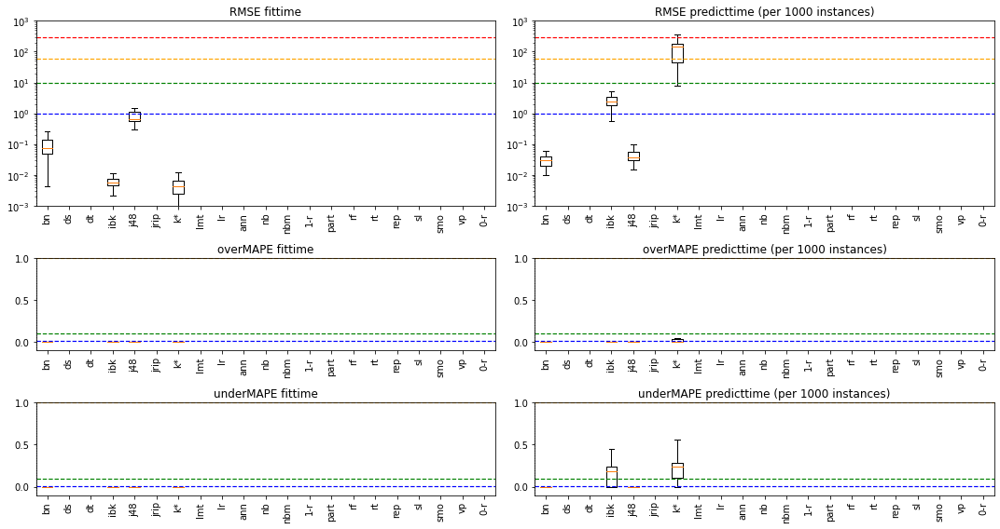

In [535]:
fig, ax = plt.subplots(3,2,figsize=(15,8), gridspec_kw={'height_ratios': [2, 1, 1]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationDefault[dfEvaluationDefault["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        if target == 'predicttime':
            a.set_title(metric + " " + target + " (per 1000 instances)")
        else:
            a.set_title(metric + " " + target)
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.001, 1000])
            a.axhline(1, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(10, color="green", linestyle="--", linewidth="1.2")
            a.axhline(60, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(300, color="red", linestyle="--", linewidth="1.2")
        else:
            #a.set_yscale('log')
            a.set_ylim([-.1, 1])
            a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
            a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-default.pdf")

### Plot the RMSE per dataset

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.


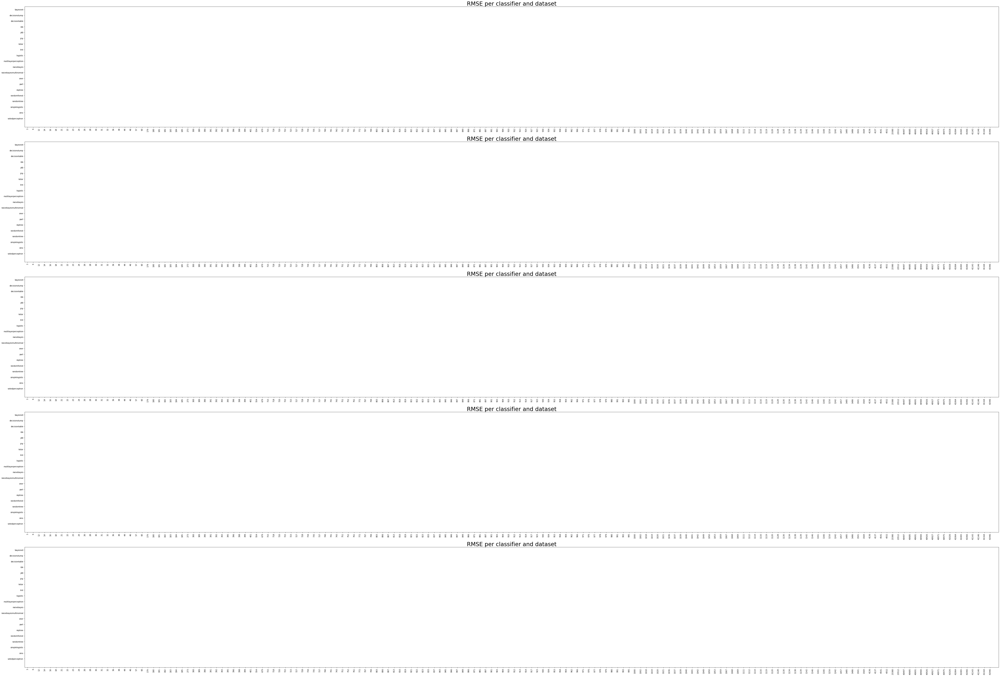

In [117]:
M = np.array([[np.nanmean(dfEvaluationDefault[(dfEvaluationDefault["algorithm"] == a) & (dfEvaluationDefault["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

## 6.2. Performance of Posterior Models (Using true Default-Runtimes)

In [ ]:
pfSuffixPosterior = "-posterior-log-1000"
pfFilePosterior = "data/workdata/runtimepredictions" + pfSuffixPosterior + ".csv"
metricFilePosterior = "data/workdata/runtimepredictions" + pfSuffixPosterior + "_withmetrics.csv"

In [ ]:
def getExtensionOfParametrizedByRuntimesOfDefault(dfParametrized, dfDefault, algo):
    columns = ["openmlid", "totalsize", "fitsize", "applicationsize", "numattributes", "seed", "algorithm", "algorithmoptions", "fittime", "applicationtime", "applicationtimeperunit"]
    dfAlgParametrized = dfParametrized.query("algorithm == '" + algo + "'").merge(dfDefault, on=["openmlid", "algorithm", "seed", "fitsize", "numattributes"], suffixes=("", "_def"))
    if len(dfAlgParametrized) == 0:
        return dfAlgParametrized
    columns.append("fittime_def")
    columns.append("applicationtime_def")
    columnsbeforeExplosion = list(dfAlgParametrized.columns)
    dfAlgParametrized = explodeAlgorithmOptions(dfAlgParametrized)
    algoParams = [x for x in dfAlgParametrized.columns if not x in columnsbeforeExplosion]
    for x in ["searcheroptions", "evaloptions"]:
        if x in algoParams:
            algoParams.remove(x)
    columns.extend(algoParams)
    return dfAlgParametrized[columns]

In [ ]:
trainsizes = [1000]
selectedDatasets = datasets
learners = ["forest"]
expansions = [()]
seeds = range(10)

prevCols = dfConfigured.columns
for algo in algorithms:
    print(algo)
    if len(dfConfigured[dfConfigured["algorithm"] == algo]) > 0:
        dfAlgo = getExtensionOfParametrizedByRuntimesOfDefault(dfConfigured, dfDefault, algo)
        if len(dfAlgo) == 0:
            continue
        selectedAlgorithms = [algo]
        
        fset = ["fitsize", "numattributes", "fittime_def", "applicationtimeperkunits_def"]
        dfAlgo["applicationtimeperkunits_def"] = dfAlgo["applicationtime_def"] / dfAlgo["applicationsize"]
        algoCols = [f for f in dfAlgo if not f in prevCols and not f in fset and not "options" in f]
        fset.extend(algoCols)
        print(fset)
        numExperiments = len(selectedDatasets) * len(selectedAlgorithms) * len(learners) * len(trainsizes) * len(expansions) * len(seeds)
        updateGTPredictionPairSeries(dfAlgo, selectedDatasets, selectedAlgorithms, learners, seeds, trainsizes, [fset], expansions, "full", pfFilePosterior)

In [ ]:
createPredictionErrorFile(pfSuffixPosterior)

In [ ]:
dfEvaluationPosterior = pd.read_csv(metricFilePosterior).query("learner == 'forest' and trainpoints_learner == 1000")[["openmlid", "algorithm", "fittime_RMSE", "predicttime_RMSE", "fittime_overMAPE", "predicttime_overMAPE", "fittime_underMAPE", "predicttime_underMAPE"]]

In [ ]:
dfEvaluationPosterior

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,8), gridspec_kw={'height_ratios': [2, 1, 1]})
for mIndex, metric in enumerate(["RMSE", "overMAPE", "underMAPE"]):
    for tIndex, target in enumerate(["fittime", "predicttime"]):
        a = ax[mIndex][tIndex]
        column = target + "_" + metric
        M = np.array([dfEvaluationPosterior[dfEvaluationPosterior["algorithm"] == a][column].astype(float).dropna() for a in algorithms])
        if target == 'predicttime':
            a.set_title(metric + " " + target + " (per 10000 instances)")
        else:
            a.set_title(metric + " " + target)
        a.boxplot(M, 0, '')
        a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
        
        a.axvline(len(preprocessors) + 0.5, color="black", linestyle="dotted", linewidth=1)
        
        if metric == 'RMSE':
            a.set_yscale('log')
            a.set_ylim([.1, 1000])
            a.axhline(10, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(60, color="green", linestyle="--", linewidth="1.2")
            a.axhline(300, color="orange", linestyle="--", linewidth="1.2")
            a.axhline(600, color="red", linestyle="--", linewidth="1.2")
        else:
            a.set_yscale('log')
            a.set_ylim([.01, 1000])
            a.axhline(0.01, color="blue", linestyle="--", linewidth="1.2")
            a.axhline(0.1, color="green", linestyle="--", linewidth="1.2")
            a.axhline(1, color="orange", linestyle="--", linewidth="1.2")
            
fig.tight_layout()
fig.savefig("plots/predictionresults-posterior.pdf")

In [ ]:
M = np.array([[np.nanmean(dfEvaluationPosterior[(dfEvaluationPosterior["algorithm"] == a) & (dfEvaluationPosterior["openmlid"] == d)]["fittime_RMSE"]) for d in datasets] for a in algorithms])
fig, ax = plt.subplots(5, 1, figsize=(5 * 40, 50))
for i, tol in enumerate([10, 30, 60, 300, 1200]):
    a = ax.ravel()[i]
    im = a.imshow(M, cmap='viridis', vmin=0, vmax=tol)
    a.set_xticks(np.arange(len(datasets) - 1))
    a.set_xticklabels(datasets, rotation=90)
    a.set_yticks(np.arange(len(classifiers) - 1))
    a.set_yticklabels(classifiers)
    a.set_title("RMSE per classifier and dataset", fontsize=30)
fig.tight_layout()
pass

In [ ]:
def getParametrizedAlgoPredictionRMSE(df, algorithm, target):
    datasets = pd.unique(df["openmlid"])

    # partition attributes into basic ones and algorithm specific ones
    XattsBasic = ['fitsize', 'numattributes']
    XattsDefaultBased = ['fittime_def', 'applicationtimeperkinstances_def']
    XattsAlgorithmSpecific = list(df.columns)
    #print(XattsAlgorithmSpecific)
    for f in XattsBasic:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)
    for f in XattsDefaultBased:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)
    for f in ['openmlid', 'algorithm', 'algorithmoptions', 'seed', 'fittime', 'applicationtime', 'applicationtimeperkinstances']:
        #print("Removing " + f)
        XattsAlgorithmSpecific.remove(f)

    # create reduced view only with the attributes potentially relevant for fitting a model
    TARGET = target
    attributesToKeep = ["openmlid", TARGET]
    attributesToKeep.extend(XattsBasic)
    attributesToKeep.extend(XattsAlgorithmSpecific)
    attributesToKeep.extend(XattsDefaultBased)
    dfRed = pd.get_dummies(df[df["algorithm"] == algorithm][attributesToKeep])
    
    # define the result frame
    cDF = pd.DataFrame([], columns=["openmlid", "algorithm", "fitsize", "without", "with", "fittime"])
    withoutCol = list(cDF.columns).index("without")
    
    
    # conduct a loo-cross-evaluation over the different datasets
    pbar = tqdm(total = len(datasets) * 2 * len([50, 100, 200, 1000, 10000, 100000]))    
    for d in datasets:
        trainDF = dfRed.query("openmlid != " + str(d)).drop(columns=["openmlid"])
        testDF = dfRed.query("openmlid == " + str(d))
        if len(trainDF) > 0 and len(testDF) > 0:
            
            # first train a model with and then without the support of knowing the default config
            for mode in ["with", "without"]:
                Xatts = list(trainDF.columns)
                Xatts.remove(TARGET)
                Xatts.remove("totalsize")
                Xatts.remove("applicationsize")
                if mode == "without":
                    for col in XattsDefaultBased:
                        Xatts.remove(col)
                reductionAttributes = Xatts.copy()
                reductionAttributes.append(TARGET)
                trainData = trainDF[reductionAttributes].dropna()
                Xtrain = trainData[Xatts].values
                Ytrain = np.log(trainData[TARGET].values + 0.000001)
                rf = RandomForestRegressor(n_estimators=10)
                rf.fit(np.nan_to_num(Xtrain), Ytrain)

                # do this for three different train point sizes
                #print("Tests available for " + str(pd.unique(testDF[testDF['fittime'].notna()]["fitsize"])))
                for tp in [50, 100, 200, 1000, 10000, 100000]:
                    pbar.update(1)
                    testData = testDF[reductionAttributes].dropna()
                    Xtest = pd.get_dummies(testData.query("fitsize == " + str(tp))[Xatts]).values
                    Ytest = testData.query("fitsize == " + str(tp))[TARGET].values
                    if len(Xtest) == 0:
                        #print("WARN: Cannot test " + algorithm + " on dataset " + str(d) + " with fit size " + str(tp) + ", because no data is available.")
                        continue
                    
                    predictions = np.exp(rf.predict(Xtest)) - 0.000001
                    #print(mode + ": " + str(np.mean(predictions)) + "/" + str(np.mean(Ytest)))
                    #for i, p in enumerate(predictions):
                    #    print(str(p) + "/" + str(Ytest[i]))
                    score = np.sqrt(sk.metrics.mean_squared_error(Ytest, predictions))
                    if mode == "with":
                        cDF.loc[len(cDF)] = [d, algorithm, tp, "", score, np.mean(Ytest)]
                    else:
                        index = cDF.query("openmlid == " + str(d) + " and algorithm == '" + algorithm + "' and fitsize == " + str(tp)).index[0]
                        cDF.at[index,"without"] = score
                    #print("\t" + str(tp) + ": " + str(score) + " (abs average = " + str(np.mean(Ytest)) + ")")
                    #print(len(cDF))
    pbar.close()
    return cDF

In [ ]:
cDF = pd.DataFrame([])
for algo in algorithms:
    file = "data/runtimes/runtimes_" + algo + "_parametrized.csv"
    if path.exists(file):
        dfParametrizedWithDefaultRuntimes = explodeAlgorithmOptions(pd.read_csv(file))
        #cDFInduction = getParametrizedAlgoPredictionRMSE(dfParametrizedWithDefaultRuntimes, algo, "fittime")
        dfParametrizedWithDefaultRuntimes["applicationtimeperkinstances"] = dfParametrizedWithDefaultRuntimes["applicationtime"] / dfParametrizedWithDefaultRuntimes["applicationsize"] * 10000
        dfParametrizedWithDefaultRuntimes["applicationtimeperkinstances_def"] = dfParametrizedWithDefaultRuntimes["applicationtime_def"] / dfParametrizedWithDefaultRuntimes["applicationsize"] * 10000
        cDFInference = getParametrizedAlgoPredictionRMSE(dfParametrizedWithDefaultRuntimes, algo, "applicationtimeperkinstances")
        cDFInference.to_csv("data/workdata/comparison_" + algo + ".csv", index=False)

## 6.3. Create Comparison Plots

In [ ]:
def getErrorRectangle(df, algorithms, datasets, metric):
    rect = np.zeros((len(algorithms), len(datasets)))
    pbar = tqdm(total = rect.size)
    for i, algo in enumerate(algorithms):
        dfAlgo = df[df["algorithm"] == algo]
        for j, d in enumerate(datasets):
            rect[i,j] = np.nanmean(dfAlgo[dfAlgo["openmlid"] == d][metric])
            pbar.update(1)
    pbar.close()
    return rect

comparableAlgorithms = [a for a in algorithms if len(dfConfigured[dfConfigured["algorithm"] == a]) > 0]

rects = {}
pbar = tqdm(total = 2 * 3)
for target in ["fittime", "predicttime"]:
    rects[target] = {}
    arg = target + "_RMSE"
    rects[target]["parametrized"] = getErrorRectangle(dfEvaluationParametrized, comparableAlgorithms, datasets, arg)
    pbar.update(1)
    rects[target]["default"] = getErrorRectangle(dfEvaluationDefault, comparableAlgorithms, datasets, arg)
    pbar.update(1)
    rects[target]["posterior"] = getErrorRectangle(dfEvaluationPosterior, comparableAlgorithms, datasets, arg)
    pbar.update(1)
pbar.close()

In [ ]:
rects["predicttime"]["default"][:,140]

In [ ]:
for modeltype in ["default", "posterior"]:
    
    advInduction = rects["fittime"]["parametrized"] - rects["fittime"][modeltype]
    advInference = rects["predicttime"]["parametrized"] - rects["predicttime"][modeltype]
    
    # advantage of default detailed
    fig, ax = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    bound = 300
    ax[0].imshow(advInduction * -1, cmap="seismic", vmin = -1 * bound, vmax = bound, aspect="auto")
    ax[0].set_yticks(np.arange(len(comparableAlgorithms)))
    ax[0].set_yticklabels(comparableAlgorithms)
    ax[0].set_title("Fittime RMSE - " + modeltype)
    ax[1].imshow(advInference * -1, cmap="seismic", vmin = -1 * bound, vmax = bound, aspect="auto")
    ax[1].set_yticks(np.arange(len(comparableAlgorithms)))
    ax[1].set_yticklabels(comparableAlgorithms)
    ax[1].set_title("Predicttime RMSE - " + modeltype)
    plt.show()

In [ ]:
boundAbs = 60
boundAbsCounts = 5
boundRel = 1
L = [
    ["Def/Abs/Train", "Def/Abs/Pred"],
    ["Def/Cnt/Train", "Def/Cnt/Pred"],
    ["Def/Rel/Train", "Def/Rel/Inf"],
    ["Par/Abs/Ind", "Par/Abs/Inf"],
    ["Par/Cnt/Ind", "Par/Cnt/Inf"],
    ["Par/Rel/Ind", "Par/Rel/Inf"]]
L = [["", l[0], l[1], ""] for l in L]


fig, ax = plt.subplots(6, 1, figsize=(5, 4), sharex = True)
for aIndex, modeltype in enumerate(["default", "posterior"]):
    
    # absolute avg advantages
    absAdvInduction = (rects["fittime"]["parametrized"] - rects["fittime"][modeltype])
    absAdvInductionCounts = absAdvInduction / np.abs(absAdvInduction)
    absAdvInference =  (rects["predicttime"]["parametrized"] - rects["predicttime"][modeltype])
    absAdvInferenceCounts = absAdvInference / np.abs(absAdvInference)
    a = ax[aIndex * 3]
    a.imshow(np.array([
        [sp.stats.trim_mean(absAdvInduction[i][~np.isnan(absAdvInduction[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(absAdvInference[i][~np.isnan(absAdvInference[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundAbs, vmax = boundAbs, aspect="auto")
    a.set_yticks(np.arange(4) -1)
    a.set_yticklabels(L[aIndex * 3])
    
    # absolute counted advantages
    a = ax[aIndex * 3 + 1]
    a.imshow(np.array([
        [sp.stats.trim_mean(absAdvInductionCounts[i][~np.isnan(absAdvInductionCounts[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(absAdvInferenceCounts[i][~np.isnan(absAdvInferenceCounts[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundAbsCounts, vmax = boundAbsCounts, aspect="auto")
    a.set_yticks(np.arange(4) -1)
    a.set_yticklabels(L[aIndex * 3 + 1])
    
    # relateive advantages
    a = ax[aIndex * 3 + 2]
    relAdvInduction = (rects["fittime"]["parametrized"] >= 10) * absAdvInduction / rects["fittime"]["parametrized"]
    relAdvInductionCounts = relAdvInduction / np.abs(relAdvInduction)
    relAdvInference = (rects["predicttime"]["parametrized"] >= 10) * absAdvInference / rects["predicttime"]["parametrized"]
    relAdvInferenceCounts = relAdvInference / np.abs(relAdvInference)
    #analysisIndex = 6
    #for i in range(len(relAdvInference[analysisIndex])):
    #    print(str(rects["predicttime"]["parametrized"][analysisIndex][i]) + " -> " + str(rects["predicttime"][modeltype][analysisIndex][i]) + ": " + str(absAdvInference[analysisIndex][i]) + "/" + str(relAdvInference[analysisIndex][i]))
    #print(np.nanmean(absAdvInference[analysisIndex]))
    #print(np.nanmean(relAdvInference[analysisIndex]))
    a.imshow(np.array([
        [sp.stats.trim_mean(relAdvInduction[i][~np.isnan(relAdvInduction[i])], 0.05) for i in range(len(comparableAlgorithms))],
        [sp.stats.trim_mean(relAdvInference[i][~np.isnan(relAdvInference[i])], 0.05) for i in range(len(comparableAlgorithms))]
    ]) * -1, cmap="seismic", vmin = -1 * boundRel, vmax = boundRel, aspect="auto")
    a.set_yticks(np.arange(4) - 1)
    a.set_yticklabels(L[aIndex * 3 + 2])

ax[5].set_xticks(np.arange(len(comparableAlgorithms)))
ax[5].set_xticklabels([algorithmshortcuts[a] for a in comparableAlgorithms], rotation=90)
fig.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)
fig.savefig("plots/modeladvantages.pdf")
plt.show()
    
    

[i:-10] : temp(i) >= temp(i-1) -> p = 0.5
[i:-10] : temp(i) >= temp(i-1) & temp(t) > 40 & tos(t) = fuerte -> p = 0.9

## 7. Critical over- and understimations of the predictor
Idea:
* Even large absolute prediction failures are **ok** if both prediction and true runtime are substantially beyond the timeout.
* Prediction failures are a **problem** if the timeout is between prediction and true timeout

We should check the timeout is between prediction and truth when
* the absolute error is large
* the absolute error is small 

## 7.1 Create plots for the Paper

In [ ]:
timeouts = [0.5, 1, 2, 5, 10, 15, 20, 30]
TP = np.zeros((len(timeouts), len(algorithms)))
FP = np.zeros((len(timeouts), len(algorithms)))
TN = np.zeros((len(timeouts), len(algorithms)))
FN = np.zeros((len(timeouts), len(algorithms)))
decisionsPos = np.zeros((len(timeouts), len(algorithms)))
decisionsNeg = np.zeros((len(timeouts), len(algorithms)))
dfPredictions = pd.read_csv(pfFileParametrized).query("learner == 'forest' and trainpoints_learner == 1000")
#dfPredictions = dfPredictions[dfPredictions["trainpoints_algorithm"].notnull()].astype({"trainpoints_algorithm"})

cautionFactor = 1

for j, a in tqdm(enumerate(algorithms)):
    dfAlgo = dfPredictions[dfPredictions["algorithm"] == a]
    print(a)
    for gIndex, group in dfAlgo.groupby(["openmlid", "seed", "trainpoints_algorithm"]):
        if gIndex[2] != "full" and int(gIndex[2]) <= 100:
            continue
        if len(group) == 4:
            trueInductionTimes = np.array(group.query("recordtype == 'traintime_gt'")["entries"].values[0].split(";")).astype(float)
            trueInferenceTimes = np.array(group.query("recordtype == 'predictiontime_gt'")["entries"].values[0].split(";")).astype(float)
            predInductionTimes = np.array(group.query("recordtype == 'traintime_pr'")["entries"].values[0].split(";")).astype(float)
            predInferenceTimes = np.array(group.query("recordtype == 'predictiontime_pr'")["entries"].values[0].split(";")).astype(float)
            if len(trueInductionTimes) != len(trueInferenceTimes):
                continue
            trueRuntimes = trueInductionTimes + trueInferenceTimes
            predRuntimes = predInductionTimes + predInferenceTimes
            for i, to in enumerate(np.array(timeouts) * 60):
                trueTimeouts = trueRuntimes > to
                predTimeouts = predRuntimes * cautionFactor > to
                for k in range(len(trueTimeouts)):
                    if predTimeouts[k]:
                        decisionsPos[i,j] += 1
                        correct = trueTimeouts[k]
                        print("Predicting timeout " + ("correctly" if correct else "incorrectly") + " for to " + str(to) + " (" + str(predRuntimes[k]) + "/" + str(trueRuntimes[k]) + ")")
                        if correct:
                            TP[i,j] += 1
                        else:
                            FP[i,j] += 1
                    else:
                        decisionsNeg[i,j] += 1
                        correct = not trueTimeouts[k]
                        if correct:
                            TN[i,j] += 1
                        else:
                            FN[i,j] += 1

In [ ]:
np.mean(TP, axis=0)

### Number of Decisions

In [ ]:
selectedTimeouts = [timeouts[i] for i in [1, 3, 5, 7]]
fig, ax = plt.subplots(1, 1, figsize=(6, 1.5))
a = ax
ind = np.arange(len(algorithms)) * 2
width = 0.4
for i in range(len(decisionsPos[[1, 3, 5, 7], :])):
    a.bar(ind + width * i, decisionsPos[i], width=width, label=str(selectedTimeouts[i]) + " minute" + ("s" if selectedTimeouts[i] > 1 else ""))
#a.legend()
a.set_yscale("log")
a.set_yticks([10, 100, 1000, 10000])
a.set_xticks(np.arange(len(algorithms)) * 2)
a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
#a.invert_yaxis()
handles, labels = a.get_legend_handles_labels()
lgd = fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.525, 1.08),ncol=4)
fig.tight_layout()
fig.savefig("plots/atomicalgorithmclassifications-quantity.pdf", bbox_extra_artists=(lgd,), bbox_inches='tight')

### Goodness of the Decisions

In [ ]:

fig, ax = plt.subplots(4, 1, figsize=(6, 4), sharex=True)
fig.subplots_adjust(hspace=0.1)
#for j, target in enumerate(["fittime", "applicationtime"]):
for i, metric in enumerate(["tp", "fp", "tn", "fn"]):
    a = ax[i]
    if metric == "tp":
        M = TP
    if metric == "fp":
        M = FP
    if metric == "tn":
        M = TN
    if metric == "fn":
        M = FN
    cmap = "Reds" if "f" in metric else "Greens"
    MS = M / (decisionsPos if "p" in metric else decisionsNeg)
    a.imshow(MS, cmap=cmap, aspect="auto", vmax=1)
    a.set_yticks(range(0, len(timeouts), 2))
    a.set_yticklabels([t for i, t in enumerate(timeouts) if i %2 == 1])
    #if i == 3:
    a.set_xticks(range(len(algorithms)))
    a.set_xticklabels([algorithmshortcuts[a] for a in algorithms], rotation=90)
    #else:
    #    a.set_xticklabels([])
    #    a.set_xticks([])
fig.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0.2)
fig.savefig("plots/atomicalgorithmclassifications-goodness.pdf")